In [ ]:
%%bash

pip install gymnasium
pip install pytorch-model-summary

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 953.9/953.9 kB 4.8 MB/s eta 0:00:00


In [ ]:
from gymnasium import Env
from gymnasium.spaces import Box

In [ ]:
import torch.nn as nn
import torch.optim as optim
import torch

In [ ]:
from typing import List
from pytorch_model_summary import summary
from scipy.integrate import odeint
import numpy as np
import plotly.graph_objs as go
from IPython.display import display, clear_output
import warnings
import matplotlib.pyplot as plt
from math import pow, exp
import random
from datetime import datetime
from statistics import mean

In [ ]:
class Constants:
    def __init__(self):
        self.I = 0.054
        self.X = 0.0067
        self.G = 120.0
        self.t = 0.0
        self.h = 1.0

        self.p1 = 0.0337
        self.p2 = 0.0209
        self.p3 = 7.5 * pow(10, -6)
        self.tau = 0.083333
        self.n = 0.214
        self.Gb = 144.0

        self.u = 0.054

        self.Ag = 0.8
        self.tmax_I = 33.0
        self.tmax_G = 24.0
        self.Vg = 13.79

        self.MAX_TIME = 1440
        self.MAX_INSULIN = 50
        self.INSULIN_PUMP_RATE = 15 #min
        self.MAX_OVERSHOOT_CONS = 20

    def __str__(self):
        return f"Constants(I={self.I}, X={self.X}, G={self.G}, t={self.t}, h={self.h}, p1={self.p1}, p2={self.p2}, p3={self.p3}, tau={self.tau}, n={self.n}, Gb={self.Gb}, u={self.u}, Ag={self.Ag}, tmax_I={self.tmax_I}, tmax_G={self.tmax_G}, Vg={self.Vg}, MAX_TIME={self.MAX_TIME}, MAX_INSULIN={self.MAX_INSULIN}, INSULIN_PUMP_RATE={self.INSULIN_PUMP_RATE})"

    def add_randomness(self, value):
        percentage_change = random.uniform(-0.2, 0.2)  # Generates a random percentage change between -20% and +20%
        random_value = value + (value * percentage_change)
        return random_value

    def randomise_constants(self):
        self.I = self.add_randomness(0.054)
        self.X = self.add_randomness(0.0067)
        self.G = self.add_randomness(120.0)

        self.p1 = self.add_randomness(0.0337)
        self.p2 = self.add_randomness(0.0209)
        self.p3 = self.add_randomness(7.5 * pow(10, -6))
        self.tau = self.add_randomness(0.083333)
        self.n = self.add_randomness(0.214)
        self.Gb = self.add_randomness(144.0)

        self.u = self.add_randomness(0.054)

        self.Ag = self.add_randomness(0.8)
        self.tmax_I = self.add_randomness(33.0)
        self.tmax_G = self.add_randomness(24.0)
        self.Vg = self.add_randomness(13.79)

In [ ]:
class Bergman(Env):
    def __init__(self, params: Constants, max_meals: int = 3):
        self.params = params
        self.timing = []
        self.dg = []
        self.max_meals = max_meals
        self.__meal_info__()
        self.__min2time__()

        self.basal_glucose = params.G
        self.G = self.basal_glucose
        self.X = params.X
        self.I = params.I
        self.simulation_time = params.MAX_TIME
        self.cur_time = 0
        self.MAX_OPTIMUM_GLUCOSE, self.MIN_OPTIMUM_GLUCOSE = 180, 80
        self.action_space = Box(low=np.array([0]), high= np.array([params.MAX_INSULIN]))
        self.observation_space = Box(low=np.array([0, 0, 0]), high= np.array([1000, 50, 1]))
        self.g_graph_list = []
        self.i_graph_list = []
        self.x_graph_list = []
        self.t_graph_list = []
        self.last_action = [0]
        self.data_points_t = []
        self.data_points = []
        self.overshoot_glucose_time = 0
        self.MAX_OVERSHOOT_CONS = params.MAX_OVERSHOOT_CONS


    def reset(self):
        self.cur_time = 0
        self.G = self.basal_glucose
        self.X = self.params.X
        self.I = self.params.I

        self.g_graph_list = []
        self.i_graph_list = []
        self.x_graph_list = []
        self.t_graph_list = []
        self.last_action = [0]
        self.data_points = []
        self.data_points_t = []
        self.overshoot_glucose_time = 0
        self.params.randomise_constants()
        self.__meal_info__()
        print(self.__min2time__())

        return (self.G, self.I, self.X)


    def step(self, action):
        overshoot = True
        if self.cur_time % self.params.INSULIN_PUMP_RATE != 0:  # get insulin reading every INSULIN_PUMP_RATE min
            action = self.last_action
        else:
            self.last_action = action
        self.G = self.solve_diff_eqn(action)
        rew = self.reward(self.G) - self.G * action[0]

        self.cur_time += 1
        if not (60 <= self.G <= 600):
            self.overshoot_glucose_time += 1

        if  self.cur_time <= self.simulation_time and self.overshoot_glucose_time < self.MAX_OVERSHOOT_CONS:
                terminate = False
        else:
            terminate = True
        # Return observation, reward, done status, and info
        return np.array([self.G, self.I, self.X]), rew, terminate, {}

    def render(self, mode='human'):
        pass

    def reward(self, glucose):
        if 60 <= glucose <= 600:
            return (-(glucose - 130)**2) + 1   # Most suitable glucose value --> 130
        return -10e10

    def __meal_info__(self):
        self.timing = []
        self.dg = []
        for i in range(random.randint(2, self.max_meals)):
            self.timing.append(random.randint(0, 1440))
            self.dg.append(random.randint(10, 120))
        self.timing.sort()
        self.timing.append(9999)
        self.dg.append(9999)


    def calc_glucose(self, y, t, action):
        G, X, I = self.G, self.X, self.I
        G = -1 * (self.params.p1 + X) * G + self.params.p1 * self.params.Gb + self.__meal_function__(t)
        X = -1 * (self.params.p2 * X) + (self.params.p3 * I)
        I = -1 * (self.params.n * I) + self.params.tau * action[0]
        return [G, I, X]

    def solve_diff_eqn(self, action):
        t_points = np.arange(self.cur_time -1 , self.cur_time+1, self.params.h)
        t_points[t_points < 0 ] = 0
        y= [self.G, self.I, self.X]
        solution = odeint(self.calc_glucose, y, t_points,
                          args=(action,))
        self.G, self.I, self.X = solution.T[0][-1], solution.T[1][-1], solution.T[2][-1]
        self.g_graph_list.append(self.G)
        self.i_graph_list.append(action[0])
        self.x_graph_list.append(self.X)
        self.t_graph_list.append(self.cur_time)
        if (self.G not in self.data_points and self.cur_time % self.params.INSULIN_PUMP_RATE == 0):  # Ask Ma'am
            self.data_points_t.append(self.cur_time)
            self.data_points.append(self.G)
        # print(f'Time: {self.cur_time} | Glucose: {self.G} | Insulin: {self.I} | Effective:{self.X} | Action: {action}')
        return self.G

    def __meal_function__(self, t):
        m = 0
        for i in range(len(self.dg)):
            if i < len(self.dg) - 1 and t >= self.timing[i] and t < self.timing[i + 1]:
                t = t - self.timing[i]
                m = (100 * self.dg[i] * self.params.Ag * t * exp(-t / self.params.tmax_I)) / (self.params.Vg * (pow(self.params.tmax_G, 2)))
        return m

    def __min2time__(self):
        out = ""
        for t in range(len(self.timing[:-1])):
            hour = self.timing[t]//60
            minu = self.timing[t] - (60*hour)
            if minu < 10:
                minu = "0" + str(minu)
            out += f"{self.timing[t]} -> {hour}:{minu} ({self.dg[t]}g Carbs)\n"
        return out


In [ ]:
# c = Constants()
# env = Bergman(params=c)
# episodes = 1
# for episode in range(1, episodes+1):
#     state = env.reset()
#     done = False
#     score = 0
#     while not done:
#         action = env.action_space.sample()
#         n_state, reward, done, info = env.step(action)
#         score+=reward
#     plt.plot(env.t_graph_list, env.g_graph_list, color='blue', label="Glucose Plot")
#     plt.scatter(env.data_points_t, env.data_points, color = 'red', label='Data Points for Insulin')
#     plt.xlabel('Time (min)')
#     plt.axhline(max(env.g_graph_list), color = 'black', label=f"Max Glucose ({round(max(env.g_graph_list), 2)})")
#     plt.ylabel('Glucose Values (mg/dl)')
#     plt.legend()
#     plt.title(f"Episode {episode} | Score: {round(score, 3)}")
#     plt.show()

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cpu')

In [ ]:
c = Constants()
env = Bergman(params=c, max_meals=5)

In [ ]:
input_size = env.observation_space.shape[0]
output_size = env.action_space.shape[0]
print(input_size, output_size)

3 1


In [ ]:
def train_env(model, episodes: int = 1_000, show_work: int = 100, artif_epoch: int = 25):
    people_dead = 0
    people_dead_global = 0
    reward_plot = []
    episode_count = []
    for episode in range(1, episodes+1):
        state = env.reset()
        done = False
        score = 0
        states_travel = 0
        episode_count.append(episode)
        while not done:
            state_tensor = torch.tensor(state, dtype=torch.float32).to(device)
            state_tensor = state_tensor.unsqueeze(0)
            action = model(state_tensor)
            # print(f"TL: {action}")
            n_state, reward, done, info = env.step([action.item()])
            n_state_tensor = torch.tensor(n_state, dtype=torch.float32).to(device).unsqueeze(0)
            reward_tensor = torch.tensor(reward, dtype=torch.float64, requires_grad=True).unsqueeze(0).to(device)
            ideal = torch.tensor([300], dtype=torch.float64).to(device)
            loss = loss_function(reward_tensor, ideal)
            score += loss
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            state = n_state
            states_travel += 1
        reward_plot.append(loss.item())
        print(f"Episode: {episode} | Score (H<): {score.item():,} | Max Time: {states_travel} | Max Glucose Level: {round(max(env.g_graph_list),3)} | Avg Insulin Given: {round(mean(env.i_graph_list), 5)} | Carb / Insulin: {round(sum(env.dg)/(sum(env.i_graph_list)+1),3)}")
        if (len(env.g_graph_list)) != 1441:
            people_dead += 1
            people_dead_global += 1
        if episode % show_work == 0:
            plt.plot(env.t_graph_list, env.g_graph_list, color='blue', label="Glucose Plot")
            plt.scatter(env.data_points_t, env.data_points, color = 'red', label='Data Points for Insulin')
            plt.xlabel('Time (min)')
            plt.axhline(max(env.g_graph_list), color = 'black', label=f"Max Glucose ({round(max(env.g_graph_list), 2)})")
            plt.ylabel('Glucose Values (mg/dl)')
            plt.legend()
            plt.title(f"Episode {episode} | Total Episode Loss: {round(score.item(), 3):,}")
            plt.show()

            plt.plot(env.t_graph_list, env.i_graph_list, color='blue', label="Insulin Plot")
            plt.xlabel('Time (min)')
            plt.axhline(max(env.i_graph_list), color = 'black', label=f"Max Insulin ({round(max(env.i_graph_list), 8)})")
            plt.ylabel('Insulin Values (uUnit)')
            plt.legend()
            plt.title(f"Episode {episode} | Insulin Plot")
            plt.show()

            filtered_reward_plot = []
            filtered_episode_count = []
            for episode_value, reward_value in zip(episode_count, reward_plot):
              if reward_value < 10**20:
                filtered_reward_plot.append(reward_value)
                filtered_episode_count.append(episode_value)
            reward_plot = filtered_reward_plot
            for i in range(len(reward_plot)):
              reward_plot[i] = 1/(reward_plot[i]+1)
            episode_count = filtered_episode_count
            plt.plot(episode_count,reward_plot, color='blue', label="Reward")
            plt.xlabel('Episodes')
            plt.ylabel('Reward')
            plt.legend()
            plt.title("Rewards v/s episodes")
            plt.show()
        if episode % artif_epoch == 0:
            pass # run a predefined test_case (Need to make modifications to env to handle this)
            print(f"*** Epoch {people_dead} Terminal Cases ***")
            print(f"*** Total {people_dead_global} Terminal Cases ***")
            people_dead = 0

    torch.save(model.state_dict(), f'{model.__class__.__name__}_{int(datetime.now().timestamp())}_{episodes}.pth')


In [ ]:
class NeuralNetwork_v0(nn.Module):
    def __init__(self, input_size, output_size):
        super(NeuralNetwork_v0, self).__init__()
        self.l1 = nn.Linear(input_size, input_size*2)
        self.fc = nn.Linear(input_size*2, output_size)
        self.relu = nn.ReLU()

    def forward(self, x):
        x = self.l1(x)
        # print(f"At L1: {x}")
        x = self.relu(x)
        # print(f"At LeRU: {x}")
        x = self.fc(x)
        # print(f"At L2: {x}")
        x = torch.clamp(torch.abs(x), min=0, max=50)
        # print(f"At C1: {x}")
        return x

In [ ]:
model = NeuralNetwork_v0(input_size, output_size).to(device)
optimizer = optim.Adam(model.parameters(), lr=0.01)
loss_function = nn.MSELoss()

555 -> 9:15 (62g Carbs)
1009 -> 16:49 (72g Carbs)

Episode: 1 | Score (H<): 3,912,183,703,557.229 | Max Time: 1441 | Max Glucose Level: 560.742 | Avg Insulin Given: 14.11949 | Carb / Insulin: 0.498
924 -> 15:24 (66g Carbs)
1063 -> 17:43 (17g Carbs)
1349 -> 22:29 (25g Carbs)

Episode: 2 | Score (H<): 56,807,111,220.0755 | Max Time: 1441 | Max Glucose Level: 288.309 | Avg Insulin Given: 9.51026 | Carb / Insulin: 0.737


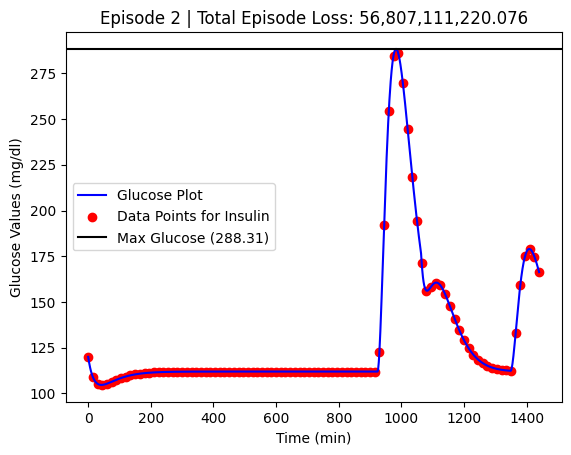

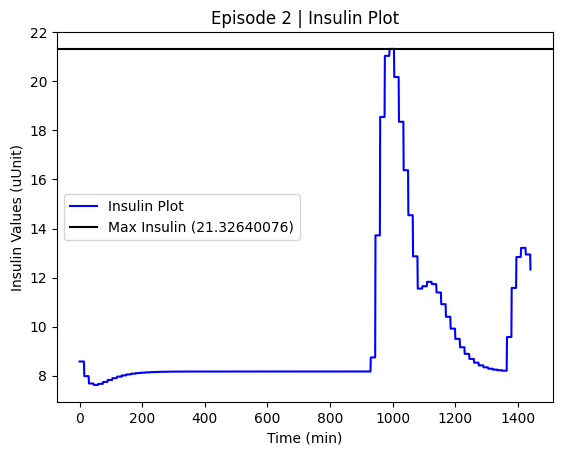

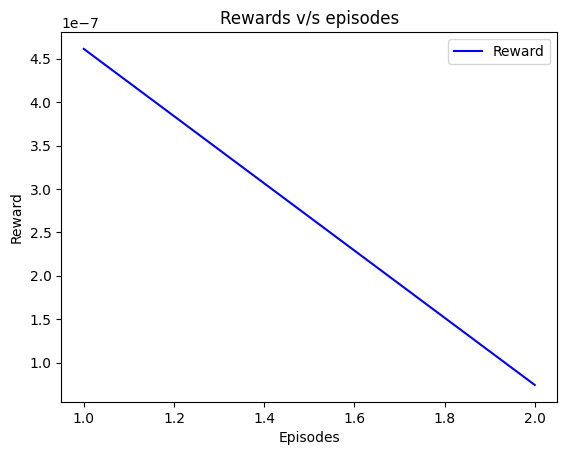

507 -> 8:27 (113g Carbs)
1114 -> 18:34 (21g Carbs)
1177 -> 19:37 (110g Carbs)
1334 -> 22:14 (34g Carbs)
1350 -> 22:30 (45g Carbs)

Episode: 3 | Score (H<): 2,920,131,003,954.8345 | Max Time: 1441 | Max Glucose Level: 514.508 | Avg Insulin Given: 15.52969 | Carb / Insulin: 0.461
107 -> 1:47 (67g Carbs)
319 -> 5:19 (48g Carbs)
1253 -> 20:53 (35g Carbs)

Episode: 4 | Score (H<): 399,921,659,365.88727 | Max Time: 1441 | Max Glucose Level: 378.347 | Avg Insulin Given: 12.38441 | Carb / Insulin: 0.569


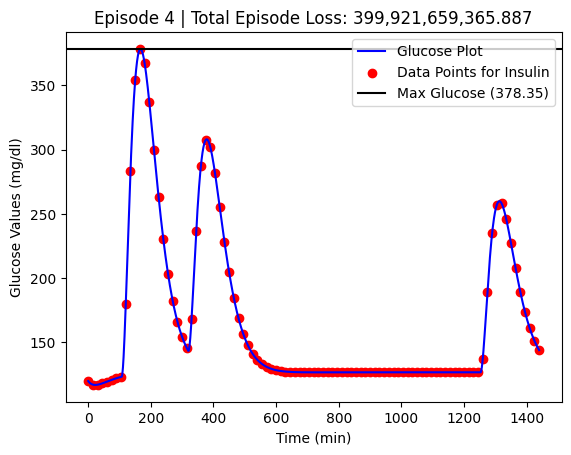

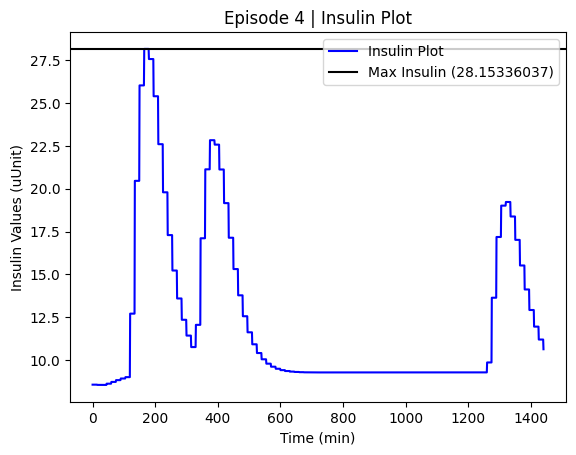

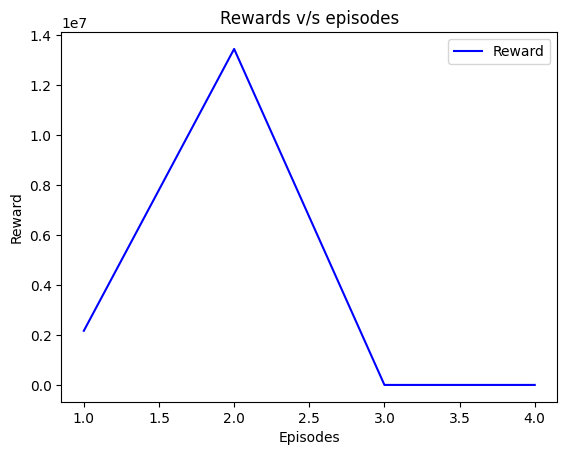

351 -> 5:51 (92g Carbs)
815 -> 13:35 (76g Carbs)

Episode: 5 | Score (H<): 119,454,956,044.0075 | Max Time: 1441 | Max Glucose Level: 300.522 | Avg Insulin Given: 12.67922 | Carb / Insulin: 0.556
16 -> 0:16 (64g Carbs)
600 -> 10:00 (71g Carbs)
849 -> 14:09 (104g Carbs)

Episode: 6 | Score (H<): 738,462,118,840.0751 | Max Time: 1441 | Max Glucose Level: 408.937 | Avg Insulin Given: 14.71541 | Carb / Insulin: 0.483


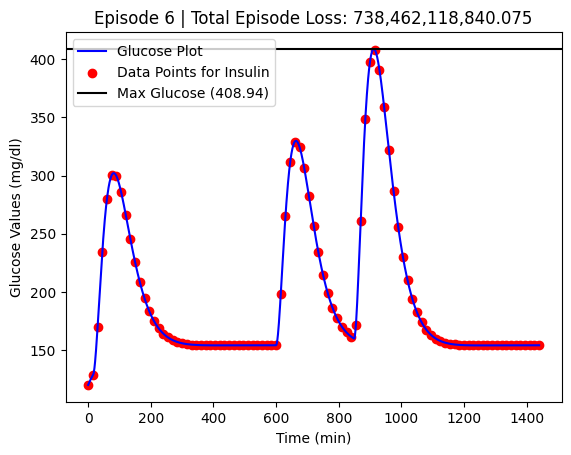

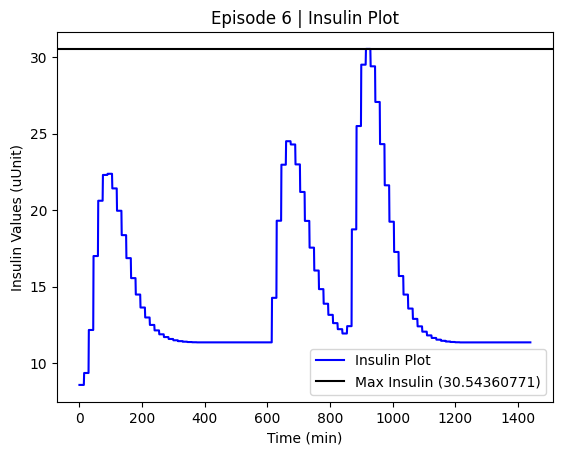

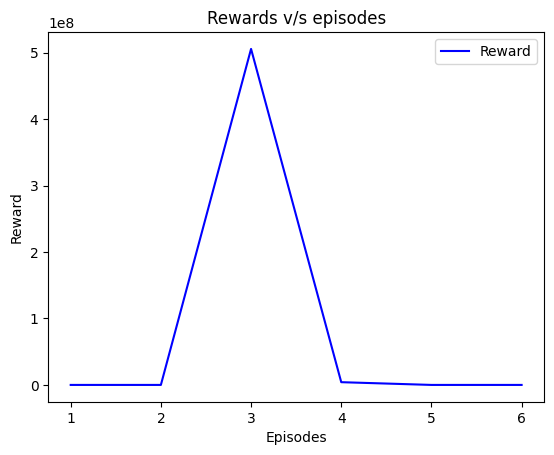

534 -> 8:54 (29g Carbs)
651 -> 10:51 (27g Carbs)
902 -> 15:02 (60g Carbs)

Episode: 7 | Score (H<): 80,264,178,578.79233 | Max Time: 1441 | Max Glucose Level: 300.923 | Avg Insulin Given: 10.9496 | Carb / Insulin: 0.641
222 -> 3:42 (22g Carbs)
711 -> 11:51 (31g Carbs)
1304 -> 21:44 (82g Carbs)
1343 -> 22:23 (48g Carbs)
1402 -> 23:22 (83g Carbs)

Episode: 8 | Score (H<): 252,520,262,449.72876 | Max Time: 1441 | Max Glucose Level: 387.073 | Avg Insulin Given: 12.15328 | Carb / Insulin: 0.586


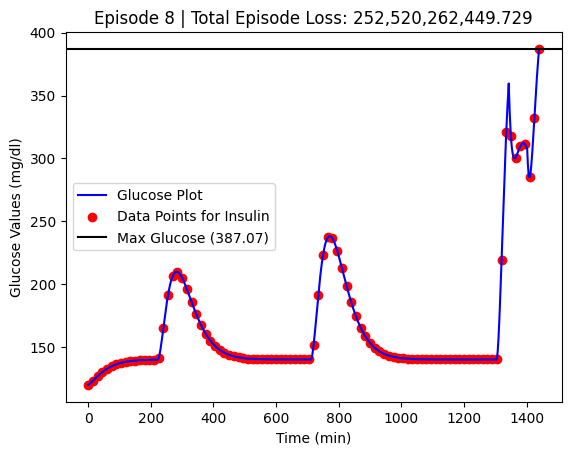

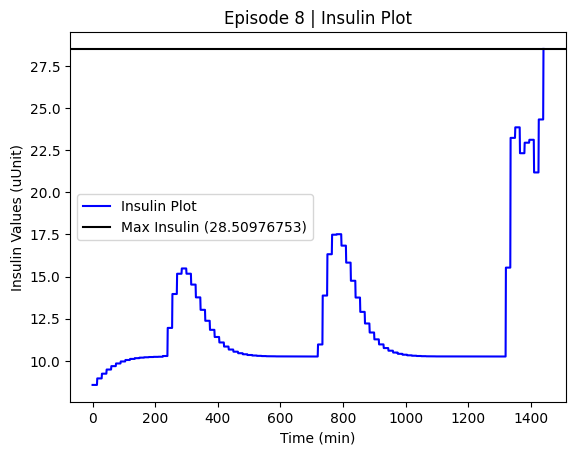

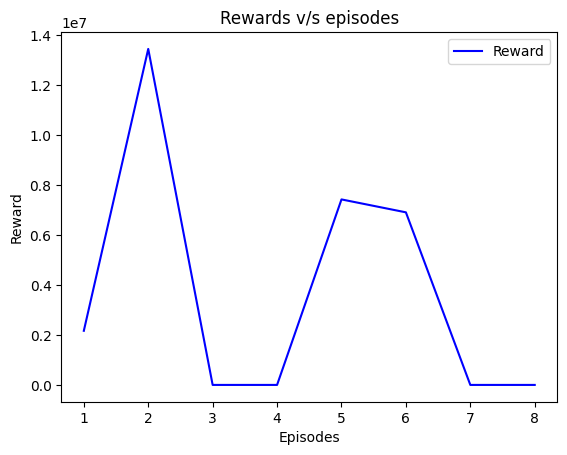

172 -> 2:52 (30g Carbs)
426 -> 7:06 (22g Carbs)
582 -> 9:42 (50g Carbs)
1070 -> 17:50 (104g Carbs)
1323 -> 22:03 (117g Carbs)

Episode: 9 | Score (H<): 2,624,966,698,944.5513 | Max Time: 1441 | Max Glucose Level: 525.034 | Avg Insulin Given: 13.97007 | Carb / Insulin: 0.513
518 -> 8:38 (47g Carbs)
903 -> 15:03 (110g Carbs)
1137 -> 18:57 (92g Carbs)

Episode: 10 | Score (H<): 1,085,975,479,334.4376 | Max Time: 1441 | Max Glucose Level: 444.769 | Avg Insulin Given: 13.75117 | Carb / Insulin: 0.517


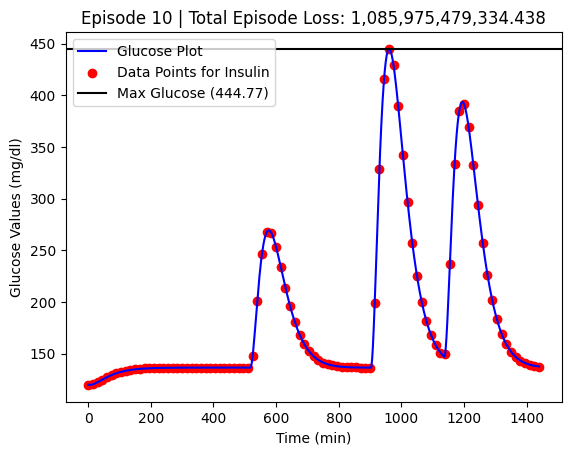

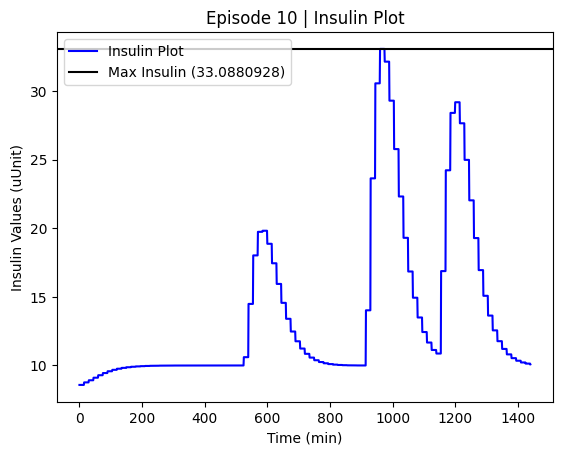

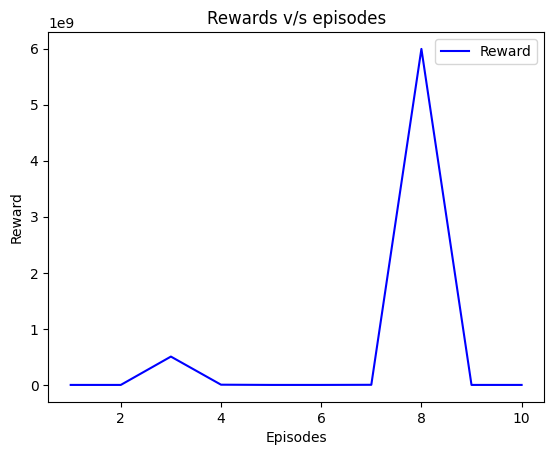

*** Epoch 0 Terminal Cases ***
*** Total 0 Terminal Cases ***


In [ ]:
train_env(model, episodes = 10, show_work = 2, artif_epoch = 10)

In [ ]:
class NeuralNetwork_v1(nn.Module):
    def __init__(self, input_size: int = 3, output: int = 1):
        super(NeuralNetwork_v1, self).__init__()
        self.lstm = nn.LSTM(input_size, 128, num_layers=3)
        self.hidden = nn.Linear(128, 64)
        self.hidden2 = nn.Linear(64, 8)
        self.fc = nn.Linear(8, output)
        self.relu = nn.ReLU()

    def forward(self, x):
        lstm_out, _ = self.lstm(x)
        x = lstm_out.squeeze(0)  # Extract the output from the last time step
        x = self.hidden(x)
        x = self.relu(x)
        x = self.hidden2(x)
        x = self.relu(x)
        x = self.fc(x)
        return torch.clamp(x, min=0, max=50)


In [ ]:
model = NeuralNetwork_v1(input_size, output_size).to(device)
optimizer = optim.SGD(model.parameters(), lr=0.001)
loss_function = nn.MSELoss()

In [ ]:
train_env(model, episodes = 100, show_work = 50, artif_epoch = 10)

In [ ]:
class NeuralNetwork_v2(nn.Module):
    def __init__(self, input_size, output_size):
        super(NeuralNetwork_v2, self).__init__()
        self.l1 = nn.Linear(input_size, 100)
        self.l2 = nn.Linear(100, 200)
        self.fc = nn.Linear(200, output_size)
        self.relu = nn.ReLU()

    def forward(self, x):
        x = self.l1(x)
        x = self.relu(x)
        x = self.l2(x)
        x = self.relu(x)
        x = self.fc(x)
        x = torch.clamp(x, min=0, max=50)
        # print(f"At C1: {x}")
        return x

In [ ]:
model = NeuralNetwork_v2(input_size, output_size).to(device)
optimizer = optim.RMSprop(model.parameters(), lr=0.001)
loss_function = nn.CrossEntropyLoss()

In [ ]:
print(summary(model, torch.Tensor([1,2,3]).to(device), show_input=True))

-----------------------------------------------------------------------
      Layer (type)         Input Shape         Param #     Tr. Param #
          Linear-1                 [3]             400             400
            ReLU-2               [100]               0               0
          Linear-3               [100]          20,200          20,200
          Linear-4               [200]             201             201
Total params: 20,801
Trainable params: 20,801
Non-trainable params: 0
-----------------------------------------------------------------------


99 -> 1:39 (56g Carbs)
463 -> 7:43 (28g Carbs)
909 -> 15:09 (14g Carbs)
1147 -> 19:07 (84g Carbs)

Episode: 1 | Score (H<): 0.0 | Max Time: 1441 | Max Glucose Level: 462.141 | Avg Insulin Given: 12.91273 | Carb / Insulin: 0.547
10 -> 0:10 (35g Carbs)
118 -> 1:58 (117g Carbs)
831 -> 13:51 (18g Carbs)
991 -> 16:31 (70g Carbs)

Episode: 2 | Score (H<): 0.0 | Max Time: 1441 | Max Glucose Level: 346.554 | Avg Insulin Given: 11.88313 | Carb / Insulin: 0.598
351 -> 5:51 (110g Carbs)
775 -> 12:55 (29g Carbs)
777 -> 12:57 (107g Carbs)
1193 -> 19:53 (66g Carbs)
1260 -> 21:00 (118g Carbs)

Episode: 3 | Score (H<): 0.0 | Max Time: 1441 | Max Glucose Level: 560.315 | Avg Insulin Given: 16.22793 | Carb / Insulin: 0.446
276 -> 4:36 (28g Carbs)
362 -> 6:02 (44g Carbs)
509 -> 8:29 (117g Carbs)

Episode: 4 | Score (H<): 0.0 | Max Time: 1441 | Max Glucose Level: 407.347 | Avg Insulin Given: 11.34169 | Carb / Insulin: 0.623
437 -> 7:17 (112g Carbs)
1030 -> 17:10 (52g Carbs)

Episode: 5 | Score (H<): 0.0 |

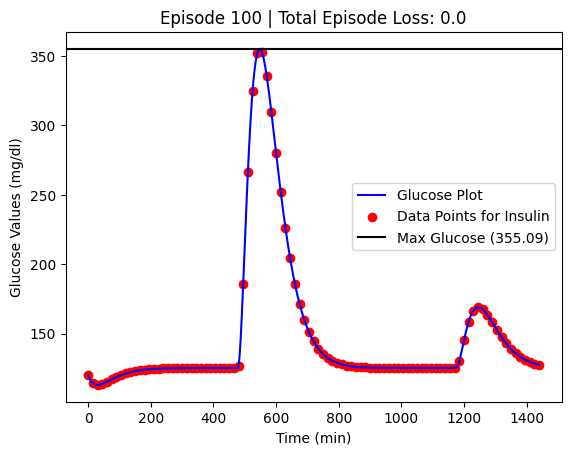

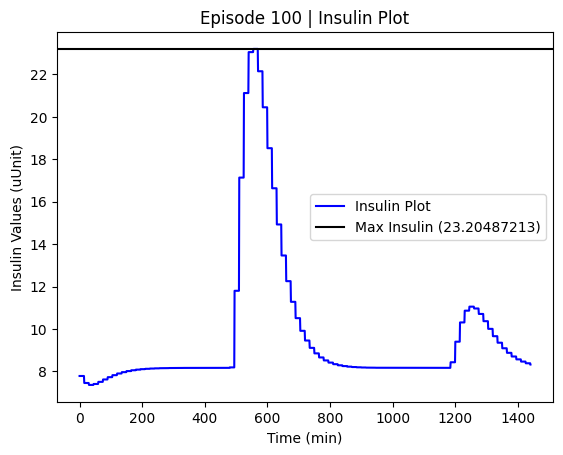

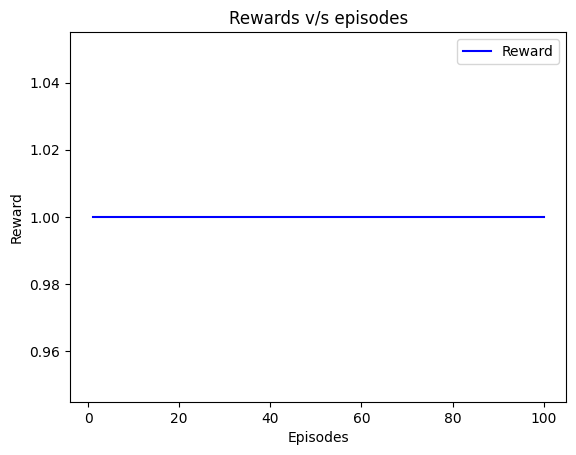

*** Epoch 4 Terminal Cases ***
*** Total 4 Terminal Cases ***
15 -> 0:15 (26g Carbs)
426 -> 7:06 (76g Carbs)
931 -> 15:31 (29g Carbs)
1126 -> 18:46 (32g Carbs)

Episode: 101 | Score (H<): 0.0 | Max Time: 1441 | Max Glucose Level: 278.771 | Avg Insulin Given: 10.58386 | Carb / Insulin: 0.666
281 -> 4:41 (33g Carbs)
349 -> 5:49 (91g Carbs)
847 -> 14:07 (42g Carbs)
1252 -> 20:52 (52g Carbs)
1298 -> 21:38 (48g Carbs)

Episode: 102 | Score (H<): 0.0 | Max Time: 1441 | Max Glucose Level: 449.181 | Avg Insulin Given: 11.7962 | Carb / Insulin: 0.604
314 -> 5:14 (104g Carbs)
427 -> 7:07 (107g Carbs)
663 -> 11:03 (115g Carbs)
686 -> 11:26 (11g Carbs)

Episode: 103 | Score (H<): 0.0 | Max Time: 1441 | Max Glucose Level: 387.395 | Avg Insulin Given: 11.5934 | Carb / Insulin: 0.619
590 -> 9:50 (25g Carbs)
966 -> 16:06 (116g Carbs)

Episode: 104 | Score (H<): 0.0 | Max Time: 1441 | Max Glucose Level: 343.851 | Avg Insulin Given: 9.22871 | Carb / Insulin: 0.762
83 -> 1:23 (19g Carbs)
170 -> 2:50 (109

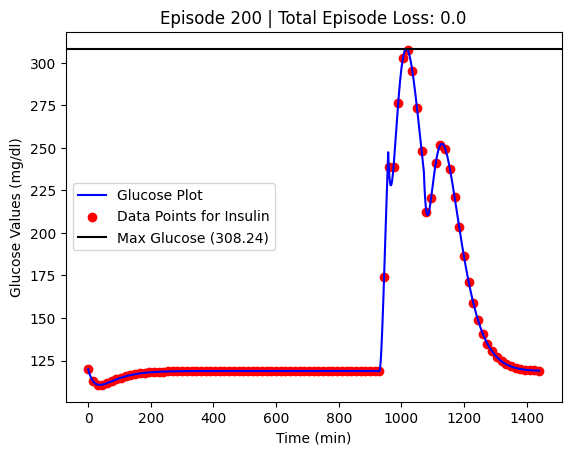

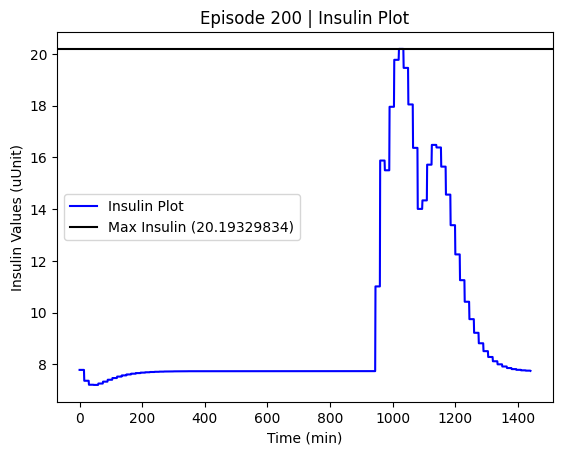

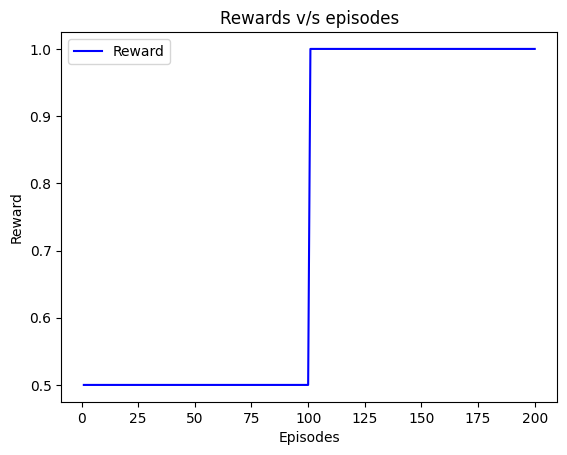

*** Epoch 10 Terminal Cases ***
*** Total 14 Terminal Cases ***
138 -> 2:18 (18g Carbs)
258 -> 4:18 (52g Carbs)
417 -> 6:57 (12g Carbs)
788 -> 13:08 (21g Carbs)
1221 -> 20:21 (119g Carbs)

Episode: 201 | Score (H<): 0.0 | Max Time: 1441 | Max Glucose Level: 352.221 | Avg Insulin Given: 9.92629 | Carb / Insulin: 0.715
78 -> 1:18 (62g Carbs)
493 -> 8:13 (14g Carbs)
679 -> 11:19 (29g Carbs)
836 -> 13:56 (112g Carbs)
918 -> 15:18 (73g Carbs)

Episode: 202 | Score (H<): 0.0 | Max Time: 878 | Max Glucose Level: 602.577 | Avg Insulin Given: 13.16513 | Carb / Insulin: 0.89
442 -> 7:22 (85g Carbs)
558 -> 9:18 (34g Carbs)
657 -> 10:57 (58g Carbs)
1238 -> 20:38 (27g Carbs)
1340 -> 22:20 (29g Carbs)

Episode: 203 | Score (H<): 0.0 | Max Time: 1441 | Max Glucose Level: 368.898 | Avg Insulin Given: 12.99757 | Carb / Insulin: 0.546
379 -> 6:19 (34g Carbs)
1009 -> 16:49 (43g Carbs)
1126 -> 18:46 (27g Carbs)

Episode: 204 | Score (H<): 0.0 | Max Time: 1441 | Max Glucose Level: 260.985 | Avg Insulin Giv

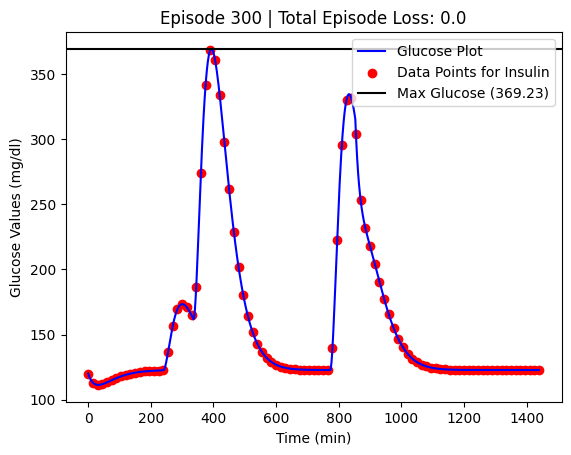

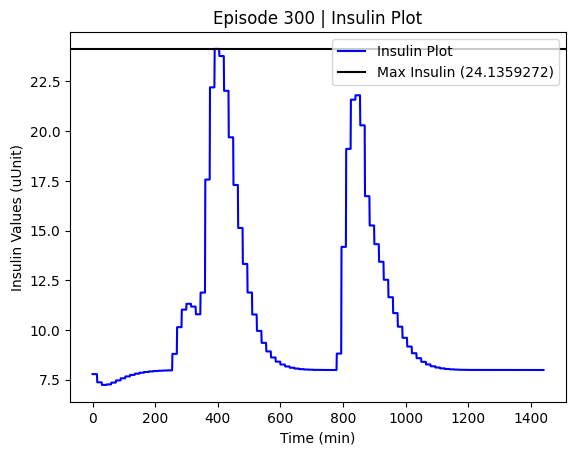

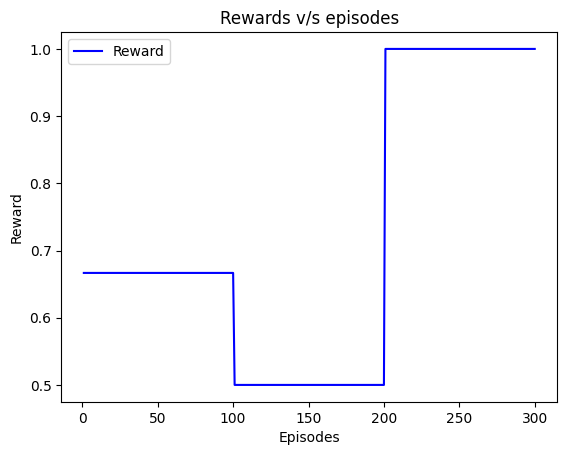

*** Epoch 4 Terminal Cases ***
*** Total 18 Terminal Cases ***
295 -> 4:55 (80g Carbs)
1162 -> 19:22 (118g Carbs)

Episode: 301 | Score (H<): 0.0 | Max Time: 1441 | Max Glucose Level: 494.203 | Avg Insulin Given: 13.47573 | Carb / Insulin: 0.525
278 -> 4:38 (28g Carbs)
1359 -> 22:39 (82g Carbs)

Episode: 302 | Score (H<): 0.0 | Max Time: 1441 | Max Glucose Level: 410.824 | Avg Insulin Given: 8.70874 | Carb / Insulin: 0.805
229 -> 3:49 (11g Carbs)
874 -> 14:34 (78g Carbs)
1171 -> 19:31 (92g Carbs)
1263 -> 21:03 (60g Carbs)
1418 -> 23:38 (58g Carbs)

Episode: 303 | Score (H<): 0.0 | Max Time: 1441 | Max Glucose Level: 286.652 | Avg Insulin Given: 9.23805 | Carb / Insulin: 0.774
327 -> 5:27 (111g Carbs)
1216 -> 20:16 (76g Carbs)

Episode: 304 | Score (H<): 0.0 | Max Time: 380 | Max Glucose Level: 602.211 | Avg Insulin Given: 10.2778 | Carb / Insulin: 2.607
6 -> 0:06 (95g Carbs)
691 -> 11:31 (21g Carbs)
986 -> 16:26 (58g Carbs)
1169 -> 19:29 (51g Carbs)
1400 -> 23:20 (62g Carbs)

Episode: 

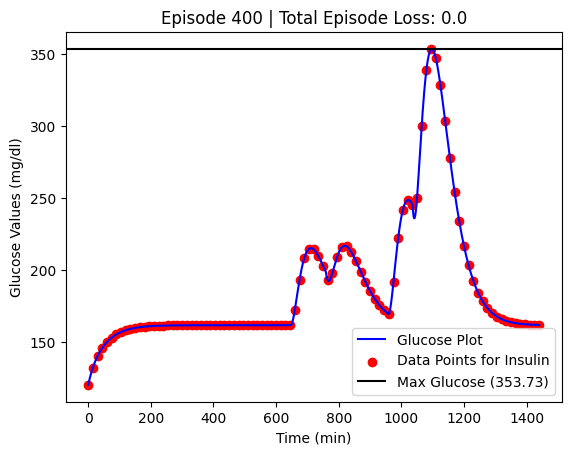

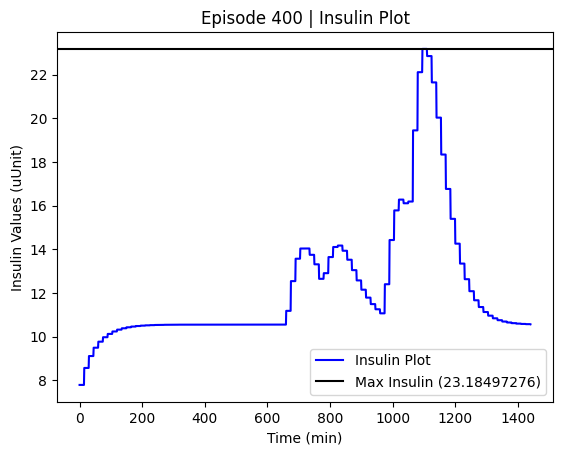

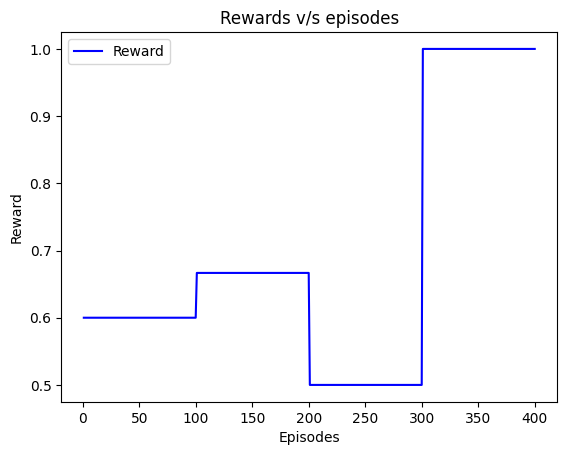

*** Epoch 6 Terminal Cases ***
*** Total 24 Terminal Cases ***
563 -> 9:23 (49g Carbs)
661 -> 11:01 (22g Carbs)

Episode: 401 | Score (H<): 0.0 | Max Time: 1441 | Max Glucose Level: 245.785 | Avg Insulin Given: 9.7288 | Carb / Insulin: 0.718
212 -> 3:32 (35g Carbs)
381 -> 6:21 (117g Carbs)
972 -> 16:12 (40g Carbs)
1045 -> 17:25 (118g Carbs)
1391 -> 23:11 (117g Carbs)

Episode: 402 | Score (H<): 0.0 | Max Time: 1441 | Max Glucose Level: 415.918 | Avg Insulin Given: 11.57627 | Carb / Insulin: 0.625
79 -> 1:19 (95g Carbs)
193 -> 3:13 (44g Carbs)
1166 -> 19:26 (33g Carbs)
1351 -> 22:31 (22g Carbs)

Episode: 403 | Score (H<): 0.0 | Max Time: 1441 | Max Glucose Level: 453.667 | Avg Insulin Given: 13.24591 | Carb / Insulin: 0.534
399 -> 6:39 (13g Carbs)
1141 -> 19:01 (43g Carbs)

Episode: 404 | Score (H<): 0.0 | Max Time: 1441 | Max Glucose Level: 280.426 | Avg Insulin Given: 10.66502 | Carb / Insulin: 0.654
130 -> 2:10 (73g Carbs)
508 -> 8:28 (101g Carbs)
1065 -> 17:45 (48g Carbs)
1098 -> 18

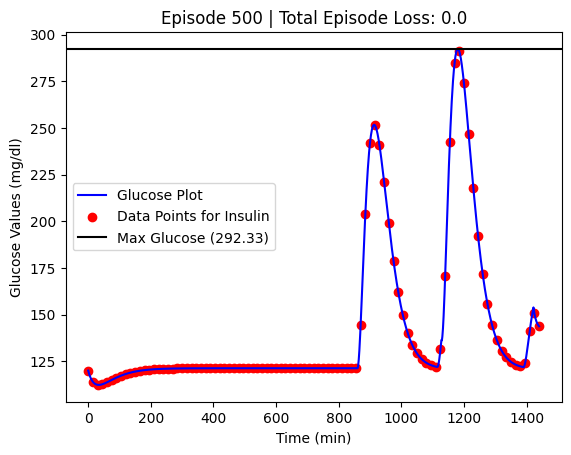

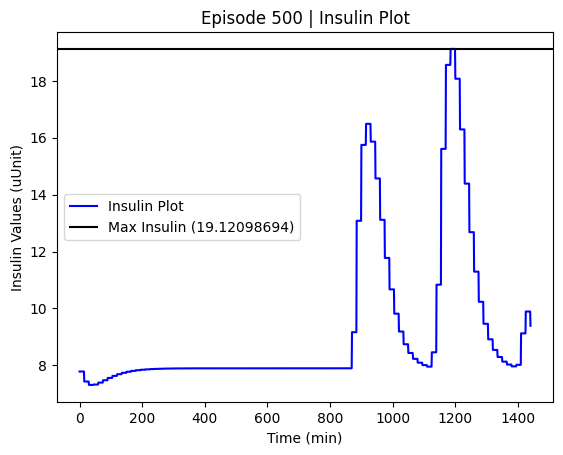

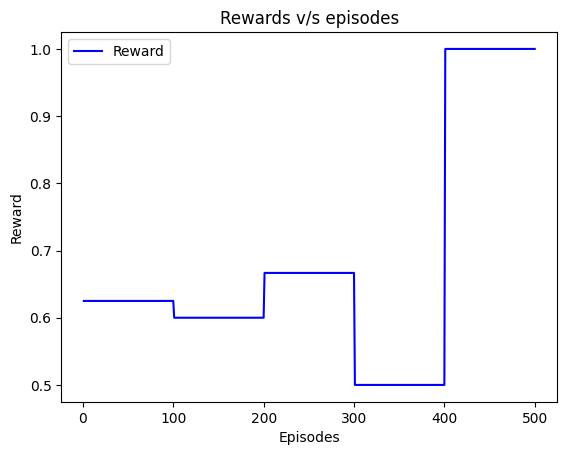

*** Epoch 5 Terminal Cases ***
*** Total 29 Terminal Cases ***
49 -> 0:49 (75g Carbs)
185 -> 3:05 (87g Carbs)
1186 -> 19:46 (110g Carbs)

Episode: 501 | Score (H<): 0.0 | Max Time: 1441 | Max Glucose Level: 491.806 | Avg Insulin Given: 14.08148 | Carb / Insulin: 0.506
1081 -> 18:01 (41g Carbs)
1396 -> 23:16 (97g Carbs)

Episode: 502 | Score (H<): 0.0 | Max Time: 1441 | Max Glucose Level: 427.314 | Avg Insulin Given: 10.91881 | Carb / Insulin: 0.644
1161 -> 19:21 (114g Carbs)
1253 -> 20:53 (117g Carbs)

Episode: 503 | Score (H<): 0.0 | Max Time: 1196 | Max Glucose Level: 608.611 | Avg Insulin Given: 10.31172 | Carb / Insulin: 0.829
387 -> 6:27 (35g Carbs)
808 -> 13:28 (16g Carbs)

Episode: 504 | Score (H<): 0.0 | Max Time: 1441 | Max Glucose Level: 238.188 | Avg Insulin Given: 8.32837 | Carb / Insulin: 0.837
64 -> 1:04 (18g Carbs)
84 -> 1:24 (41g Carbs)
492 -> 8:12 (51g Carbs)
725 -> 12:05 (109g Carbs)
949 -> 15:49 (39g Carbs)

Episode: 505 | Score (H<): 0.0 | Max Time: 1441 | Max Gluco

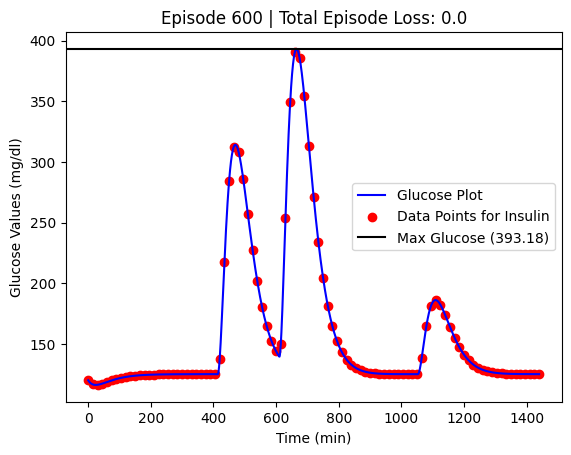

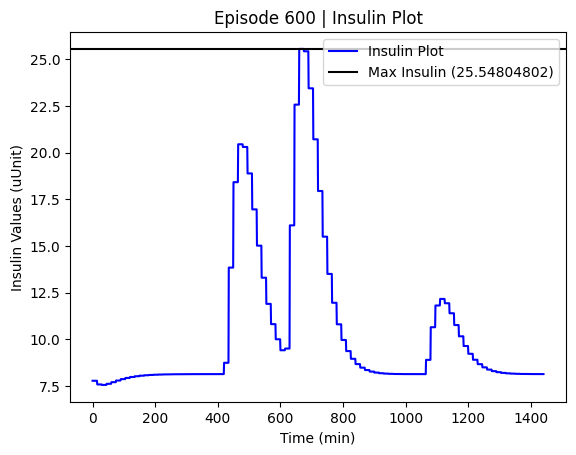

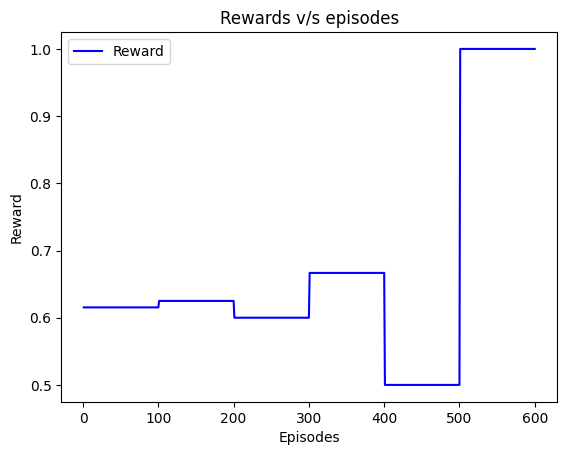

*** Epoch 5 Terminal Cases ***
*** Total 34 Terminal Cases ***
59 -> 0:59 (101g Carbs)
329 -> 5:29 (69g Carbs)
1433 -> 23:53 (120g Carbs)

Episode: 601 | Score (H<): 0.0 | Max Time: 1441 | Max Glucose Level: 393.304 | Avg Insulin Given: 12.321 | Carb / Insulin: 0.579
370 -> 6:10 (100g Carbs)
412 -> 6:52 (87g Carbs)
865 -> 14:25 (67g Carbs)
940 -> 15:40 (97g Carbs)

Episode: 602 | Score (H<): 0.0 | Max Time: 1441 | Max Glucose Level: 287.097 | Avg Insulin Given: 9.65042 | Carb / Insulin: 0.744
82 -> 1:22 (50g Carbs)
132 -> 2:12 (27g Carbs)
486 -> 8:06 (68g Carbs)
1398 -> 23:18 (15g Carbs)

Episode: 603 | Score (H<): 0.0 | Max Time: 1441 | Max Glucose Level: 239.217 | Avg Insulin Given: 8.88743 | Carb / Insulin: 0.793
382 -> 6:22 (84g Carbs)
398 -> 6:38 (33g Carbs)
915 -> 15:15 (55g Carbs)
966 -> 16:06 (28g Carbs)

Episode: 604 | Score (H<): 0.0 | Max Time: 1441 | Max Glucose Level: 245.576 | Avg Insulin Given: 9.39464 | Carb / Insulin: 0.753
37 -> 0:37 (35g Carbs)
423 -> 7:03 (22g Carbs

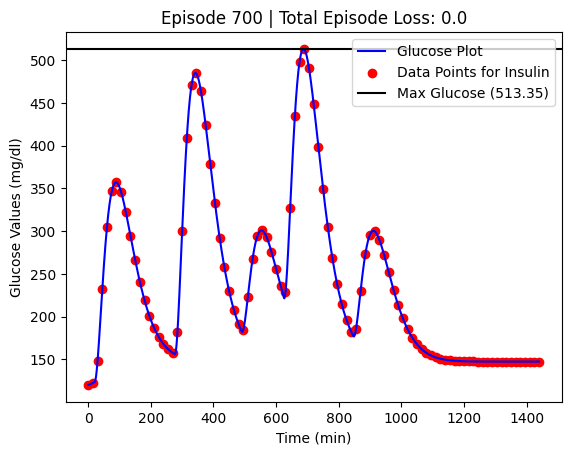

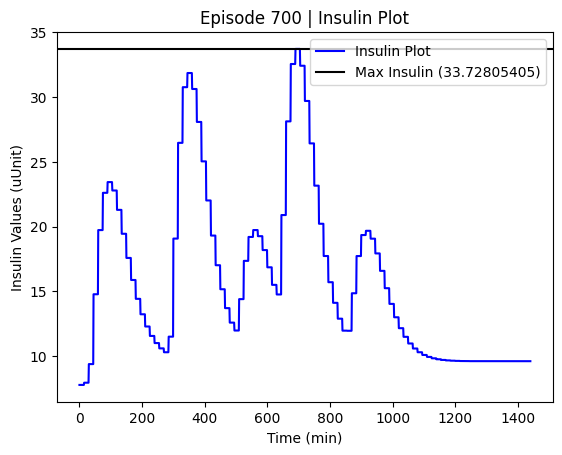

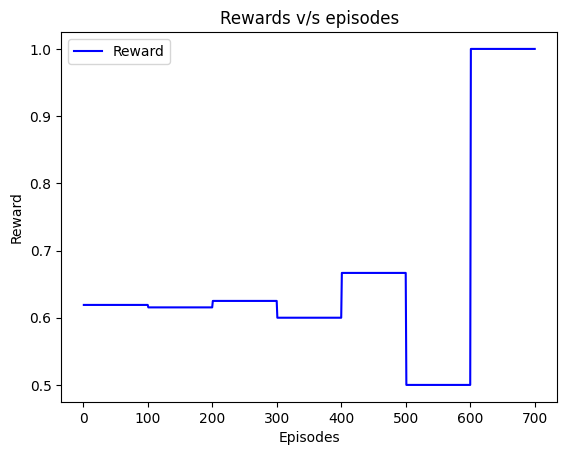

*** Epoch 5 Terminal Cases ***
*** Total 39 Terminal Cases ***
304 -> 5:04 (30g Carbs)
678 -> 11:18 (63g Carbs)
984 -> 16:24 (107g Carbs)
1361 -> 22:41 (55g Carbs)
1402 -> 23:22 (55g Carbs)

Episode: 701 | Score (H<): 0.0 | Max Time: 1441 | Max Glucose Level: 364.264 | Avg Insulin Given: 10.20355 | Carb / Insulin: 0.701
195 -> 3:15 (23g Carbs)
1353 -> 22:33 (98g Carbs)

Episode: 702 | Score (H<): 0.0 | Max Time: 1403 | Max Glucose Level: 600.67 | Avg Insulin Given: 10.08529 | Carb / Insulin: 0.715
602 -> 10:02 (107g Carbs)
614 -> 10:14 (43g Carbs)
899 -> 14:59 (30g Carbs)
913 -> 15:13 (76g Carbs)
1091 -> 18:11 (38g Carbs)

Episode: 703 | Score (H<): 0.0 | Max Time: 1441 | Max Glucose Level: 304.04 | Avg Insulin Given: 10.43821 | Carb / Insulin: 0.684
134 -> 2:14 (105g Carbs)
659 -> 10:59 (94g Carbs)
1375 -> 22:55 (75g Carbs)

Episode: 704 | Score (H<): 0.0 | Max Time: 1441 | Max Glucose Level: 332.086 | Avg Insulin Given: 10.76276 | Carb / Insulin: 0.662
145 -> 2:25 (79g Carbs)
502 -> 

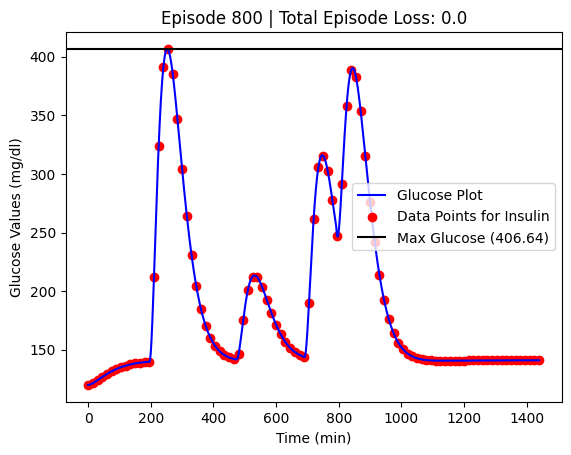

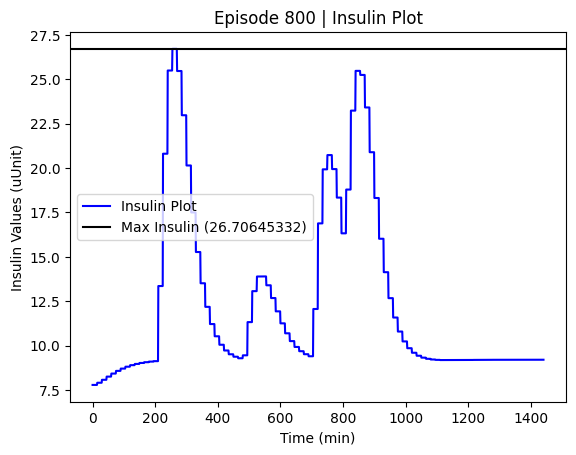

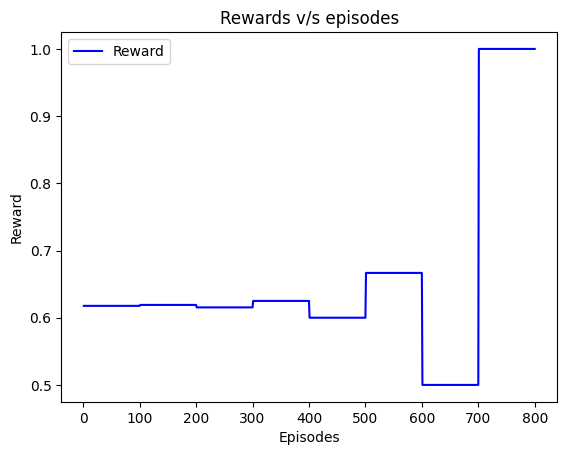

*** Epoch 7 Terminal Cases ***
*** Total 46 Terminal Cases ***
826 -> 13:46 (63g Carbs)
883 -> 14:43 (85g Carbs)
1229 -> 20:29 (90g Carbs)

Episode: 801 | Score (H<): 0.0 | Max Time: 1441 | Max Glucose Level: 366.239 | Avg Insulin Given: 11.01117 | Carb / Insulin: 0.645
216 -> 3:36 (41g Carbs)
286 -> 4:46 (78g Carbs)
347 -> 5:47 (109g Carbs)
1282 -> 21:22 (100g Carbs)
1323 -> 22:03 (21g Carbs)

Episode: 802 | Score (H<): 0.0 | Max Time: 1441 | Max Glucose Level: 506.467 | Avg Insulin Given: 11.28718 | Carb / Insulin: 0.636
28 -> 0:28 (95g Carbs)
863 -> 14:23 (51g Carbs)
900 -> 15:00 (97g Carbs)
1258 -> 20:58 (14g Carbs)

Episode: 803 | Score (H<): 0.0 | Max Time: 1441 | Max Glucose Level: 414.01 | Avg Insulin Given: 12.02034 | Carb / Insulin: 0.592
364 -> 6:04 (13g Carbs)
471 -> 7:51 (57g Carbs)
836 -> 13:56 (73g Carbs)
1098 -> 18:18 (56g Carbs)

Episode: 804 | Score (H<): 0.0 | Max Time: 1441 | Max Glucose Level: 330.946 | Avg Insulin Given: 12.16703 | Carb / Insulin: 0.582
12 -> 0:12

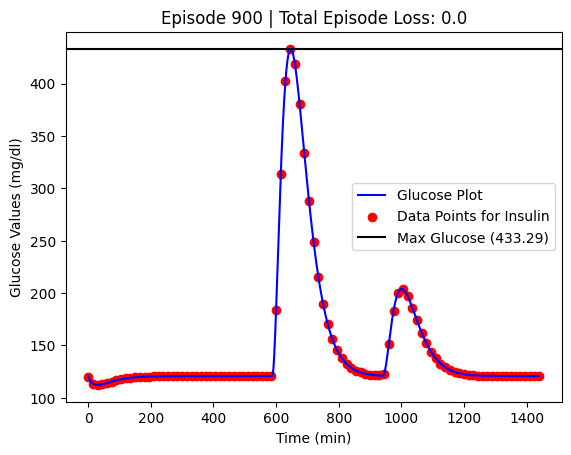

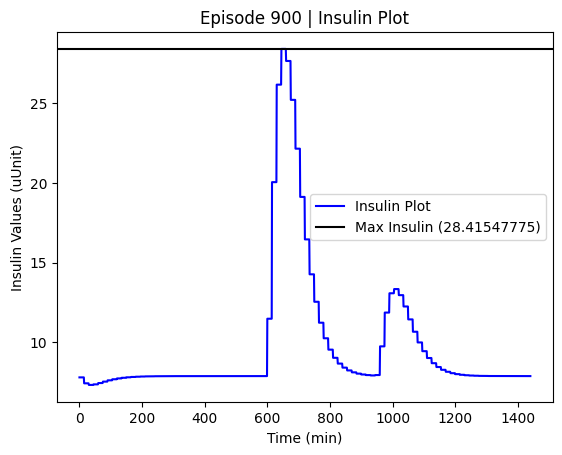

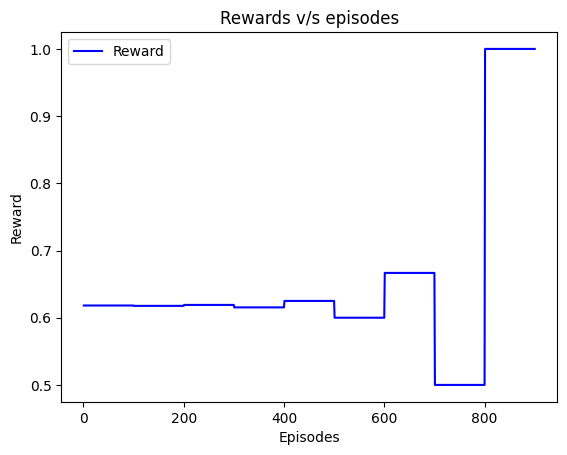

*** Epoch 3 Terminal Cases ***
*** Total 49 Terminal Cases ***
575 -> 9:35 (100g Carbs)
607 -> 10:07 (100g Carbs)
1227 -> 20:27 (48g Carbs)

Episode: 901 | Score (H<): 0.0 | Max Time: 1441 | Max Glucose Level: 470.377 | Avg Insulin Given: 12.09309 | Carb / Insulin: 0.588
142 -> 2:22 (103g Carbs)
163 -> 2:43 (113g Carbs)
845 -> 14:05 (54g Carbs)
1162 -> 19:22 (74g Carbs)

Episode: 902 | Score (H<): 0.0 | Max Time: 1441 | Max Glucose Level: 520.463 | Avg Insulin Given: 14.70706 | Carb / Insulin: 0.488
398 -> 6:38 (32g Carbs)
555 -> 9:15 (77g Carbs)
722 -> 12:02 (22g Carbs)
1249 -> 20:49 (12g Carbs)

Episode: 903 | Score (H<): 0.0 | Max Time: 1441 | Max Glucose Level: 445.898 | Avg Insulin Given: 11.37596 | Carb / Insulin: 0.619
325 -> 5:25 (70g Carbs)
819 -> 13:39 (110g Carbs)

Episode: 904 | Score (H<): 0.0 | Max Time: 1441 | Max Glucose Level: 473.865 | Avg Insulin Given: 11.96932 | Carb / Insulin: 0.59
420 -> 7:00 (111g Carbs)
872 -> 14:32 (83g Carbs)
977 -> 16:17 (87g Carbs)
1134 -> 

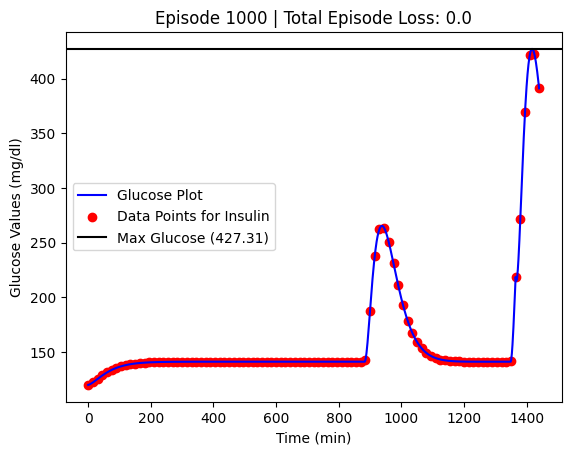

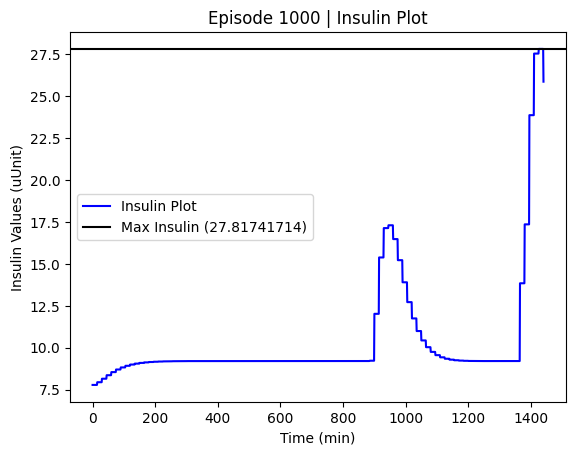

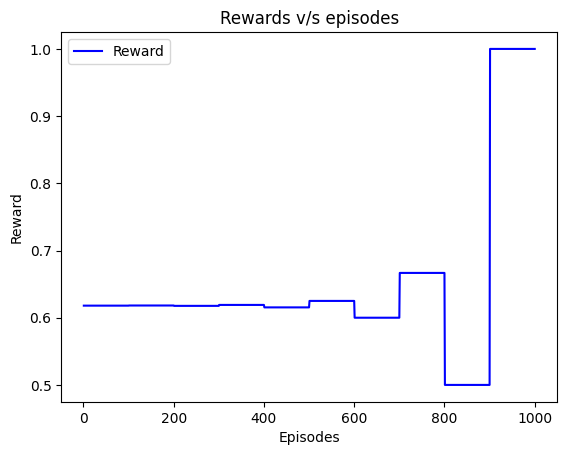

*** Epoch 3 Terminal Cases ***
*** Total 52 Terminal Cases ***


In [ ]:
train_env(model, episodes = 1000, show_work = 100, artif_epoch = 100)

In [ ]:
class NeuralNetwork_v3(nn.Module):
    def __init__(self, input_size, output_size):
        super(NeuralNetwork_v3, self).__init__()
        self.l1 = nn.Linear(input_size, 128)
        self.l2 = nn.Linear(128, 256)
        self.l3 = nn.Linear(256, 512)
        self.l4 = nn.Linear(512, 256)
        self.l5 = nn.Linear(256, 128)
        self.l6 = nn.Linear(128, 64)
        self.fc = nn.Linear(64, output_size)
        self.relu = nn.ReLU()

    def forward(self, x):
        x = self.l1(x)
        x = self.l2(x)
        x = self.relu(x)
        x = self.l3(x)
        x = self.l4(x)
        x = self.relu(x)
        x = self.l5(x)
        x = self.l6(x)
        x = self.relu(x)
        x = self.fc(x)
        x = torch.clamp(x, min=0, max=50)
        # print(f"At C1: {x}")
        return x

In [ ]:
model = NeuralNetwork_v3(input_size, output_size).to(device)
optimizer = optim.Adam(model.parameters(), lr=0.01)
loss_function = nn.MSELoss()

377 -> 6:17 (112g Carbs)
1004 -> 16:44 (33g Carbs)
1424 -> 23:44 (111g Carbs)

Episode: 1 | Score (H<): 138,934,061,315.17224 | Max Time: 1441 | Max Glucose Level: 355.9 | Avg Insulin Given: 0.98661 | Carb / Insulin: 7.208
215 -> 3:35 (111g Carbs)
539 -> 8:59 (36g Carbs)
748 -> 12:28 (63g Carbs)
981 -> 16:21 (83g Carbs)
1107 -> 18:27 (39g Carbs)

Episode: 2 | Score (H<): 156,406,247,474.80722 | Max Time: 1441 | Max Glucose Level: 333.363 | Avg Insulin Given: 1.12779 | Carb / Insulin: 6.353
685 -> 11:25 (57g Carbs)
817 -> 13:37 (13g Carbs)
1098 -> 18:18 (32g Carbs)
1389 -> 23:09 (94g Carbs)

Episode: 3 | Score (H<): 278,831,002,061.3802 | Max Time: 1441 | Max Glucose Level: 452.188 | Avg Insulin Given: 0.96015 | Carb / Insulin: 7.363
429 -> 7:09 (68g Carbs)
590 -> 9:50 (108g Carbs)

Episode: 4 | Score (H<): 1.0000000463433349e+22 | Max Time: 632 | Max Glucose Level: 600.224 | Avg Insulin Given: 1.18666 | Carb / Insulin: 13.549
1175 -> 19:35 (49g Carbs)
1290 -> 21:30 (11g Carbs)
1314 -> 

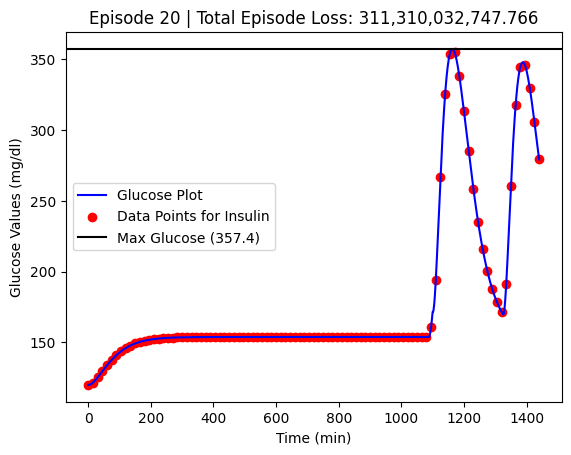

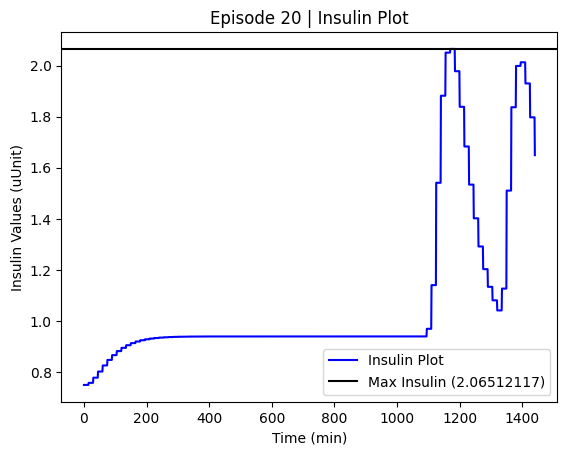

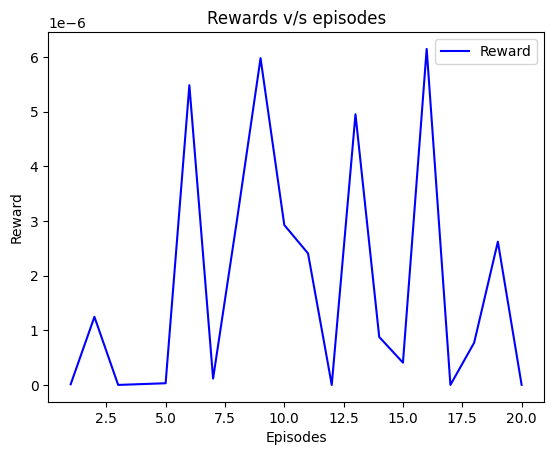

38 -> 0:38 (20g Carbs)
459 -> 7:39 (39g Carbs)
928 -> 15:28 (52g Carbs)
1179 -> 19:39 (85g Carbs)
1295 -> 21:35 (43g Carbs)

Episode: 21 | Score (H<): 1,296,576,526,582.3123 | Max Time: 1441 | Max Glucose Level: 477.179 | Avg Insulin Given: 1.27971 | Carb / Insulin: 5.549
1028 -> 17:08 (66g Carbs)
1398 -> 23:18 (61g Carbs)

Episode: 22 | Score (H<): 206,475,746,204.9271 | Max Time: 1441 | Max Glucose Level: 369.814 | Avg Insulin Given: 0.94166 | Carb / Insulin: 7.457
176 -> 2:56 (87g Carbs)
710 -> 11:50 (79g Carbs)
924 -> 15:24 (35g Carbs)
976 -> 16:16 (67g Carbs)
1297 -> 21:37 (117g Carbs)

Episode: 23 | Score (H<): 1,489,510,417,096.5908 | Max Time: 1441 | Max Glucose Level: 476.132 | Avg Insulin Given: 1.3445 | Carb / Insulin: 5.357
211 -> 3:31 (56g Carbs)
526 -> 8:46 (109g Carbs)
661 -> 11:01 (45g Carbs)
911 -> 15:11 (17g Carbs)
1001 -> 16:41 (119g Carbs)

Episode: 24 | Score (H<): 1.0000000453544132e+22 | Max Time: 575 | Max Glucose Level: 605.714 | Avg Insulin Given: 1.26564 | Ca

KeyboardInterrupt: 

In [ ]:
train_env(model, episodes = 2000, show_work = 20, artif_epoch = 200)

In [ ]:
torch.save(model.state_dict(), f'{model.__class__.__name__}.pth')

In [ ]:
print('gdfd')

gdfd


In [ ]:
class NeuralNetwork_v4(nn.Module):
    def __init__(self, input_size, output_size, n_check=20, num_layers_lstm=5):
        super(NeuralNetwork_v4, self).__init__()
        self.input_size = input_size
        self.output_size = output_size
        self.num_layers_lstm = num_layers_lstm
        self.n_check = n_check
        self.lstm = nn.LSTM(input_size, hidden_size=n_check, num_layers=num_layers_lstm, batch_first=True)
        self.h1 = nn.Linear(n_check, 32)
        self.h2 = nn.Linear(32, 16)
        self.h3 = nn.Linear(16, 8)
        self.fc = nn.Linear(8, output_size)
        self.fc2 = nn.Linear(num_layers_lstm, 1)
        self.relu = nn.ReLU()
        self.sig = nn.Sigmoid()

    def forward(self, x):
        x, (h0, c0) = self.lstm(x)
        x = h0
        # h0_ = torch.mean(h0, axis=0)
        # c0_ = torch.mean(c0, axis=0)
        # x = x.flatten()
        # x =torch.stack([h0_, x, c0_])
        # x = self.conv1(x)
        # x = self.relu(x)
        # x = self.conv2(x).T
        x = self.h1(x)
        x = torch.abs(x)
        x = self.h2(x)
        x = self.relu(x)
        # print(x)
        x = self.h3(x)
        x = self.relu(x)
        # print(x)
        x = self.fc(x)
        x = self.fc2(x.T)
        x =  (1 - self.sig(x)) * 50
        # x= torch.median(x)
        return torch.clamp(x, min=0, max=50)



In [ ]:
model = NeuralNetwork_v4(input_size,output_size, n_check=4, num_layers_lstm=10).to(device)
optimizer = optim.Adam(model.parameters(), lr=0.001)
loss_function = nn.MSELoss()

1018 -> 16:58 (31g Carbs)
1155 -> 19:15 (21g Carbs)

Episode: 1 | Score (H<): 21,074,386,790.0597 | Max Time: 1441 | Max Glucose Level: 154.415 | Avg Insulin Given: 27.52907 | Carb / Insulin: 0.253
974 -> 16:14 (37g Carbs)
1329 -> 22:09 (14g Carbs)

Episode: 2 | Score (H<): 47,965,724,840.20101 | Max Time: 1441 | Max Glucose Level: 242.179 | Avg Insulin Given: 27.52891 | Carb / Insulin: 0.253
414 -> 6:54 (22g Carbs)
722 -> 12:02 (115g Carbs)

Episode: 3 | Score (H<): 123,390,687,232.87843 | Max Time: 1441 | Max Glucose Level: 304.61 | Avg Insulin Given: 27.52946 | Carb / Insulin: 0.256
456 -> 7:36 (75g Carbs)
677 -> 11:17 (107g Carbs)
1201 -> 20:01 (110g Carbs)
1363 -> 22:43 (90g Carbs)

Episode: 4 | Score (H<): 1,234,858,969,810.9766 | Max Time: 1441 | Max Glucose Level: 408.307 | Avg Insulin Given: 27.52865 | Carb / Insulin: 0.262
501 -> 8:21 (86g Carbs)
1291 -> 21:31 (39g Carbs)
1419 -> 23:39 (37g Carbs)

Episode: 5 | Score (H<): 104,942,844,767.22409 | Max Time: 1441 | Max Glucose 

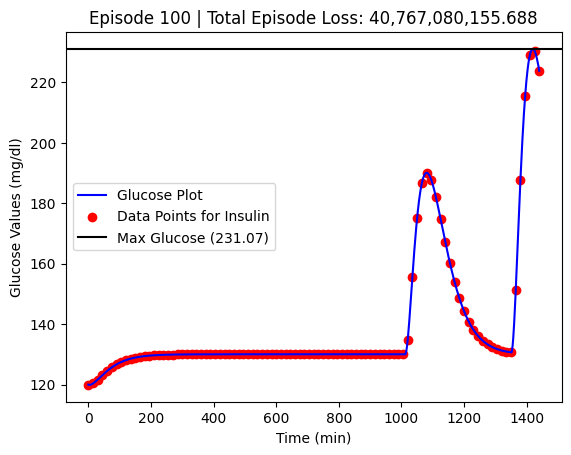

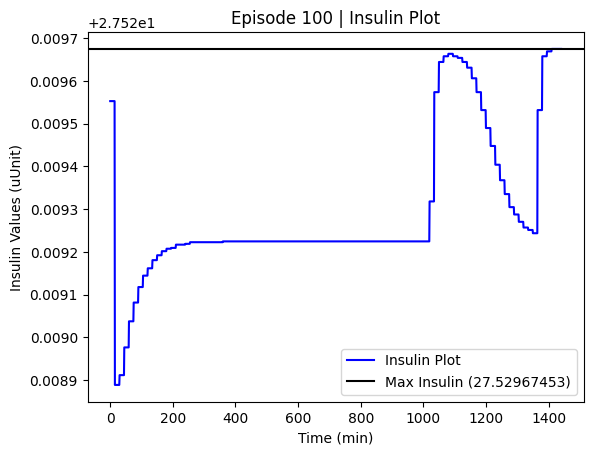

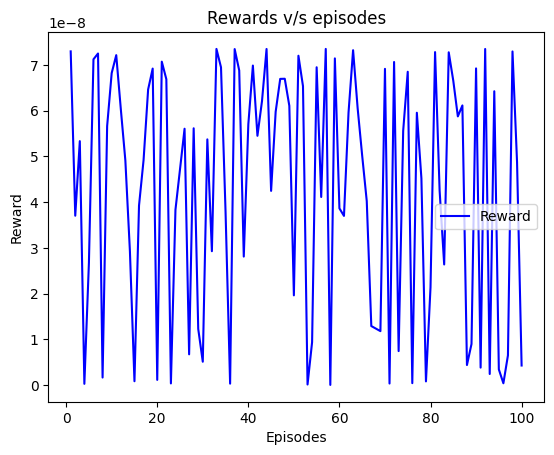

*** Epoch 2 Terminal Cases ***
*** Total 2 Terminal Cases ***
119 -> 1:59 (99g Carbs)
527 -> 8:47 (111g Carbs)
1022 -> 17:02 (119g Carbs)

Episode: 101 | Score (H<): 2,161,491,074,456.718 | Max Time: 1441 | Max Glucose Level: 459.525 | Avg Insulin Given: 27.52882 | Carb / Insulin: 0.26
564 -> 9:24 (87g Carbs)
896 -> 14:56 (110g Carbs)
1201 -> 20:01 (16g Carbs)
1311 -> 21:51 (106g Carbs)
1412 -> 23:32 (38g Carbs)

Episode: 102 | Score (H<): 5,562,184,906,846.493 | Max Time: 1441 | Max Glucose Level: 559.658 | Avg Insulin Given: 27.52958 | Carb / Insulin: 0.261
388 -> 6:28 (32g Carbs)
658 -> 10:58 (82g Carbs)
686 -> 11:26 (115g Carbs)
702 -> 11:42 (83g Carbs)
1327 -> 22:07 (52g Carbs)

Episode: 103 | Score (H<): 107,350,988,394.21062 | Max Time: 1441 | Max Glucose Level: 286.701 | Avg Insulin Given: 27.52882 | Carb / Insulin: 0.261
133 -> 2:13 (35g Carbs)
921 -> 15:21 (89g Carbs)
1260 -> 21:00 (22g Carbs)

Episode: 104 | Score (H<): 47,057,418,873.504974 | Max Time: 1441 | Max Glucose Le

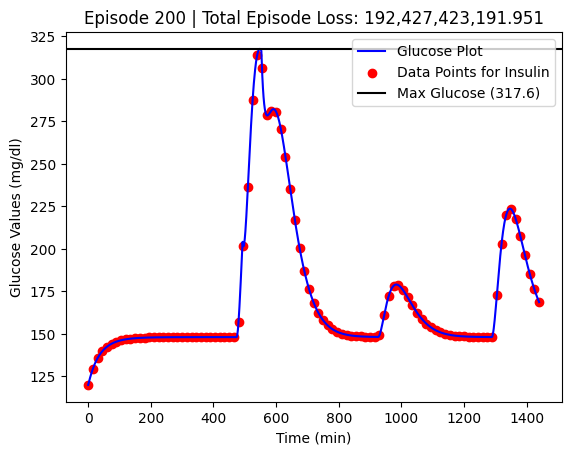

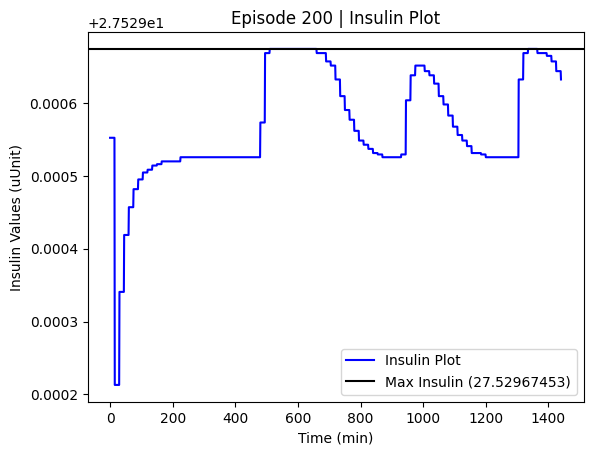

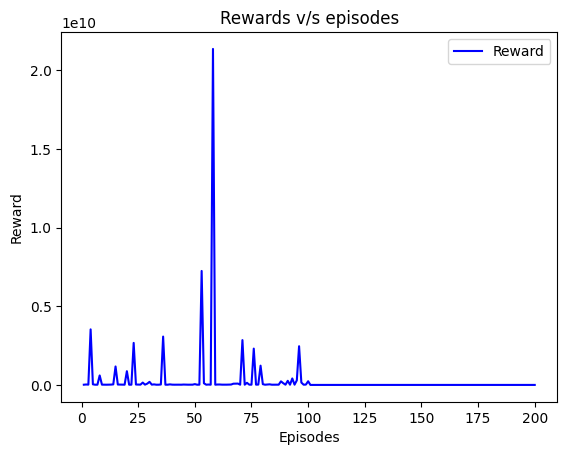

*** Epoch 3 Terminal Cases ***
*** Total 5 Terminal Cases ***
525 -> 8:45 (31g Carbs)
873 -> 14:33 (24g Carbs)
1210 -> 20:10 (100g Carbs)

Episode: 201 | Score (H<): 1,215,922,334,437.5894 | Max Time: 1441 | Max Glucose Level: 479.892 | Avg Insulin Given: 27.52913 | Carb / Insulin: 0.256
357 -> 5:57 (53g Carbs)
843 -> 14:03 (94g Carbs)
1199 -> 19:59 (30g Carbs)
1375 -> 22:55 (25g Carbs)
1393 -> 23:13 (44g Carbs)

Episode: 202 | Score (H<): 236,016,554,320.21597 | Max Time: 1441 | Max Glucose Level: 354.348 | Avg Insulin Given: 27.52875 | Carb / Insulin: 0.258
233 -> 3:53 (103g Carbs)
439 -> 7:19 (35g Carbs)
626 -> 10:26 (75g Carbs)
1025 -> 17:05 (27g Carbs)

Episode: 203 | Score (H<): 295,381,985,591.68787 | Max Time: 1441 | Max Glucose Level: 346.27 | Avg Insulin Given: 27.52799 | Carb / Insulin: 0.258
211 -> 3:31 (33g Carbs)
1050 -> 17:30 (91g Carbs)
1198 -> 19:58 (22g Carbs)

Episode: 204 | Score (H<): 209,687,498,497.26157 | Max Time: 1441 | Max Glucose Level: 348.908 | Avg Insulin

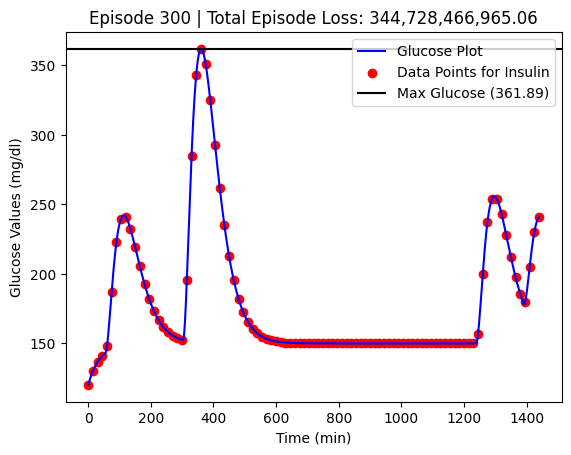

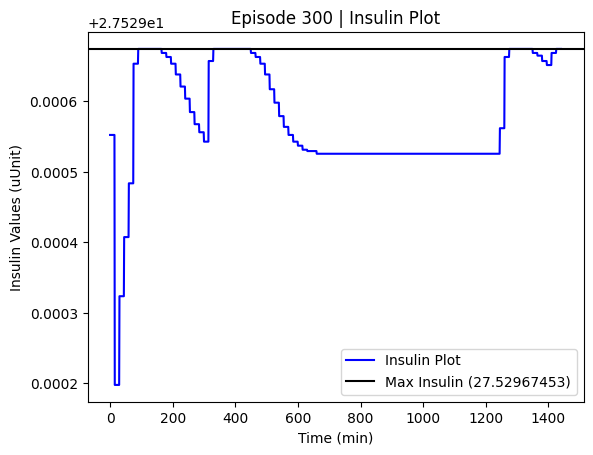

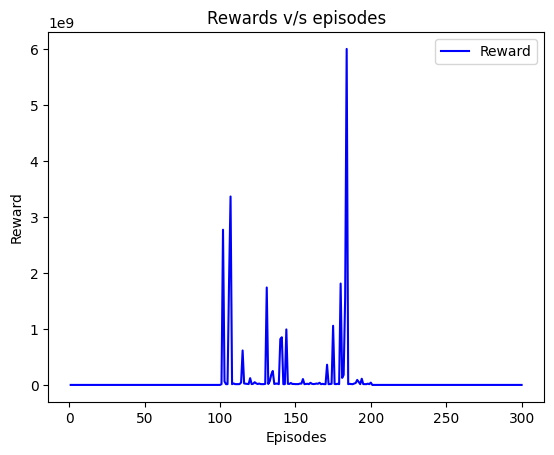

*** Epoch 4 Terminal Cases ***
*** Total 9 Terminal Cases ***
325 -> 5:25 (59g Carbs)
383 -> 6:23 (58g Carbs)
640 -> 10:40 (83g Carbs)
827 -> 13:47 (80g Carbs)
1392 -> 23:12 (119g Carbs)

Episode: 301 | Score (H<): 138,504,495,566.03348 | Max Time: 1441 | Max Glucose Level: 296.686 | Avg Insulin Given: 27.5296 | Carb / Insulin: 0.262
990 -> 16:30 (12g Carbs)
1035 -> 17:15 (48g Carbs)
1083 -> 18:03 (49g Carbs)

Episode: 302 | Score (H<): 986,236,155,287.6427 | Max Time: 1441 | Max Glucose Level: 433.021 | Avg Insulin Given: 27.52962 | Carb / Insulin: 0.255
162 -> 2:42 (80g Carbs)
294 -> 4:54 (116g Carbs)
440 -> 7:20 (34g Carbs)
960 -> 16:00 (69g Carbs)

Episode: 303 | Score (H<): 709,593,091,179.417 | Max Time: 1441 | Max Glucose Level: 426.273 | Avg Insulin Given: 27.52935 | Carb / Insulin: 0.26
676 -> 11:16 (97g Carbs)
763 -> 12:43 (114g Carbs)
1027 -> 17:07 (42g Carbs)
1180 -> 19:40 (42g Carbs)
1384 -> 23:04 (85g Carbs)

Episode: 304 | Score (H<): 623,231,093,277.0897 | Max Time: 144

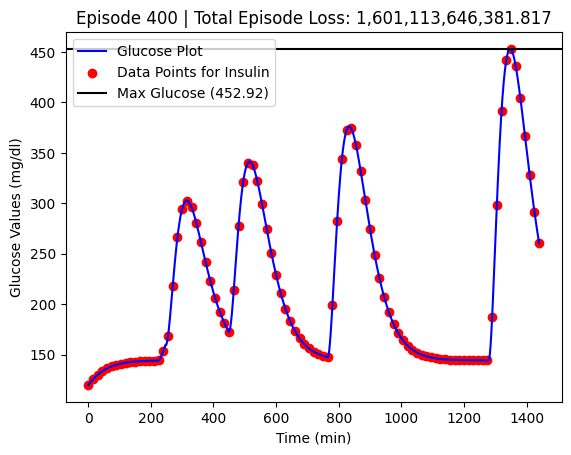

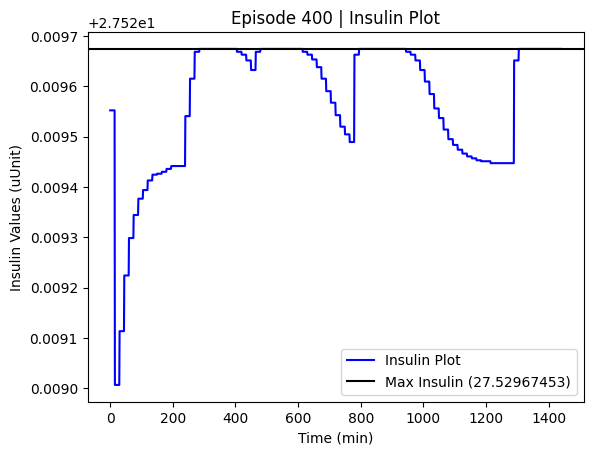

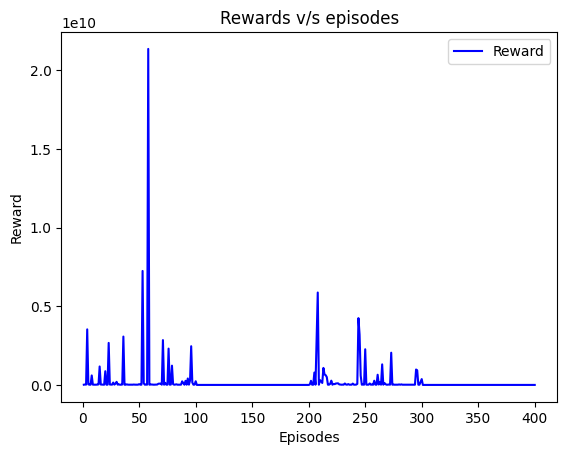

*** Epoch 6 Terminal Cases ***
*** Total 15 Terminal Cases ***
408 -> 6:48 (34g Carbs)
984 -> 16:24 (53g Carbs)
1263 -> 21:03 (47g Carbs)

Episode: 401 | Score (H<): 85,754,925,950.65004 | Max Time: 1441 | Max Glucose Level: 256.633 | Avg Insulin Given: 27.52866 | Carb / Insulin: 0.255
209 -> 3:29 (23g Carbs)
302 -> 5:02 (77g Carbs)
706 -> 11:46 (36g Carbs)
718 -> 11:58 (92g Carbs)

Episode: 402 | Score (H<): 85,905,505,784.34157 | Max Time: 1441 | Max Glucose Level: 269.219 | Avg Insulin Given: 27.52906 | Carb / Insulin: 0.258
781 -> 13:01 (112g Carbs)
839 -> 13:59 (66g Carbs)
1114 -> 18:34 (94g Carbs)

Episode: 403 | Score (H<): 133,516,885,906.94833 | Max Time: 1441 | Max Glucose Level: 289.456 | Avg Insulin Given: 27.52949 | Carb / Insulin: 0.259
189 -> 3:09 (33g Carbs)
783 -> 13:03 (38g Carbs)

Episode: 404 | Score (H<): 61,584,460,725.22004 | Max Time: 1441 | Max Glucose Level: 231.274 | Avg Insulin Given: 27.52928 | Carb / Insulin: 0.254
25 -> 0:25 (31g Carbs)
140 -> 2:20 (47g C

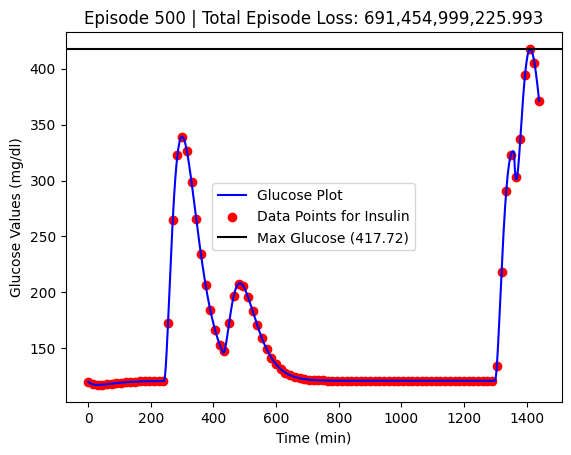

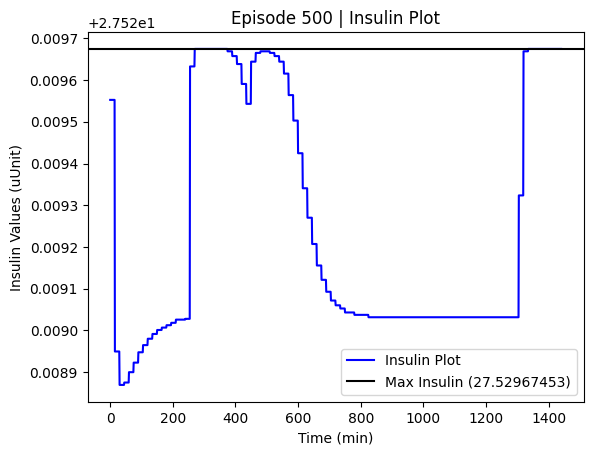

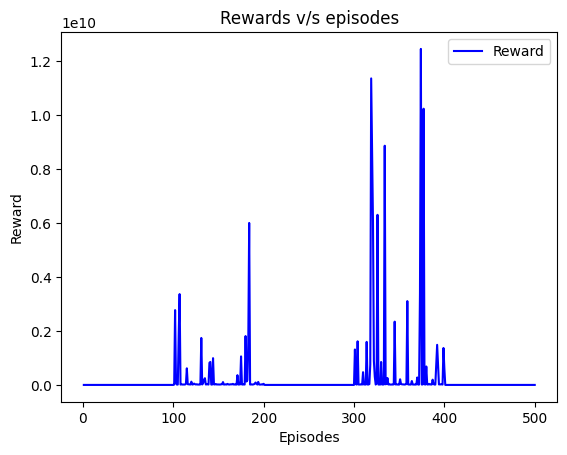

*** Epoch 4 Terminal Cases ***
*** Total 19 Terminal Cases ***
1009 -> 16:49 (69g Carbs)
1308 -> 21:48 (91g Carbs)
1406 -> 23:26 (107g Carbs)
1407 -> 23:27 (26g Carbs)

Episode: 501 | Score (H<): 554,598,196,709.5178 | Max Time: 1441 | Max Glucose Level: 383.833 | Avg Insulin Given: 27.52964 | Carb / Insulin: 0.259
288 -> 4:48 (65g Carbs)
721 -> 12:01 (83g Carbs)
1287 -> 21:27 (90g Carbs)

Episode: 502 | Score (H<): 205,121,654,141.3674 | Max Time: 1441 | Max Glucose Level: 303.489 | Avg Insulin Given: 27.52881 | Carb / Insulin: 0.258
429 -> 7:09 (110g Carbs)
980 -> 16:20 (10g Carbs)
1406 -> 23:26 (56g Carbs)

Episode: 503 | Score (H<): 715,668,527,756.0007 | Max Time: 1441 | Max Glucose Level: 435.364 | Avg Insulin Given: 27.5278 | Carb / Insulin: 0.257
288 -> 4:48 (86g Carbs)
429 -> 7:09 (44g Carbs)
654 -> 10:54 (12g Carbs)
738 -> 12:18 (57g Carbs)

Episode: 504 | Score (H<): 252,086,027,273.48068 | Max Time: 1441 | Max Glucose Level: 330.512 | Avg Insulin Given: 27.52962 | Carb / In

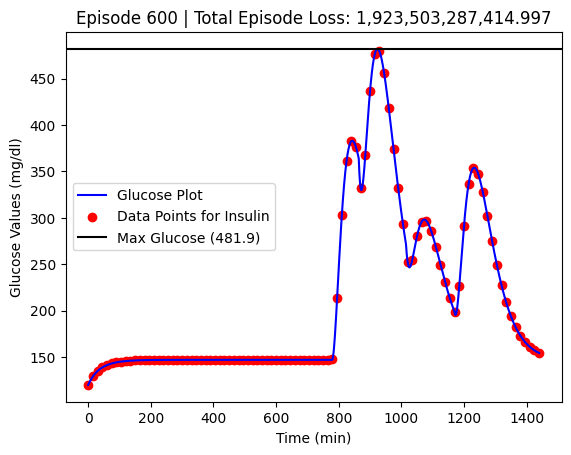

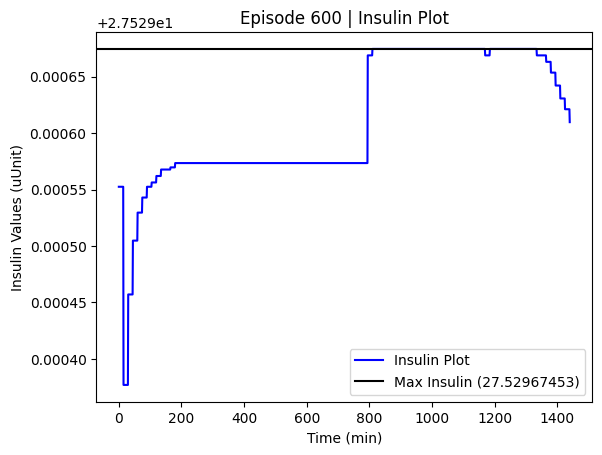

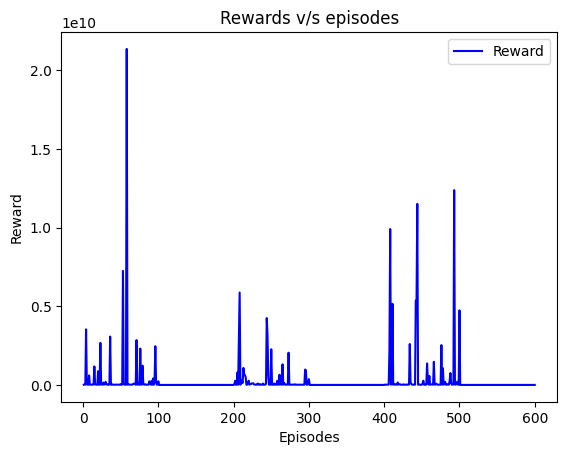

*** Epoch 5 Terminal Cases ***
*** Total 24 Terminal Cases ***
384 -> 6:24 (62g Carbs)
571 -> 9:31 (44g Carbs)
929 -> 15:29 (71g Carbs)
1106 -> 18:26 (57g Carbs)

Episode: 601 | Score (H<): 160,105,720,999.93915 | Max Time: 1441 | Max Glucose Level: 290.746 | Avg Insulin Given: 27.52893 | Carb / Insulin: 0.258
309 -> 5:09 (81g Carbs)
680 -> 11:20 (21g Carbs)
746 -> 12:26 (51g Carbs)
1364 -> 22:44 (35g Carbs)

Episode: 602 | Score (H<): 269,117,626,805.5545 | Max Time: 1441 | Max Glucose Level: 356.034 | Avg Insulin Given: 27.52803 | Carb / Insulin: 0.257
19 -> 0:19 (114g Carbs)
211 -> 3:31 (77g Carbs)
630 -> 10:30 (60g Carbs)
1433 -> 23:53 (62g Carbs)

Episode: 603 | Score (H<): 458,543,820,237.0784 | Max Time: 1441 | Max Glucose Level: 373.09 | Avg Insulin Given: 27.52944 | Carb / Insulin: 0.26
10 -> 0:10 (92g Carbs)
123 -> 2:03 (117g Carbs)
395 -> 6:35 (116g Carbs)
1139 -> 18:59 (72g Carbs)
1430 -> 23:50 (30g Carbs)

Episode: 604 | Score (H<): 1,117,548,962,429.1584 | Max Time: 1441 

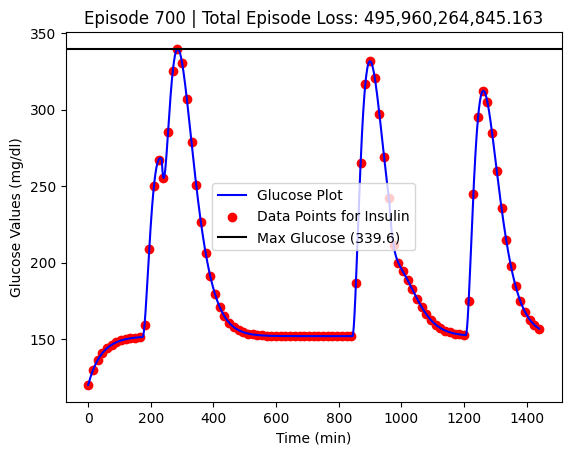

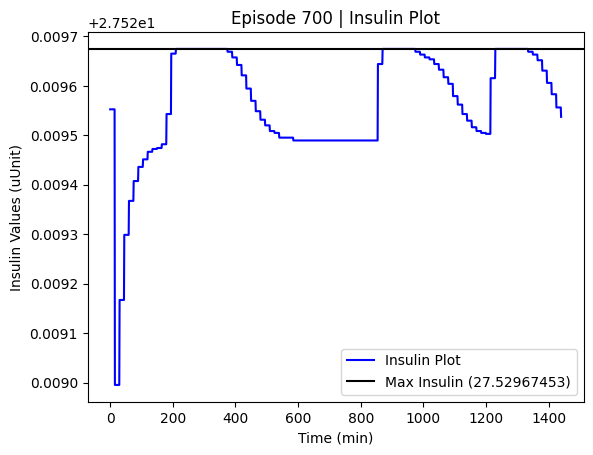

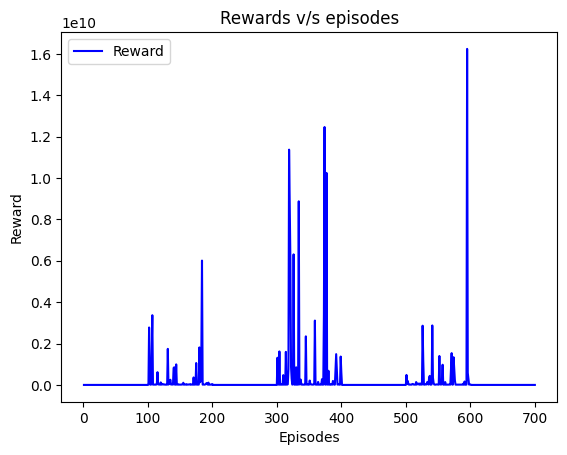

*** Epoch 6 Terminal Cases ***
*** Total 30 Terminal Cases ***
401 -> 6:41 (14g Carbs)
440 -> 7:20 (88g Carbs)
849 -> 14:09 (117g Carbs)
956 -> 15:56 (19g Carbs)
1434 -> 23:54 (79g Carbs)

Episode: 701 | Score (H<): 1,698,539,334,438.8552 | Max Time: 1441 | Max Glucose Level: 487.803 | Avg Insulin Given: 27.52963 | Carb / Insulin: 0.26
50 -> 0:50 (112g Carbs)
510 -> 8:30 (86g Carbs)
1315 -> 21:55 (58g Carbs)

Episode: 702 | Score (H<): 146,199,527,742.30368 | Max Time: 1441 | Max Glucose Level: 312.538 | Avg Insulin Given: 27.52787 | Carb / Insulin: 0.259
40 -> 0:40 (32g Carbs)
549 -> 9:09 (30g Carbs)
1109 -> 18:29 (82g Carbs)
1159 -> 19:19 (76g Carbs)

Episode: 703 | Score (H<): 233,581,905,288.33167 | Max Time: 1441 | Max Glucose Level: 330.854 | Avg Insulin Given: 27.52902 | Carb / Insulin: 0.258
23 -> 0:23 (34g Carbs)
954 -> 15:54 (105g Carbs)

Episode: 704 | Score (H<): 269,218,280,611.0966 | Max Time: 1441 | Max Glucose Level: 364.806 | Avg Insulin Given: 27.5295 | Carb / Insulin

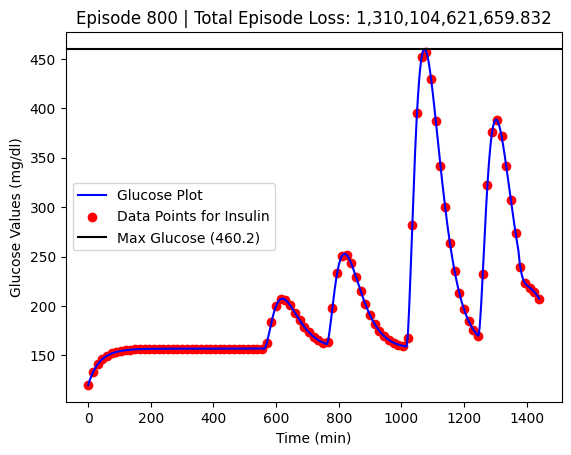

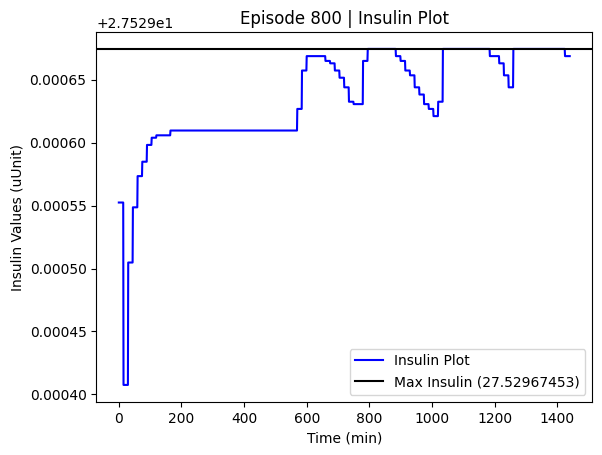

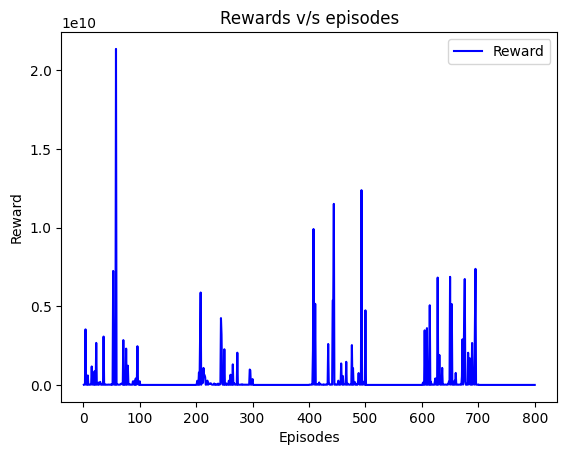

*** Epoch 9 Terminal Cases ***
*** Total 39 Terminal Cases ***
48 -> 0:48 (13g Carbs)
498 -> 8:18 (14g Carbs)
933 -> 15:33 (25g Carbs)

Episode: 801 | Score (H<): 30,688,119,995.788616 | Max Time: 1441 | Max Glucose Level: 182.505 | Avg Insulin Given: 27.52944 | Carb / Insulin: 0.253
18 -> 0:18 (19g Carbs)
368 -> 6:08 (43g Carbs)
610 -> 10:10 (11g Carbs)
1090 -> 18:10 (95g Carbs)

Episode: 802 | Score (H<): 130,704,671,975.28465 | Max Time: 1441 | Max Glucose Level: 320.696 | Avg Insulin Given: 27.52871 | Carb / Insulin: 0.256
223 -> 3:43 (56g Carbs)
322 -> 5:22 (99g Carbs)
1308 -> 21:48 (14g Carbs)

Episode: 803 | Score (H<): 719,775,599,954.7693 | Max Time: 1441 | Max Glucose Level: 429.779 | Avg Insulin Given: 27.52957 | Carb / Insulin: 0.256
240 -> 4:00 (85g Carbs)
1128 -> 18:48 (10g Carbs)
1372 -> 22:52 (68g Carbs)

Episode: 804 | Score (H<): 71,630,239,061.8056 | Max Time: 1441 | Max Glucose Level: 272.626 | Avg Insulin Given: 27.52849 | Carb / Insulin: 0.256
840 -> 14:00 (59g Ca

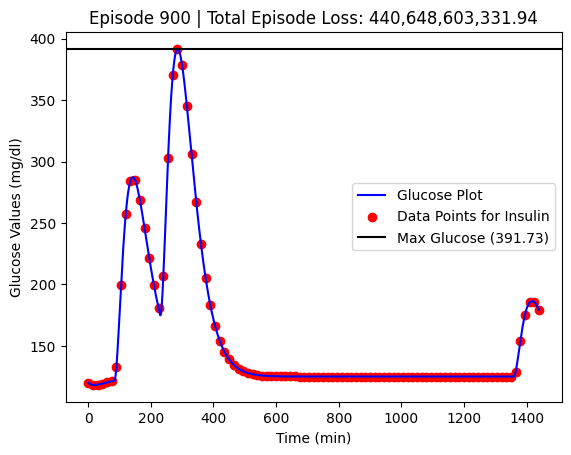

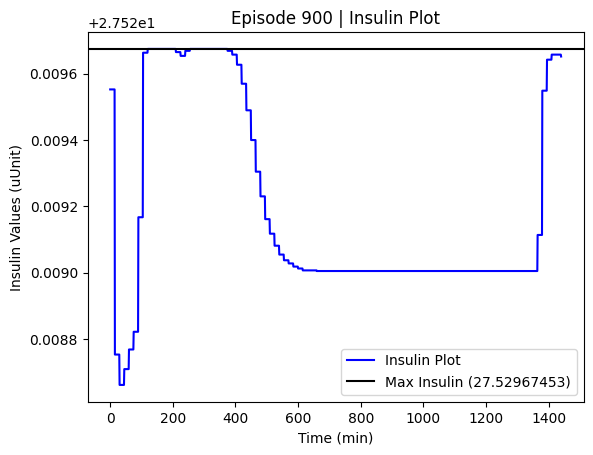

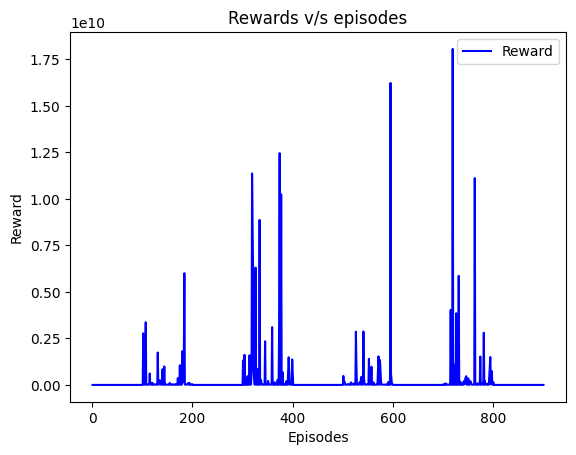

*** Epoch 3 Terminal Cases ***
*** Total 42 Terminal Cases ***
185 -> 3:05 (94g Carbs)
236 -> 3:56 (69g Carbs)
442 -> 7:22 (48g Carbs)
509 -> 8:29 (14g Carbs)
769 -> 12:49 (48g Carbs)

Episode: 901 | Score (H<): 1,085,482,724,309.5557 | Max Time: 1441 | Max Glucose Level: 427.1 | Avg Insulin Given: 27.52958 | Carb / Insulin: 0.259
607 -> 10:07 (27g Carbs)
686 -> 11:26 (81g Carbs)
1172 -> 19:32 (92g Carbs)
1271 -> 21:11 (113g Carbs)
1416 -> 23:36 (93g Carbs)

Episode: 902 | Score (H<): 647,936,036,500.4657 | Max Time: 1441 | Max Glucose Level: 383.799 | Avg Insulin Given: 27.52941 | Carb / Insulin: 0.262
812 -> 13:32 (98g Carbs)
1041 -> 17:21 (63g Carbs)
1322 -> 22:02 (107g Carbs)

Episode: 903 | Score (H<): 831,113,865,134.648 | Max Time: 1441 | Max Glucose Level: 403.787 | Avg Insulin Given: 27.5296 | Carb / Insulin: 0.259
283 -> 4:43 (38g Carbs)
286 -> 4:46 (40g Carbs)

Episode: 904 | Score (H<): 89,595,465,380.73167 | Max Time: 1441 | Max Glucose Level: 275.392 | Avg Insulin Given: 

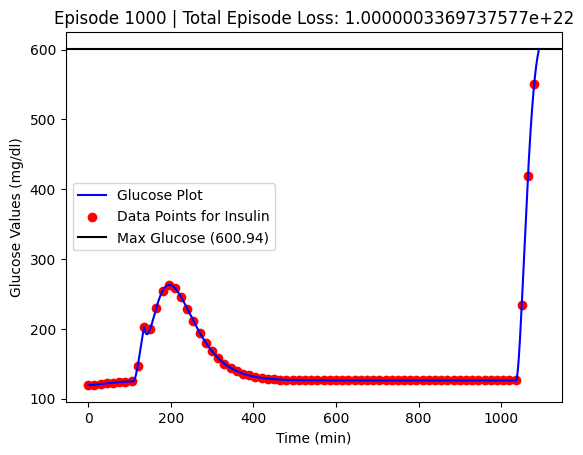

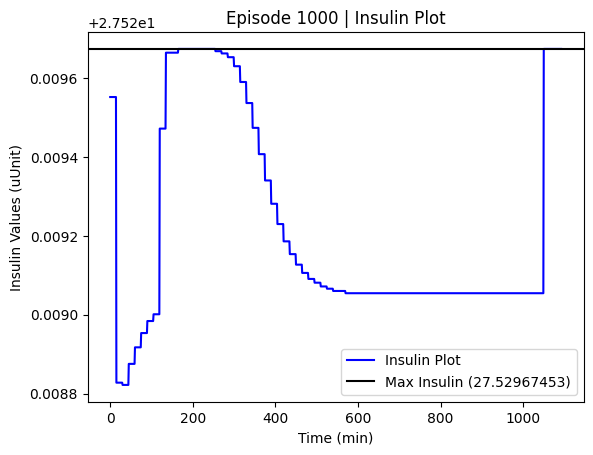

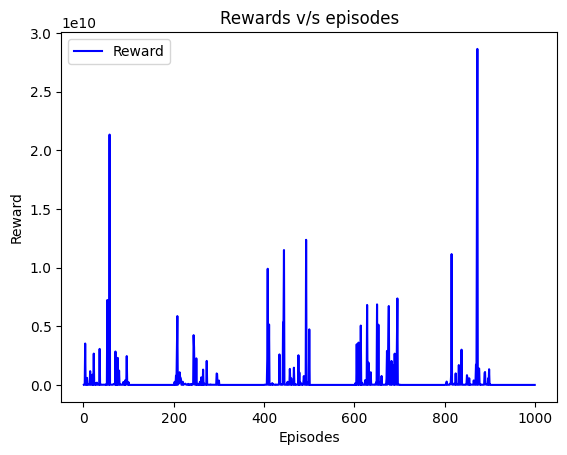

*** Epoch 5 Terminal Cases ***
*** Total 47 Terminal Cases ***


In [ ]:
train_env(model, episodes = 1000, show_work = 100, artif_epoch = 100)

In [ ]:
torch.save(model.state_dict(), f'{model.__class__.__name__}.pth')

In [ ]:
## Include in Paper
# Model that was talked about in paper (Similar model with fewer layers)

class NeuralNetwork_v5(nn.Module):
    def __init__(self, input_size, output_size):
        super(NeuralNetwork_v5, self).__init__()
        self.l1 = nn.Linear(input_size, 128)
        self.l2 = nn.Linear(128, 256)
        self.l3 = nn.Linear(256, 512)
        self.l4 = nn.Linear(512, 256)
        self.l5 = nn.Linear(256, 128)
        self.l6 = nn.Linear(128, 64)
        self.fc = nn.Linear(64, output_size)
        self.relu = nn.ReLU()
        self.sig = nn.Sigmoid()

    def forward(self, x):
        x = self.l1(x)
        x = self.l2(x)
        x = self.relu(x)
        x = self.l3(x)
        x = self.l4(x)
        x = self.relu(x)
        x = self.l5(x)
        x = self.l6(x)
        x = self.fc(x)
        x = self.sig(x)*50
        x = torch.clamp(x, min=0, max=50)
        # print(f"At C1: {x}")
        return x

In [ ]:
model = NeuralNetwork_v5(input_size, output_size).to(device)
optimizer = optim.Adam(model.parameters(), lr=0.01)
loss_function = nn.MSELoss()

In [ ]:
print(summary(model, torch.Tensor([1,2,3]).to(device), show_input=True))

-----------------------------------------------------------------------
      Layer (type)         Input Shape         Param #     Tr. Param #
          Linear-1                 [3]             512             512
          Linear-2               [128]          33,024          33,024
            ReLU-3               [256]               0               0
          Linear-4               [256]         131,584         131,584
          Linear-5               [512]         131,328         131,328
          Linear-6               [256]          32,896          32,896
          Linear-7               [128]           8,256           8,256
          Linear-8                [64]              65              65
         Sigmoid-9                 [1]               0               0
Total params: 337,665
Trainable params: 337,665
Non-trainable params: 0
-----------------------------------------------------------------------


In [ ]:
train_env(model, episodes = 2000, show_work = 200, artif_epoch = 200)

In [ ]:
class NeuralNetwork_v6(nn.Module):
    def __init__(self, input_size, output_size):
        super(NeuralNetwork_v6, self).__init__()
        self.l1 = nn.Linear(input_size, 128)
        self.l2 = nn.Linear(128, 256)
        self.l3 = nn.Linear(256, 512)
        self.l4 = nn.Linear(512, 256)
        self.l5 = nn.Linear(256, 128)
        self.l6 = nn.Linear(128, 64)
        self.fc = nn.Linear(64, output_size)
        self.relu = nn.ReLU()
        self.sig = nn.Sigmoid()

    def forward(self, x):
        x = self.l1(x)
        x = self.l2(x)
        x = self.relu(x)
        x = self.l3(x)
        x = self.l4(x)
        x = self.relu(x)
        x = self.l5(x)
        x = self.l6(x)
        x = self.relu(x)
        x = self.fc(x)
        x = torch.abs(self.sig(x)*50)
        x = torch.clamp(x, min=0, max=50)
        # print(f"At C1: {x}")
        return x

In [ ]:
model = NeuralNetwork_v6(input_size, output_size).to(device)
optimizer = optim.Adam(model.parameters(), lr=0.01)
loss_function = nn.MSELoss()

125 -> 2:05 (82g Carbs)
126 -> 2:06 (95g Carbs)
606 -> 10:06 (41g Carbs)
787 -> 13:07 (94g Carbs)
1207 -> 20:07 (23g Carbs)

Episode: 1 | Score (H<): 537,360,501,562.2502 | Max Time: 1441 | Max Glucose Level: 356.761 | Avg Insulin Given: 33.33136 | Carb / Insulin: 0.215
120 -> 2:00 (116g Carbs)
1002 -> 16:42 (10g Carbs)
1013 -> 16:53 (113g Carbs)
1109 -> 18:29 (70g Carbs)
1406 -> 23:26 (93g Carbs)

Episode: 2 | Score (H<): 347,329,409,905.5024 | Max Time: 1441 | Max Glucose Level: 334.441 | Avg Insulin Given: 32.4521 | Carb / Insulin: 0.222
220 -> 3:40 (20g Carbs)
438 -> 7:18 (14g Carbs)
946 -> 15:46 (43g Carbs)
1390 -> 23:10 (81g Carbs)

Episode: 3 | Score (H<): 42,154,431,403.90865 | Max Time: 1441 | Max Glucose Level: 241.78 | Avg Insulin Given: 32.03171 | Carb / Insulin: 0.22
106 -> 1:46 (85g Carbs)
368 -> 6:08 (39g Carbs)
517 -> 8:37 (10g Carbs)
1012 -> 16:52 (12g Carbs)

Episode: 4 | Score (H<): 163,980,965,908.27774 | Max Time: 1441 | Max Glucose Level: 314.229 | Avg Insulin Giv

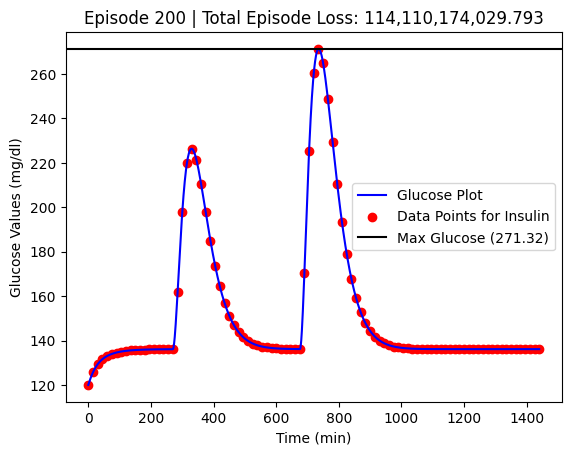

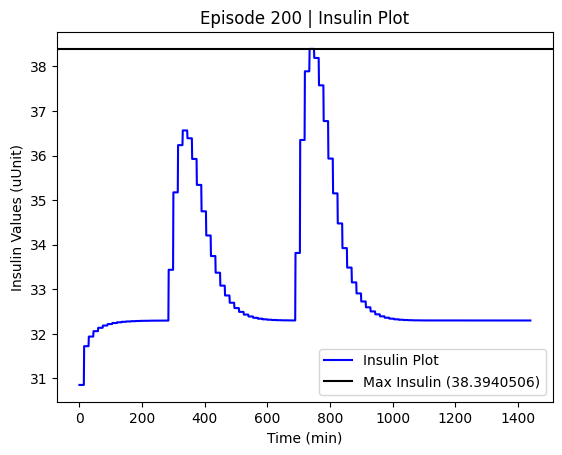

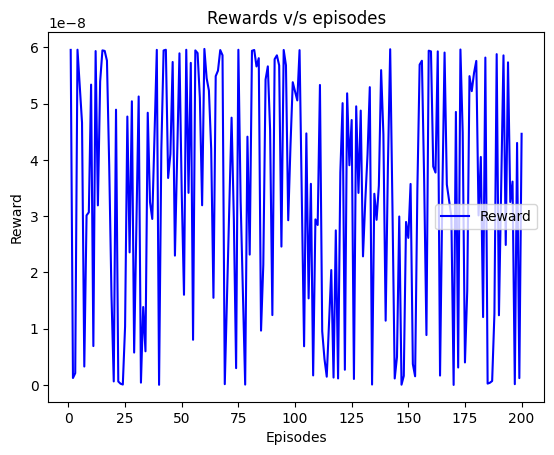

*** Epoch 4 Terminal Cases ***
*** Total 11 Terminal Cases ***
52 -> 0:52 (100g Carbs)
75 -> 1:15 (47g Carbs)
179 -> 2:59 (73g Carbs)

Episode: 201 | Score (H<): 603,772,721,598.6199 | Max Time: 1441 | Max Glucose Level: 382.03 | Avg Insulin Given: 33.49004 | Carb / Insulin: 0.212
44 -> 0:44 (68g Carbs)
1292 -> 21:32 (113g Carbs)

Episode: 202 | Score (H<): 144,921,521,434.49203 | Max Time: 1441 | Max Glucose Level: 302.771 | Avg Insulin Given: 32.65541 | Carb / Insulin: 0.216
531 -> 8:51 (104g Carbs)
688 -> 11:28 (64g Carbs)
1172 -> 19:32 (36g Carbs)
1331 -> 22:11 (79g Carbs)

Episode: 203 | Score (H<): 1,839,511,350,576.684 | Max Time: 1441 | Max Glucose Level: 469.575 | Avg Insulin Given: 34.84536 | Carb / Insulin: 0.205
512 -> 8:32 (17g Carbs)
1394 -> 23:14 (58g Carbs)

Episode: 204 | Score (H<): 59,192,020,587.25635 | Max Time: 1441 | Max Glucose Level: 308.175 | Avg Insulin Given: 31.8966 | Carb / Insulin: 0.219
927 -> 15:27 (10g Carbs)
1398 -> 23:18 (107g Carbs)

Episode: 205 | 

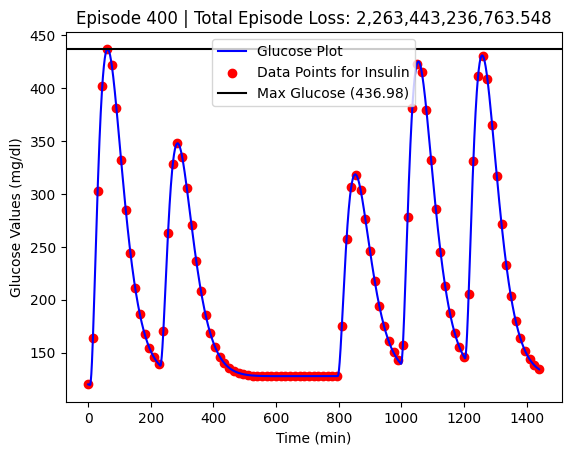

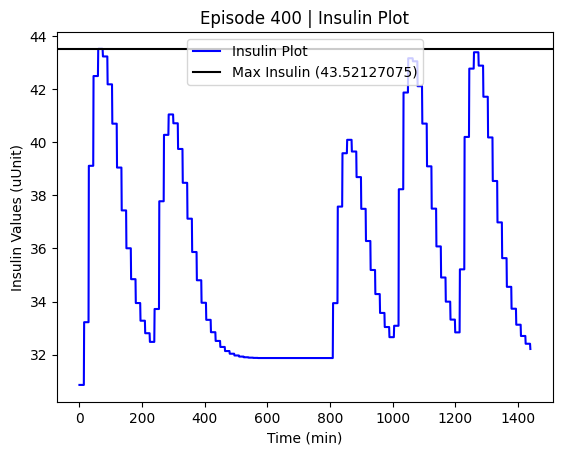

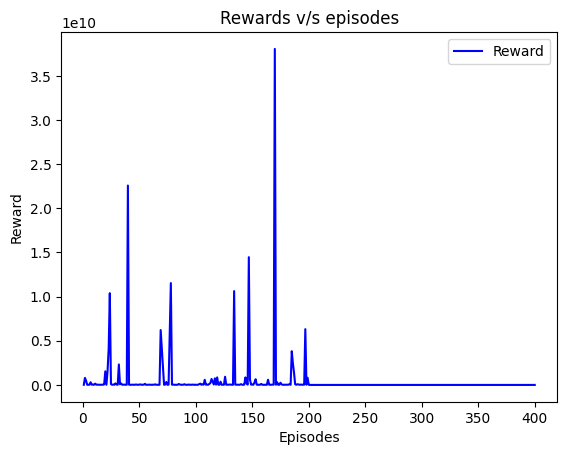

*** Epoch 3 Terminal Cases ***
*** Total 19 Terminal Cases ***
780 -> 13:00 (87g Carbs)
933 -> 15:33 (62g Carbs)
1276 -> 21:16 (26g Carbs)

Episode: 401 | Score (H<): 268,725,555,245.0165 | Max Time: 1441 | Max Glucose Level: 324.591 | Avg Insulin Given: 33.31134 | Carb / Insulin: 0.212
180 -> 3:00 (40g Carbs)
430 -> 7:10 (24g Carbs)
1242 -> 20:42 (78g Carbs)

Episode: 402 | Score (H<): 233,607,247,128.53714 | Max Time: 1441 | Max Glucose Level: 318.843 | Avg Insulin Given: 33.90552 | Carb / Insulin: 0.208
434 -> 7:14 (17g Carbs)
531 -> 8:51 (40g Carbs)
1149 -> 19:09 (110g Carbs)
1234 -> 20:34 (10g Carbs)

Episode: 403 | Score (H<): 621,475,237,794.4634 | Max Time: 1441 | Max Glucose Level: 427.227 | Avg Insulin Given: 33.1596 | Carb / Insulin: 0.213
298 -> 4:58 (110g Carbs)
988 -> 16:28 (117g Carbs)
1046 -> 17:26 (89g Carbs)
1354 -> 22:34 (81g Carbs)

Episode: 404 | Score (H<): 278,258,431,651.15607 | Max Time: 1441 | Max Glucose Level: 314.015 | Avg Insulin Given: 32.77581 | Carb / I

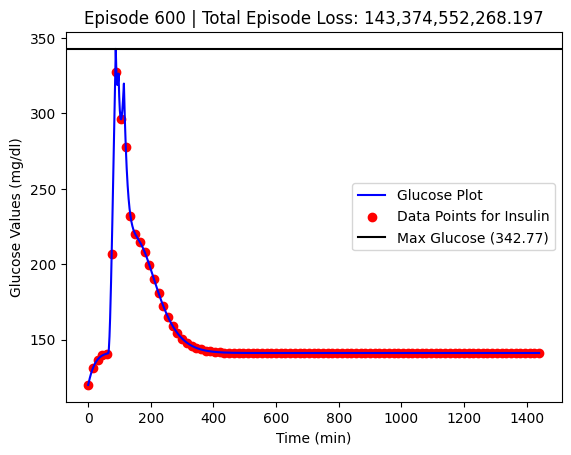

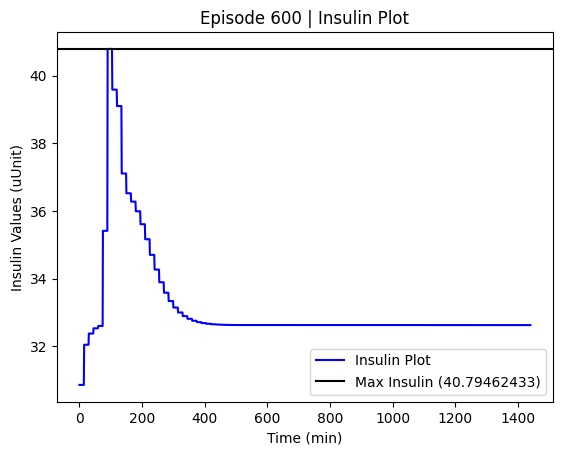

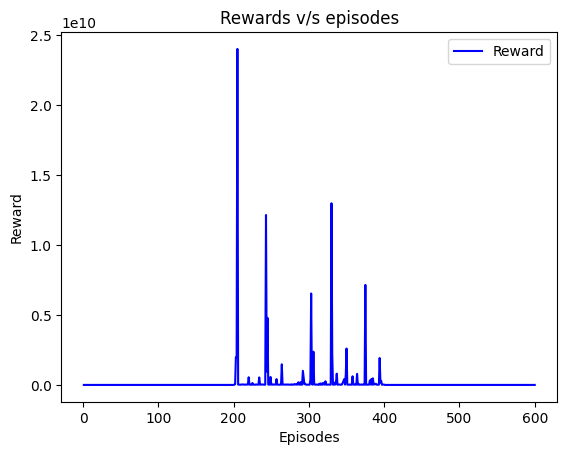

*** Epoch 3 Terminal Cases ***
*** Total 26 Terminal Cases ***
129 -> 2:09 (104g Carbs)
429 -> 7:09 (23g Carbs)

Episode: 601 | Score (H<): 1,425,905,242,053.8691 | Max Time: 1441 | Max Glucose Level: 500.978 | Avg Insulin Given: 32.74899 | Carb / Insulin: 0.215
98 -> 1:38 (18g Carbs)
222 -> 3:42 (97g Carbs)
386 -> 6:26 (62g Carbs)
549 -> 9:09 (46g Carbs)
1241 -> 20:41 (98g Carbs)

Episode: 602 | Score (H<): 179,584,593,305.7811 | Max Time: 1441 | Max Glucose Level: 277.443 | Avg Insulin Given: 33.38995 | Carb / Insulin: 0.214
74 -> 1:14 (11g Carbs)
414 -> 6:54 (112g Carbs)
665 -> 11:05 (12g Carbs)
1020 -> 17:00 (60g Carbs)

Episode: 603 | Score (H<): 198,894,572,958.657 | Max Time: 1441 | Max Glucose Level: 321.619 | Avg Insulin Given: 33.0553 | Carb / Insulin: 0.214
170 -> 2:50 (53g Carbs)
533 -> 8:53 (101g Carbs)
1350 -> 22:30 (68g Carbs)

Episode: 604 | Score (H<): 1,000,071,480,519.3282 | Max Time: 1441 | Max Glucose Level: 427.461 | Avg Insulin Given: 34.46234 | Carb / Insulin: 0

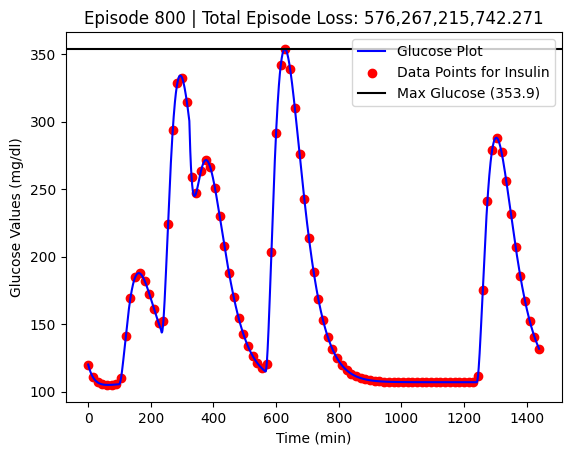

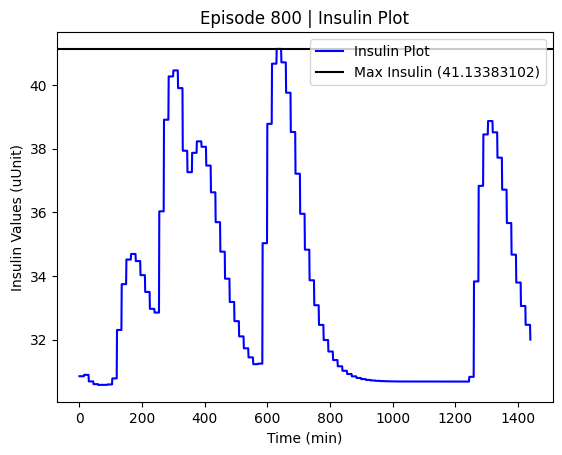

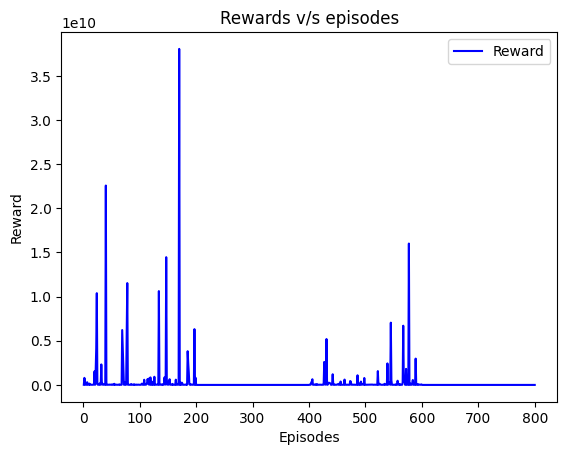

*** Epoch 6 Terminal Cases ***
*** Total 34 Terminal Cases ***
271 -> 4:31 (83g Carbs)
694 -> 11:34 (92g Carbs)
810 -> 13:30 (48g Carbs)

Episode: 801 | Score (H<): 152,993,195,487.77075 | Max Time: 1441 | Max Glucose Level: 286.404 | Avg Insulin Given: 32.28864 | Carb / Insulin: 0.22
18 -> 0:18 (47g Carbs)
376 -> 6:16 (102g Carbs)
1125 -> 18:45 (67g Carbs)

Episode: 802 | Score (H<): 1,937,780,727,968.2202 | Max Time: 1441 | Max Glucose Level: 487.565 | Avg Insulin Given: 35.40443 | Carb / Insulin: 0.2
857 -> 14:17 (27g Carbs)
1384 -> 23:04 (74g Carbs)

Episode: 803 | Score (H<): 156,235,244,966.61176 | Max Time: 1441 | Max Glucose Level: 375.814 | Avg Insulin Given: 32.34011 | Carb / Insulin: 0.217
156 -> 2:36 (120g Carbs)
705 -> 11:45 (89g Carbs)
1314 -> 21:54 (39g Carbs)

Episode: 804 | Score (H<): 2,770,281,271,143.755 | Max Time: 1441 | Max Glucose Level: 534.551 | Avg Insulin Given: 33.66572 | Carb / Insulin: 0.211
194 -> 3:14 (51g Carbs)
626 -> 10:26 (77g Carbs)
781 -> 13:01 (7

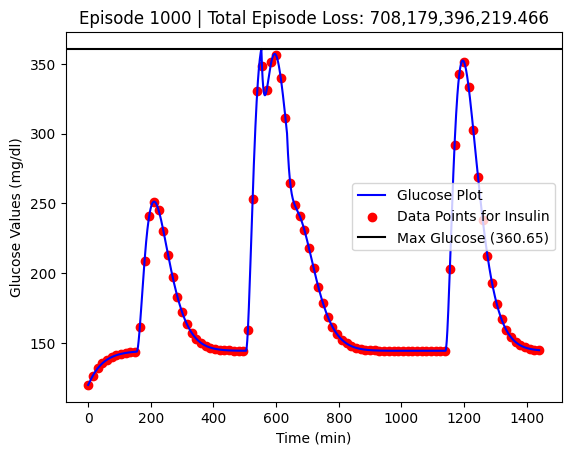

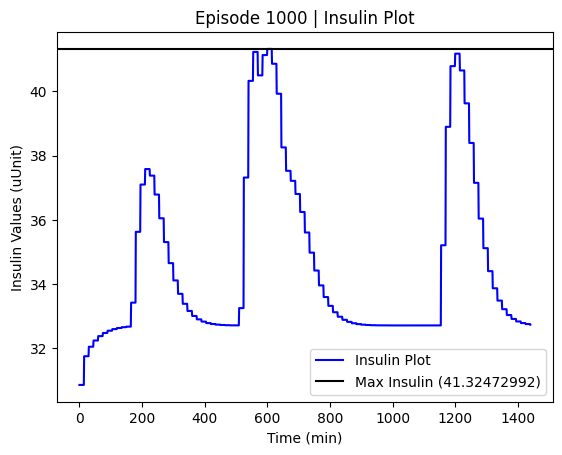

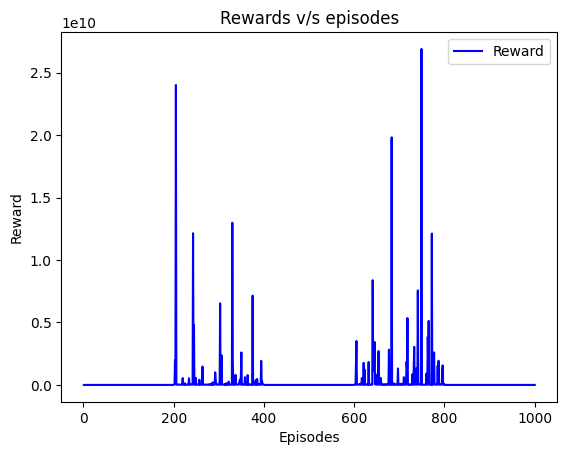

*** Epoch 7 Terminal Cases ***
*** Total 44 Terminal Cases ***
26 -> 0:26 (32g Carbs)
102 -> 1:42 (35g Carbs)
410 -> 6:50 (27g Carbs)
645 -> 10:45 (88g Carbs)
950 -> 15:50 (42g Carbs)

Episode: 1001 | Score (H<): 2,428,423,800,063.9756 | Max Time: 1441 | Max Glucose Level: 514.299 | Avg Insulin Given: 36.13704 | Carb / Insulin: 0.196
12 -> 0:12 (71g Carbs)
281 -> 4:41 (90g Carbs)
498 -> 8:18 (78g Carbs)
1069 -> 17:49 (49g Carbs)

Episode: 1002 | Score (H<): 538,671,837,930.2469 | Max Time: 1441 | Max Glucose Level: 354.404 | Avg Insulin Given: 33.84895 | Carb / Insulin: 0.211
258 -> 4:18 (91g Carbs)
682 -> 11:22 (44g Carbs)
724 -> 12:04 (88g Carbs)
1340 -> 22:20 (88g Carbs)

Episode: 1003 | Score (H<): 1,164,067,554,341.0288 | Max Time: 1441 | Max Glucose Level: 387.313 | Avg Insulin Given: 34.84464 | Carb / Insulin: 0.205
44 -> 0:44 (94g Carbs)
320 -> 5:20 (104g Carbs)
783 -> 13:03 (11g Carbs)
950 -> 15:50 (60g Carbs)

Episode: 1004 | Score (H<): 716,171,532,665.0258 | Max Time: 1441 

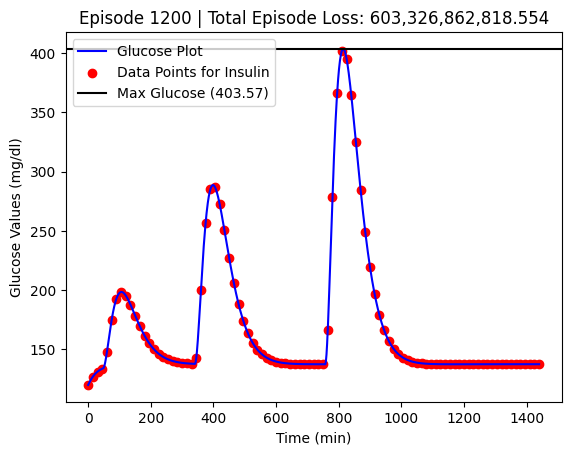

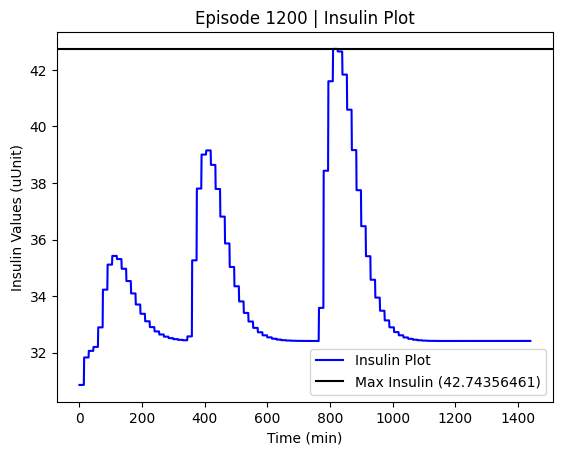

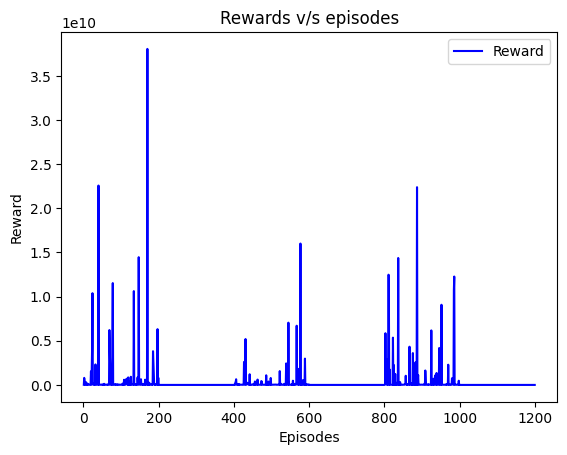

*** Epoch 2 Terminal Cases ***
*** Total 50 Terminal Cases ***
898 -> 14:58 (41g Carbs)
919 -> 15:19 (40g Carbs)

Episode: 1201 | Score (H<): 30,662,242,999.814056 | Max Time: 1441 | Max Glucose Level: 188.005 | Avg Insulin Given: 31.10084 | Carb / Insulin: 0.225
376 -> 6:16 (80g Carbs)
437 -> 7:17 (56g Carbs)
1141 -> 19:01 (47g Carbs)

Episode: 1202 | Score (H<): 206,908,924,724.51743 | Max Time: 1441 | Max Glucose Level: 313.883 | Avg Insulin Given: 33.06503 | Carb / Insulin: 0.214
545 -> 9:05 (38g Carbs)
546 -> 9:06 (15g Carbs)
768 -> 12:48 (56g Carbs)
1001 -> 16:41 (27g Carbs)

Episode: 1203 | Score (H<): 131,997,258,795.64838 | Max Time: 1441 | Max Glucose Level: 301.153 | Avg Insulin Given: 32.24805 | Carb / Insulin: 0.218
484 -> 8:04 (59g Carbs)
835 -> 13:55 (86g Carbs)
1211 -> 20:11 (87g Carbs)

Episode: 1204 | Score (H<): 104,166,557,175.85474 | Max Time: 1441 | Max Glucose Level: 255.399 | Avg Insulin Given: 32.49872 | Carb / Insulin: 0.218
173 -> 2:53 (61g Carbs)
635 -> 10:3

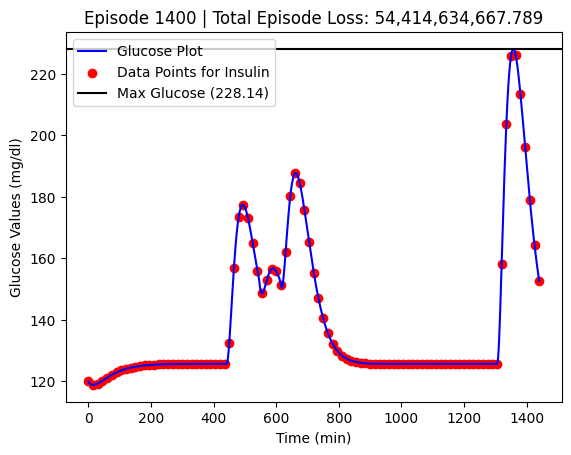

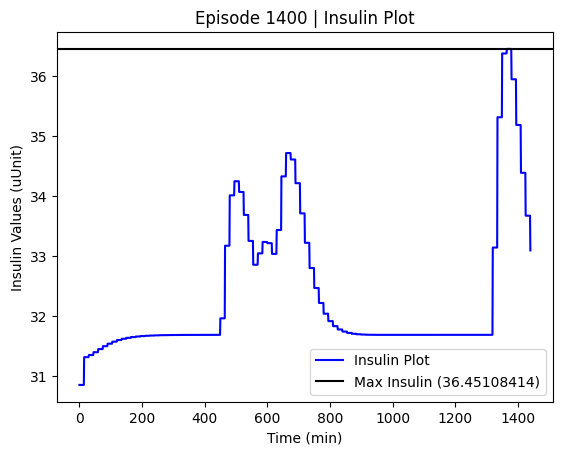

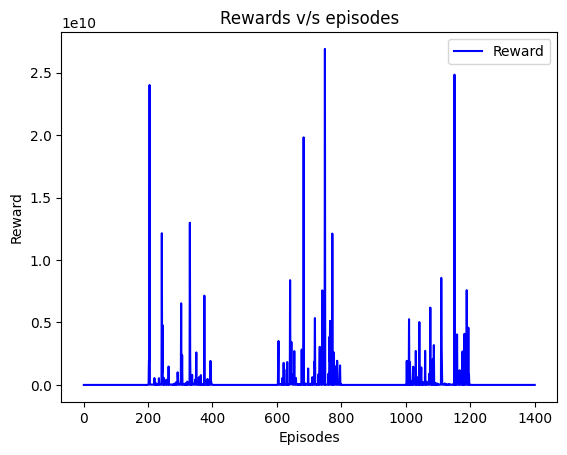

*** Epoch 4 Terminal Cases ***
*** Total 58 Terminal Cases ***
14 -> 0:14 (109g Carbs)
579 -> 9:39 (29g Carbs)
1383 -> 23:03 (67g Carbs)
1412 -> 23:32 (73g Carbs)

Episode: 1401 | Score (H<): 108,351,115,423.92651 | Max Time: 1441 | Max Glucose Level: 272.87 | Avg Insulin Given: 33.29565 | Carb / Insulin: 0.214
167 -> 2:47 (34g Carbs)
1200 -> 20:00 (25g Carbs)

Episode: 1402 | Score (H<): 26,141,523,837.405132 | Max Time: 1441 | Max Glucose Level: 152.719 | Avg Insulin Given: 30.83315 | Carb / Insulin: 0.226
539 -> 8:59 (61g Carbs)
1021 -> 17:01 (69g Carbs)

Episode: 1403 | Score (H<): 104,266,011,840.49283 | Max Time: 1441 | Max Glucose Level: 260.723 | Avg Insulin Given: 32.2411 | Carb / Insulin: 0.218
300 -> 5:00 (84g Carbs)
1190 -> 19:50 (26g Carbs)
1341 -> 22:21 (22g Carbs)

Episode: 1404 | Score (H<): 464,172,261,635.6858 | Max Time: 1441 | Max Glucose Level: 384.665 | Avg Insulin Given: 32.98553 | Carb / Insulin: 0.213
109 -> 1:49 (38g Carbs)
220 -> 3:40 (108g Carbs)
631 -> 10:3

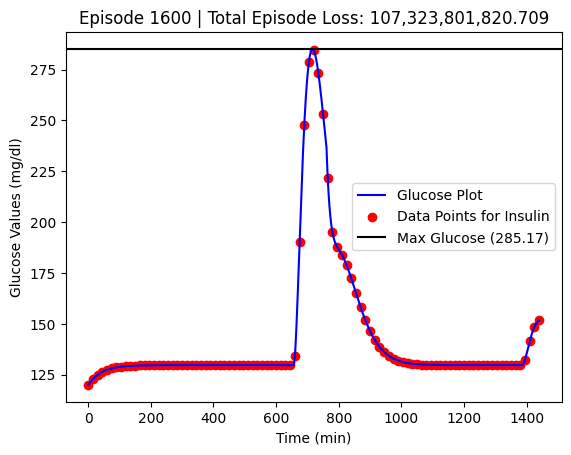

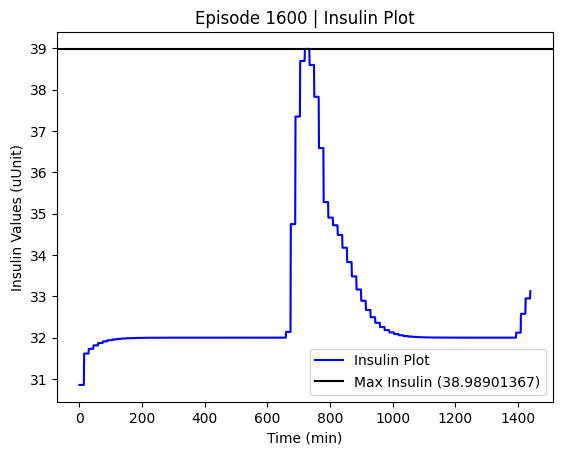

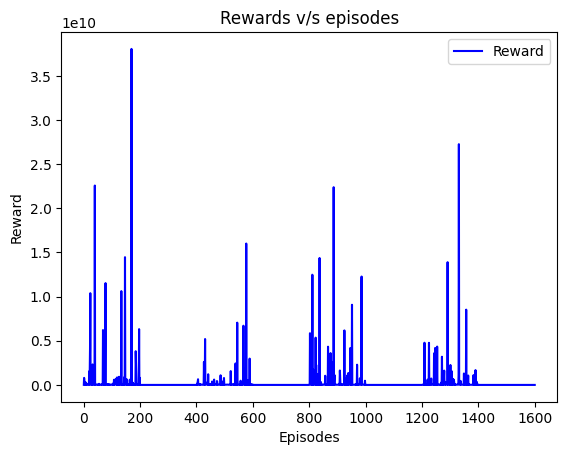

*** Epoch 1 Terminal Cases ***
*** Total 64 Terminal Cases ***
657 -> 10:57 (116g Carbs)
1044 -> 17:24 (50g Carbs)
1089 -> 18:09 (59g Carbs)

Episode: 1601 | Score (H<): 623,530,306,396.3175 | Max Time: 1441 | Max Glucose Level: 418.673 | Avg Insulin Given: 33.22 | Carb / Insulin: 0.214
93 -> 1:33 (104g Carbs)
200 -> 3:20 (12g Carbs)
628 -> 10:28 (108g Carbs)
1135 -> 18:55 (105g Carbs)
1335 -> 22:15 (62g Carbs)

Episode: 1602 | Score (H<): 5,709,362,373,149.341 | Max Time: 1441 | Max Glucose Level: 518.948 | Avg Insulin Given: 36.48818 | Carb / Insulin: 0.198
574 -> 9:34 (62g Carbs)
1031 -> 17:11 (95g Carbs)
1059 -> 17:39 (77g Carbs)
1314 -> 21:54 (114g Carbs)

Episode: 1603 | Score (H<): 2,817,856,842,147.6216 | Max Time: 1441 | Max Glucose Level: 520.934 | Avg Insulin Given: 34.80254 | Carb / Insulin: 0.206
681 -> 11:21 (67g Carbs)
1012 -> 16:52 (101g Carbs)
1094 -> 18:14 (92g Carbs)
1244 -> 20:44 (35g Carbs)
1433 -> 23:53 (31g Carbs)

Episode: 1604 | Score (H<): 184,987,844,178.7316

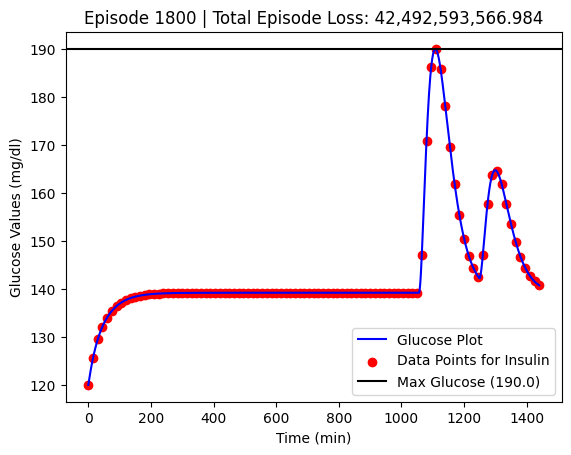

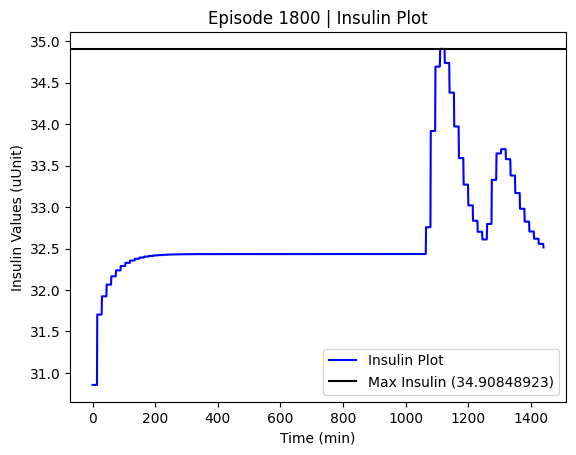

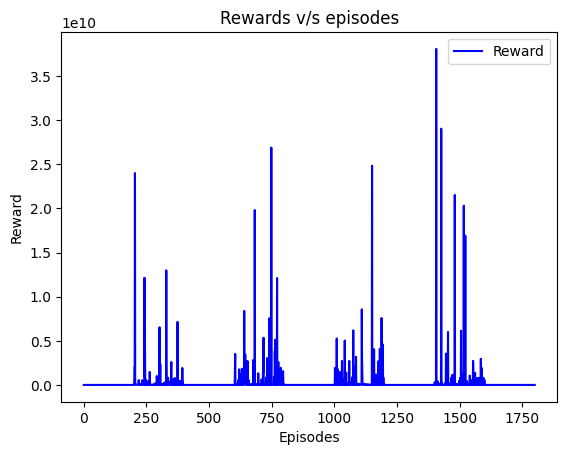

*** Epoch 4 Terminal Cases ***
*** Total 70 Terminal Cases ***
1107 -> 18:27 (78g Carbs)
1302 -> 21:42 (59g Carbs)

Episode: 1801 | Score (H<): 177,628,226,222.7472 | Max Time: 1441 | Max Glucose Level: 302.416 | Avg Insulin Given: 33.37613 | Carb / Insulin: 0.211
265 -> 4:25 (85g Carbs)
1076 -> 17:56 (116g Carbs)
1237 -> 20:37 (65g Carbs)
1393 -> 23:13 (80g Carbs)

Episode: 1802 | Score (H<): 3,984,872,041,025.6216 | Max Time: 1441 | Max Glucose Level: 563.32 | Avg Insulin Given: 34.69788 | Carb / Insulin: 0.207
305 -> 5:05 (110g Carbs)
320 -> 5:20 (109g Carbs)
1011 -> 16:51 (72g Carbs)
1018 -> 16:58 (25g Carbs)

Episode: 1803 | Score (H<): 1,535,395,317,854.7573 | Max Time: 1441 | Max Glucose Level: 484.986 | Avg Insulin Given: 34.09234 | Carb / Insulin: 0.21
704 -> 11:44 (80g Carbs)
725 -> 12:05 (112g Carbs)
782 -> 13:02 (38g Carbs)
789 -> 13:09 (85g Carbs)
880 -> 14:40 (99g Carbs)

Episode: 1804 | Score (H<): 809,565,822,998.8317 | Max Time: 1441 | Max Glucose Level: 404.848 | Avg 

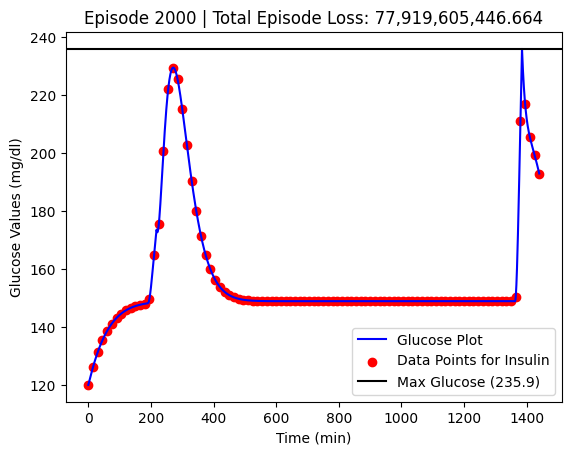

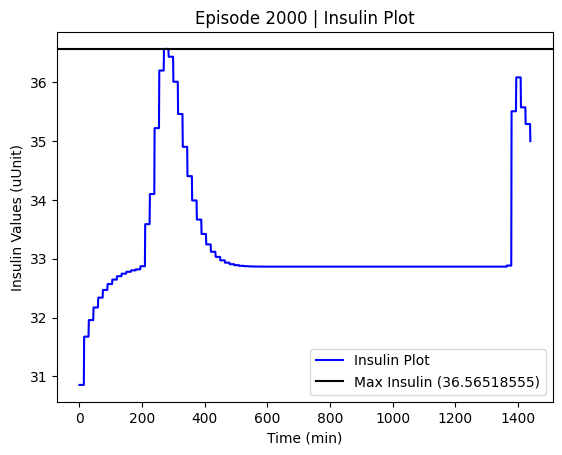

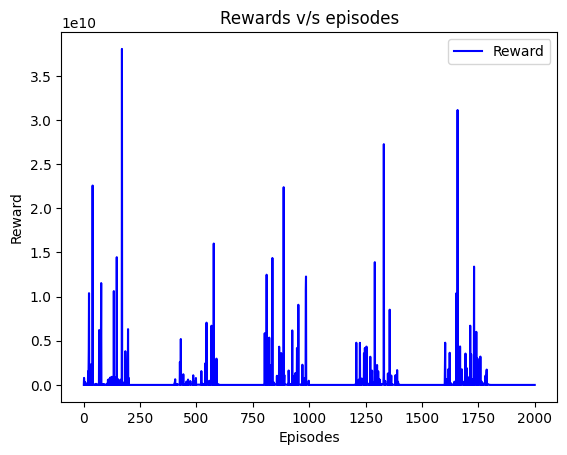

*** Epoch 2 Terminal Cases ***
*** Total 72 Terminal Cases ***


In [ ]:
train_env(model, episodes = 2000, show_work = 200, artif_epoch = 100)

In [ ]:
## Include in Paper
## New Model Iter. 1

class NeuralNetwork_v7(nn.Module):
    def __init__(self, input_size, output_size, n_check=20, num_layers_lstm=5):
        super(NeuralNetwork_v7, self).__init__()
        self.input_size = input_size
        self.output_size = output_size
        self.num_layers_lstm = num_layers_lstm
        self.n_check = n_check
        self.lstm = nn.LSTM(input_size, hidden_size=n_check, num_layers=num_layers_lstm, batch_first=True)
        self.h1 = nn.Linear(n_check, 32)
        self.h2 = nn.Linear(32, 16)
        self.h3 = nn.Linear(16, 8)
        self.fc = nn.Linear(8, output_size)
        self.fc2 = nn.Linear(num_layers_lstm, 1)
        self.relu = nn.ReLU()
        self.sig = nn.Sigmoid()
        self.tanh = nn.Tanh()
        self.c = True
        self.p  = 0.5

    def forward(self, x):
        x, (h0, c0) = self.lstm(x)
        x = h0
        x = self.h1(x)
        x = self.relu(x)
        x = self.h2(x)
        x = self.relu(x)
        x = self.h3(x)
        x = self.relu(x)
        x = self.fc(x)
        x = self.fc2(x.T)
        x = self.sig(x)
        if self.c:
            self.c = False
            self.p = x
            print(x)
        x = (((x )/self.p) - 1) * 12500 * 45 # To increase range from (1.000 to 1.0020) t0 (0 to 50ish)
        return torch.clamp(x, min=0, max=50)



In [ ]:
model = NeuralNetwork_v7(input_size, output_size).to(device)
optimizer = optim.Adam(model.parameters(), lr=0.001)
loss_function = nn.MSELoss()

In [ ]:
print(summary(model, torch.Tensor([[1,2,3]]).to(device), show_input=True))

tensor([[0.3954]], device='cuda:0', grad_fn=<SigmoidBackward0>)
-----------------------------------------------------------------------
      Layer (type)         Input Shape         Param #     Tr. Param #
            LSTM-1              [1, 3]          15,440          15,440
          Linear-2             [5, 20]             672             672
            ReLU-3             [5, 32]               0               0
          Linear-4             [5, 32]             528             528
          Linear-5             [5, 16]             136             136
          Linear-6              [5, 8]               9               9
          Linear-7              [1, 5]               6               6
         Sigmoid-8              [1, 1]               0               0
Total params: 16,791
Trainable params: 16,791
Non-trainable params: 0
-----------------------------------------------------------------------


236 -> 3:56 (45g Carbs)
441 -> 7:21 (80g Carbs)
798 -> 13:18 (106g Carbs)
1375 -> 22:55 (115g Carbs)

Episode: 1 | Score (H<): 1.0000004746921128e+22 | Max Time: 838 | Max Glucose Level: 608.288 | Avg Insulin Given: 24.08283 | Carb / Insulin: 0.513
155 -> 2:35 (50g Carbs)
924 -> 15:24 (60g Carbs)

Episode: 2 | Score (H<): 78,857,909,126.49442 | Max Time: 1441 | Max Glucose Level: 269.881 | Avg Insulin Given: 12.36431 | Carb / Insulin: 0.567
128 -> 2:08 (36g Carbs)
171 -> 2:51 (102g Carbs)
991 -> 16:31 (11g Carbs)
1058 -> 17:38 (48g Carbs)
1253 -> 20:53 (46g Carbs)

Episode: 3 | Score (H<): 577,476,839,831.5796 | Max Time: 1441 | Max Glucose Level: 389.577 | Avg Insulin Given: 18.32176 | Carb / Insulin: 0.388
1014 -> 16:54 (98g Carbs)
1053 -> 17:33 (73g Carbs)
1124 -> 18:44 (29g Carbs)
1138 -> 18:58 (63g Carbs)
1270 -> 21:10 (108g Carbs)

Episode: 4 | Score (H<): 1,610,684,543,665.3281 | Max Time: 1441 | Max Glucose Level: 463.563 | Avg Insulin Given: 11.32019 | Carb / Insulin: 0.636
81

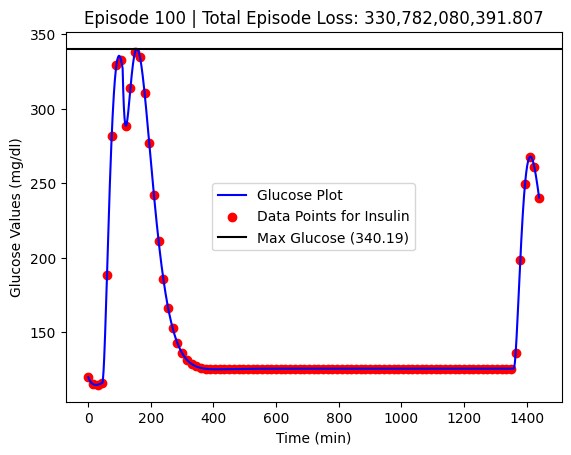

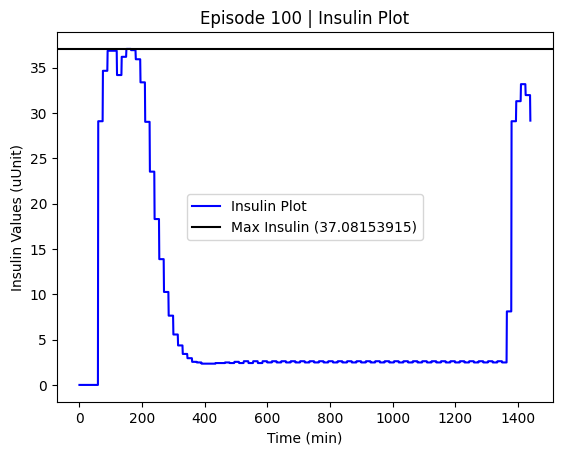

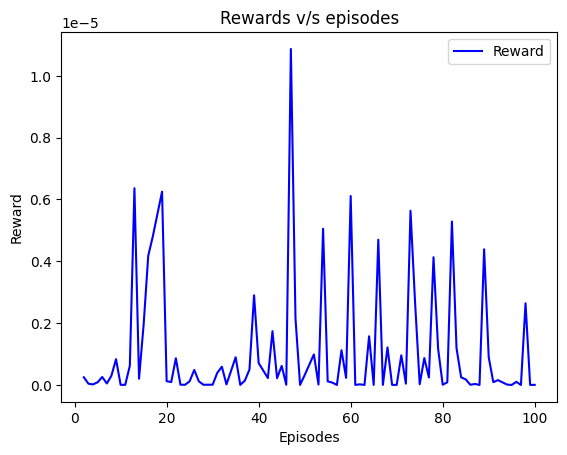

*** Epoch 6 Terminal Cases ***
*** Total 6 Terminal Cases ***
49 -> 0:49 (73g Carbs)
150 -> 2:30 (76g Carbs)
194 -> 3:14 (84g Carbs)
1242 -> 20:42 (117g Carbs)
1358 -> 22:38 (45g Carbs)

Episode: 101 | Score (H<): 4,817,251,095,425.45 | Max Time: 1441 | Max Glucose Level: 577.943 | Avg Insulin Given: 15.22349 | Carb / Insulin: 0.474
417 -> 6:57 (84g Carbs)
843 -> 14:03 (94g Carbs)
1039 -> 17:19 (120g Carbs)
1331 -> 22:11 (120g Carbs)

Episode: 102 | Score (H<): 1,964,634,780,691.033 | Max Time: 1441 | Max Glucose Level: 434.471 | Avg Insulin Given: 20.09851 | Carb / Insulin: 0.36
191 -> 3:11 (120g Carbs)
1104 -> 18:24 (21g Carbs)
1158 -> 19:18 (14g Carbs)

Episode: 103 | Score (H<): 230,121,311,367.0905 | Max Time: 1441 | Max Glucose Level: 353.822 | Avg Insulin Given: 5.99207 | Carb / Insulin: 1.176
553 -> 9:13 (77g Carbs)
1282 -> 21:22 (40g Carbs)

Episode: 104 | Score (H<): 89,768,881,654.07628 | Max Time: 1441 | Max Glucose Level: 294.108 | Avg Insulin Given: 9.49932 | Carb / Insul

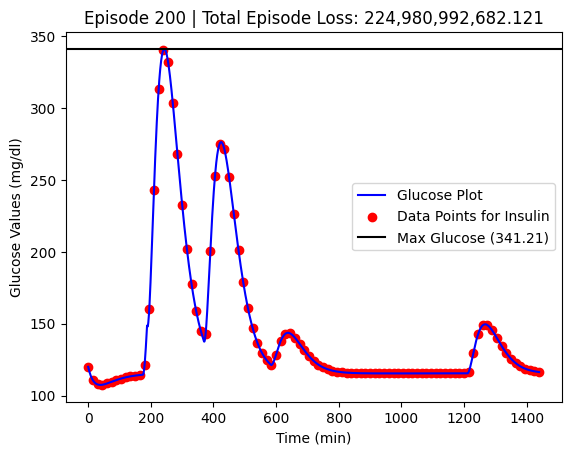

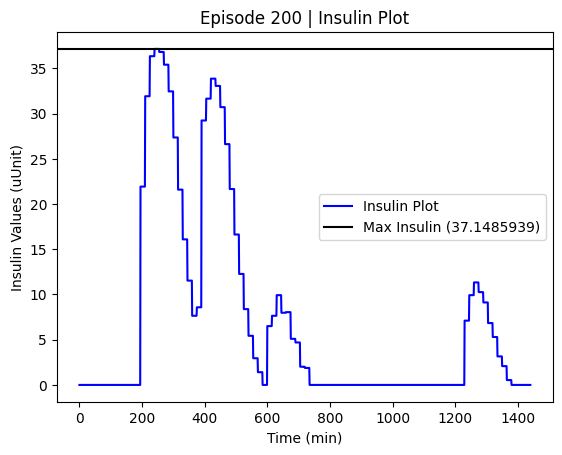

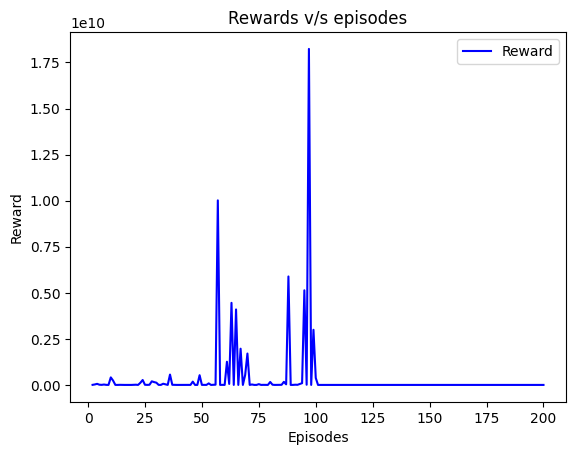

*** Epoch 6 Terminal Cases ***
*** Total 12 Terminal Cases ***
470 -> 7:50 (54g Carbs)
767 -> 12:47 (91g Carbs)
1435 -> 23:55 (65g Carbs)

Episode: 201 | Score (H<): 190,172,700,709.2301 | Max Time: 1441 | Max Glucose Level: 335.235 | Avg Insulin Given: 5.71417 | Carb / Insulin: 1.24
192 -> 3:12 (10g Carbs)
981 -> 16:21 (97g Carbs)
1173 -> 19:33 (111g Carbs)
1226 -> 20:26 (68g Carbs)
1400 -> 23:20 (76g Carbs)

Episode: 202 | Score (H<): 1,173,503,745,105.9426 | Max Time: 1441 | Max Glucose Level: 447.252 | Avg Insulin Given: 14.36997 | Carb / Insulin: 0.5
86 -> 1:26 (60g Carbs)
304 -> 5:04 (11g Carbs)
628 -> 10:28 (30g Carbs)

Episode: 203 | Score (H<): 65,317,804,163.12507 | Max Time: 1441 | Max Glucose Level: 265.952 | Avg Insulin Given: 12.03588 | Carb / Insulin: 0.582
96 -> 1:36 (67g Carbs)
374 -> 6:14 (15g Carbs)

Episode: 204 | Score (H<): 299,508,341,153.0323 | Max Time: 1441 | Max Glucose Level: 370.273 | Avg Insulin Given: 8.31741 | Carb / Insulin: 0.841
862 -> 14:22 (60g Carb

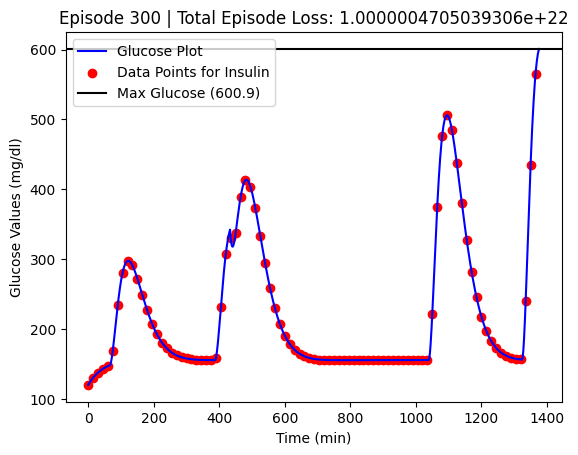

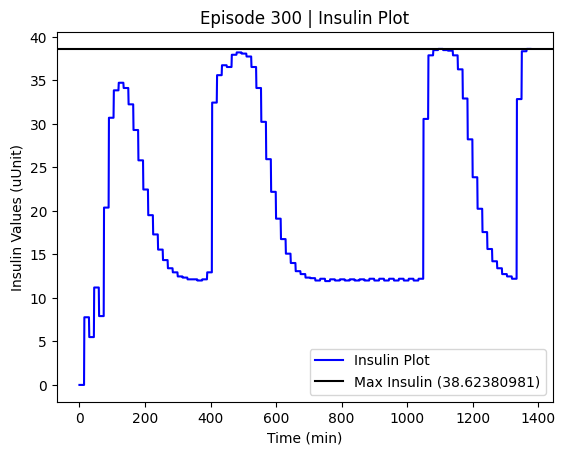

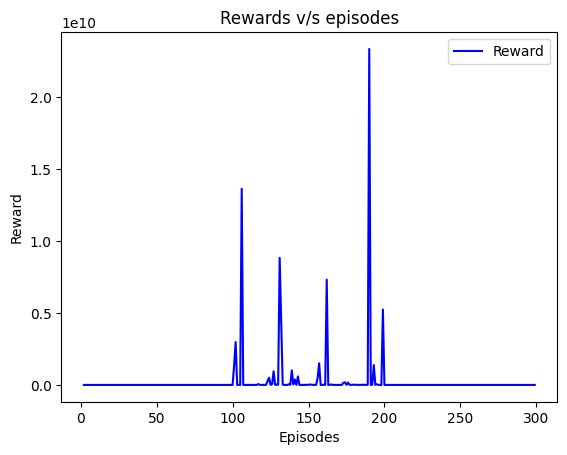

*** Epoch 4 Terminal Cases ***
*** Total 16 Terminal Cases ***
60 -> 1:00 (42g Carbs)
97 -> 1:37 (83g Carbs)
837 -> 13:57 (79g Carbs)
1147 -> 19:07 (56g Carbs)
1238 -> 20:38 (71g Carbs)

Episode: 301 | Score (H<): 135,172,765,262.33058 | Max Time: 1441 | Max Glucose Level: 272.939 | Avg Insulin Given: 13.46177 | Carb / Insulin: 0.532
200 -> 3:20 (33g Carbs)
798 -> 13:18 (77g Carbs)
1358 -> 22:38 (78g Carbs)

Episode: 302 | Score (H<): 207,536,672,703.29028 | Max Time: 1441 | Max Glucose Level: 311.708 | Avg Insulin Given: 12.11573 | Carb / Insulin: 0.583
62 -> 1:02 (118g Carbs)
116 -> 1:56 (84g Carbs)
1013 -> 16:53 (82g Carbs)
1333 -> 22:13 (88g Carbs)

Episode: 303 | Score (H<): 1.000000475110342e+22 | Max Time: 108 | Max Glucose Level: 606.143 | Avg Insulin Given: 15.69651 | Carb / Insulin: 6.114
138 -> 2:18 (36g Carbs)
443 -> 7:23 (104g Carbs)
515 -> 8:35 (104g Carbs)
610 -> 10:10 (108g Carbs)

Episode: 304 | Score (H<): 2,283,686,184,212.814 | Max Time: 1441 | Max Glucose Level: 44

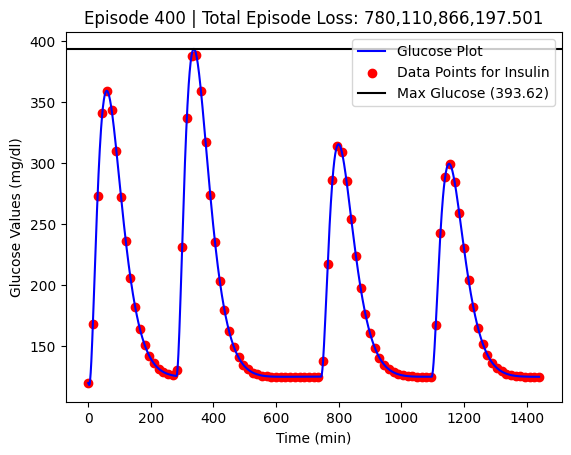

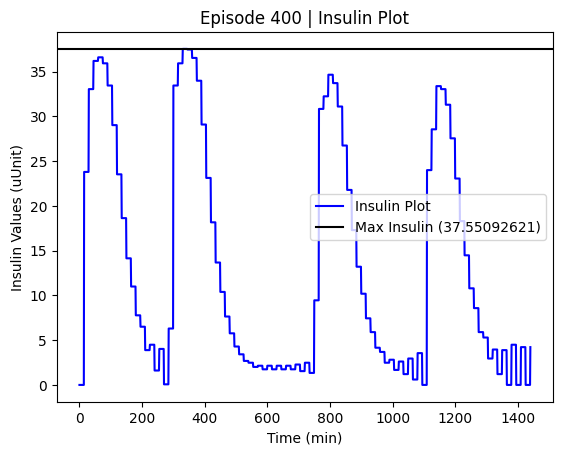

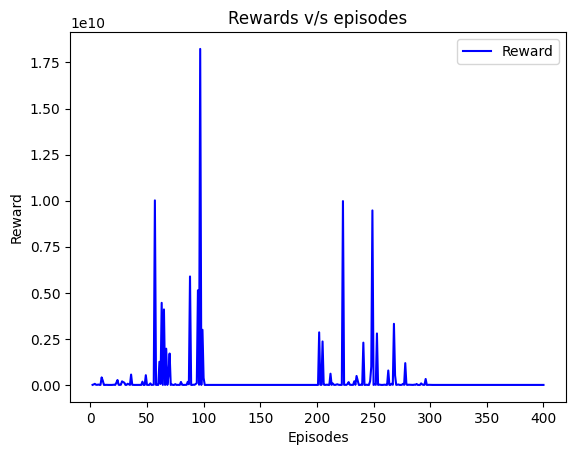

*** Epoch 6 Terminal Cases ***
*** Total 22 Terminal Cases ***
35 -> 0:35 (77g Carbs)
921 -> 15:21 (19g Carbs)
951 -> 15:51 (64g Carbs)
1009 -> 16:49 (110g Carbs)

Episode: 401 | Score (H<): 232,210,904,774.5676 | Max Time: 1441 | Max Glucose Level: 335.331 | Avg Insulin Given: 11.54504 | Carb / Insulin: 0.617
623 -> 10:23 (34g Carbs)
1202 -> 20:02 (83g Carbs)
1270 -> 21:10 (37g Carbs)

Episode: 402 | Score (H<): 112,371,704,744.6245 | Max Time: 1441 | Max Glucose Level: 319.46 | Avg Insulin Given: 7.67692 | Carb / Insulin: 0.918
364 -> 6:04 (29g Carbs)
539 -> 8:59 (60g Carbs)
561 -> 9:21 (93g Carbs)
1278 -> 21:18 (46g Carbs)

Episode: 403 | Score (H<): 153,235,254,657.1923 | Max Time: 1441 | Max Glucose Level: 316.779 | Avg Insulin Given: 13.36586 | Carb / Insulin: 0.531
574 -> 9:34 (37g Carbs)
715 -> 11:55 (69g Carbs)
1198 -> 19:58 (84g Carbs)
1318 -> 21:58 (86g Carbs)
1364 -> 22:44 (117g Carbs)

Episode: 404 | Score (H<): 1,431,454,947,856.8867 | Max Time: 1441 | Max Glucose Level: 

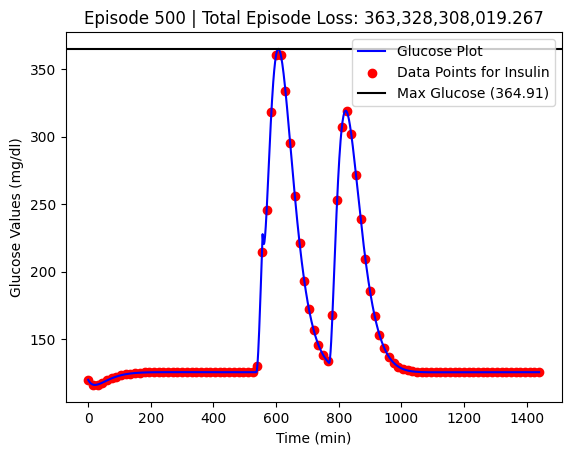

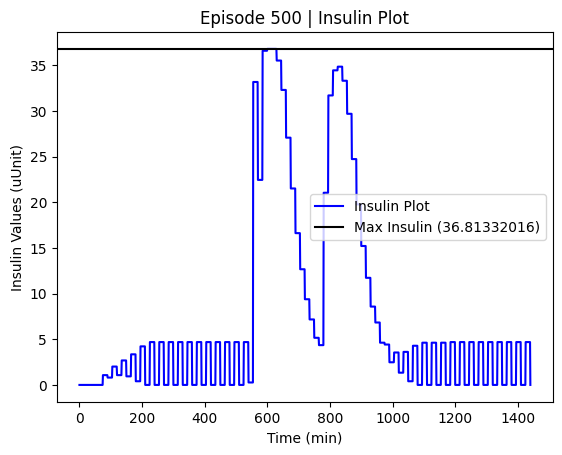

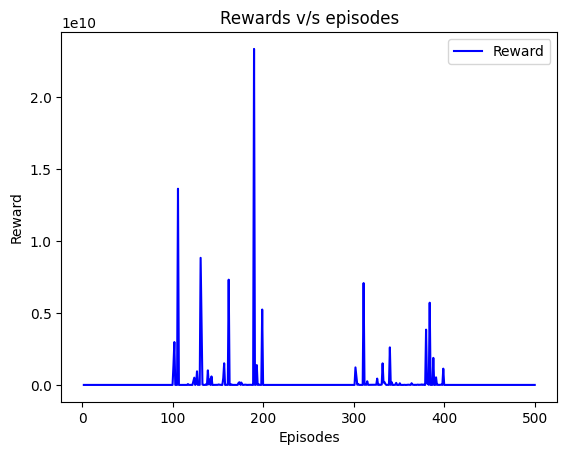

*** Epoch 6 Terminal Cases ***
*** Total 28 Terminal Cases ***
487 -> 8:07 (11g Carbs)
762 -> 12:42 (55g Carbs)

Episode: 501 | Score (H<): 435,972,941,244.01 | Max Time: 1441 | Max Glucose Level: 380.728 | Avg Insulin Given: 15.3852 | Carb / Insulin: 0.454
1007 -> 16:47 (39g Carbs)
1307 -> 21:47 (71g Carbs)

Episode: 502 | Score (H<): 89,190,490,146.26048 | Max Time: 1441 | Max Glucose Level: 301.736 | Avg Insulin Given: 3.93755 | Carb / Insulin: 1.781
1149 -> 19:09 (38g Carbs)
1162 -> 19:22 (120g Carbs)
1257 -> 20:57 (17g Carbs)
1373 -> 22:53 (86g Carbs)

Episode: 503 | Score (H<): 143,943,072,723.36713 | Max Time: 1441 | Max Glucose Level: 325.595 | Avg Insulin Given: 3.81735 | Carb / Insulin: 1.865
203 -> 3:23 (25g Carbs)
559 -> 9:19 (42g Carbs)
1100 -> 18:20 (80g Carbs)

Episode: 504 | Score (H<): 665,971,650,510.9137 | Max Time: 1441 | Max Glucose Level: 413.394 | Avg Insulin Given: 19.75765 | Carb / Insulin: 0.356
909 -> 15:09 (47g Carbs)
1056 -> 17:36 (35g Carbs)
1082 -> 18:02 

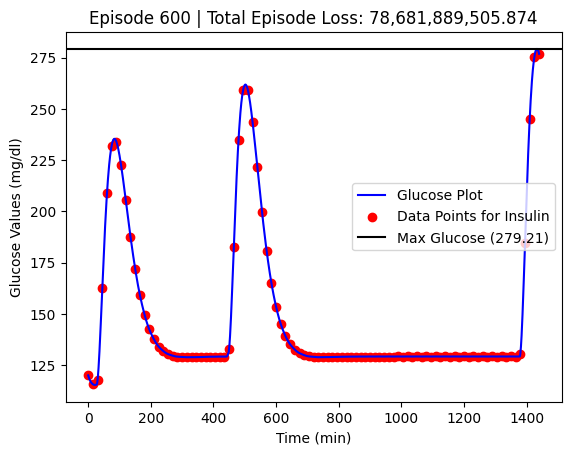

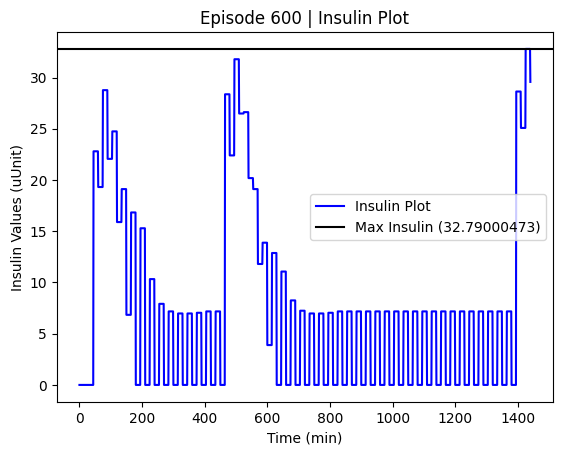

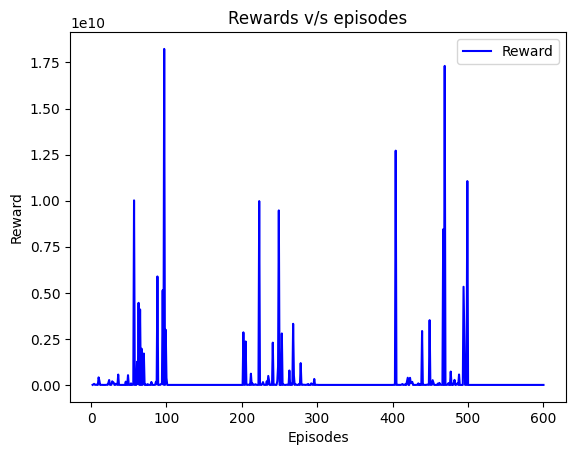

*** Epoch 5 Terminal Cases ***
*** Total 33 Terminal Cases ***
615 -> 10:15 (73g Carbs)
624 -> 10:24 (94g Carbs)
628 -> 10:28 (114g Carbs)
1242 -> 20:42 (119g Carbs)

Episode: 601 | Score (H<): 2,702,568,445,541.923 | Max Time: 1441 | Max Glucose Level: 508.34 | Avg Insulin Given: 11.34318 | Carb / Insulin: 0.636
812 -> 13:32 (43g Carbs)
1129 -> 18:49 (45g Carbs)
1279 -> 21:19 (28g Carbs)

Episode: 602 | Score (H<): 160,622,708,839.89984 | Max Time: 1441 | Max Glucose Level: 289.039 | Avg Insulin Given: 13.95521 | Carb / Insulin: 0.503
65 -> 1:05 (41g Carbs)
870 -> 14:30 (29g Carbs)
1322 -> 22:02 (101g Carbs)

Episode: 603 | Score (H<): 451,577,622,436.52545 | Max Time: 1441 | Max Glucose Level: 397.098 | Avg Insulin Given: 13.51705 | Carb / Insulin: 0.522
83 -> 1:23 (36g Carbs)
297 -> 4:57 (109g Carbs)
558 -> 9:18 (14g Carbs)

Episode: 604 | Score (H<): 471,530,156,723.9951 | Max Time: 1441 | Max Glucose Level: 399.268 | Avg Insulin Given: 18.87453 | Carb / Insulin: 0.373
192 -> 3:12 

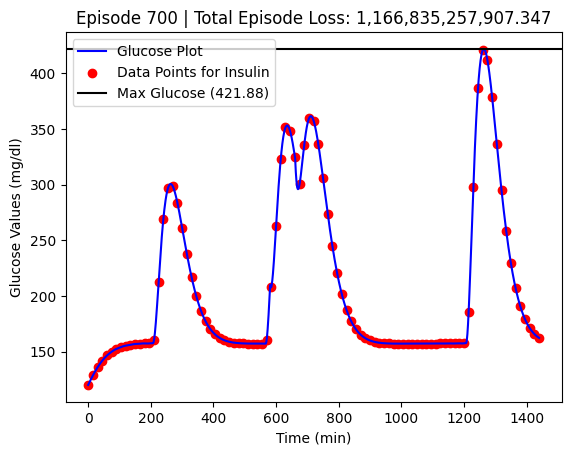

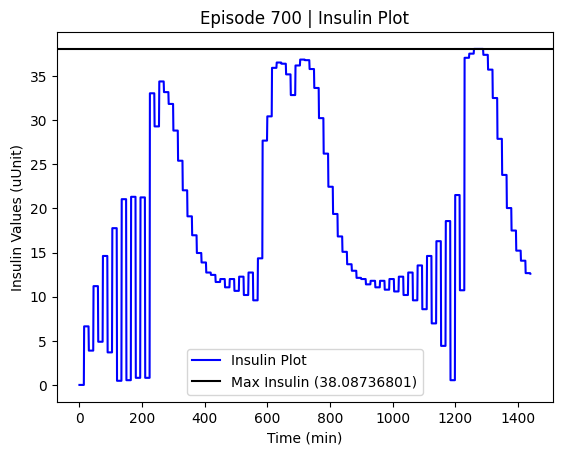

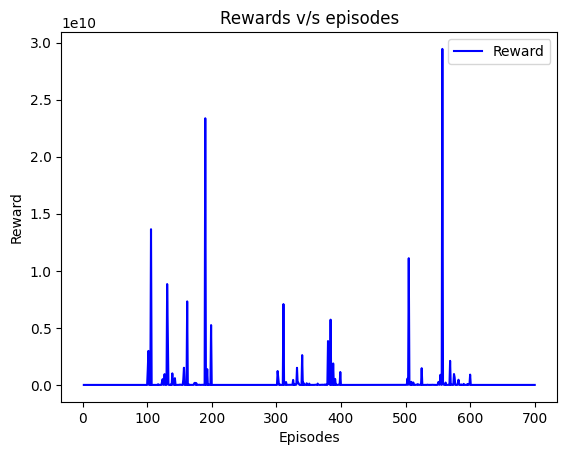

*** Epoch 2 Terminal Cases ***
*** Total 35 Terminal Cases ***
11 -> 0:11 (100g Carbs)
165 -> 2:45 (86g Carbs)
343 -> 5:43 (96g Carbs)
365 -> 6:05 (46g Carbs)
557 -> 9:17 (39g Carbs)

Episode: 701 | Score (H<): 1.000000471532452e+22 | Max Time: 60 | Max Glucose Level: 604.657 | Avg Insulin Given: 21.39062 | Carb / Insulin: 8.07
443 -> 7:23 (12g Carbs)
964 -> 16:04 (118g Carbs)
1181 -> 19:41 (108g Carbs)

Episode: 702 | Score (H<): 2,359,500,876,307.933 | Max Time: 1441 | Max Glucose Level: 495.845 | Avg Insulin Given: 17.31928 | Carb / Insulin: 0.41
87 -> 1:27 (59g Carbs)
434 -> 7:14 (61g Carbs)
538 -> 8:58 (120g Carbs)
663 -> 11:03 (10g Carbs)

Episode: 703 | Score (H<): 2,494,036,465,413.0474 | Max Time: 1441 | Max Glucose Level: 540.217 | Avg Insulin Given: 11.60158 | Carb / Insulin: 0.613
274 -> 4:34 (57g Carbs)
682 -> 11:22 (100g Carbs)
1189 -> 19:49 (77g Carbs)
1239 -> 20:39 (16g Carbs)

Episode: 704 | Score (H<): 1.0000004709823275e+22 | Max Time: 743 | Max Glucose Level: 601.73

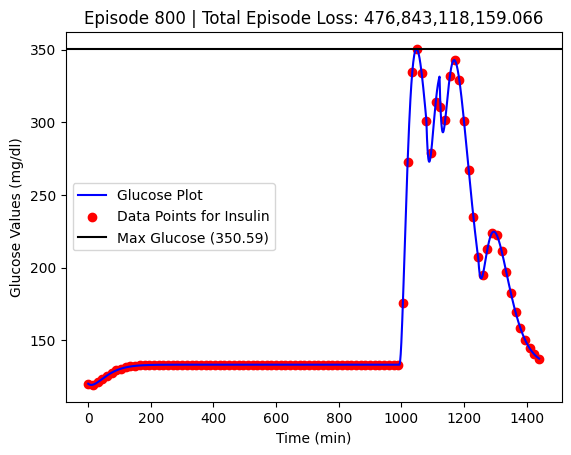

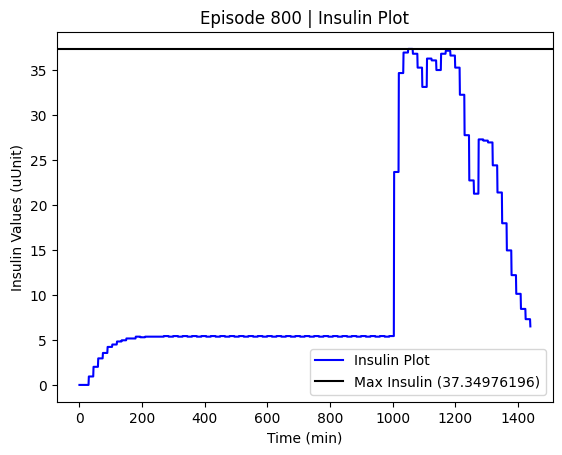

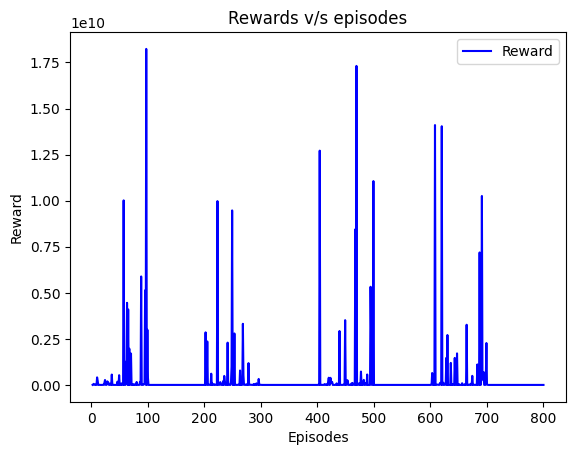

*** Epoch 8 Terminal Cases ***
*** Total 43 Terminal Cases ***
1085 -> 18:05 (46g Carbs)
1266 -> 21:06 (114g Carbs)

Episode: 801 | Score (H<): 1.0000004774960812e+22 | Max Time: 1307 | Max Glucose Level: 609.179 | Avg Insulin Given: 13.83605 | Carb / Insulin: 0.562
276 -> 4:36 (12g Carbs)
666 -> 11:06 (62g Carbs)
715 -> 11:55 (104g Carbs)
1234 -> 20:34 (95g Carbs)

Episode: 802 | Score (H<): 115,898,178,492.76395 | Max Time: 1441 | Max Glucose Level: 292.973 | Avg Insulin Given: 5.91929 | Carb / Insulin: 1.204
394 -> 6:34 (93g Carbs)
618 -> 10:18 (89g Carbs)
632 -> 10:32 (48g Carbs)
632 -> 10:32 (102g Carbs)

Episode: 803 | Score (H<): 167,608,800,695.38974 | Max Time: 1441 | Max Glucose Level: 305.712 | Avg Insulin Given: 12.52765 | Carb / Insulin: 0.572
611 -> 10:11 (64g Carbs)
633 -> 10:33 (91g Carbs)
651 -> 10:51 (30g Carbs)
1133 -> 18:53 (50g Carbs)

Episode: 804 | Score (H<): 168,251,765,734.5151 | Max Time: 1441 | Max Glucose Level: 307.495 | Avg Insulin Given: 9.46205 | Carb /

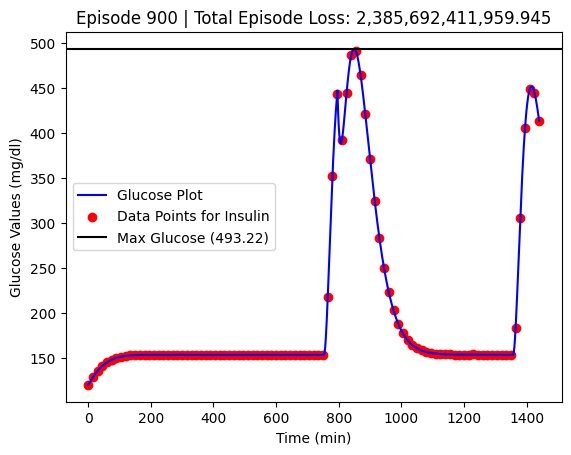

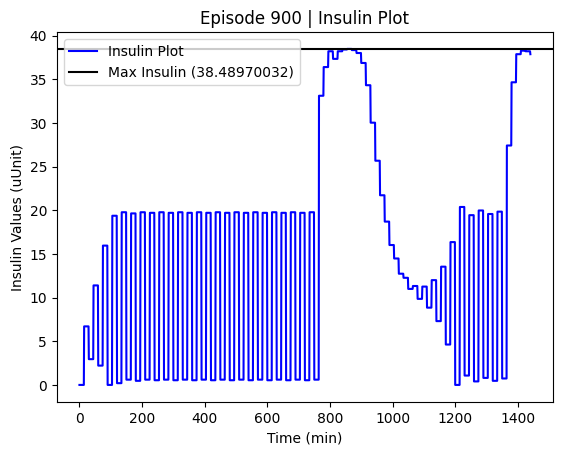

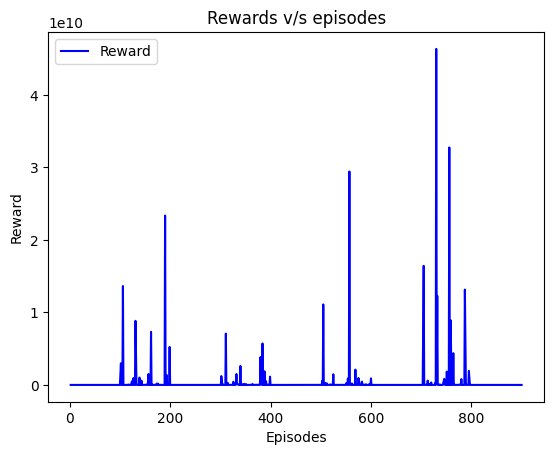

*** Epoch 6 Terminal Cases ***
*** Total 49 Terminal Cases ***
87 -> 1:27 (77g Carbs)
932 -> 15:32 (84g Carbs)

Episode: 901 | Score (H<): 434,430,861,188.6182 | Max Time: 1441 | Max Glucose Level: 366.108 | Avg Insulin Given: 8.61411 | Carb / Insulin: 0.818
183 -> 3:03 (106g Carbs)
1045 -> 17:25 (16g Carbs)
1212 -> 20:12 (31g Carbs)
1432 -> 23:52 (36g Carbs)

Episode: 902 | Score (H<): 498,026,099,778.067 | Max Time: 1441 | Max Glucose Level: 402.283 | Avg Insulin Given: 8.75808 | Carb / Insulin: 0.807
93 -> 1:33 (101g Carbs)
296 -> 4:56 (109g Carbs)
915 -> 15:15 (103g Carbs)
984 -> 16:24 (86g Carbs)
1179 -> 19:39 (36g Carbs)

Episode: 903 | Score (H<): 523,829,216,381.08765 | Max Time: 1441 | Max Glucose Level: 344.107 | Avg Insulin Given: 14.06852 | Carb / Insulin: 0.515
496 -> 8:16 (97g Carbs)
676 -> 11:16 (117g Carbs)

Episode: 904 | Score (H<): 1,419,448,160,146.286 | Max Time: 1441 | Max Glucose Level: 460.295 | Avg Insulin Given: 10.27536 | Carb / Insulin: 0.69
4 -> 0:04 (112g 

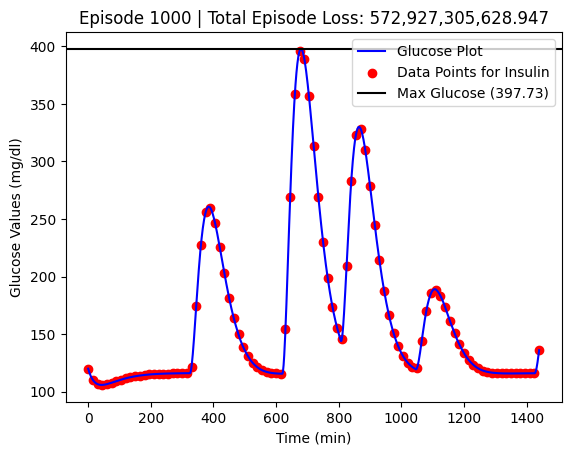

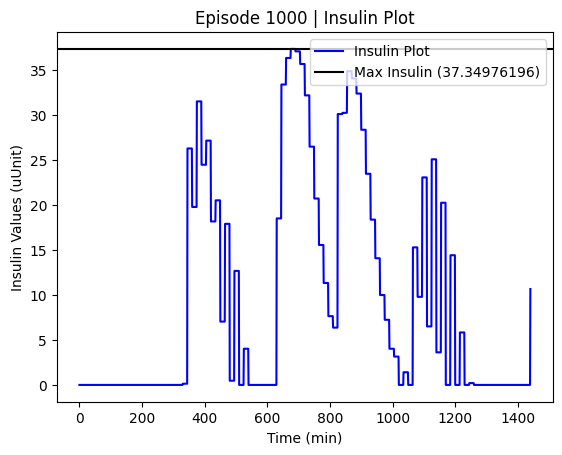

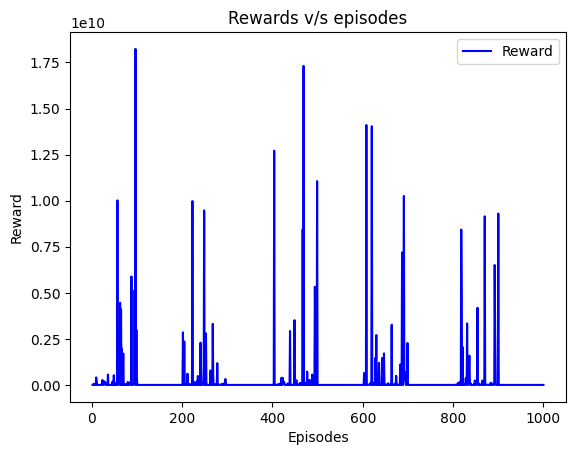

*** Epoch 4 Terminal Cases ***
*** Total 53 Terminal Cases ***


In [ ]:
train_env(model, episodes = 1000, show_work = 100, artif_epoch = 100)

In [ ]:
## Include in Paper
## Iter. 2 on v7. Added Batch Normalisation after every linear layer
## We notice that v7 would often alternate between 0 and `n` to maintain a low average Insulin dosage
## This model can Intuitively set insulin to 0 when no meals are fed (Which was a rare site in v7
## and not seen at all in the other version that we replicated)


import torch
import torch.nn as nn

class NeuralNetwork_v8(nn.Module):
    def __init__(self, input_size, output_size, n_check=20, num_layers_lstm=5):
        super(NeuralNetwork_v8, self).__init__()
        self.input_size = input_size
        self.output_size = output_size
        self.num_layers_lstm = num_layers_lstm
        self.n_check = n_check
        self.lstm = nn.LSTM(input_size, hidden_size=n_check, num_layers=num_layers_lstm, batch_first=True)
        self.h1 = nn.Linear(n_check, 32)
        self.bn1 = nn.BatchNorm1d(32)  # Batch normalization layer after first linear layer
        self.h2 = nn.Linear(32, 16)
        self.bn2 = nn.BatchNorm1d(16)  # Batch normalization layer after second linear layer
        self.h3 = nn.Linear(16, 8)
        self.bn3 = nn.BatchNorm1d(8)  # Batch normalization layer after third linear layer
        self.fc = nn.Linear(8, output_size)
        self.fc2 = nn.Linear(num_layers_lstm, 1)
        self.relu = nn.ReLU()
        self.sig = nn.Sigmoid()
        self.tanh = nn.Tanh()
        self.c = True
        self.p = 0.5

    def forward(self, x):
        x, (h0, c0) = self.lstm(x)
        x = h0
        x = self.h1(x)
        x = self.bn1(x)  # Batch normalization
        x = self.relu(x)
        x = self.h2(x)
        x = self.bn2(x)  # Batch normalization
        x = self.relu(x)
        x = self.h3(x)
        x = self.bn3(x)  # Batch normalization
        x = self.relu(x)
        x = self.fc(x)
        x = self.fc2(x.T)
        x = self.sig(x)
        if self.c:
            self.c = False
            self.p = x
            print(x)
        x = (((x) / self.p) - 1) * 1000 * 2 # To increase range from (1.000 to 1.0020) to (0 to 50ish)
        # return x
        return torch.clamp(x, min=0, max=50)


In [ ]:
model = NeuralNetwork_v8(input_size, output_size).to(device)
optimizer = optim.Adam(model.parameters(), lr=0.01)
loss_function = nn.MSELoss()

In [ ]:
print(summary(model, torch.Tensor([[1,2,3]]).to(device), show_input=True))

tensor([[0.4459]], device='cuda:0', grad_fn=<SigmoidBackward0>)
-----------------------------------------------------------------------
      Layer (type)         Input Shape         Param #     Tr. Param #
            LSTM-1              [1, 3]          15,440          15,440
          Linear-2             [5, 20]             672             672
     BatchNorm1d-3             [5, 32]              64              64
            ReLU-4             [5, 32]               0               0
          Linear-5             [5, 32]             528             528
     BatchNorm1d-6             [5, 16]              32              32
          Linear-7             [5, 16]             136             136
     BatchNorm1d-8              [5, 8]              16              16
          Linear-9              [5, 8]               9               9
         Linear-10              [1, 5]               6               6
        Sigmoid-11              [1, 1]               0               0
Total params

54 -> 0:54 (53g Carbs)
409 -> 6:49 (89g Carbs)
862 -> 14:22 (106g Carbs)

Episode: 1 | Score (H<): 1,201,073,696,876.6746 | Max Time: 1441 | Max Glucose Level: 448.47 | Avg Insulin Given: 9.46449 | Carb / Insulin: 0.751
1164 -> 19:24 (117g Carbs)
1167 -> 19:27 (79g Carbs)
1409 -> 23:29 (67g Carbs)

Episode: 2 | Score (H<): 772,223,365,195.3522 | Max Time: 1441 | Max Glucose Level: 443.879 | Avg Insulin Given: 8.06482 | Carb / Insulin: 0.883
62 -> 1:02 (40g Carbs)
317 -> 5:17 (75g Carbs)
317 -> 5:17 (48g Carbs)
1237 -> 20:37 (107g Carbs)

Episode: 3 | Score (H<): 479,120,258,302.5818 | Max Time: 1441 | Max Glucose Level: 411.804 | Avg Insulin Given: 4.72184 | Carb / Insulin: 1.509
2 -> 0:02 (80g Carbs)
338 -> 5:38 (101g Carbs)
1165 -> 19:25 (39g Carbs)
1282 -> 21:22 (71g Carbs)
1292 -> 21:32 (79g Carbs)

Episode: 4 | Score (H<): 743,303,579,240.9536 | Max Time: 1441 | Max Glucose Level: 403.852 | Avg Insulin Given: 9.91793 | Carb / Insulin: 0.725
403 -> 6:43 (95g Carbs)
743 -> 12:23 (74

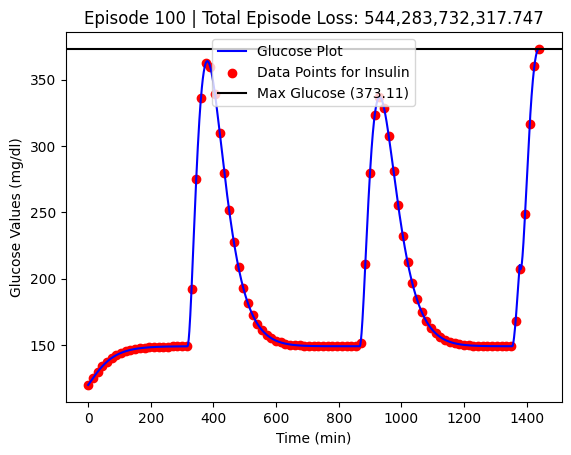

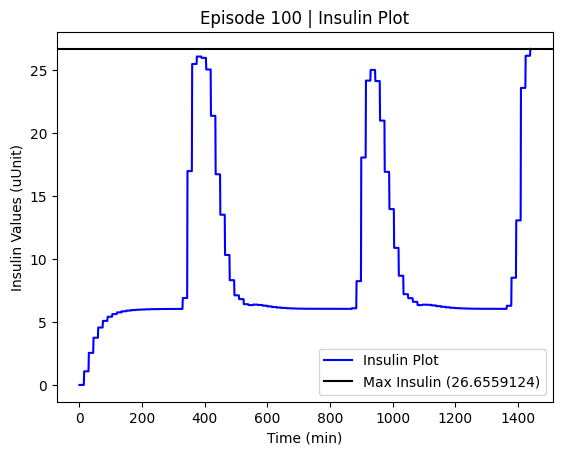

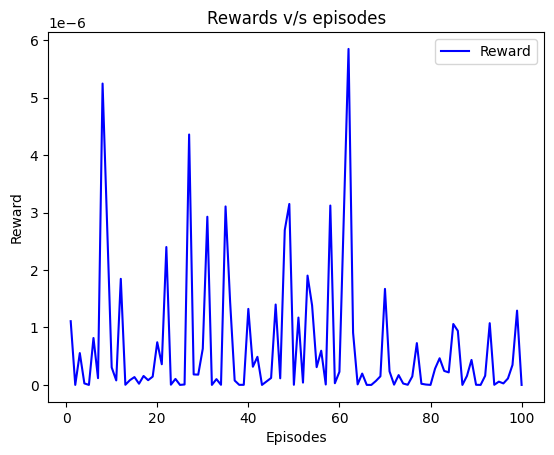

*** Epoch 3 Terminal Cases ***
*** Total 3 Terminal Cases ***
310 -> 5:10 (59g Carbs)
507 -> 8:27 (12g Carbs)
751 -> 12:31 (38g Carbs)

Episode: 101 | Score (H<): 165,988,863,795.28198 | Max Time: 1441 | Max Glucose Level: 336.465 | Avg Insulin Given: 7.2577 | Carb / Insulin: 0.966
97 -> 1:37 (115g Carbs)
543 -> 9:03 (42g Carbs)
975 -> 16:15 (82g Carbs)
997 -> 16:37 (84g Carbs)
1384 -> 23:04 (17g Carbs)

Episode: 102 | Score (H<): 1.0000000060849459e+22 | Max Time: 152 | Max Glucose Level: 601.992 | Avg Insulin Given: 8.29334 | Carb / Insulin: 8.195
539 -> 8:59 (90g Carbs)
681 -> 11:21 (48g Carbs)

Episode: 103 | Score (H<): 71,486,627,606.16939 | Max Time: 1441 | Max Glucose Level: 304.54 | Avg Insulin Given: 5.03868 | Carb / Insulin: 1.396
263 -> 4:23 (53g Carbs)
638 -> 10:38 (14g Carbs)

Episode: 104 | Score (H<): 991,769,813,372.1876 | Max Time: 1441 | Max Glucose Level: 459.688 | Avg Insulin Given: 7.09224 | Carb / Insulin: 0.985
425 -> 7:05 (75g Carbs)
640 -> 10:40 (54g Carbs)

E

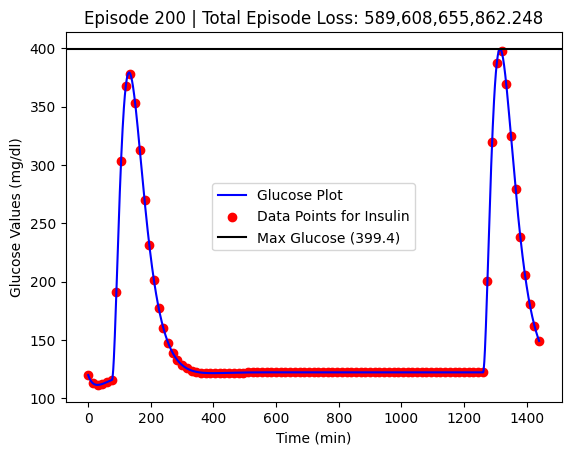

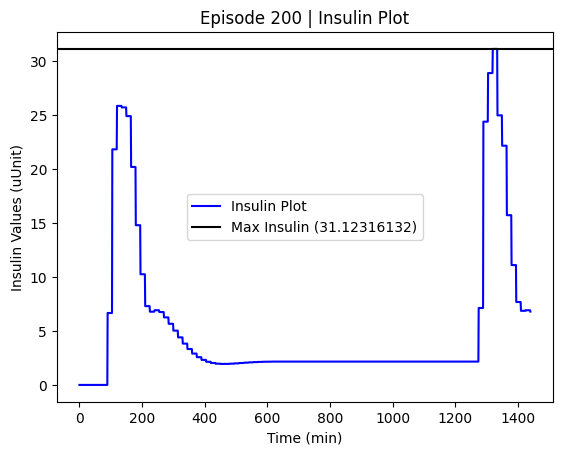

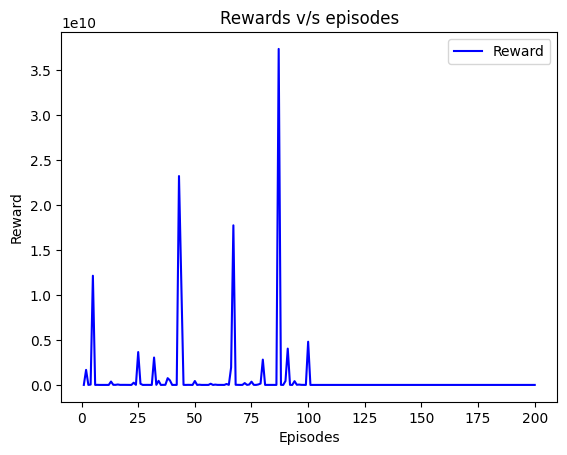

*** Epoch 7 Terminal Cases ***
*** Total 10 Terminal Cases ***
34 -> 0:34 (96g Carbs)
198 -> 3:18 (20g Carbs)
420 -> 7:00 (98g Carbs)

Episode: 201 | Score (H<): 3,119,535,406,544.747 | Max Time: 1441 | Max Glucose Level: 532.703 | Avg Insulin Given: 10.46161 | Carb / Insulin: 0.677
160 -> 2:40 (56g Carbs)
452 -> 7:32 (91g Carbs)
1176 -> 19:36 (41g Carbs)
1325 -> 22:05 (12g Carbs)

Episode: 202 | Score (H<): 1,418,777,062,865.349 | Max Time: 1441 | Max Glucose Level: 482.175 | Avg Insulin Given: 8.97755 | Carb / Insulin: 0.788
70 -> 1:10 (46g Carbs)
93 -> 1:33 (95g Carbs)
207 -> 3:27 (25g Carbs)
262 -> 4:22 (120g Carbs)
567 -> 9:27 (28g Carbs)

Episode: 203 | Score (H<): 139,114,345,318.29855 | Max Time: 1441 | Max Glucose Level: 311.562 | Avg Insulin Given: 8.02669 | Carb / Insulin: 0.892
15 -> 0:15 (70g Carbs)
440 -> 7:20 (98g Carbs)
677 -> 11:17 (10g Carbs)
684 -> 11:24 (38g Carbs)
963 -> 16:03 (62g Carbs)

Episode: 204 | Score (H<): 1,700,483,746,940.1548 | Max Time: 1441 | Max Glu

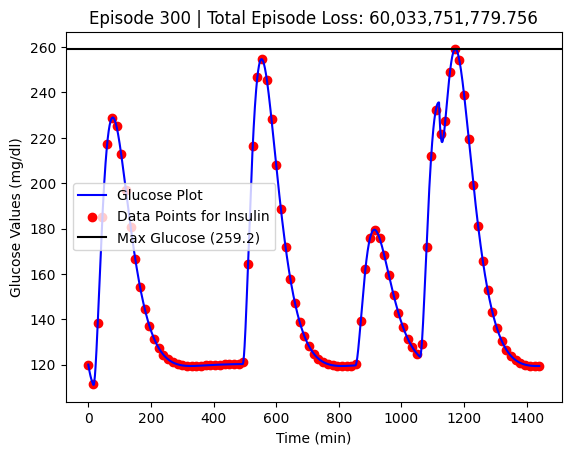

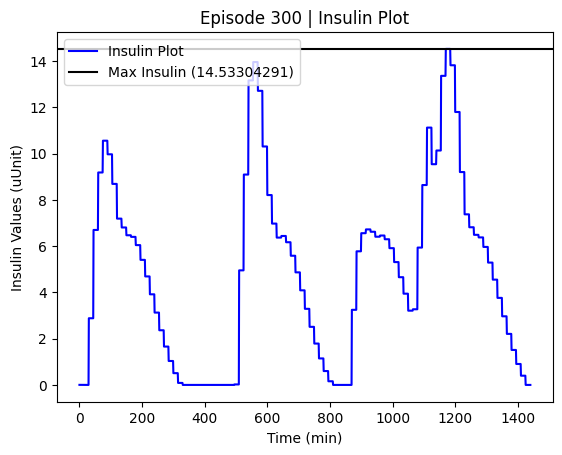

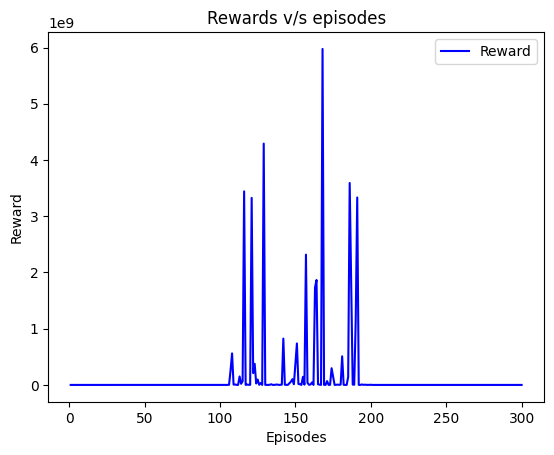

*** Epoch 5 Terminal Cases ***
*** Total 15 Terminal Cases ***
12 -> 0:12 (62g Carbs)
879 -> 14:39 (32g Carbs)
888 -> 14:48 (54g Carbs)

Episode: 301 | Score (H<): 657,576,703,876.774 | Max Time: 1441 | Max Glucose Level: 387.236 | Avg Insulin Given: 9.29713 | Carb / Insulin: 0.757
229 -> 3:49 (12g Carbs)
582 -> 9:42 (38g Carbs)
812 -> 13:32 (79g Carbs)
1150 -> 19:10 (39g Carbs)

Episode: 302 | Score (H<): 771,414,732,170.092 | Max Time: 1441 | Max Glucose Level: 428.652 | Avg Insulin Given: 9.76488 | Carb / Insulin: 0.722
231 -> 3:51 (111g Carbs)
480 -> 8:00 (114g Carbs)
1139 -> 18:59 (70g Carbs)
1183 -> 19:43 (56g Carbs)
1350 -> 22:30 (118g Carbs)

Episode: 303 | Score (H<): 1,364,315,208,996.5176 | Max Time: 1441 | Max Glucose Level: 427.267 | Avg Insulin Given: 7.65439 | Carb / Insulin: 0.949
416 -> 6:56 (68g Carbs)
794 -> 13:14 (47g Carbs)
1042 -> 17:22 (109g Carbs)

Episode: 304 | Score (H<): 257,007,777,189.91693 | Max Time: 1441 | Max Glucose Level: 359.89 | Avg Insulin Given: 

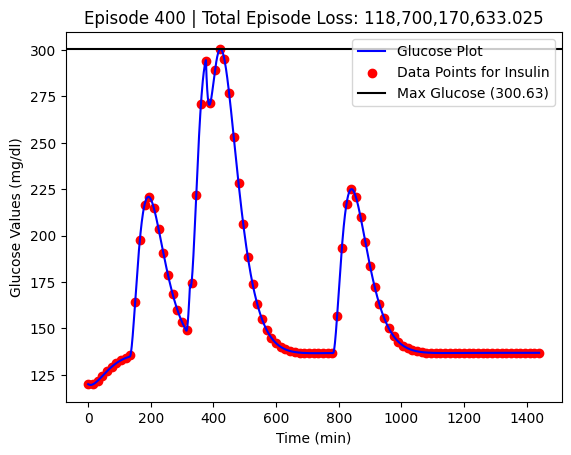

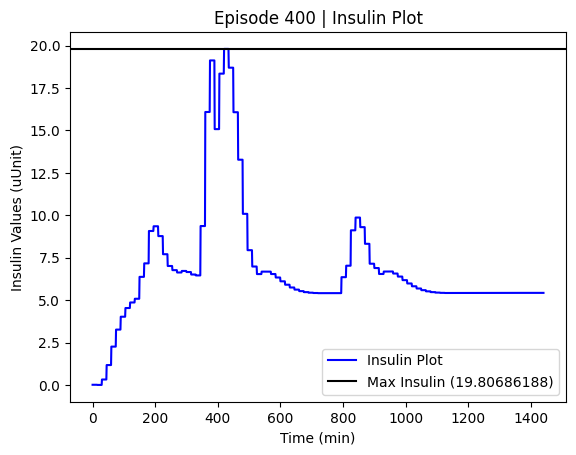

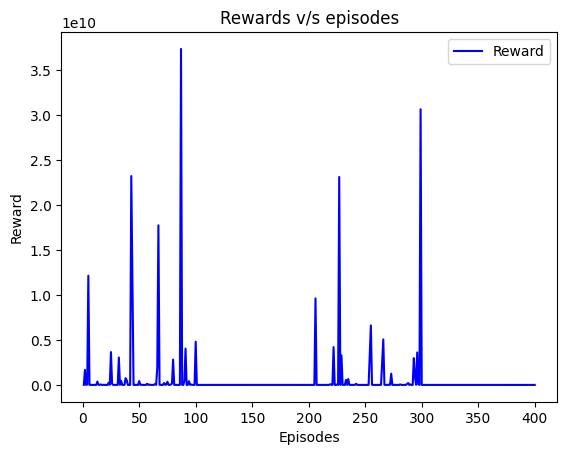

*** Epoch 6 Terminal Cases ***
*** Total 21 Terminal Cases ***
78 -> 1:18 (102g Carbs)
303 -> 5:03 (72g Carbs)
1129 -> 18:49 (45g Carbs)
1129 -> 18:49 (36g Carbs)

Episode: 401 | Score (H<): 292,306,214,682.68256 | Max Time: 1441 | Max Glucose Level: 362.006 | Avg Insulin Given: 8.40978 | Carb / Insulin: 0.846
653 -> 10:53 (101g Carbs)
881 -> 14:41 (57g Carbs)
1200 -> 20:00 (49g Carbs)
1253 -> 20:53 (27g Carbs)
1286 -> 21:26 (106g Carbs)

Episode: 402 | Score (H<): 2,350,672,897,110.569 | Max Time: 1441 | Max Glucose Level: 489.99 | Avg Insulin Given: 12.09874 | Carb / Insulin: 0.593
655 -> 10:55 (42g Carbs)
685 -> 11:25 (60g Carbs)
704 -> 11:44 (84g Carbs)
747 -> 12:27 (21g Carbs)
1135 -> 18:55 (61g Carbs)

Episode: 403 | Score (H<): 58,067,971,367.98042 | Max Time: 1441 | Max Glucose Level: 290.004 | Avg Insulin Given: 7.38751 | Carb / Insulin: 0.964
102 -> 1:42 (104g Carbs)
164 -> 2:44 (73g Carbs)
170 -> 2:50 (103g Carbs)
623 -> 10:23 (72g Carbs)
1072 -> 17:52 (112g Carbs)

Episode:

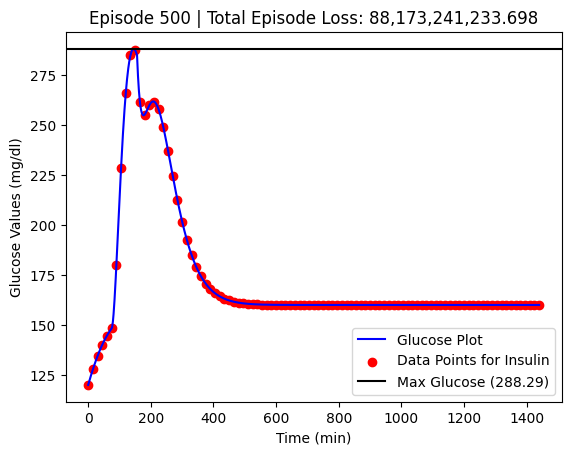

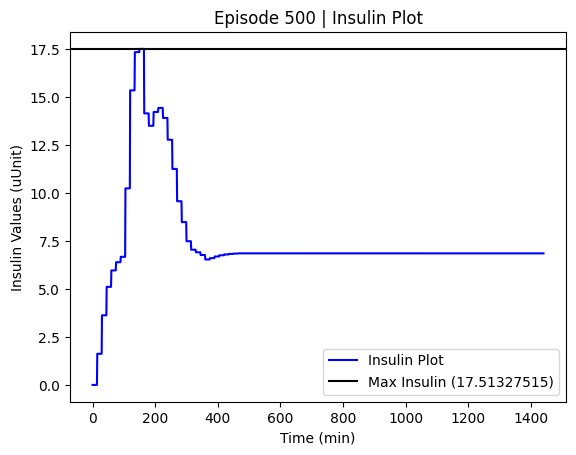

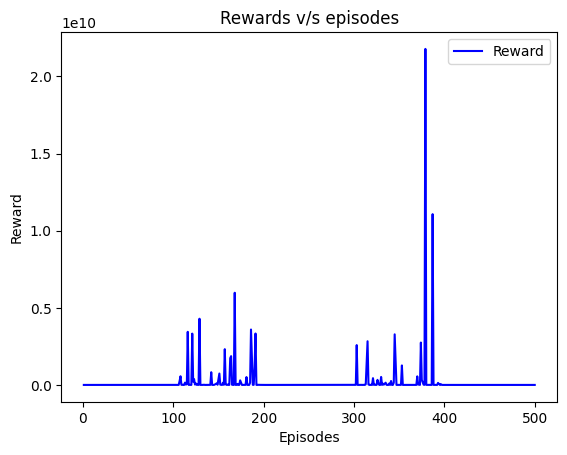

*** Epoch 3 Terminal Cases ***
*** Total 24 Terminal Cases ***
293 -> 4:53 (108g Carbs)
989 -> 16:29 (107g Carbs)
1118 -> 18:38 (29g Carbs)
1236 -> 20:36 (102g Carbs)
1351 -> 22:31 (84g Carbs)

Episode: 501 | Score (H<): 1,034,108,218,728.4615 | Max Time: 1441 | Max Glucose Level: 382.62 | Avg Insulin Given: 11.17167 | Carb / Insulin: 0.648
585 -> 9:45 (70g Carbs)
1102 -> 18:22 (79g Carbs)

Episode: 502 | Score (H<): 163,849,473,926.5849 | Max Time: 1441 | Max Glucose Level: 315.151 | Avg Insulin Given: 7.99672 | Carb / Insulin: 0.881
140 -> 2:20 (38g Carbs)
233 -> 3:53 (30g Carbs)
293 -> 4:53 (113g Carbs)
1276 -> 21:16 (41g Carbs)

Episode: 503 | Score (H<): 517,325,803,135.9845 | Max Time: 1441 | Max Glucose Level: 416.409 | Avg Insulin Given: 6.63221 | Carb / Insulin: 1.069
143 -> 2:23 (12g Carbs)
524 -> 8:44 (96g Carbs)
646 -> 10:46 (93g Carbs)
659 -> 10:59 (84g Carbs)
1374 -> 22:54 (64g Carbs)

Episode: 504 | Score (H<): 954,837,169,107.0532 | Max Time: 1441 | Max Glucose Level: 4

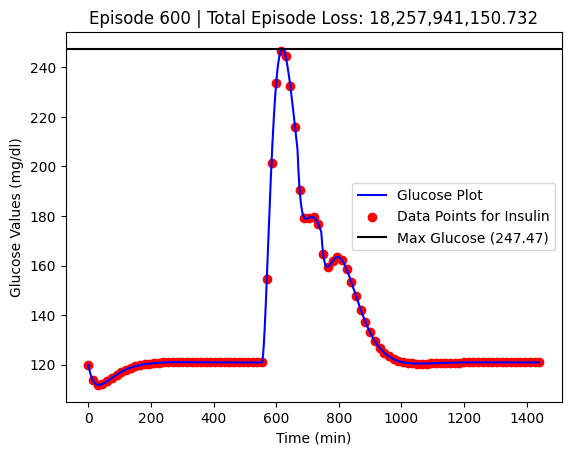

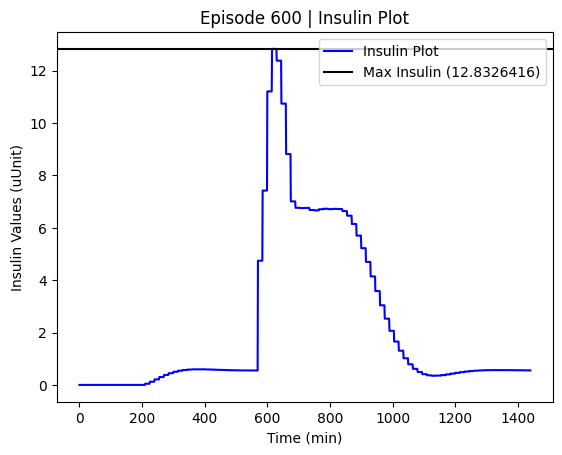

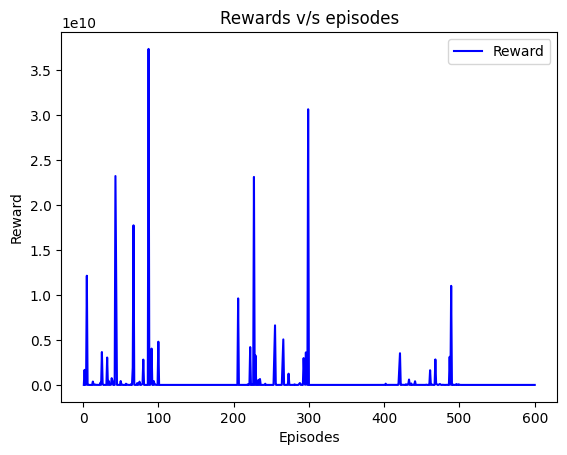

*** Epoch 5 Terminal Cases ***
*** Total 29 Terminal Cases ***
56 -> 0:56 (22g Carbs)
283 -> 4:43 (101g Carbs)
1169 -> 19:29 (83g Carbs)
1196 -> 19:56 (107g Carbs)
1227 -> 20:27 (60g Carbs)

Episode: 601 | Score (H<): 1,845,911,451,959.1643 | Max Time: 1441 | Max Glucose Level: 492.266 | Avg Insulin Given: 10.39187 | Carb / Insulin: 0.693
116 -> 1:56 (19g Carbs)
537 -> 8:57 (59g Carbs)
681 -> 11:21 (109g Carbs)
752 -> 12:32 (34g Carbs)
972 -> 16:12 (116g Carbs)

Episode: 602 | Score (H<): 1,470,340,929,547.4304 | Max Time: 1441 | Max Glucose Level: 460.463 | Avg Insulin Given: 9.87684 | Carb / Insulin: 0.726
526 -> 8:46 (107g Carbs)
779 -> 12:59 (68g Carbs)
797 -> 13:17 (73g Carbs)

Episode: 603 | Score (H<): 402,032,955,960.5328 | Max Time: 1441 | Max Glucose Level: 381.775 | Avg Insulin Given: 8.48572 | Carb / Insulin: 0.838
399 -> 6:39 (40g Carbs)
755 -> 12:35 (69g Carbs)
1016 -> 16:56 (83g Carbs)

Episode: 604 | Score (H<): 1,791,923,795,105.5254 | Max Time: 1441 | Max Glucose Leve

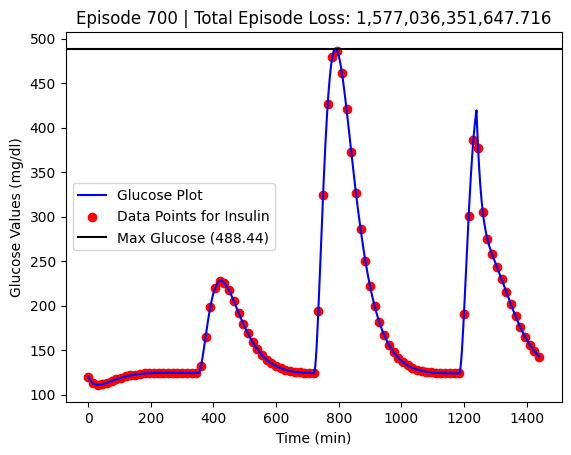

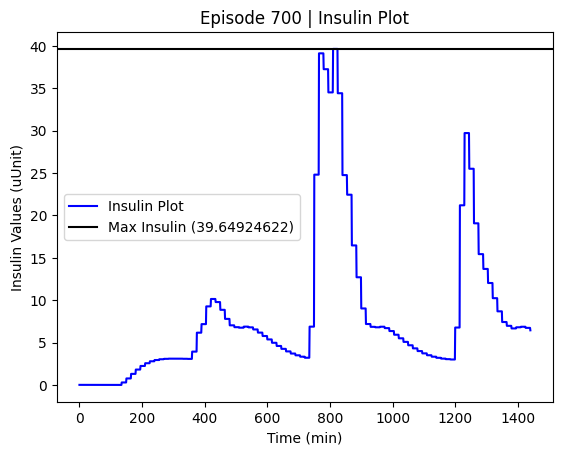

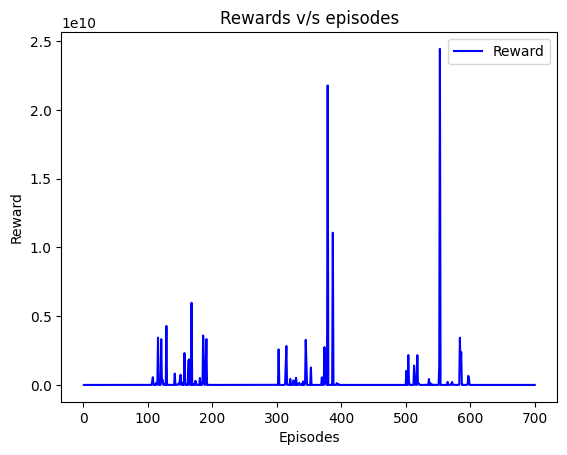

*** Epoch 6 Terminal Cases ***
*** Total 35 Terminal Cases ***
441 -> 7:21 (49g Carbs)
1112 -> 18:32 (64g Carbs)

Episode: 701 | Score (H<): 148,609,417,826.65033 | Max Time: 1441 | Max Glucose Level: 325.37 | Avg Insulin Given: 5.50714 | Carb / Insulin: 1.274
256 -> 4:16 (54g Carbs)
647 -> 10:47 (26g Carbs)
1029 -> 17:09 (110g Carbs)
1060 -> 17:40 (84g Carbs)
1122 -> 18:42 (81g Carbs)

Episode: 702 | Score (H<): 859,156,426,034.3612 | Max Time: 1441 | Max Glucose Level: 398.16 | Avg Insulin Given: 10.06671 | Carb / Insulin: 0.714
575 -> 9:35 (42g Carbs)
1055 -> 17:35 (30g Carbs)
1438 -> 23:58 (49g Carbs)

Episode: 703 | Score (H<): 11,578,017,111.732374 | Max Time: 1441 | Max Glucose Level: 223.523 | Avg Insulin Given: 5.35352 | Carb / Insulin: 1.312
204 -> 3:24 (31g Carbs)
698 -> 11:38 (94g Carbs)
983 -> 16:23 (42g Carbs)
1077 -> 17:57 (55g Carbs)

Episode: 704 | Score (H<): 394,221,148,927.2555 | Max Time: 1441 | Max Glucose Level: 393.515 | Avg Insulin Given: 7.4956 | Carb / Insuli

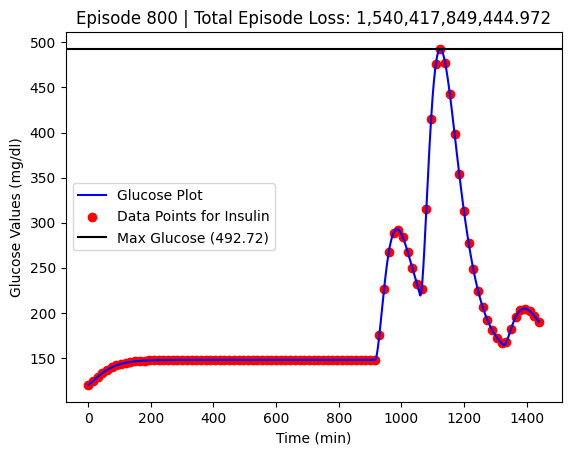

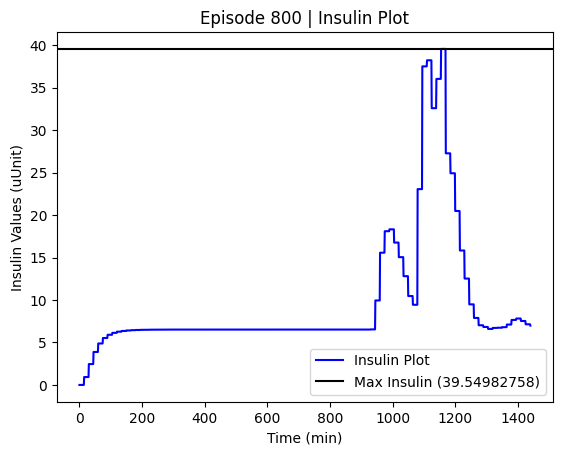

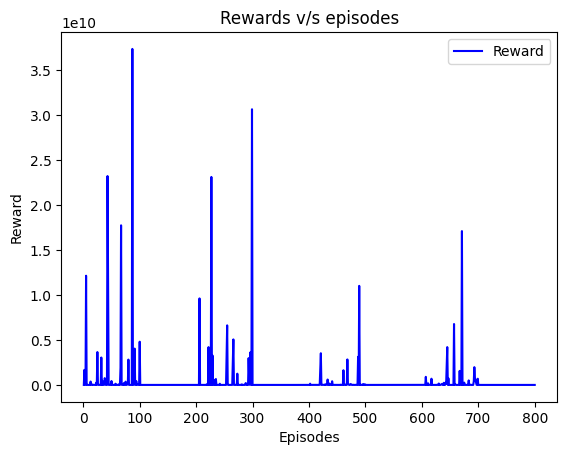

*** Epoch 2 Terminal Cases ***
*** Total 37 Terminal Cases ***
736 -> 12:16 (33g Carbs)
807 -> 13:27 (24g Carbs)
1015 -> 16:55 (96g Carbs)

Episode: 801 | Score (H<): 83,041,362,815.6244 | Max Time: 1441 | Max Glucose Level: 306.652 | Avg Insulin Given: 5.283 | Carb / Insulin: 1.333
385 -> 6:25 (50g Carbs)
605 -> 10:05 (100g Carbs)

Episode: 802 | Score (H<): 3,271,228,002,268.2793 | Max Time: 1441 | Max Glucose Level: 597.77 | Avg Insulin Given: 8.68777 | Carb / Insulin: 0.811
235 -> 3:55 (29g Carbs)
330 -> 5:30 (80g Carbs)
457 -> 7:37 (89g Carbs)
826 -> 13:46 (56g Carbs)
1026 -> 17:06 (80g Carbs)

Episode: 803 | Score (H<): 4,056,670,350,073.486 | Max Time: 1441 | Max Glucose Level: 509.425 | Avg Insulin Given: 12.98802 | Carb / Insulin: 0.552
462 -> 7:42 (114g Carbs)
861 -> 14:21 (73g Carbs)

Episode: 804 | Score (H<): 1,844,134,890,247.6716 | Max Time: 1441 | Max Glucose Level: 511.998 | Avg Insulin Given: 9.89014 | Carb / Insulin: 0.715
63 -> 1:03 (10g Carbs)
259 -> 4:19 (120g Car

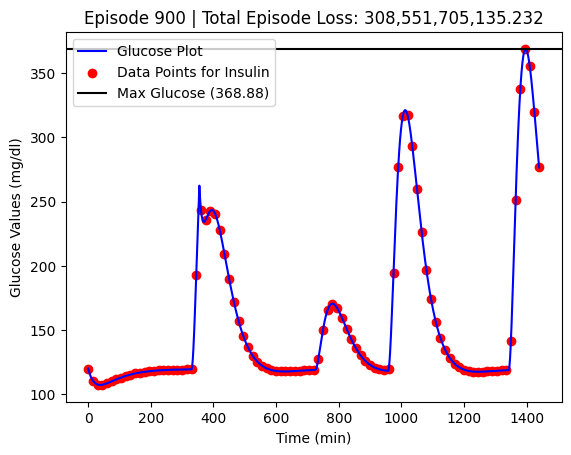

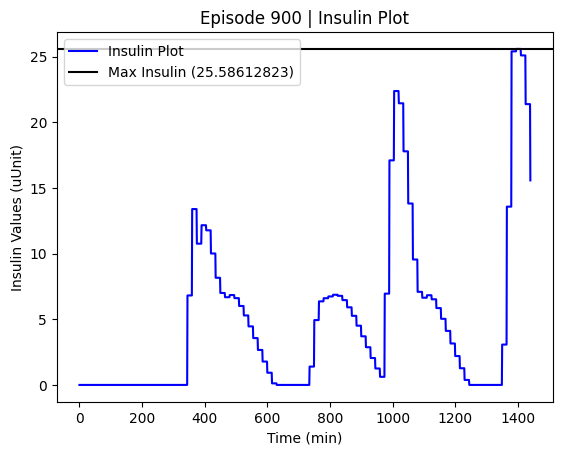

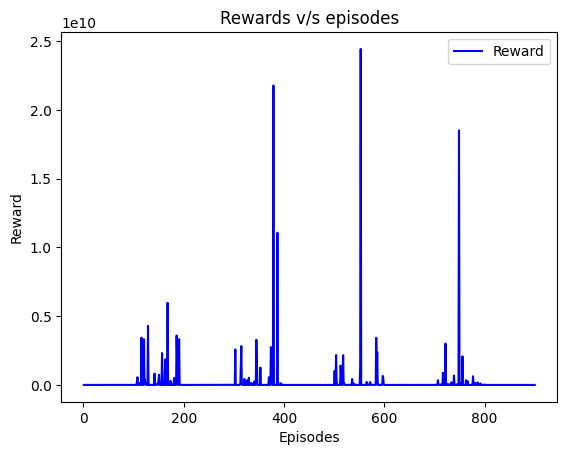

*** Epoch 8 Terminal Cases ***
*** Total 45 Terminal Cases ***
456 -> 7:36 (104g Carbs)
716 -> 11:56 (55g Carbs)
1029 -> 17:09 (37g Carbs)
1201 -> 20:01 (74g Carbs)
1279 -> 21:19 (58g Carbs)

Episode: 901 | Score (H<): 160,088,577,847.5076 | Max Time: 1441 | Max Glucose Level: 322.982 | Avg Insulin Given: 6.52455 | Carb / Insulin: 1.098
810 -> 13:30 (106g Carbs)
1102 -> 18:22 (119g Carbs)
1114 -> 18:34 (47g Carbs)
1156 -> 19:16 (90g Carbs)

Episode: 902 | Score (H<): 1,172,378,891,341.8923 | Max Time: 1441 | Max Glucose Level: 444.214 | Avg Insulin Given: 9.32997 | Carb / Insulin: 0.771
813 -> 13:33 (75g Carbs)
1186 -> 19:46 (53g Carbs)

Episode: 903 | Score (H<): 145,409,655,836.14743 | Max Time: 1441 | Max Glucose Level: 322.531 | Avg Insulin Given: 7.51855 | Carb / Insulin: 0.935
413 -> 6:53 (12g Carbs)
1356 -> 22:36 (67g Carbs)

Episode: 904 | Score (H<): 33,632,124,115.577568 | Max Time: 1441 | Max Glucose Level: 280.814 | Avg Insulin Given: 3.65204 | Carb / Insulin: 1.915
906 -> 

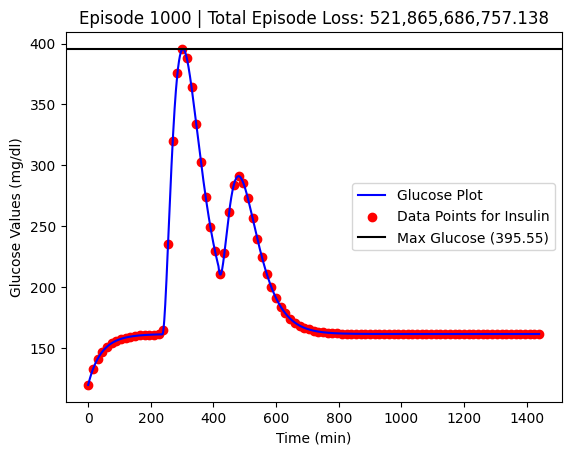

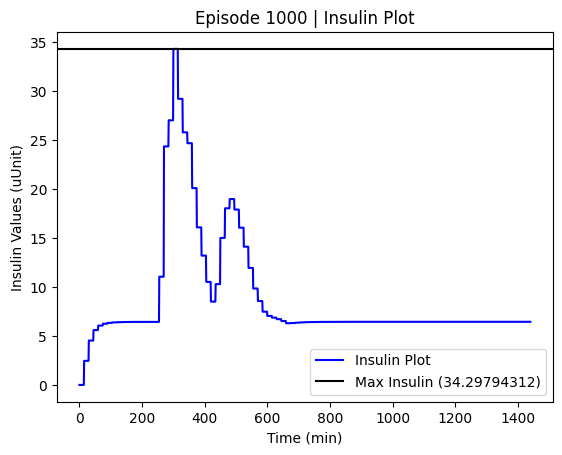

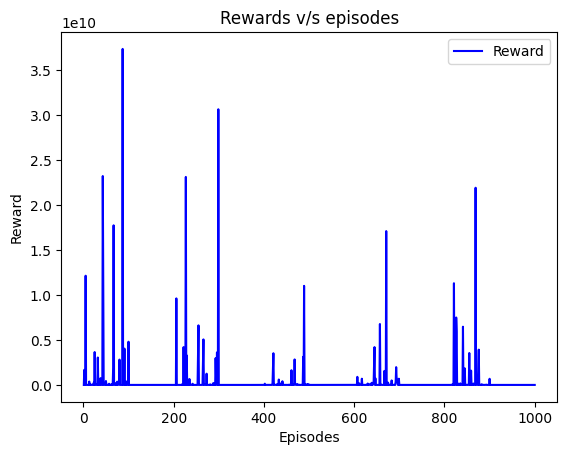

*** Epoch 2 Terminal Cases ***
*** Total 47 Terminal Cases ***


In [ ]:
train_env(model, episodes = 1000, show_work = 100, artif_epoch = 100)

In [ ]:
## Baseline in Paper

import torch
import torch.nn as nn

class BaseLineEnv(nn.Module):
    def __init__(self, input_size, output_size):
        super(BaseLineEnv, self).__init__()
        self.l = nn.Linear(input_size, output_size)

    def forward(self, x):
        x = torch.Tensor([0])
        return x


In [ ]:
model = BaseLineEnv(input_size, output_size).to(device)
optimizer = optim.Adam(model.parameters(), lr=0.01)
loss_function = nn.MSELoss()

409 -> 6:49 (36g Carbs)
476 -> 7:56 (11g Carbs)
552 -> 9:12 (120g Carbs)
1160 -> 19:20 (51g Carbs)
1232 -> 20:32 (95g Carbs)

Episode: 1 | Score (H<): 4,046,976,745,744.73 | Max Time: 1441 | Max Glucose Level: 582.087 | Avg Insulin Given: 0.0 | Carb / Insulin: 10312.0
134 -> 2:14 (86g Carbs)
771 -> 12:51 (84g Carbs)
797 -> 13:17 (73g Carbs)
1336 -> 22:16 (90g Carbs)

Episode: 2 | Score (H<): 4,540,446,469,030.721 | Max Time: 1441 | Max Glucose Level: 548.094 | Avg Insulin Given: 0.0 | Carb / Insulin: 10332.0
720 -> 12:00 (116g Carbs)
1191 -> 19:51 (69g Carbs)

Episode: 3 | Score (H<): 296,983,191,250.914 | Max Time: 1441 | Max Glucose Level: 386.671 | Avg Insulin Given: 0.0 | Carb / Insulin: 10184.0
98 -> 1:38 (23g Carbs)
684 -> 11:24 (64g Carbs)

Episode: 4 | Score (H<): 642,435,532,349.878 | Max Time: 1441 | Max Glucose Level: 448.221 | Avg Insulin Given: 0.0 | Carb / Insulin: 10086.0
586 -> 9:46 (102g Carbs)
811 -> 13:31 (100g Carbs)
1024 -> 17:04 (67g Carbs)
1110 -> 18:30 (66g Carb

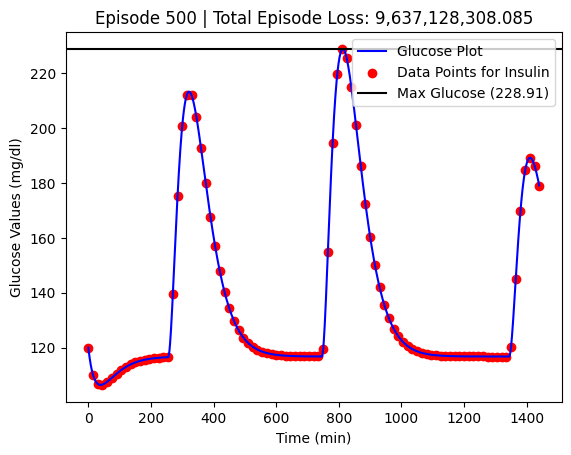

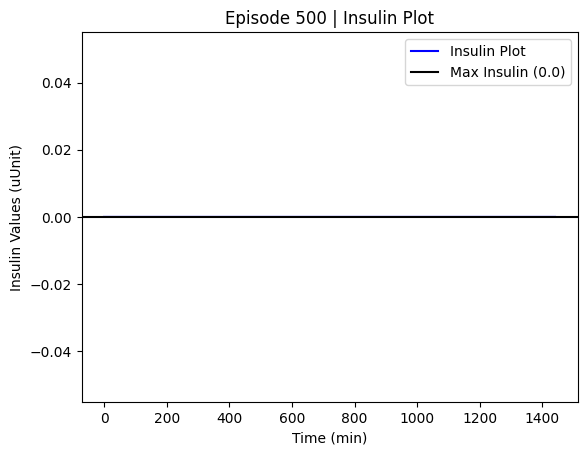

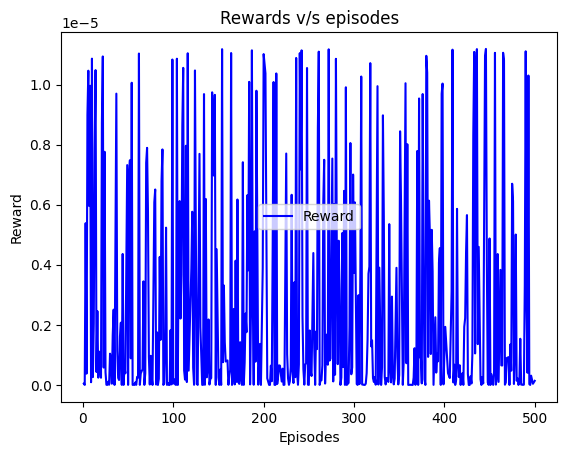

*** Epoch 5 Terminal Cases ***
*** Total 35 Terminal Cases ***
167 -> 2:47 (22g Carbs)
272 -> 4:32 (97g Carbs)
287 -> 4:47 (27g Carbs)
1068 -> 17:48 (60g Carbs)

Episode: 501 | Score (H<): 29,252,090,178.864285 | Max Time: 1441 | Max Glucose Level: 275.23 | Avg Insulin Given: 0.0 | Carb / Insulin: 10205.0
168 -> 2:48 (30g Carbs)
226 -> 3:46 (114g Carbs)
486 -> 8:06 (101g Carbs)
506 -> 8:26 (48g Carbs)
919 -> 15:19 (12g Carbs)

Episode: 502 | Score (H<): 196,362,719,547.31314 | Max Time: 1441 | Max Glucose Level: 371.426 | Avg Insulin Given: 0.0 | Carb / Insulin: 10304.0
510 -> 8:30 (15g Carbs)
650 -> 10:50 (15g Carbs)
716 -> 11:56 (57g Carbs)
1068 -> 17:48 (81g Carbs)

Episode: 503 | Score (H<): 307,636,397,671.4797 | Max Time: 1441 | Max Glucose Level: 381.697 | Avg Insulin Given: 0.0 | Carb / Insulin: 10167.0
161 -> 2:41 (24g Carbs)
435 -> 7:15 (12g Carbs)

Episode: 504 | Score (H<): 6,491,003,027.732319 | Max Time: 1441 | Max Glucose Level: 227.871 | Avg Insulin Given: 0.0 | Carb / 

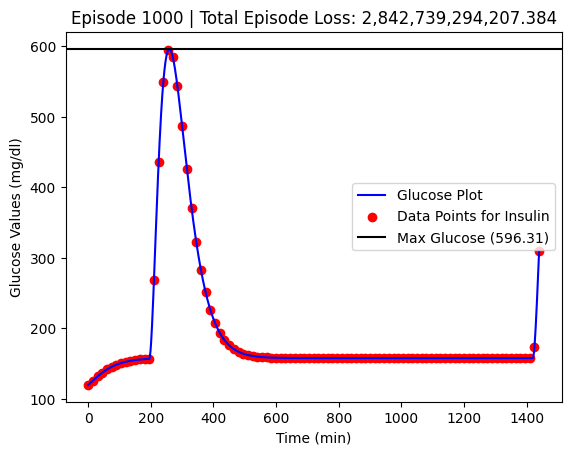

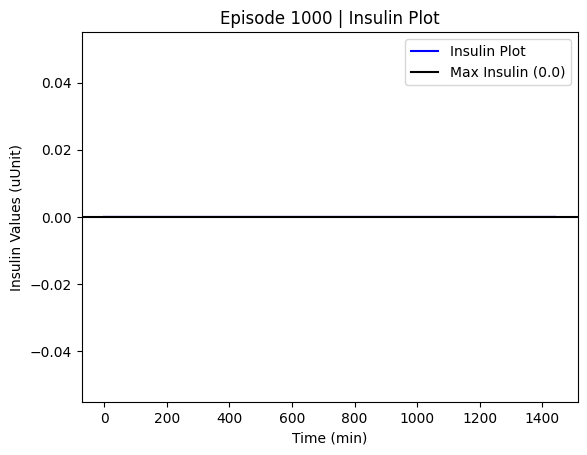

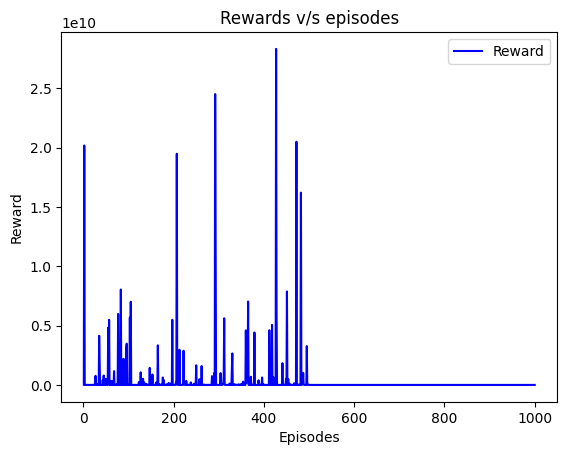

*** Epoch 2 Terminal Cases ***
*** Total 75 Terminal Cases ***


In [ ]:
train_env(model, episodes = 1000, show_work = 500, artif_epoch = 50)

59 -> 0:59 (24g Carbs)
158 -> 2:38 (16g Carbs)
496 -> 8:16 (59g Carbs)
713 -> 11:53 (33g Carbs)
1134 -> 18:54 (65g Carbs)

Episode: 1 | Score (H<): 148,844,880,415.9956 | Max Time: 1441 | Max Glucose Level: 334.949 | Avg Insulin Given: 0.0 | Carb / Insulin: 10196.0


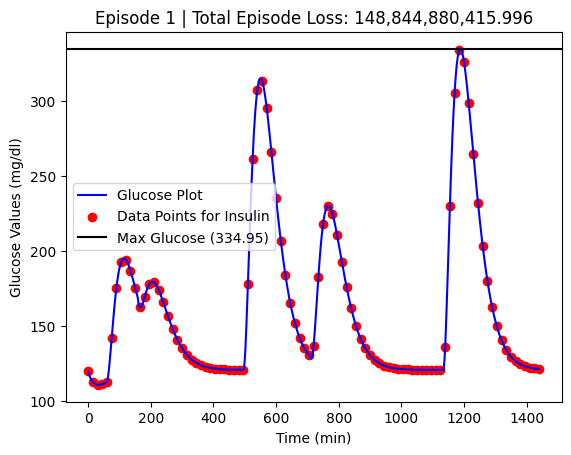

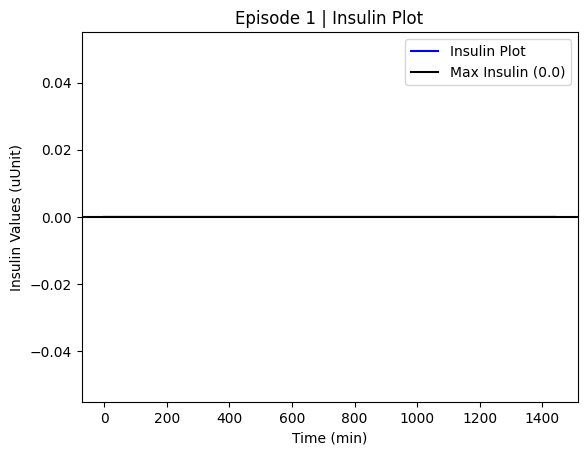

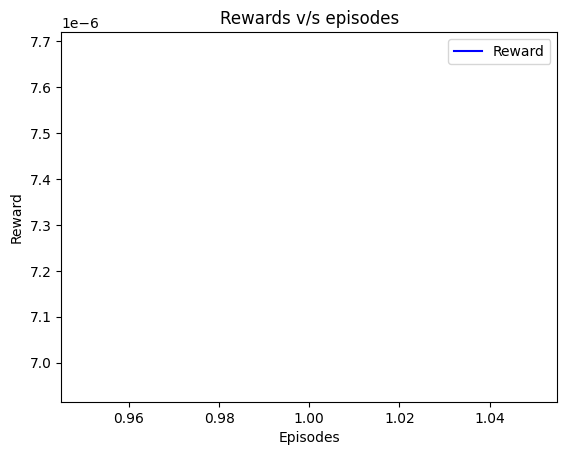

214 -> 3:34 (60g Carbs)
612 -> 10:12 (99g Carbs)
747 -> 12:27 (46g Carbs)

Episode: 2 | Score (H<): 1,629,696,864,388.9683 | Max Time: 1441 | Max Glucose Level: 522.234 | Avg Insulin Given: 0.0 | Carb / Insulin: 10204.0


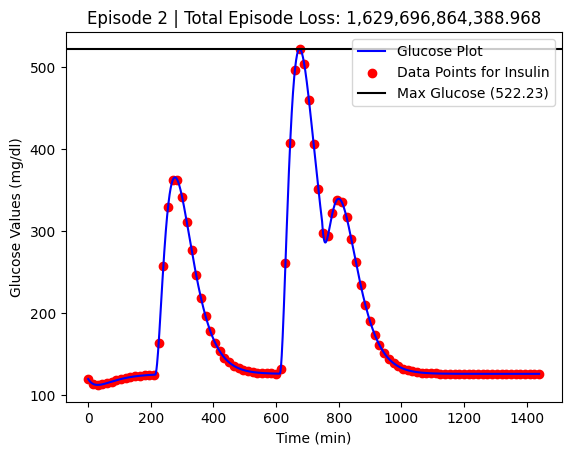

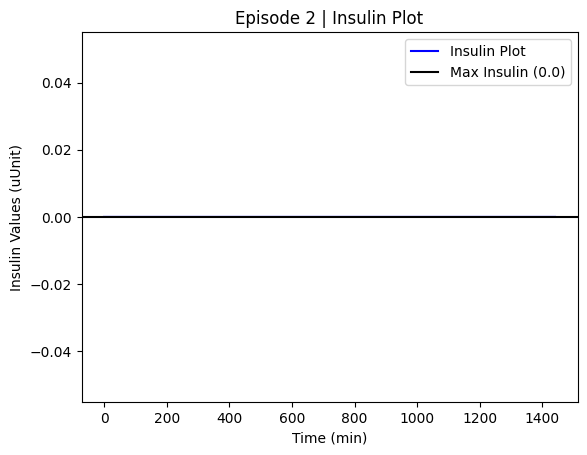

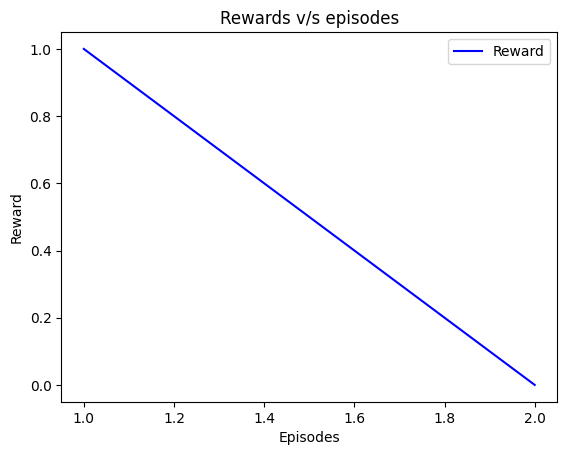

353 -> 5:53 (118g Carbs)
806 -> 13:26 (50g Carbs)
1388 -> 23:08 (116g Carbs)

Episode: 3 | Score (H<): 256,962,012,062.94437 | Max Time: 1441 | Max Glucose Level: 372.994 | Avg Insulin Given: 0.0 | Carb / Insulin: 10283.0


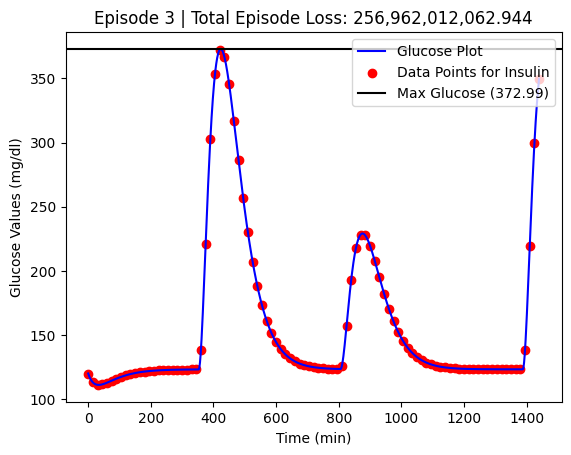

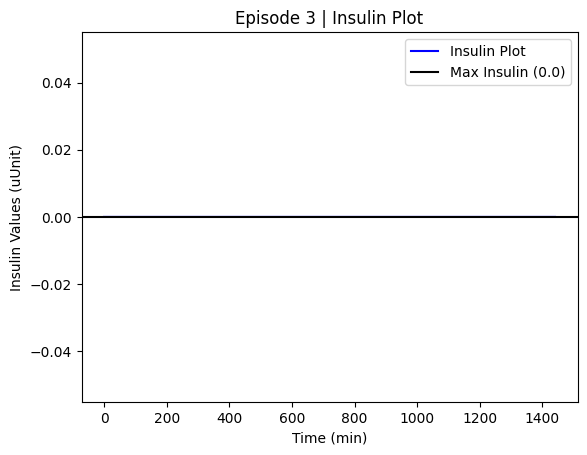

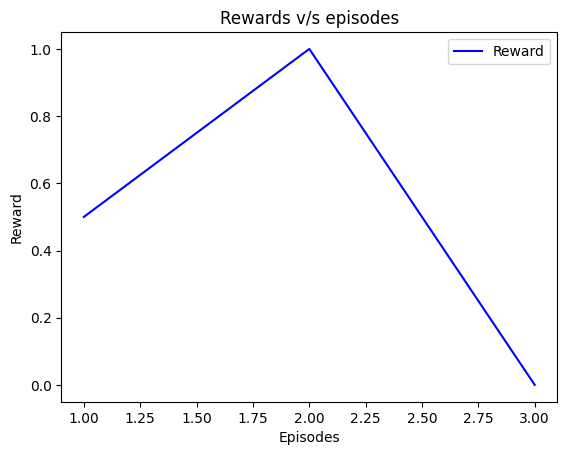

602 -> 10:02 (13g Carbs)
767 -> 12:47 (15g Carbs)
999 -> 16:39 (42g Carbs)
1058 -> 17:38 (108g Carbs)
1196 -> 19:56 (99g Carbs)

Episode: 4 | Score (H<): 188,852,308,554.101 | Max Time: 1441 | Max Glucose Level: 351.366 | Avg Insulin Given: 0.0 | Carb / Insulin: 10276.0


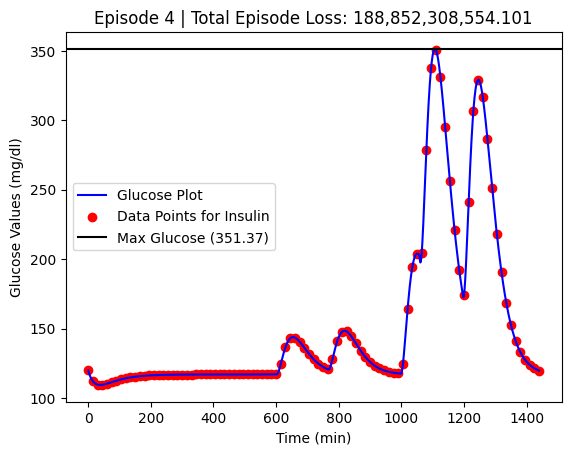

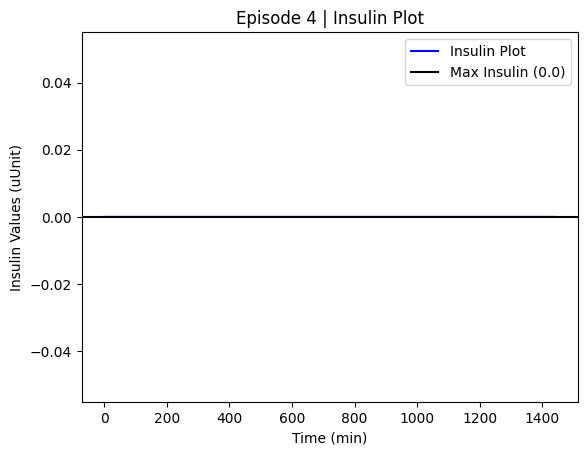

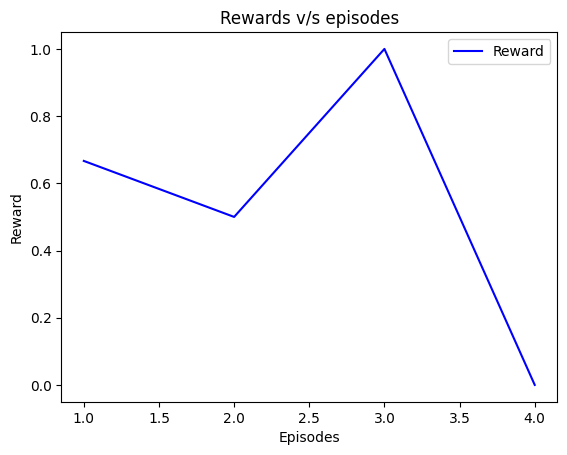

779 -> 12:59 (16g Carbs)
1179 -> 19:39 (108g Carbs)

Episode: 5 | Score (H<): 94,131,252,149.19905 | Max Time: 1441 | Max Glucose Level: 326.273 | Avg Insulin Given: 0.0 | Carb / Insulin: 10123.0


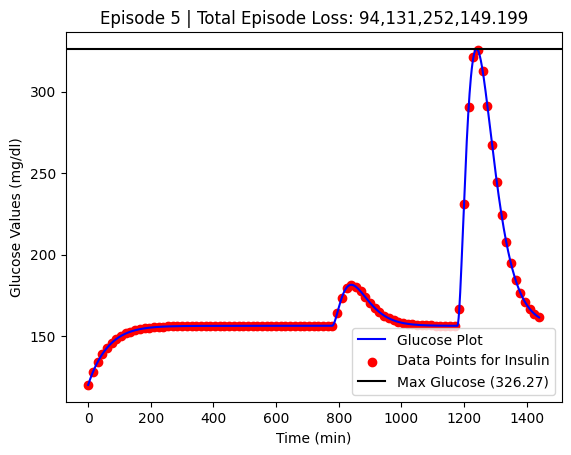

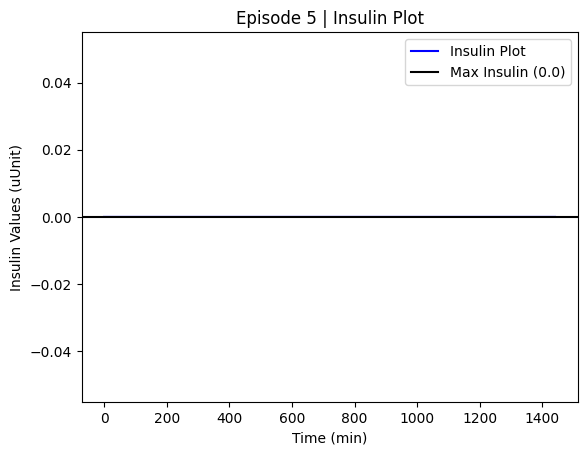

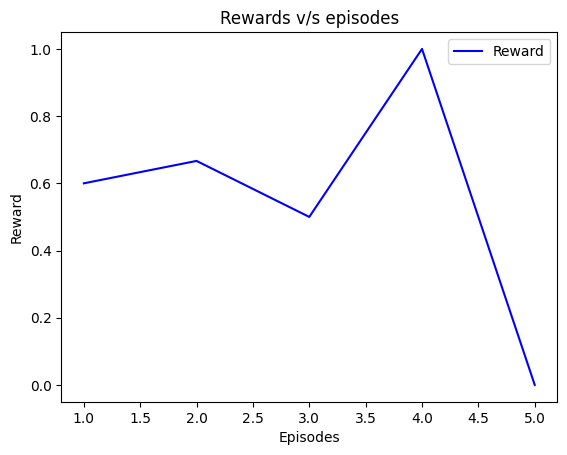

624 -> 10:24 (14g Carbs)
1270 -> 21:10 (92g Carbs)

Episode: 6 | Score (H<): 671,042,567,885.631 | Max Time: 1441 | Max Glucose Level: 450.856 | Avg Insulin Given: 0.0 | Carb / Insulin: 10105.0


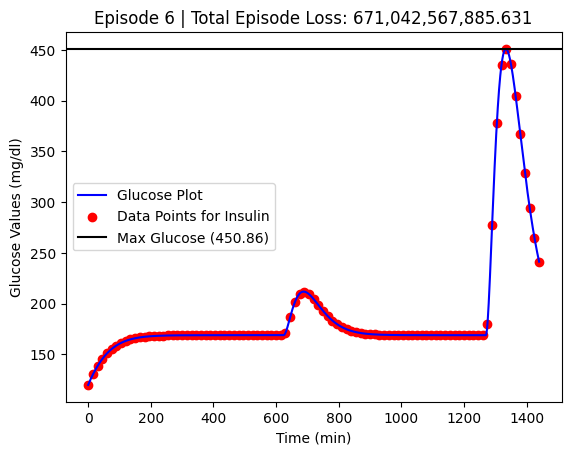

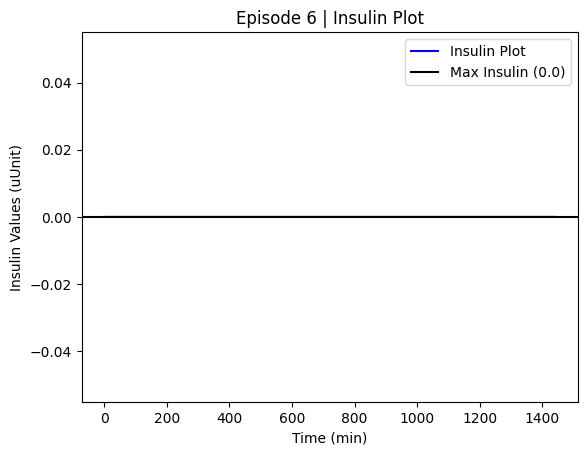

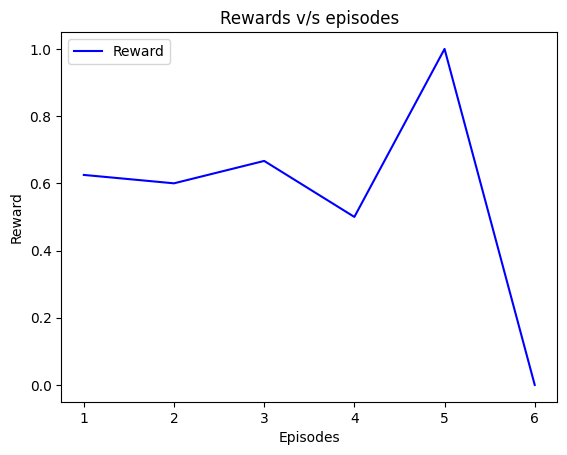

144 -> 2:24 (41g Carbs)
243 -> 4:03 (55g Carbs)
453 -> 7:33 (69g Carbs)
1020 -> 17:00 (52g Carbs)

Episode: 7 | Score (H<): 1,676,727,040,731.6177 | Max Time: 1441 | Max Glucose Level: 462.906 | Avg Insulin Given: 0.0 | Carb / Insulin: 10216.0


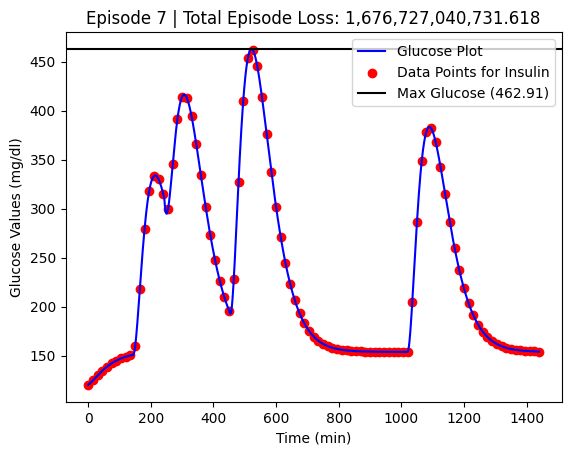

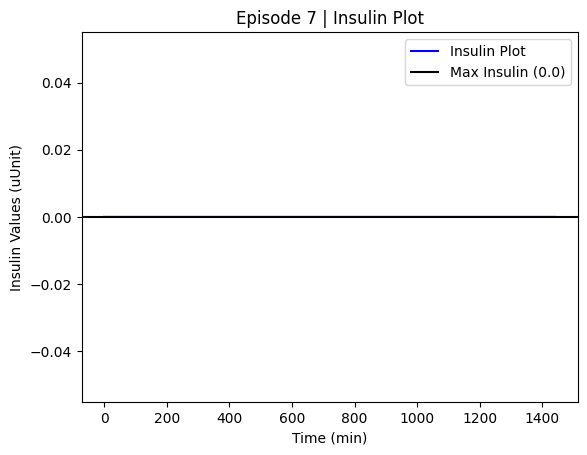

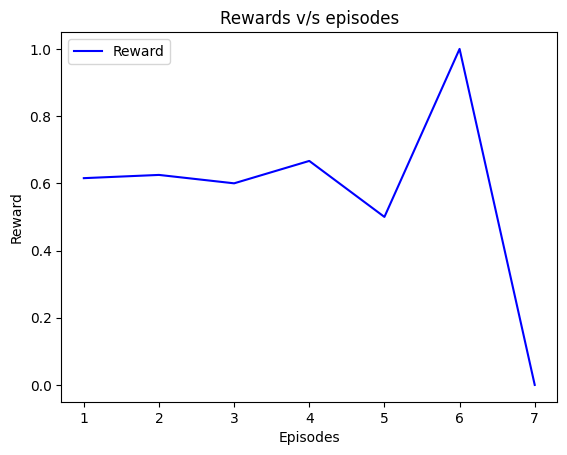

116 -> 1:56 (54g Carbs)
202 -> 3:22 (58g Carbs)
1106 -> 18:26 (55g Carbs)
1195 -> 19:55 (45g Carbs)

Episode: 8 | Score (H<): 95,820,772,850.52675 | Max Time: 1441 | Max Glucose Level: 288.045 | Avg Insulin Given: 0.0 | Carb / Insulin: 10211.0


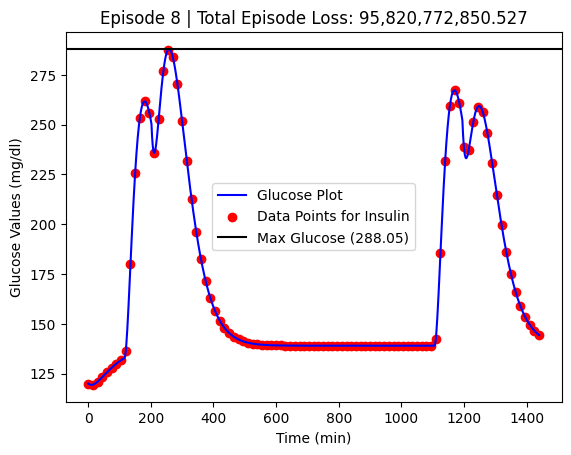

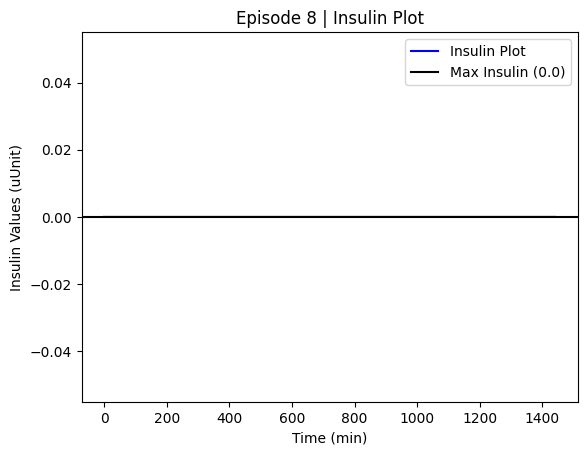

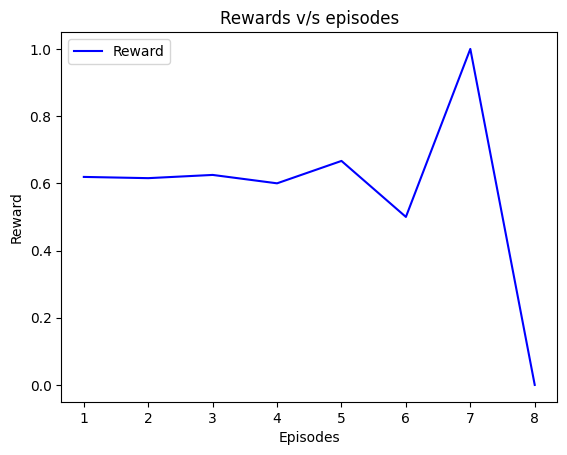

260 -> 4:20 (16g Carbs)
1173 -> 19:33 (57g Carbs)

Episode: 9 | Score (H<): 143,809,188,433.28265 | Max Time: 1441 | Max Glucose Level: 351.405 | Avg Insulin Given: 0.0 | Carb / Insulin: 10072.0


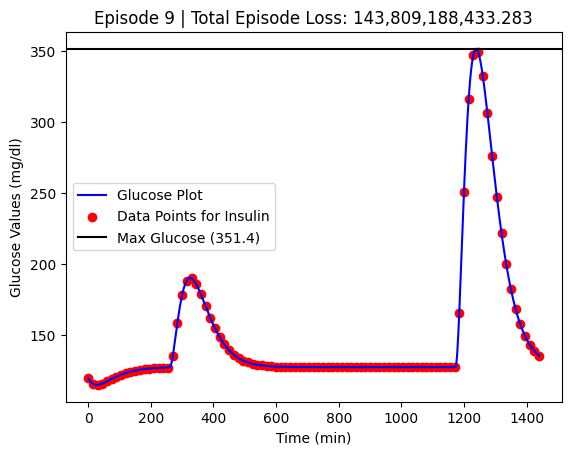

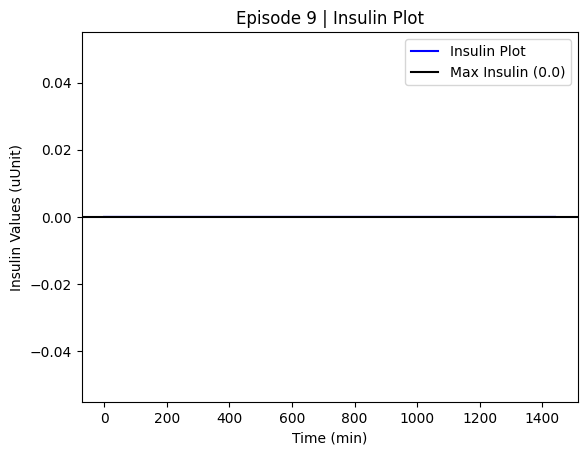

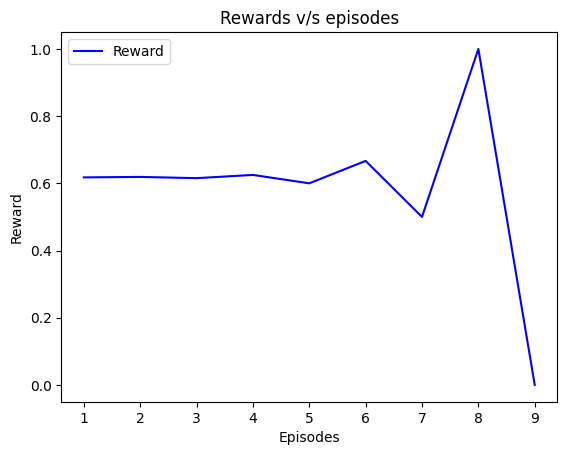

538 -> 8:58 (29g Carbs)
607 -> 10:07 (24g Carbs)
1038 -> 17:18 (61g Carbs)
1281 -> 21:21 (83g Carbs)
1360 -> 22:40 (61g Carbs)

Episode: 10 | Score (H<): 192,014,046,787.5162 | Max Time: 1441 | Max Glucose Level: 345.501 | Avg Insulin Given: 0.0 | Carb / Insulin: 10257.0


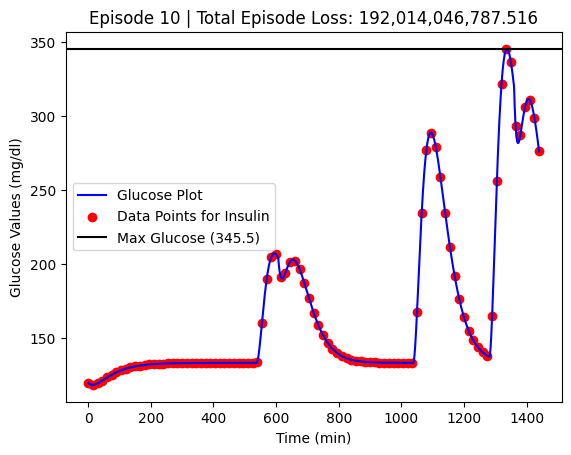

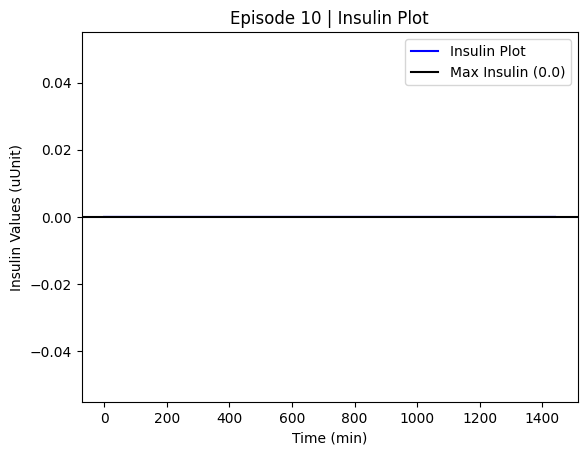

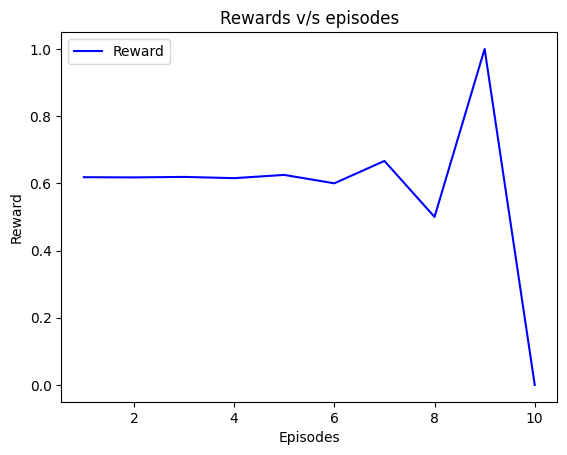

252 -> 4:12 (111g Carbs)
369 -> 6:09 (86g Carbs)
1099 -> 18:19 (44g Carbs)
1191 -> 19:51 (38g Carbs)
1428 -> 23:48 (92g Carbs)

Episode: 11 | Score (H<): 3,026,959,717,220.059 | Max Time: 1441 | Max Glucose Level: 549.96 | Avg Insulin Given: 0.0 | Carb / Insulin: 10370.0


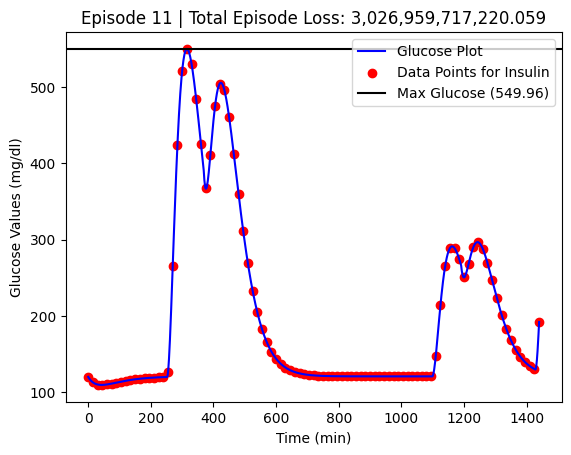

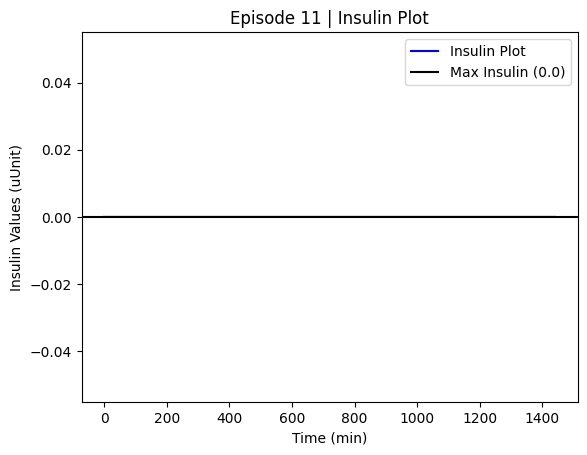

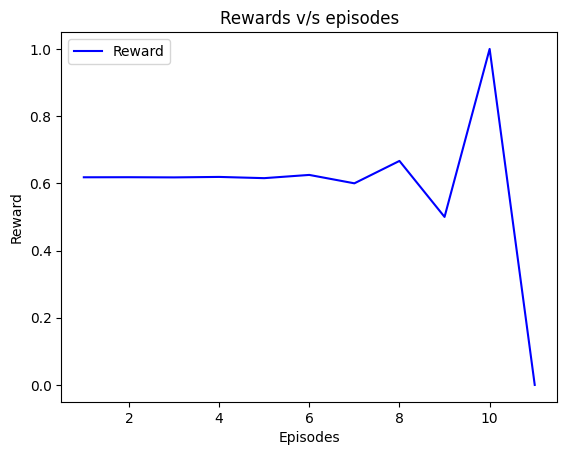

12 -> 0:12 (114g Carbs)
735 -> 12:15 (82g Carbs)

Episode: 12 | Score (H<): 1,628,076,973,999.028 | Max Time: 1441 | Max Glucose Level: 512.123 | Avg Insulin Given: 0.0 | Carb / Insulin: 10195.0


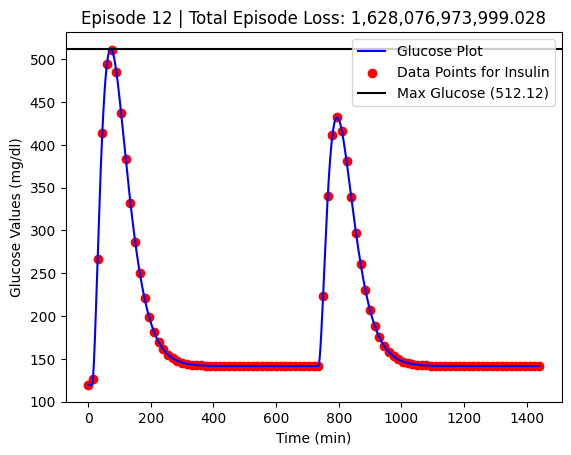

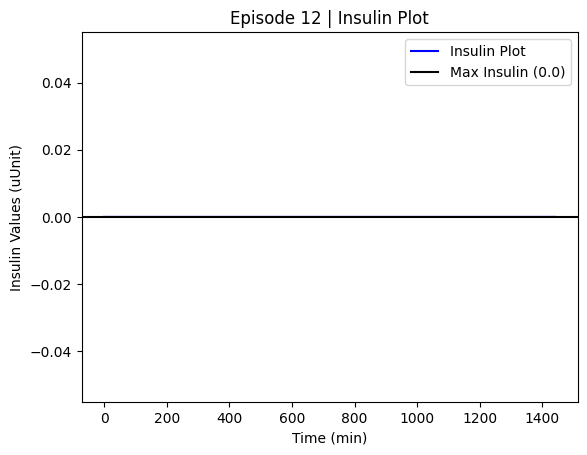

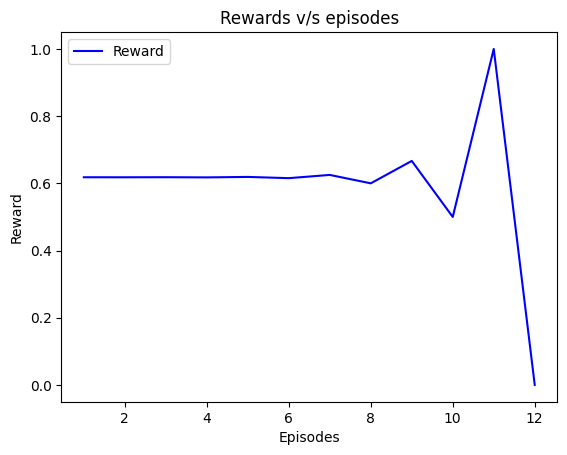

374 -> 6:14 (55g Carbs)
401 -> 6:41 (48g Carbs)
413 -> 6:53 (58g Carbs)
455 -> 7:35 (11g Carbs)
693 -> 11:33 (118g Carbs)

Episode: 13 | Score (H<): 1,084,337,052,014.204 | Max Time: 1441 | Max Glucose Level: 491.851 | Avg Insulin Given: 0.0 | Carb / Insulin: 10289.0


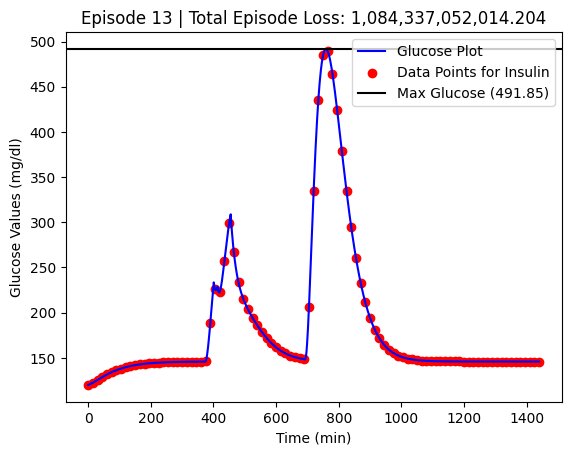

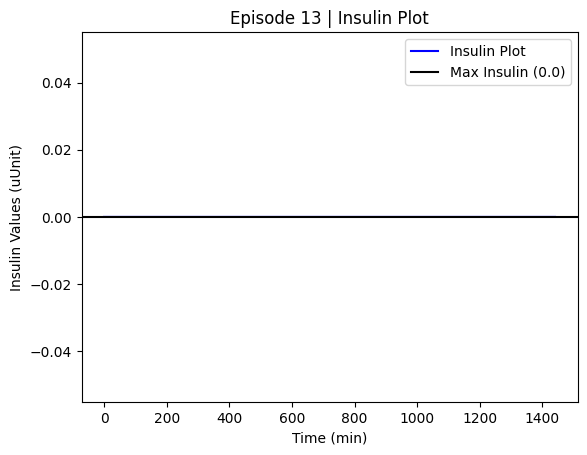

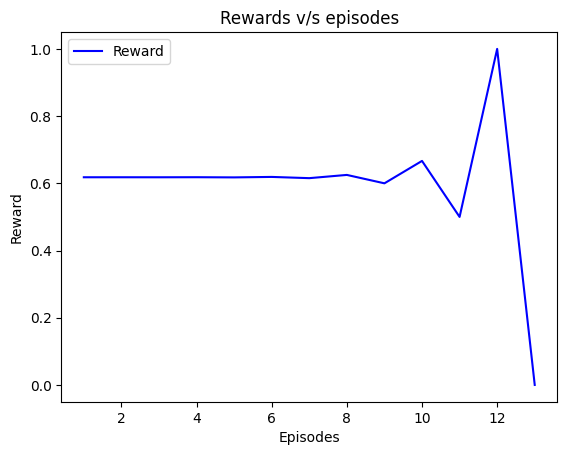

372 -> 6:12 (17g Carbs)
698 -> 11:38 (64g Carbs)
941 -> 15:41 (80g Carbs)
1431 -> 23:51 (70g Carbs)

Episode: 14 | Score (H<): 566,463,800,112.5094 | Max Time: 1441 | Max Glucose Level: 426.899 | Avg Insulin Given: 0.0 | Carb / Insulin: 10230.0


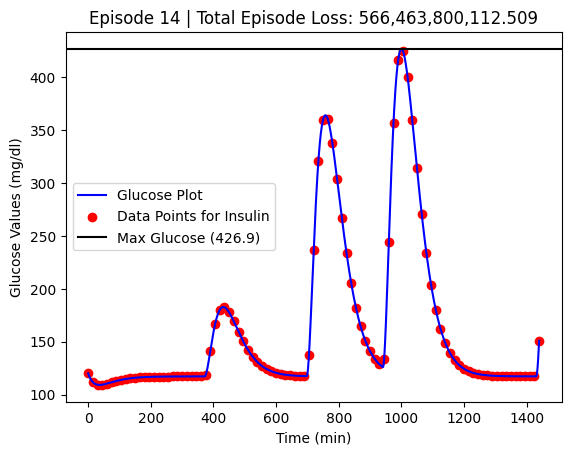

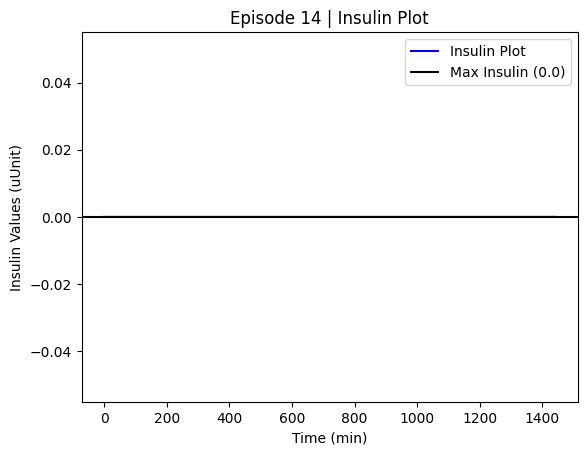

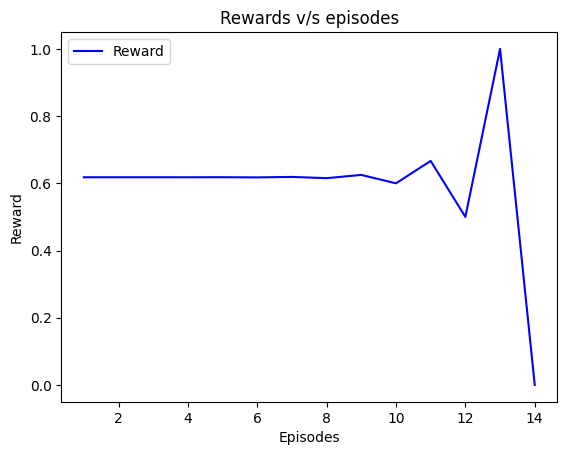

519 -> 8:39 (106g Carbs)
575 -> 9:35 (48g Carbs)
753 -> 12:33 (22g Carbs)
921 -> 15:21 (91g Carbs)

Episode: 15 | Score (H<): 469,763,672,421.34393 | Max Time: 1441 | Max Glucose Level: 411.822 | Avg Insulin Given: 0.0 | Carb / Insulin: 10266.0


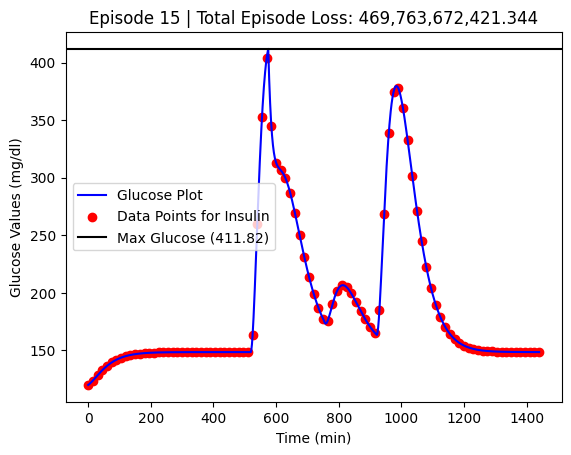

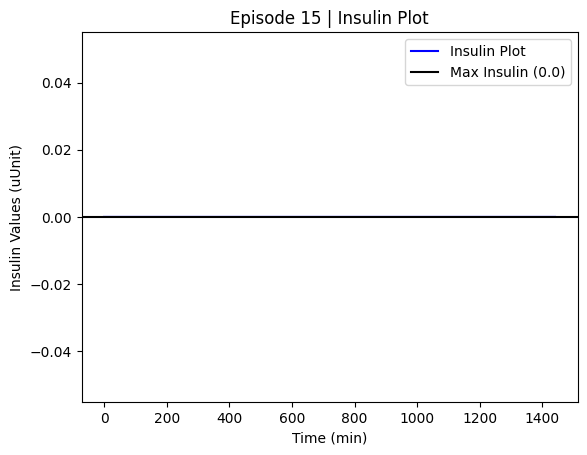

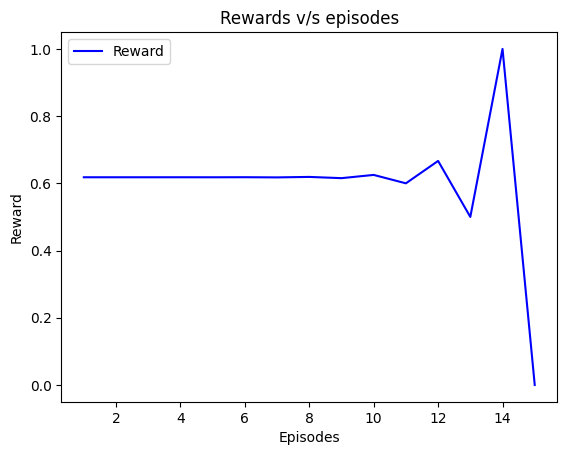

92 -> 1:32 (39g Carbs)
197 -> 3:17 (61g Carbs)
236 -> 3:56 (20g Carbs)
1283 -> 21:23 (86g Carbs)

Episode: 16 | Score (H<): 845,645,851,026.7982 | Max Time: 1441 | Max Glucose Level: 451.876 | Avg Insulin Given: 0.0 | Carb / Insulin: 10205.0


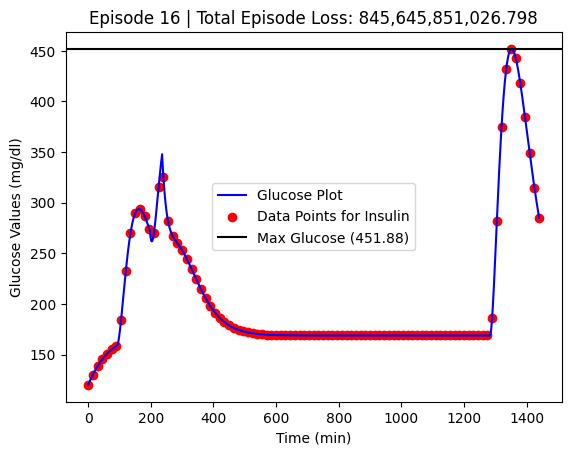

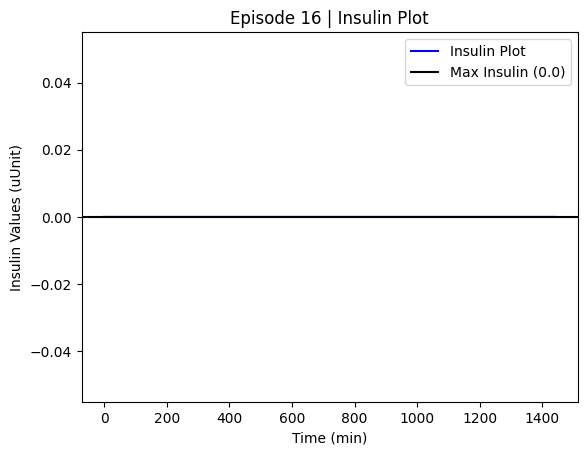

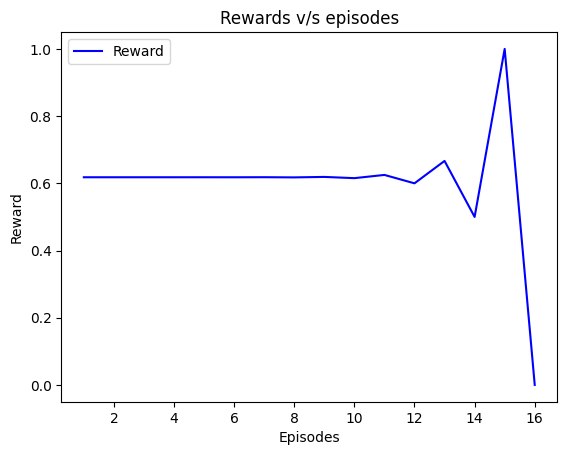

427 -> 7:07 (75g Carbs)
460 -> 7:40 (16g Carbs)
1228 -> 20:28 (38g Carbs)
1256 -> 20:56 (100g Carbs)

Episode: 17 | Score (H<): 2,828,617,453,069.2236 | Max Time: 1441 | Max Glucose Level: 585.336 | Avg Insulin Given: 0.0 | Carb / Insulin: 10228.0


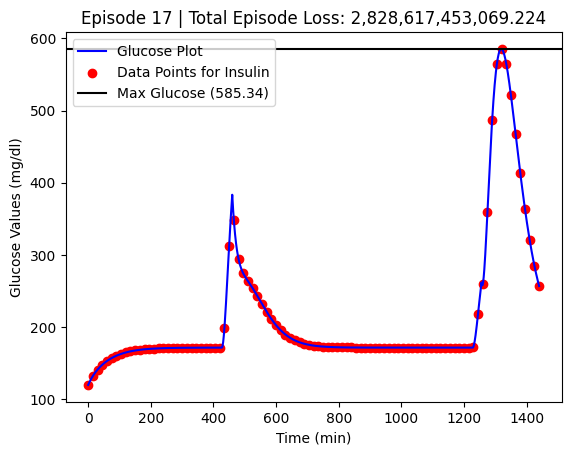

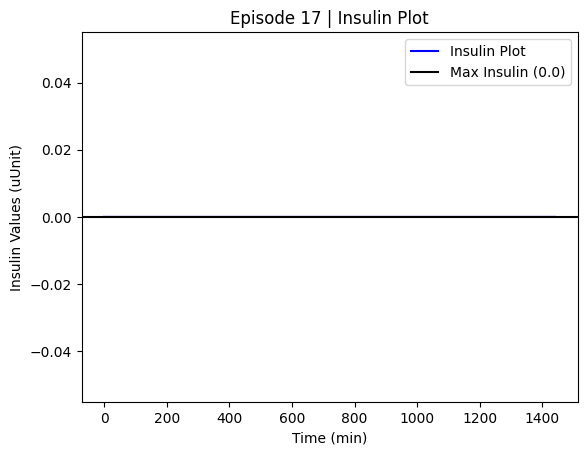

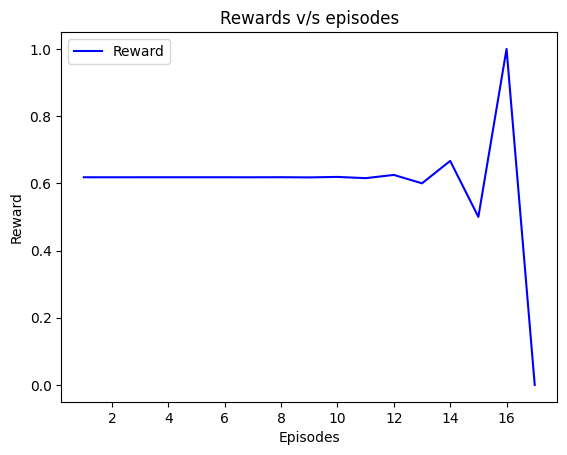

178 -> 2:58 (105g Carbs)
771 -> 12:51 (11g Carbs)
823 -> 13:43 (24g Carbs)
888 -> 14:48 (110g Carbs)
1430 -> 23:50 (13g Carbs)

Episode: 18 | Score (H<): 1,357,479,680,315.4937 | Max Time: 1441 | Max Glucose Level: 470.246 | Avg Insulin Given: 0.0 | Carb / Insulin: 10262.0


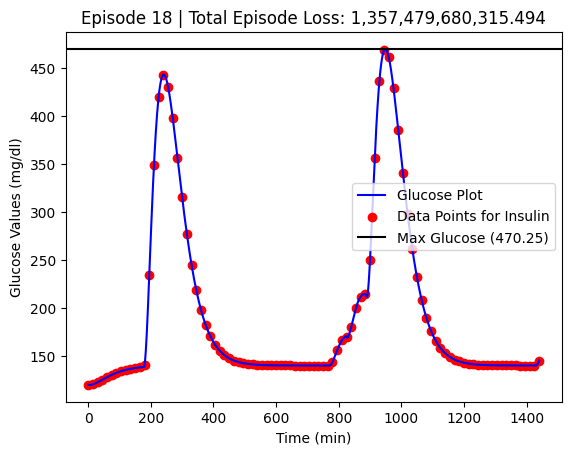

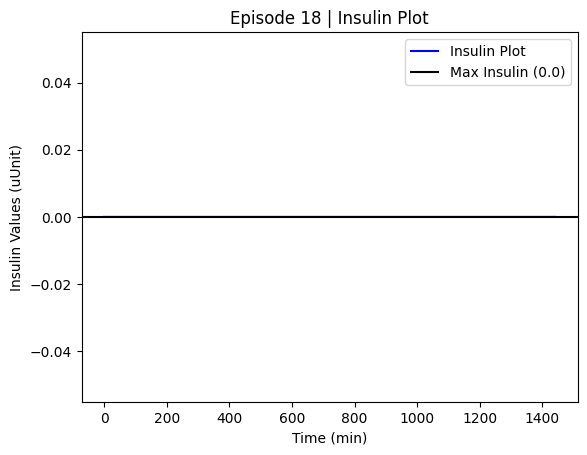

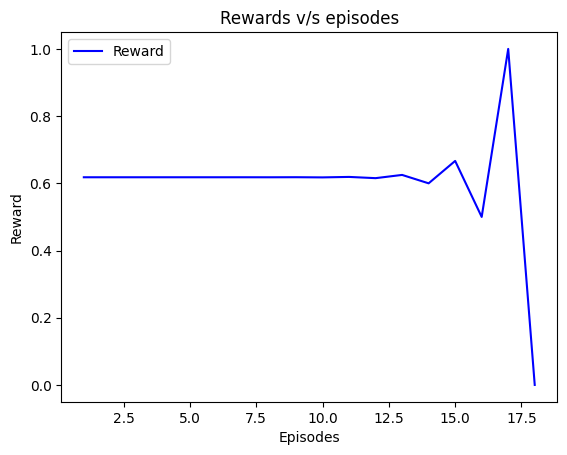

85 -> 1:25 (74g Carbs)
760 -> 12:40 (55g Carbs)

Episode: 19 | Score (H<): 3,151,379,690,096.48 | Max Time: 1441 | Max Glucose Level: 555.052 | Avg Insulin Given: 0.0 | Carb / Insulin: 10128.0


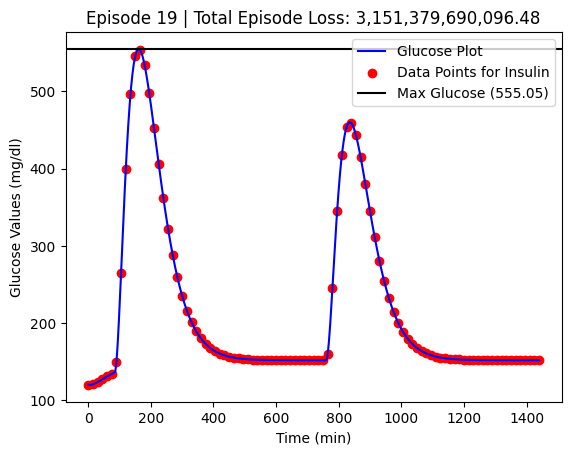

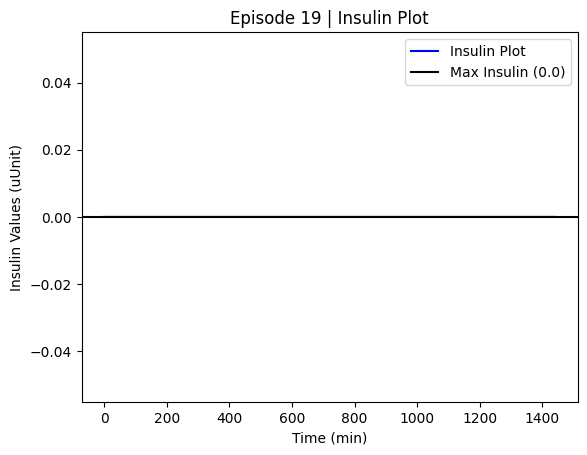

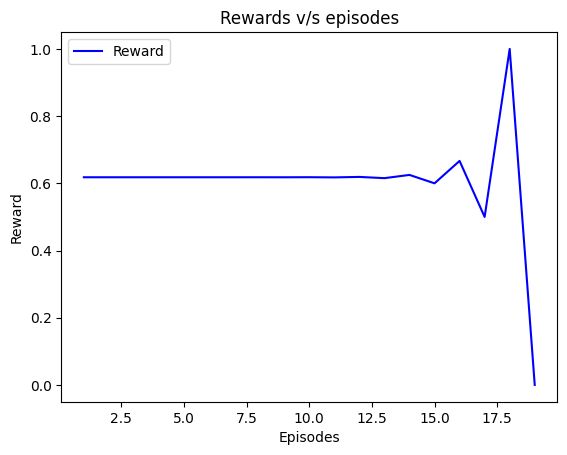

942 -> 15:42 (52g Carbs)
1132 -> 18:52 (106g Carbs)

Episode: 20 | Score (H<): 82,878,379,986.24011 | Max Time: 1441 | Max Glucose Level: 316.301 | Avg Insulin Given: 0.0 | Carb / Insulin: 10157.0


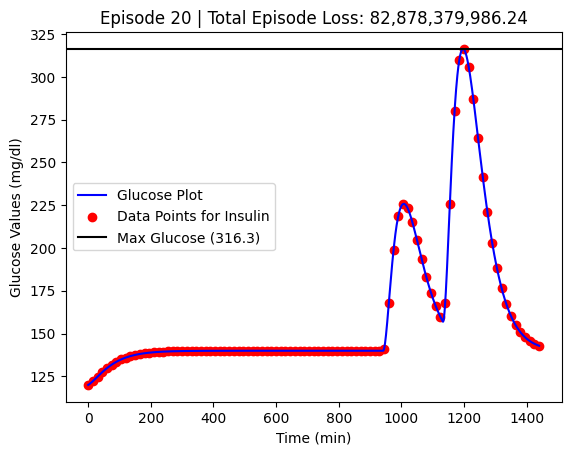

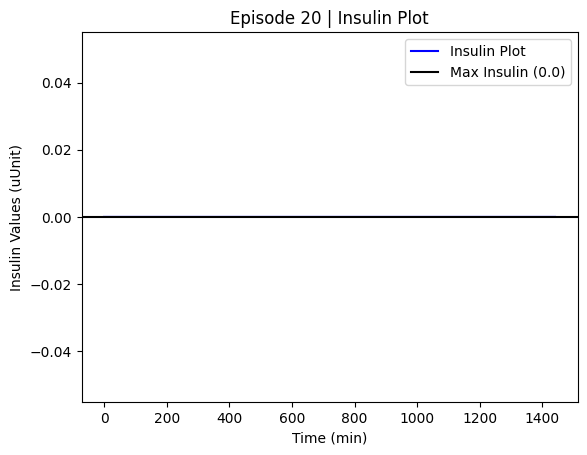

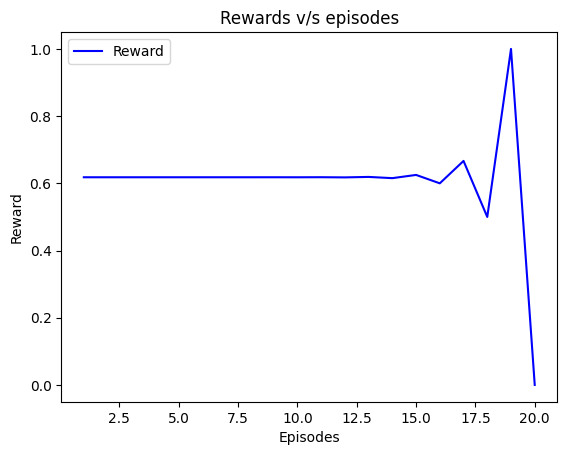

125 -> 2:05 (46g Carbs)
1085 -> 18:05 (58g Carbs)

Episode: 21 | Score (H<): 61,437,905,753.696396 | Max Time: 1441 | Max Glucose Level: 296.547 | Avg Insulin Given: 0.0 | Carb / Insulin: 10103.0


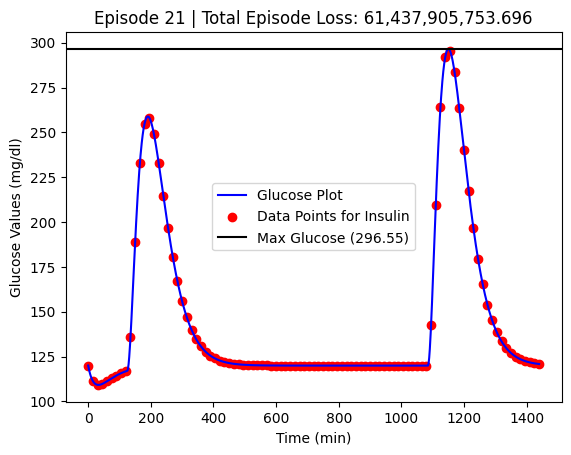

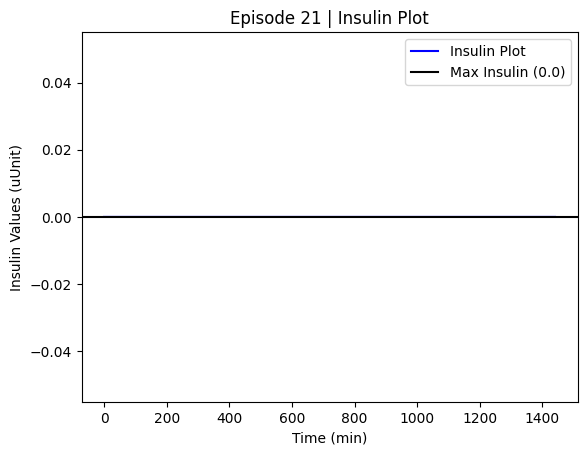

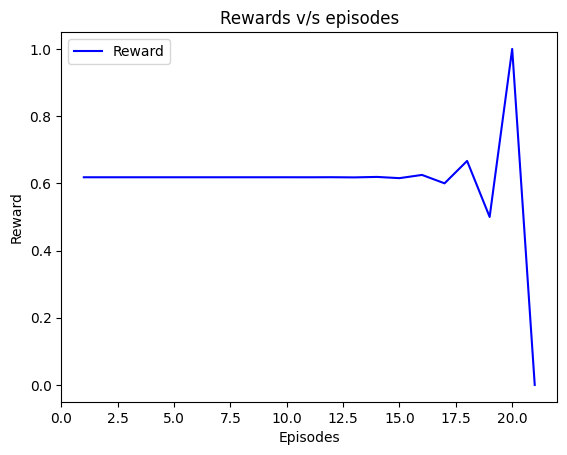

679 -> 11:19 (19g Carbs)
947 -> 15:47 (11g Carbs)
1298 -> 21:38 (105g Carbs)

Episode: 22 | Score (H<): 190,172,575,838.03656 | Max Time: 1441 | Max Glucose Level: 365.589 | Avg Insulin Given: 0.0 | Carb / Insulin: 10134.0


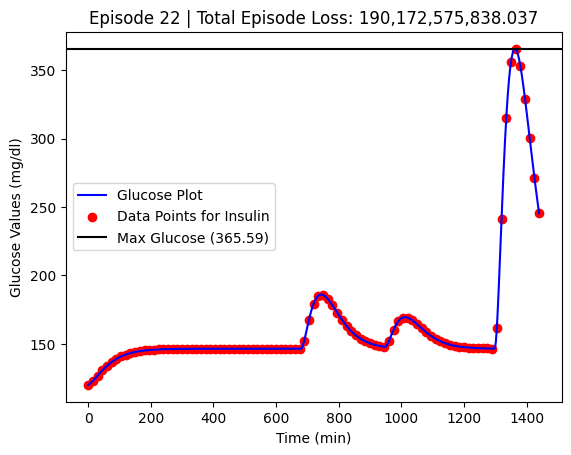

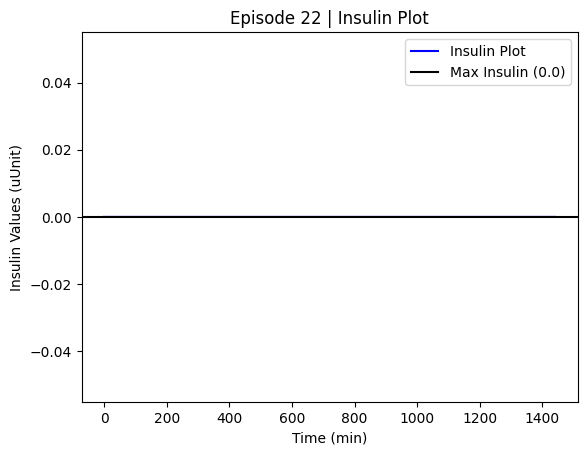

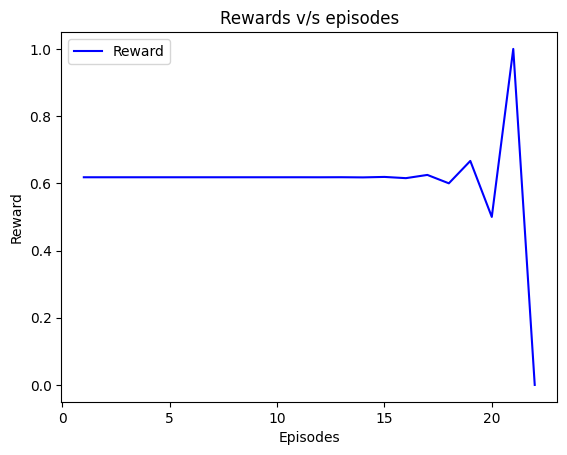

223 -> 3:43 (111g Carbs)
456 -> 7:36 (41g Carbs)

Episode: 23 | Score (H<): 740,432,739,155.5251 | Max Time: 1441 | Max Glucose Level: 455.166 | Avg Insulin Given: 0.0 | Carb / Insulin: 10151.0


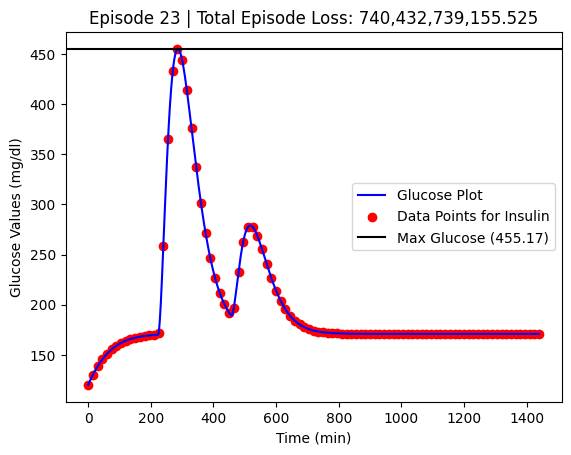

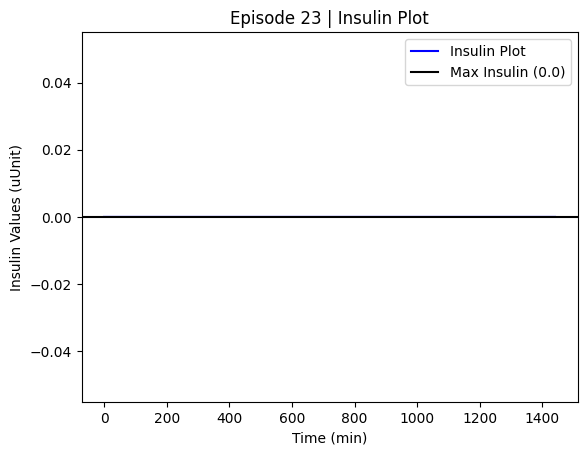

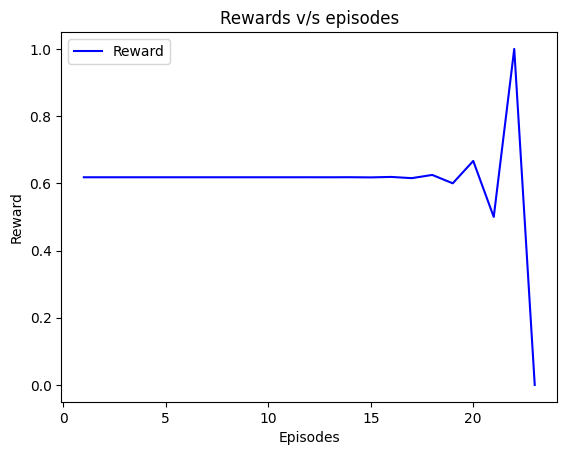

135 -> 2:15 (85g Carbs)
188 -> 3:08 (46g Carbs)
1199 -> 19:59 (20g Carbs)
1432 -> 23:52 (102g Carbs)

Episode: 24 | Score (H<): 647,525,404,241.7098 | Max Time: 1441 | Max Glucose Level: 471.055 | Avg Insulin Given: 0.0 | Carb / Insulin: 10252.0


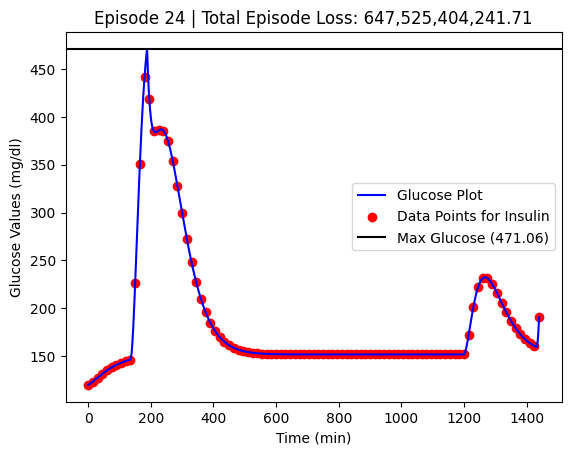

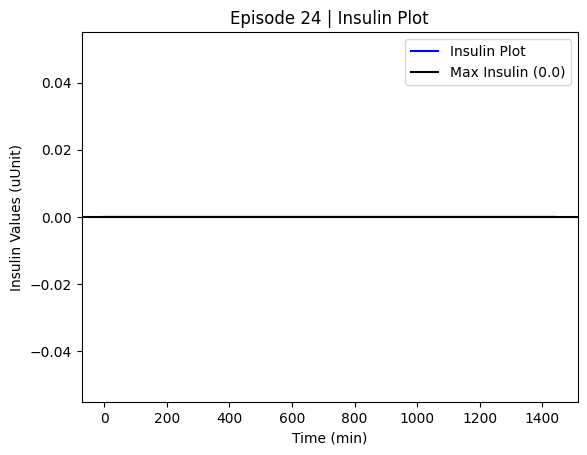

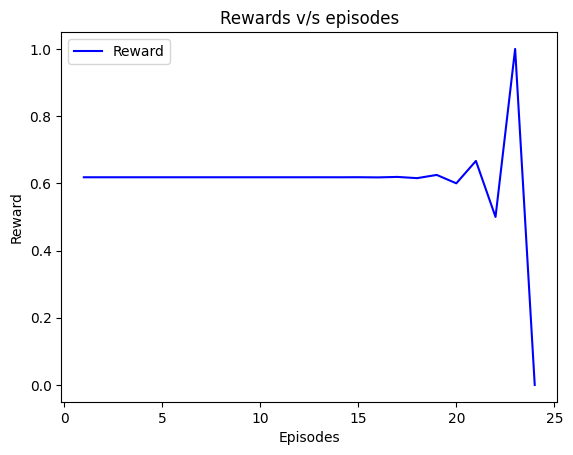

278 -> 4:38 (74g Carbs)
391 -> 6:31 (23g Carbs)
489 -> 8:09 (105g Carbs)
1288 -> 21:28 (110g Carbs)
1391 -> 23:11 (104g Carbs)

Episode: 25 | Score (H<): 1,240,104,947,012.3127 | Max Time: 1441 | Max Glucose Level: 434.156 | Avg Insulin Given: 0.0 | Carb / Insulin: 10415.0


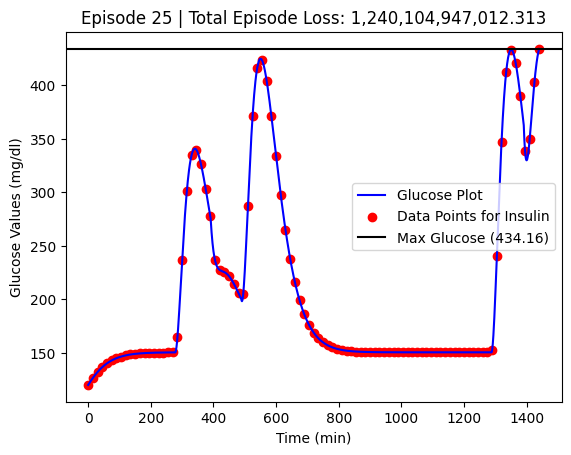

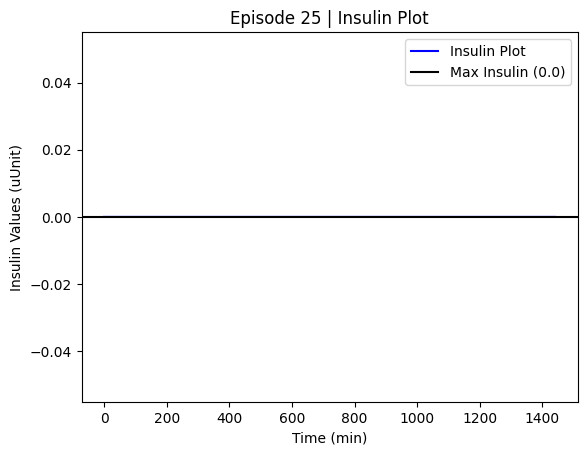

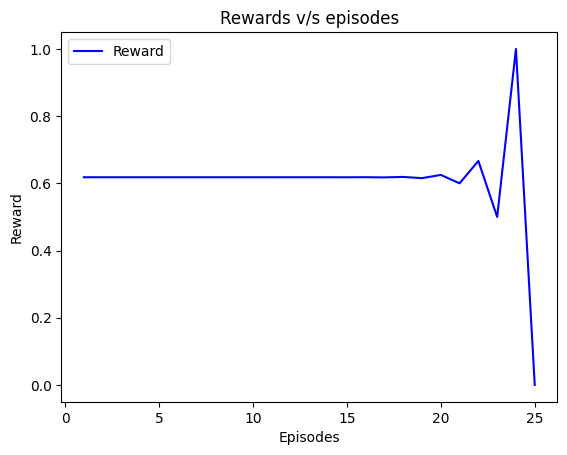

36 -> 0:36 (18g Carbs)
155 -> 2:35 (46g Carbs)
326 -> 5:26 (117g Carbs)
378 -> 6:18 (75g Carbs)
1015 -> 16:55 (25g Carbs)

Episode: 26 | Score (H<): 109,520,216,672.05417 | Max Time: 1441 | Max Glucose Level: 345.418 | Avg Insulin Given: 0.0 | Carb / Insulin: 10280.0


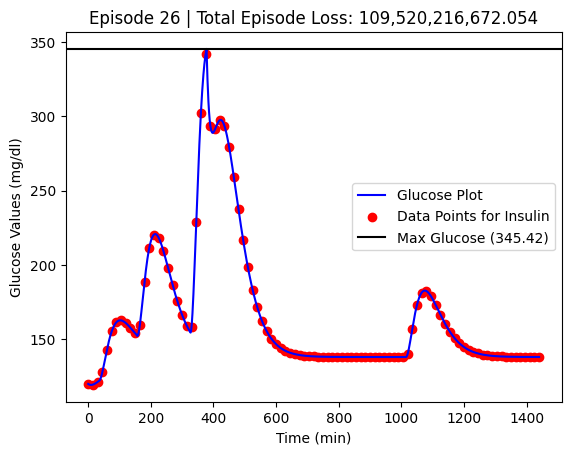

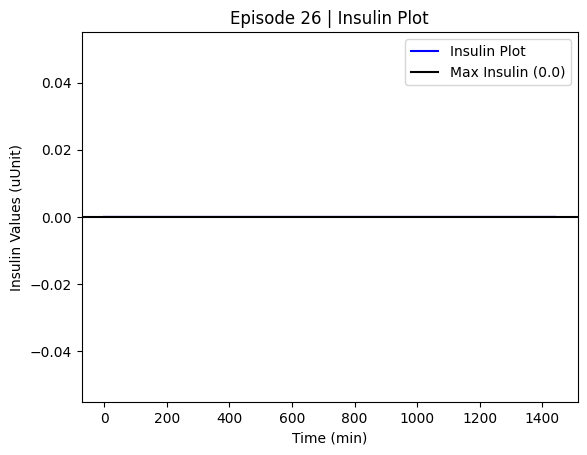

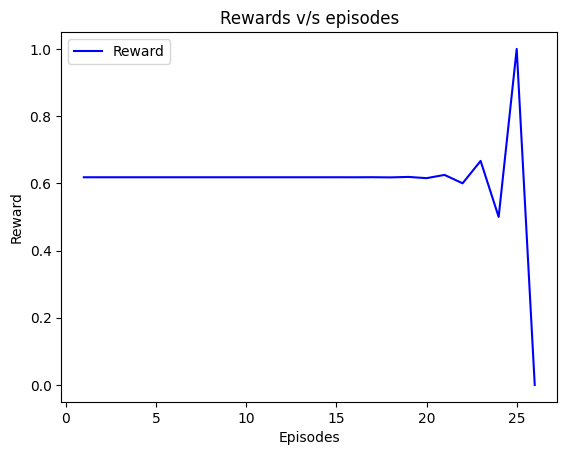

811 -> 13:31 (31g Carbs)
1148 -> 19:08 (21g Carbs)

Episode: 27 | Score (H<): 3,846,650,005.1212626 | Max Time: 1441 | Max Glucose Level: 213.246 | Avg Insulin Given: 0.0 | Carb / Insulin: 10051.0


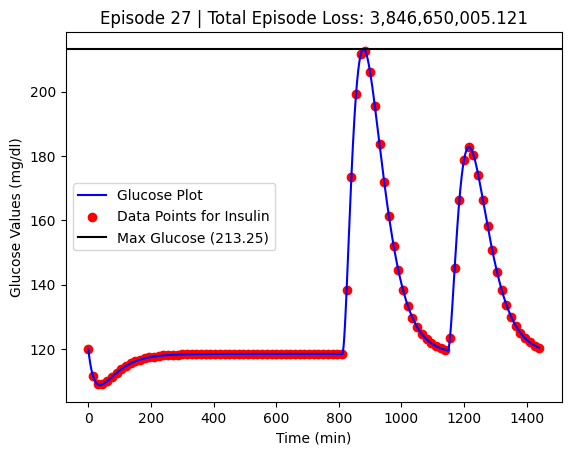

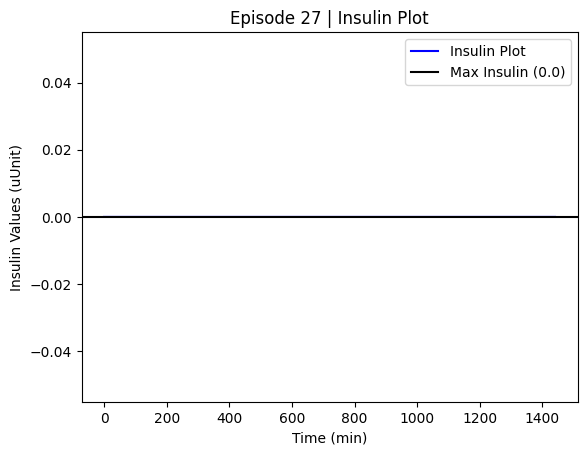

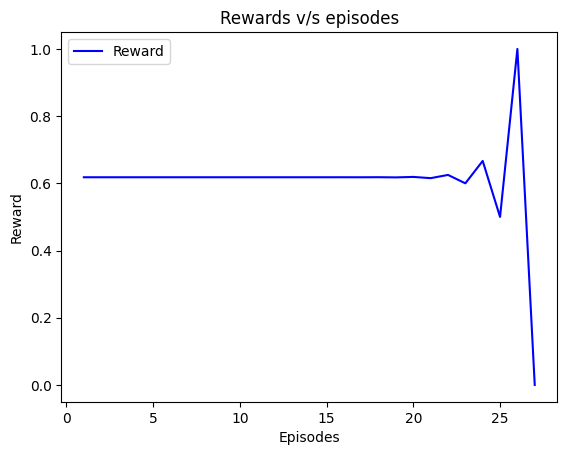

187 -> 3:07 (103g Carbs)
969 -> 16:09 (108g Carbs)

Episode: 28 | Score (H<): 414,321,200,924.9184 | Max Time: 1441 | Max Glucose Level: 379.393 | Avg Insulin Given: 0.0 | Carb / Insulin: 10210.0


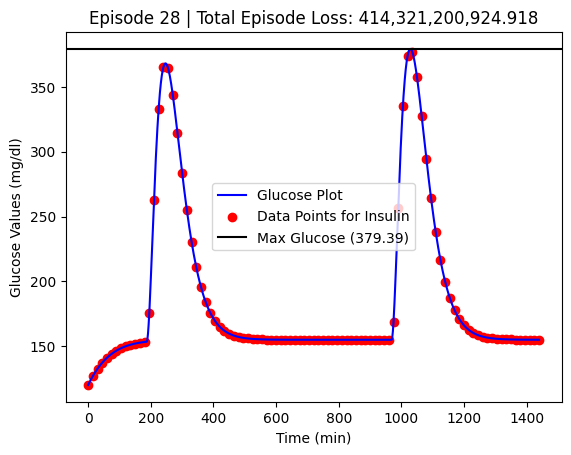

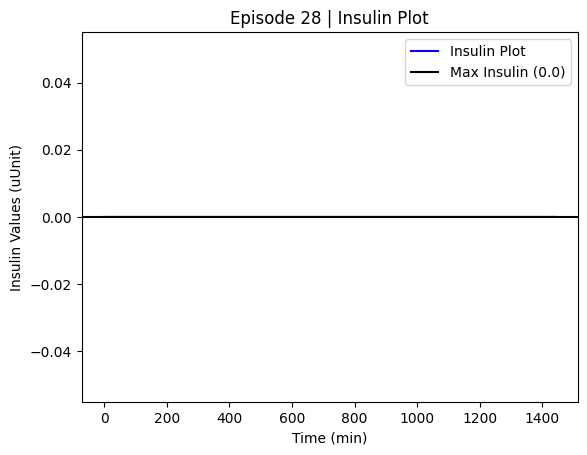

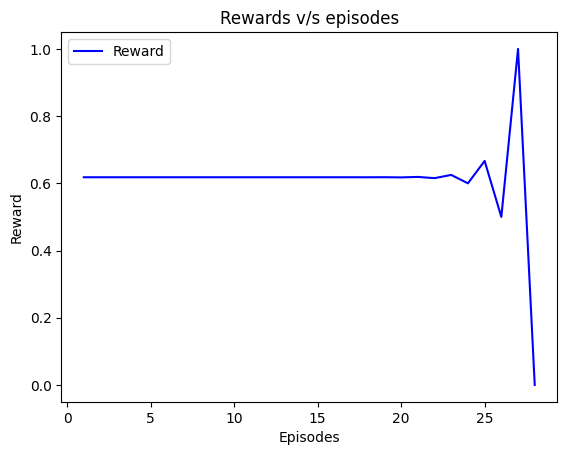

137 -> 2:17 (21g Carbs)
277 -> 4:37 (103g Carbs)
1110 -> 18:30 (99g Carbs)

Episode: 29 | Score (H<): 2,359,369,486,321.2686 | Max Time: 1441 | Max Glucose Level: 507.608 | Avg Insulin Given: 0.0 | Carb / Insulin: 10222.0


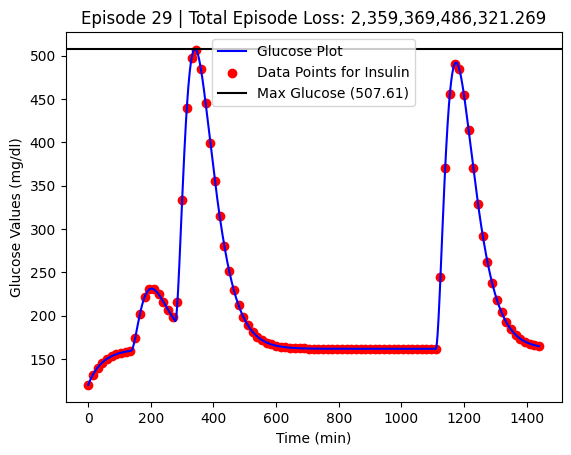

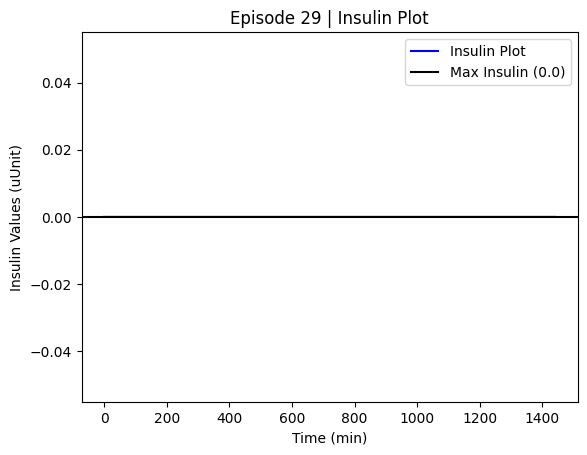

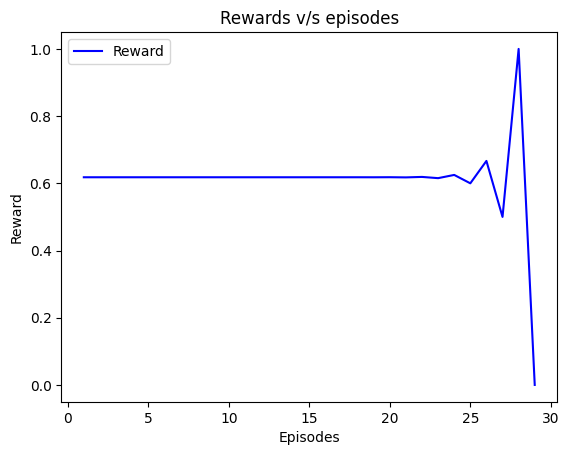

372 -> 6:12 (56g Carbs)
1024 -> 17:04 (42g Carbs)
1068 -> 17:48 (90g Carbs)
1153 -> 19:13 (34g Carbs)
1249 -> 20:49 (85g Carbs)

Episode: 30 | Score (H<): 130,765,526,965.9974 | Max Time: 1441 | Max Glucose Level: 315.304 | Avg Insulin Given: 0.0 | Carb / Insulin: 10306.0


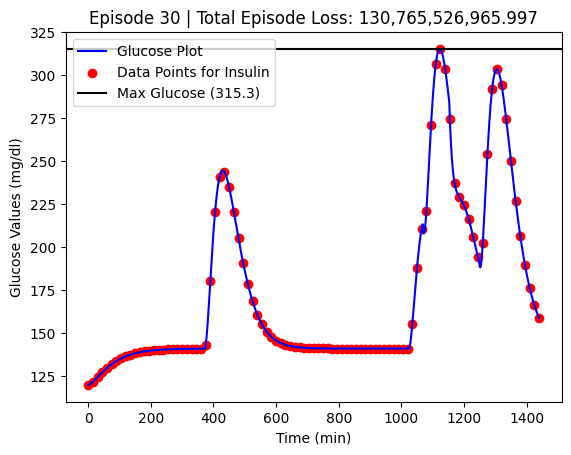

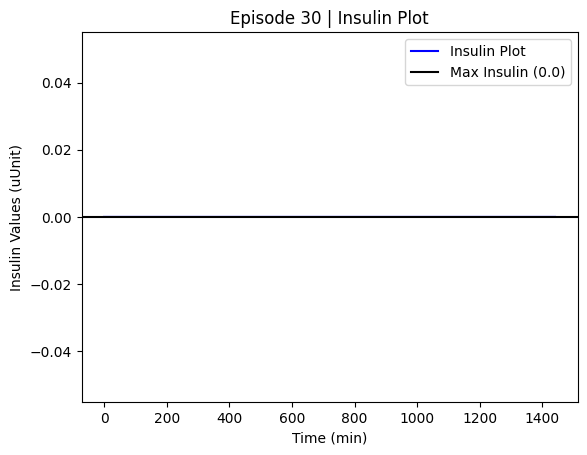

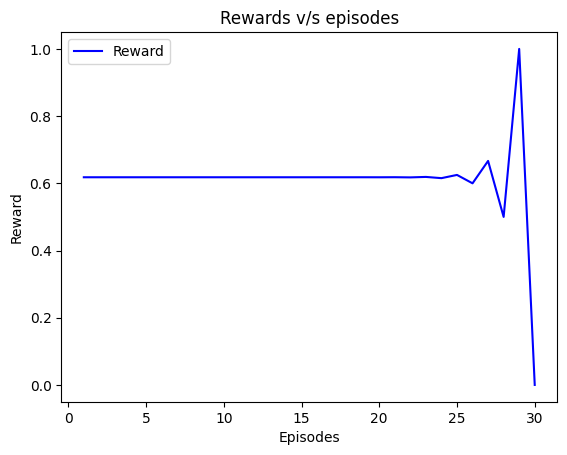

450 -> 7:30 (17g Carbs)
488 -> 8:08 (73g Carbs)
578 -> 9:38 (46g Carbs)
596 -> 9:56 (105g Carbs)
1061 -> 17:41 (86g Carbs)

Episode: 31 | Score (H<): 3,624,169,779,356.52 | Max Time: 1441 | Max Glucose Level: 562.68 | Avg Insulin Given: 0.0 | Carb / Insulin: 10326.0


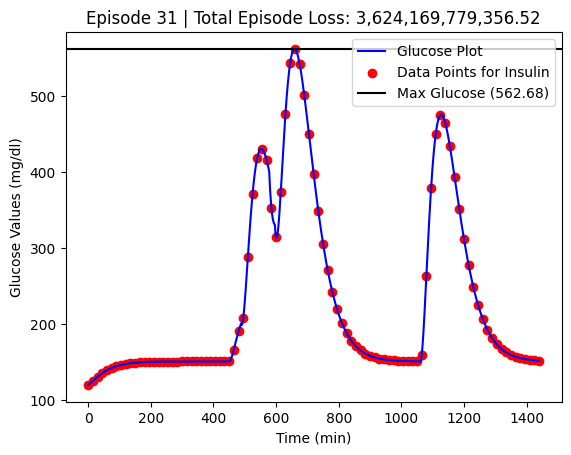

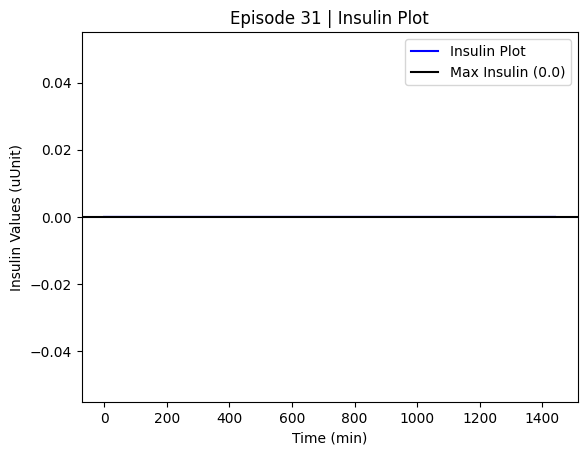

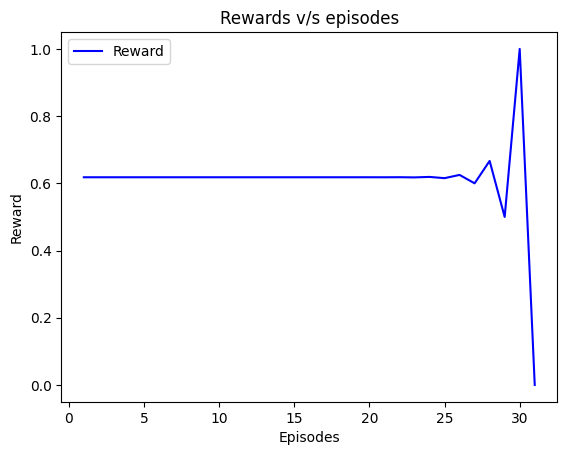

294 -> 4:54 (89g Carbs)
398 -> 6:38 (113g Carbs)

Episode: 32 | Score (H<): 92,579,371,845.82607 | Max Time: 1441 | Max Glucose Level: 314.915 | Avg Insulin Given: 0.0 | Carb / Insulin: 10201.0


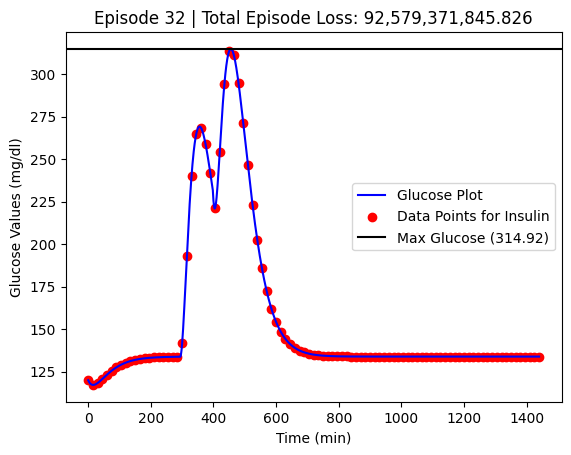

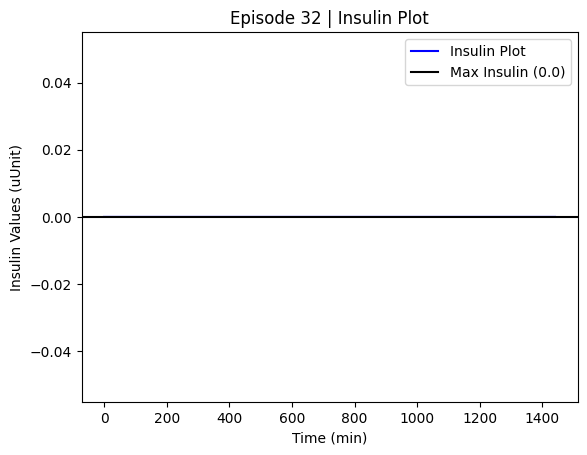

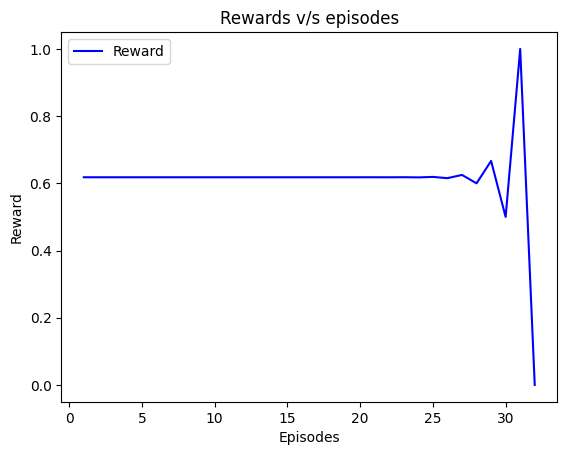

1079 -> 17:59 (20g Carbs)
1214 -> 20:14 (104g Carbs)

Episode: 33 | Score (H<): 314,462,557,921.7351 | Max Time: 1441 | Max Glucose Level: 404.184 | Avg Insulin Given: 0.0 | Carb / Insulin: 10123.0


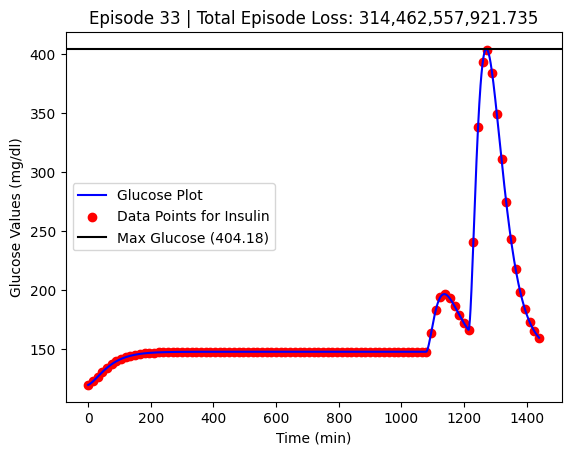

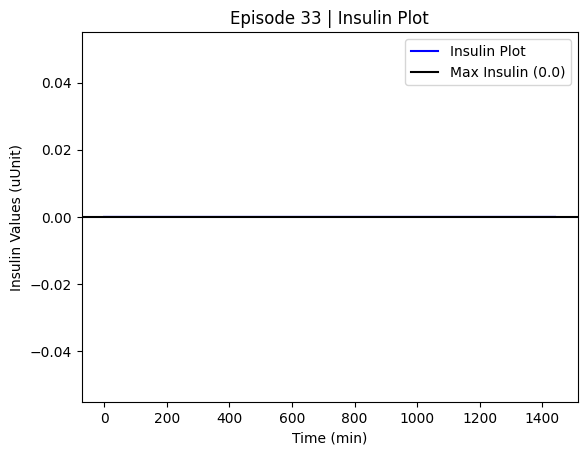

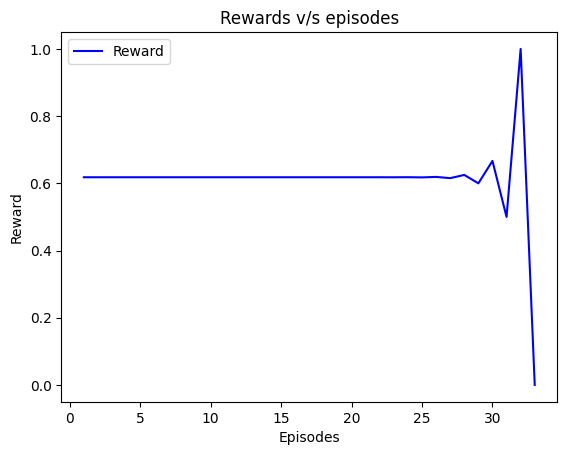

544 -> 9:04 (49g Carbs)
1129 -> 18:49 (89g Carbs)

Episode: 34 | Score (H<): 107,441,094,427.08992 | Max Time: 1441 | Max Glucose Level: 317.236 | Avg Insulin Given: 0.0 | Carb / Insulin: 10137.0


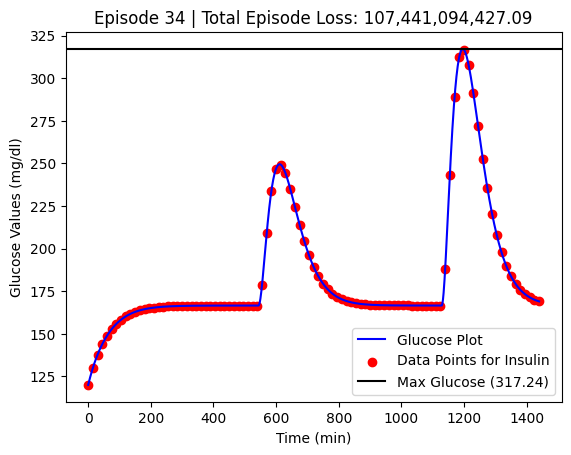

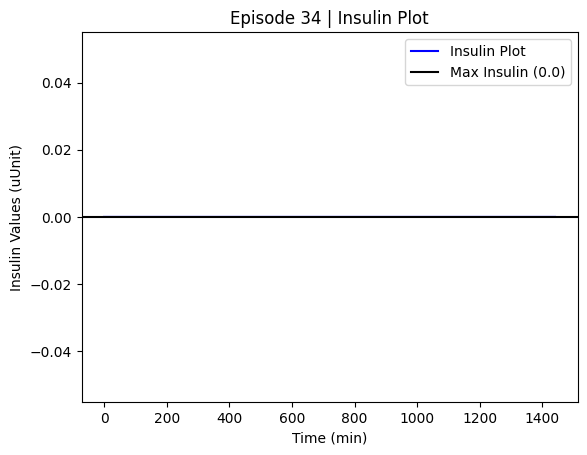

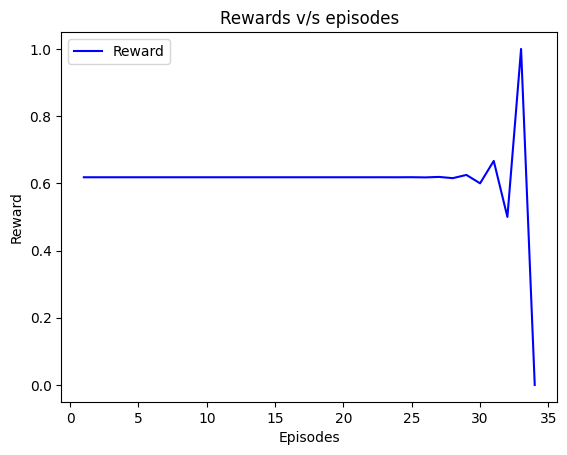

667 -> 11:07 (12g Carbs)
909 -> 15:09 (28g Carbs)
1017 -> 16:57 (82g Carbs)

Episode: 35 | Score (H<): 137,673,222,898.08322 | Max Time: 1441 | Max Glucose Level: 360.125 | Avg Insulin Given: 0.0 | Carb / Insulin: 10121.0


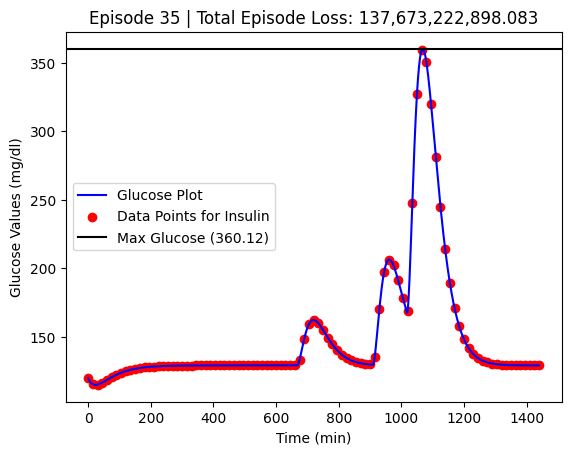

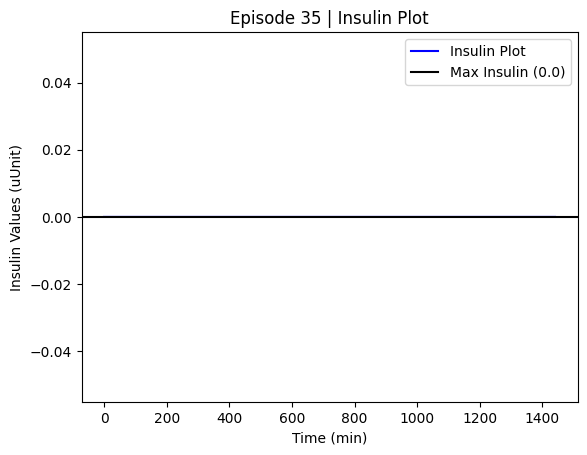

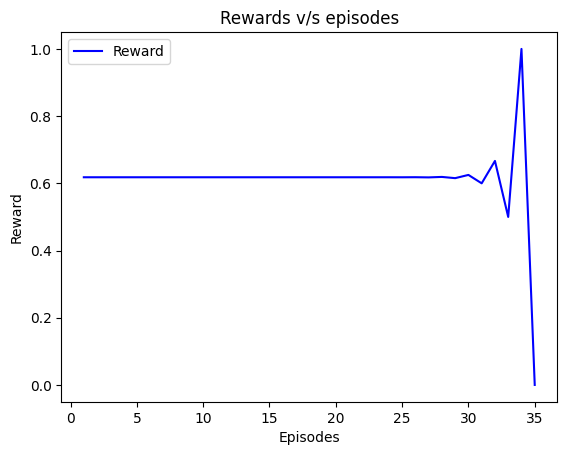

568 -> 9:28 (81g Carbs)
580 -> 9:40 (90g Carbs)
868 -> 14:28 (65g Carbs)

Episode: 36 | Score (H<): 116,476,395,062.06276 | Max Time: 1441 | Max Glucose Level: 322.41 | Avg Insulin Given: 0.0 | Carb / Insulin: 10235.0


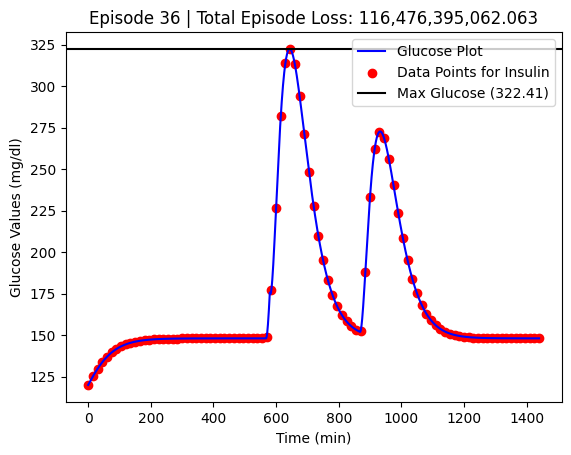

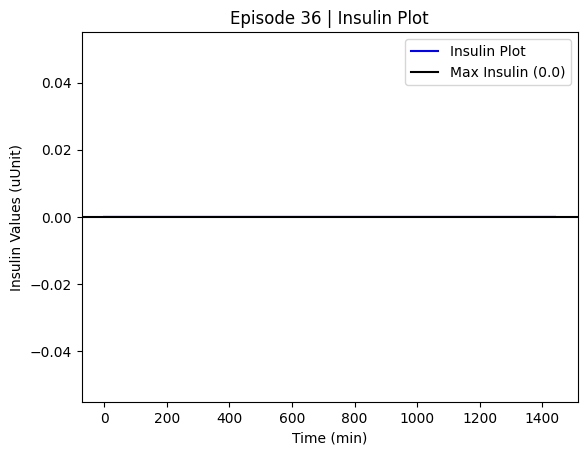

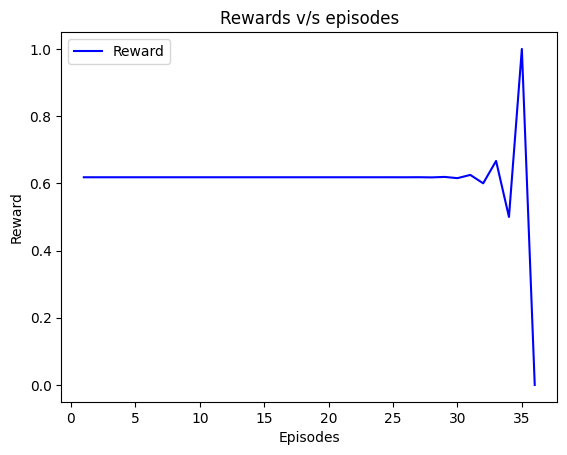

510 -> 8:30 (27g Carbs)
1078 -> 17:58 (59g Carbs)
1345 -> 22:25 (99g Carbs)
1351 -> 22:31 (54g Carbs)

Episode: 37 | Score (H<): 530,808,118,923.9971 | Max Time: 1441 | Max Glucose Level: 396.419 | Avg Insulin Given: 0.0 | Carb / Insulin: 10238.0


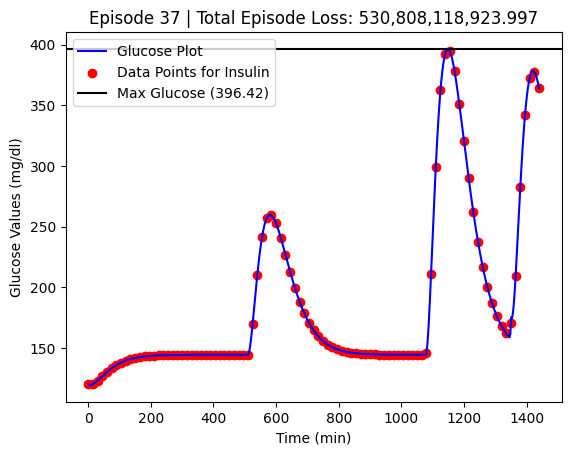

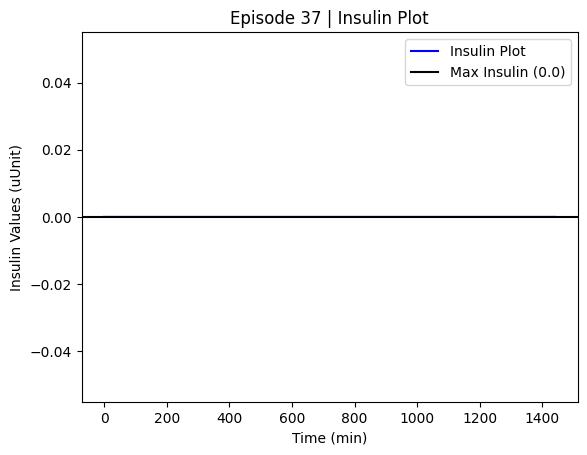

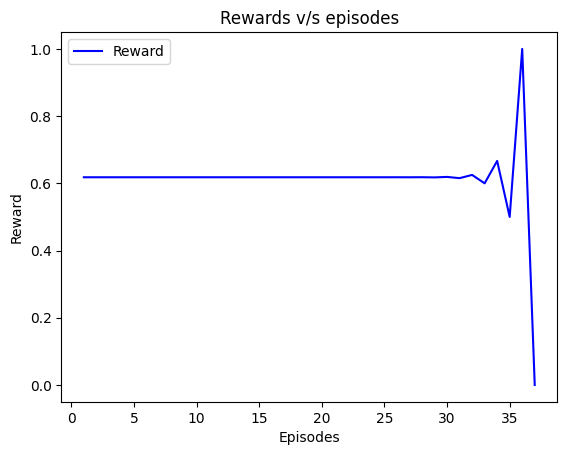

54 -> 0:54 (64g Carbs)
68 -> 1:08 (54g Carbs)
239 -> 3:59 (31g Carbs)

Episode: 38 | Score (H<): 91,720,076,035.63908 | Max Time: 1441 | Max Glucose Level: 305.082 | Avg Insulin Given: 0.0 | Carb / Insulin: 10148.0


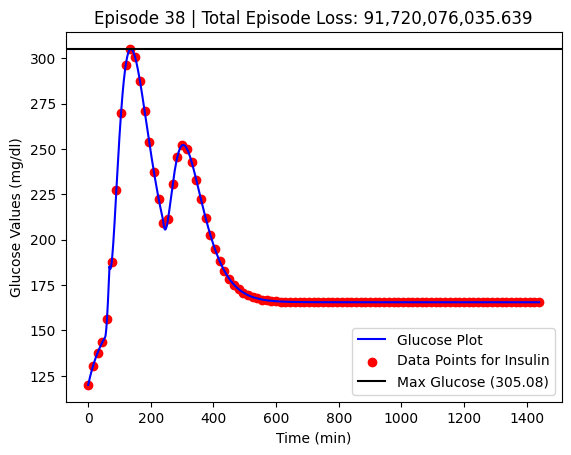

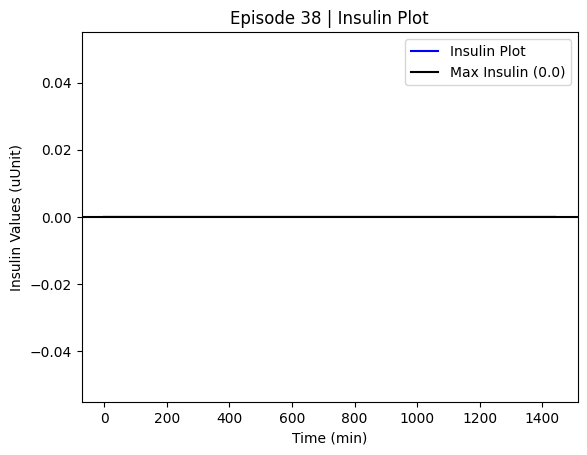

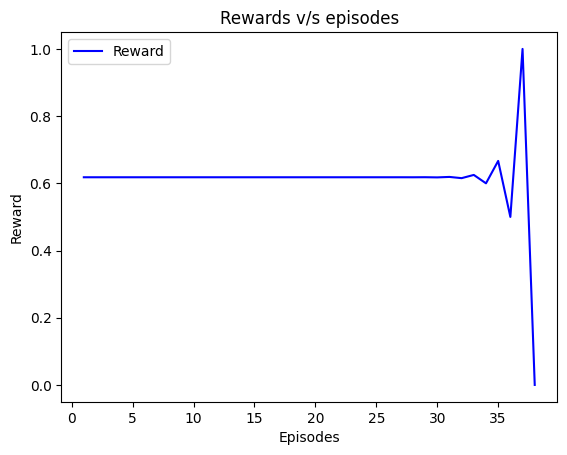

447 -> 7:27 (112g Carbs)
1110 -> 18:30 (21g Carbs)
1234 -> 20:34 (104g Carbs)
1298 -> 21:38 (42g Carbs)
1424 -> 23:44 (11g Carbs)

Episode: 39 | Score (H<): 943,676,254,899.4548 | Max Time: 1441 | Max Glucose Level: 453.023 | Avg Insulin Given: 0.0 | Carb / Insulin: 10289.0


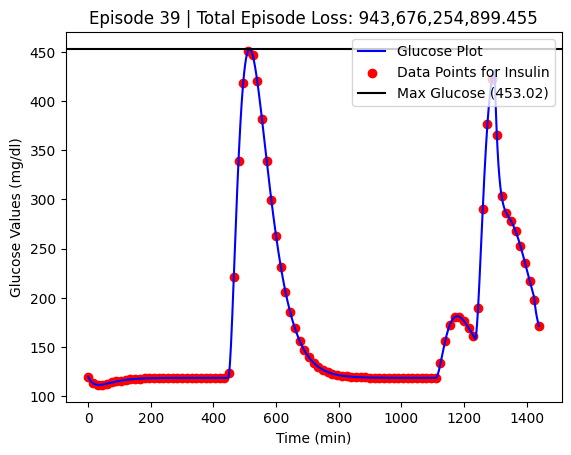

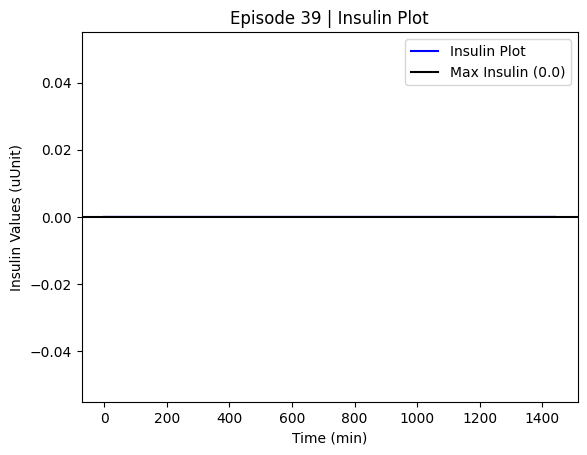

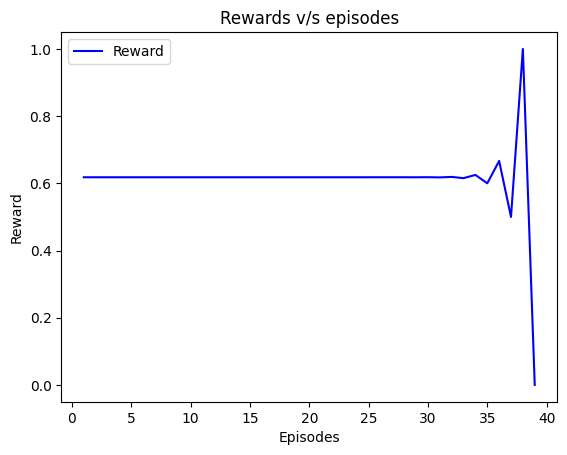

310 -> 5:10 (94g Carbs)
593 -> 9:53 (13g Carbs)
845 -> 14:05 (103g Carbs)

Episode: 40 | Score (H<): 1,043,953,376,155.9967 | Max Time: 1441 | Max Glucose Level: 439.069 | Avg Insulin Given: 0.0 | Carb / Insulin: 10209.0


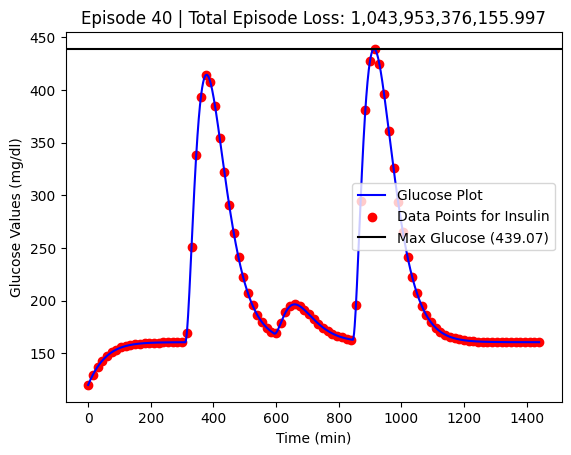

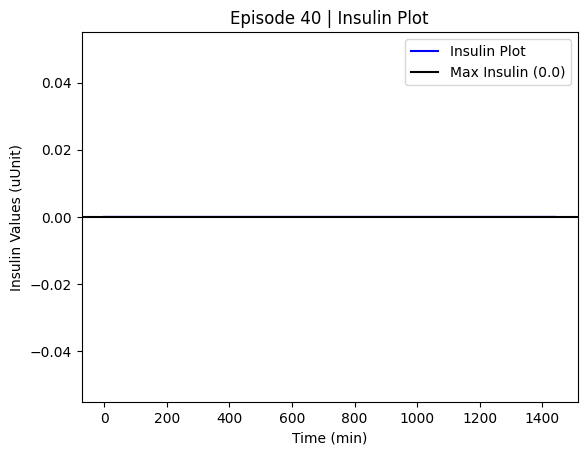

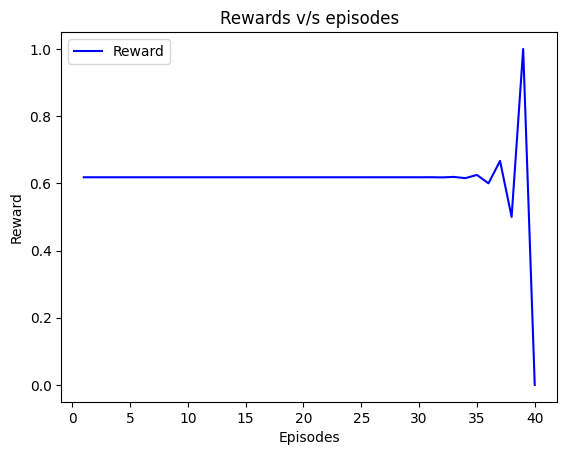

524 -> 8:44 (45g Carbs)
872 -> 14:32 (12g Carbs)

Episode: 41 | Score (H<): 28,257,704,369.386276 | Max Time: 1441 | Max Glucose Level: 264.288 | Avg Insulin Given: 0.0 | Carb / Insulin: 10056.0


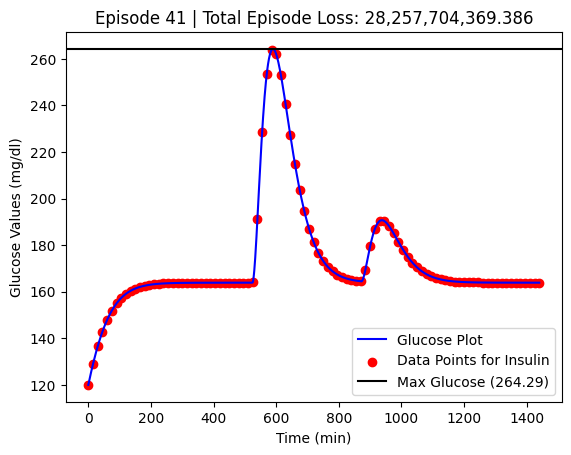

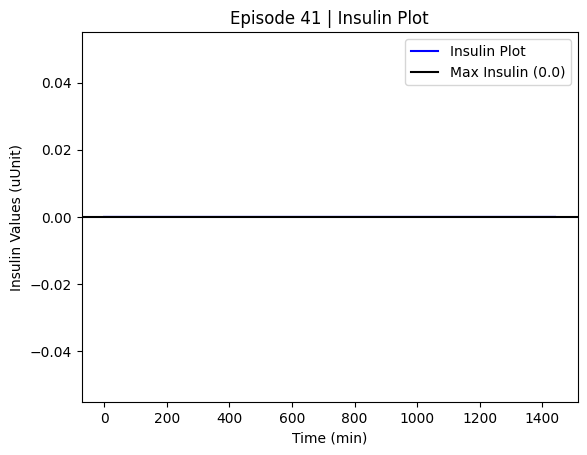

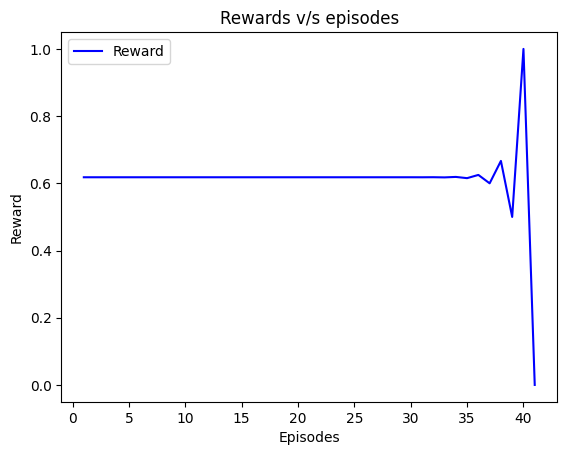

22 -> 0:22 (36g Carbs)
620 -> 10:20 (46g Carbs)
731 -> 12:11 (28g Carbs)
934 -> 15:34 (79g Carbs)
1259 -> 20:59 (50g Carbs)

Episode: 42 | Score (H<): 636,524,160,972.4062 | Max Time: 1441 | Max Glucose Level: 426.394 | Avg Insulin Given: 0.0 | Carb / Insulin: 10238.0


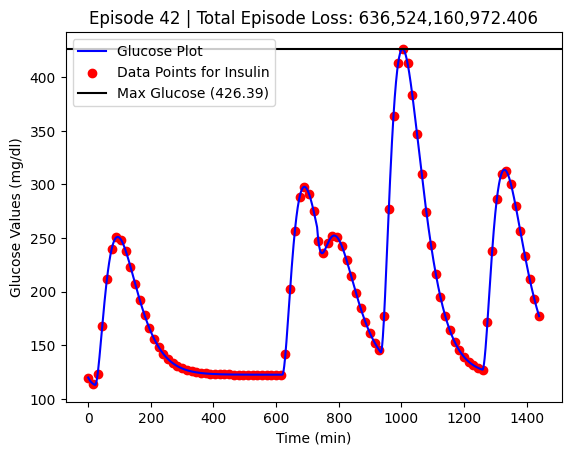

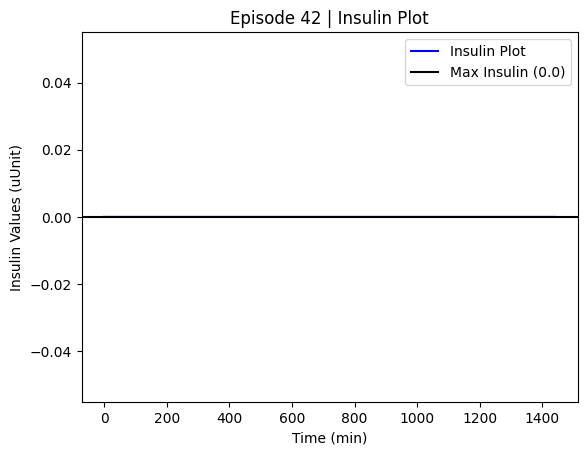

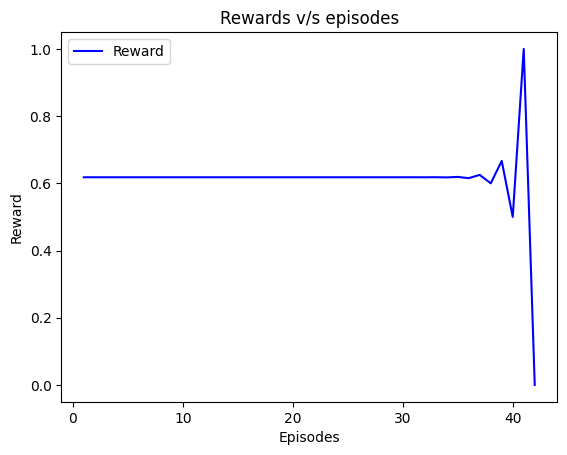

409 -> 6:49 (36g Carbs)
511 -> 8:31 (84g Carbs)
526 -> 8:46 (113g Carbs)
1067 -> 17:47 (26g Carbs)
1079 -> 17:59 (91g Carbs)

Episode: 43 | Score (H<): 660,243,675,963.9382 | Max Time: 1441 | Max Glucose Level: 425.539 | Avg Insulin Given: 0.0 | Carb / Insulin: 10349.0


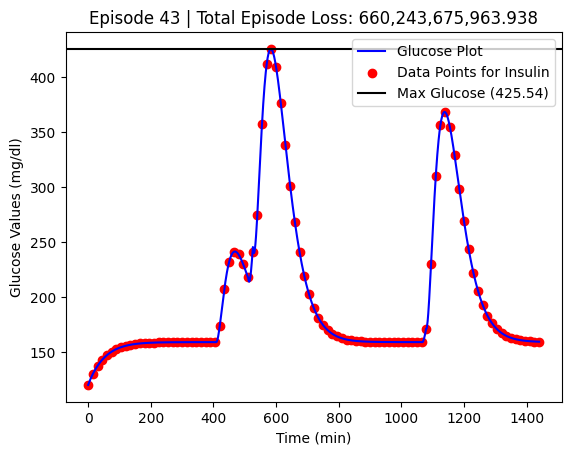

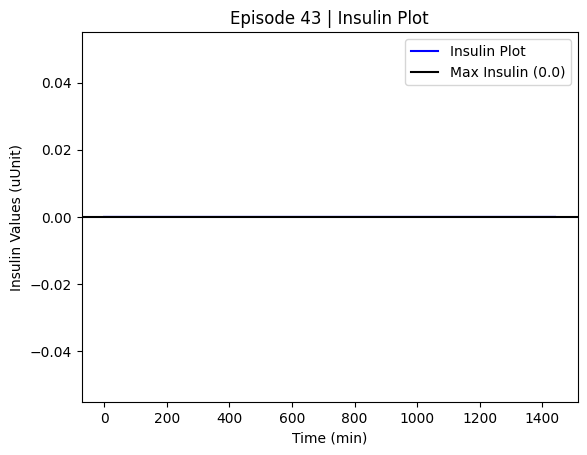

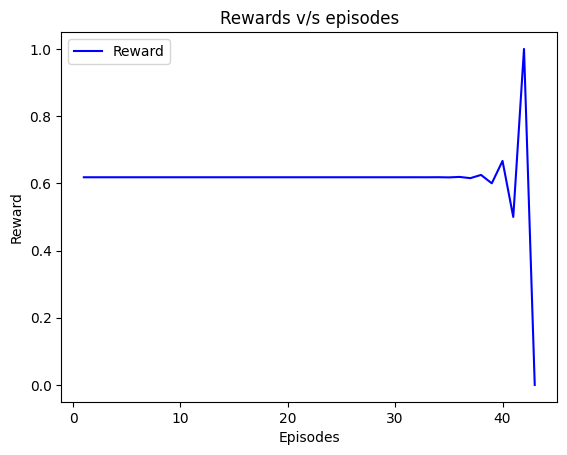

251 -> 4:11 (110g Carbs)
316 -> 5:16 (82g Carbs)
397 -> 6:37 (107g Carbs)
573 -> 9:33 (119g Carbs)
602 -> 10:02 (19g Carbs)

Episode: 44 | Score (H<): 5,131,729,295,307.416 | Max Time: 1441 | Max Glucose Level: 573.634 | Avg Insulin Given: 0.0 | Carb / Insulin: 10436.0


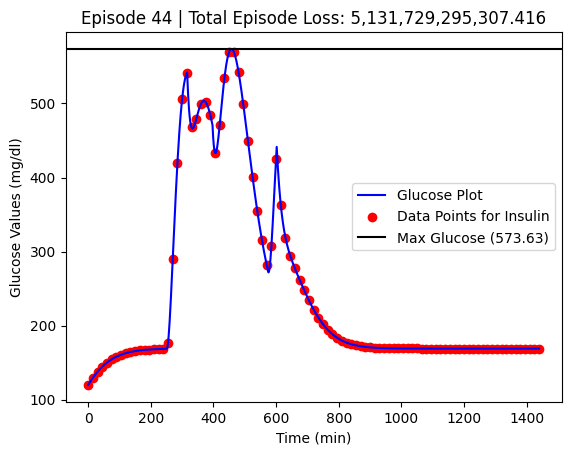

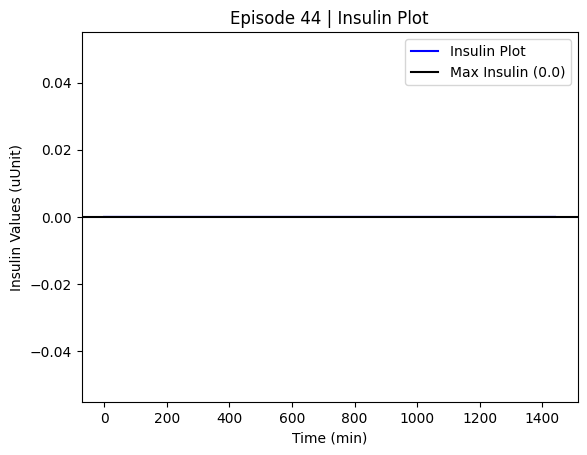

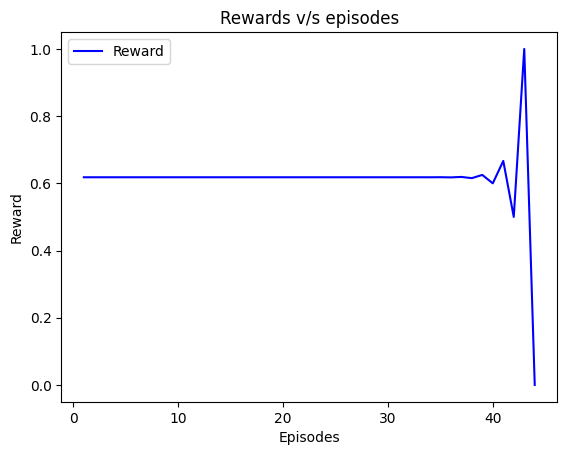

452 -> 7:32 (36g Carbs)
719 -> 11:59 (60g Carbs)
721 -> 12:01 (99g Carbs)
1092 -> 18:12 (20g Carbs)

Episode: 45 | Score (H<): 1,516,950,041,367.3142 | Max Time: 1441 | Max Glucose Level: 529.38 | Avg Insulin Given: 0.0 | Carb / Insulin: 10214.0


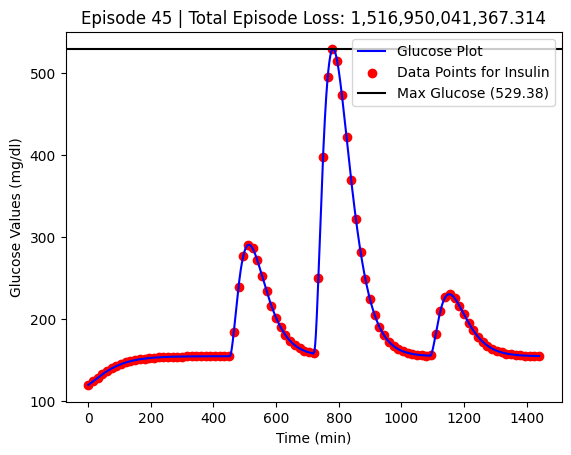

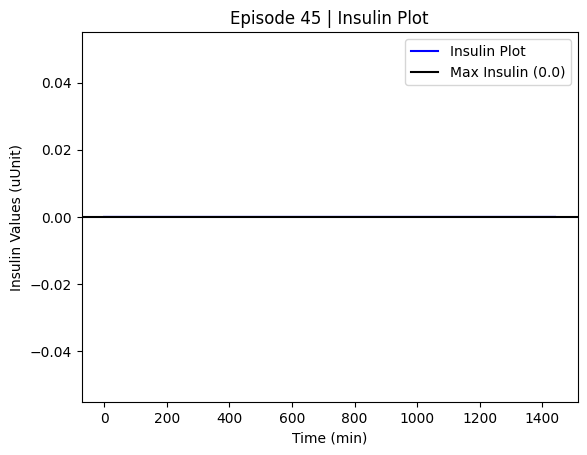

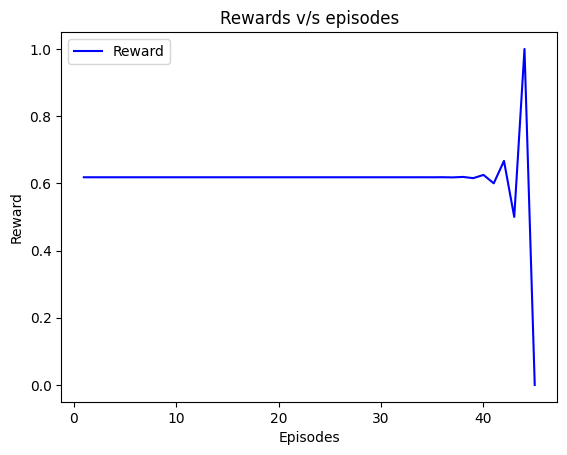

26 -> 0:26 (21g Carbs)
612 -> 10:12 (52g Carbs)
664 -> 11:04 (30g Carbs)
1244 -> 20:44 (27g Carbs)

Episode: 46 | Score (H<): 46,793,955,561.11224 | Max Time: 1441 | Max Glucose Level: 290.77 | Avg Insulin Given: 0.0 | Carb / Insulin: 10129.0


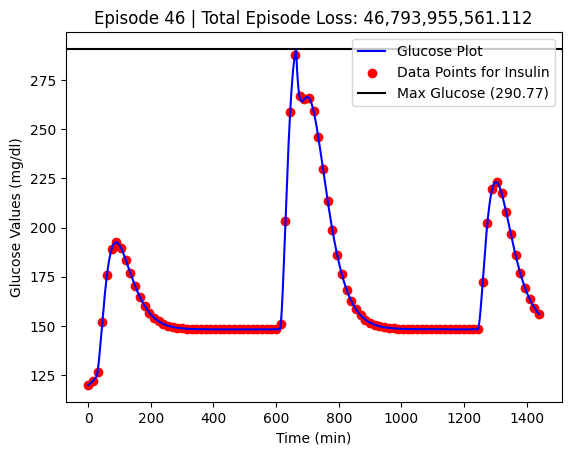

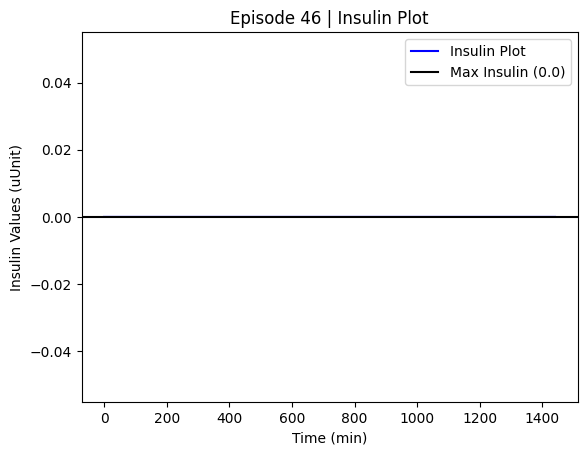

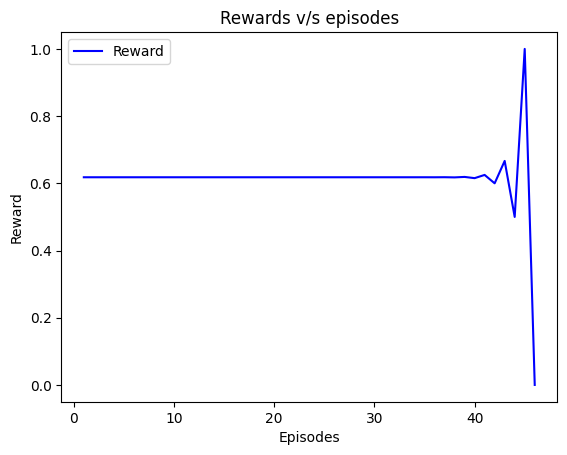

21 -> 0:21 (76g Carbs)
317 -> 5:17 (89g Carbs)
1139 -> 18:59 (106g Carbs)

Episode: 47 | Score (H<): 5,225,536,820,943.969 | Max Time: 1441 | Max Glucose Level: 596.62 | Avg Insulin Given: 0.0 | Carb / Insulin: 10270.0


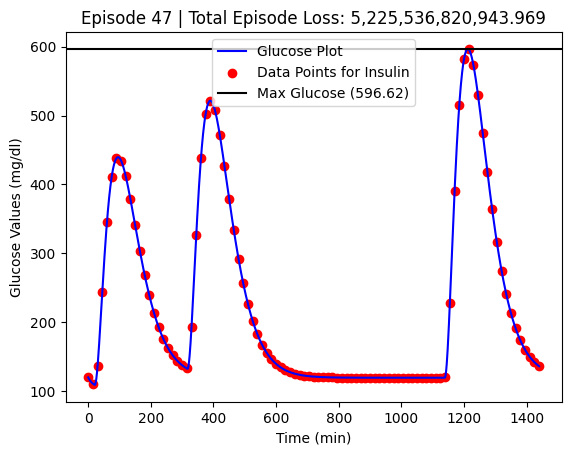

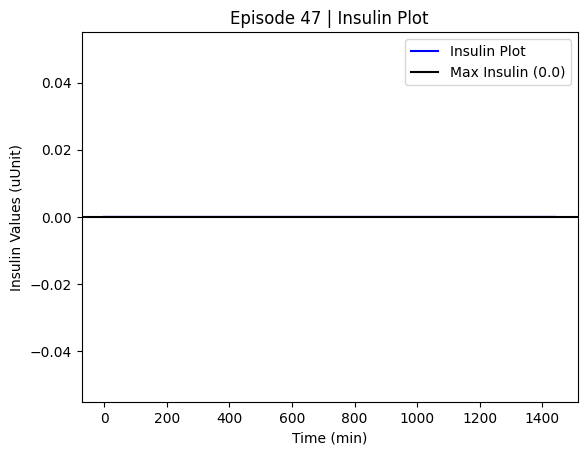

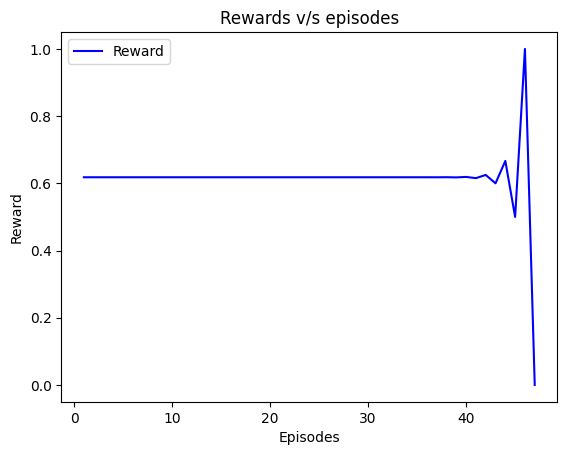

260 -> 4:20 (53g Carbs)
587 -> 9:47 (68g Carbs)
1206 -> 20:06 (60g Carbs)
1433 -> 23:53 (111g Carbs)

Episode: 48 | Score (H<): 131,035,897,096.28328 | Max Time: 1441 | Max Glucose Level: 307.608 | Avg Insulin Given: 0.0 | Carb / Insulin: 10291.0


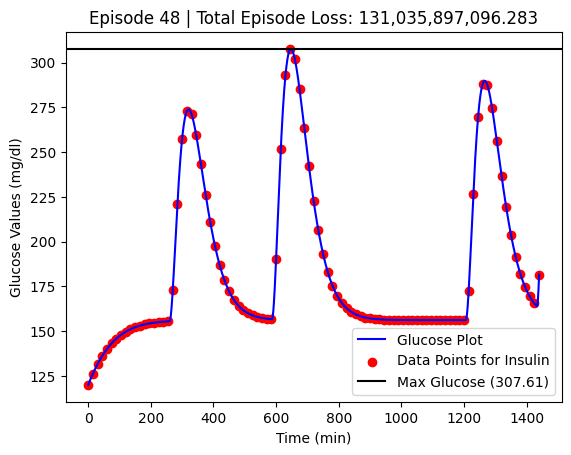

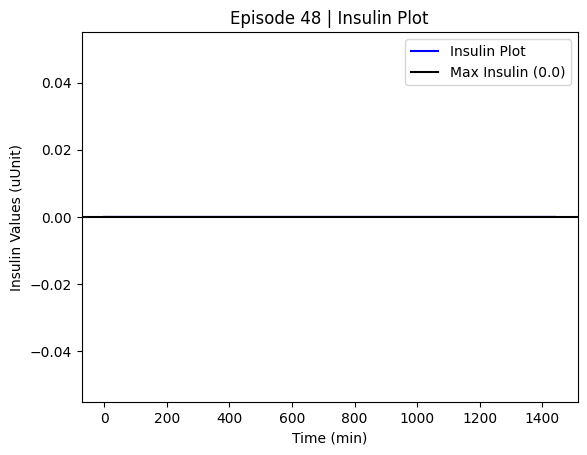

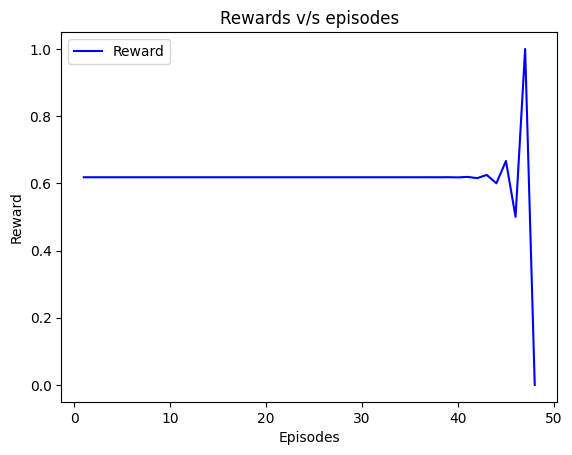

379 -> 6:19 (52g Carbs)
545 -> 9:05 (82g Carbs)
788 -> 13:08 (71g Carbs)
803 -> 13:23 (112g Carbs)
982 -> 16:22 (75g Carbs)

Episode: 49 | Score (H<): 1,978,975,977,042.2446 | Max Time: 1441 | Max Glucose Level: 512.928 | Avg Insulin Given: 0.0 | Carb / Insulin: 10391.0


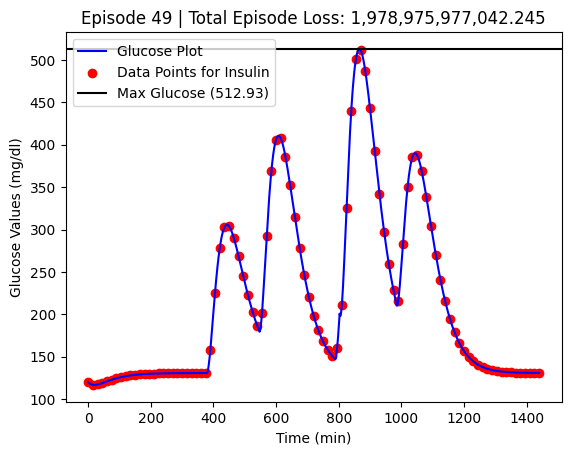

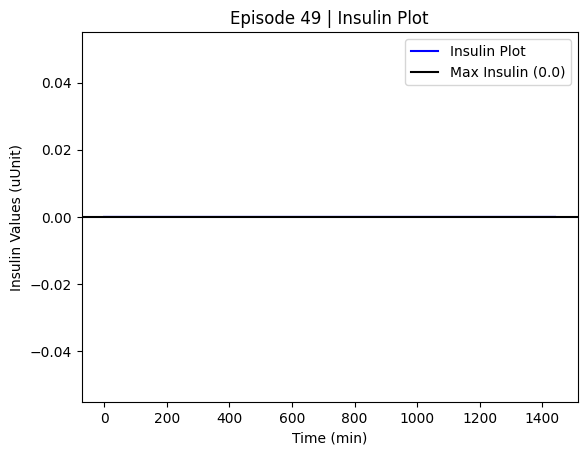

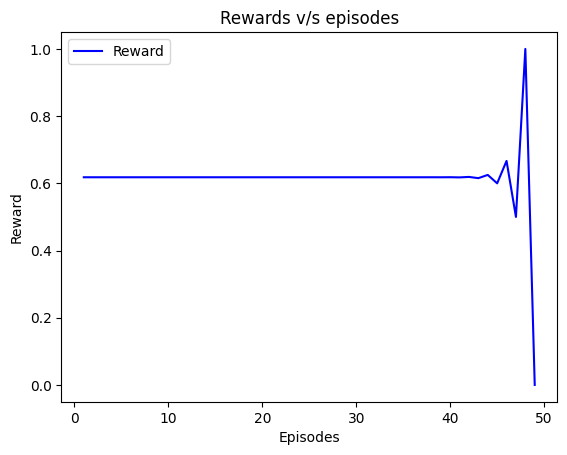

321 -> 5:21 (59g Carbs)
411 -> 6:51 (79g Carbs)
417 -> 6:57 (78g Carbs)
925 -> 15:25 (49g Carbs)
1252 -> 20:52 (110g Carbs)

Episode: 50 | Score (H<): 741,838,839,136.0062 | Max Time: 1441 | Max Glucose Level: 423.068 | Avg Insulin Given: 0.0 | Carb / Insulin: 10374.0


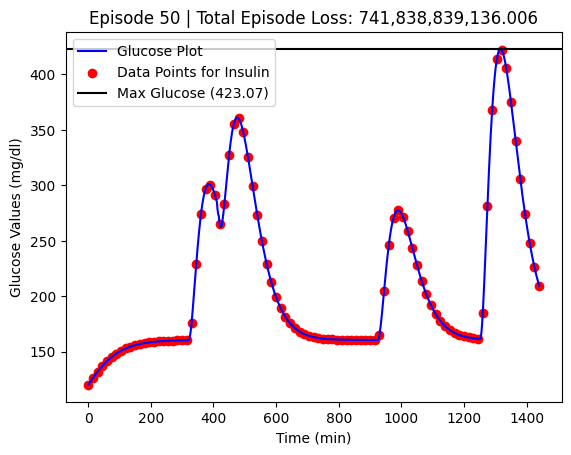

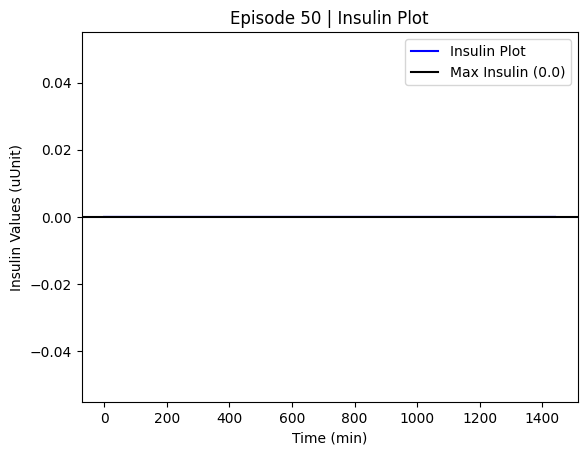

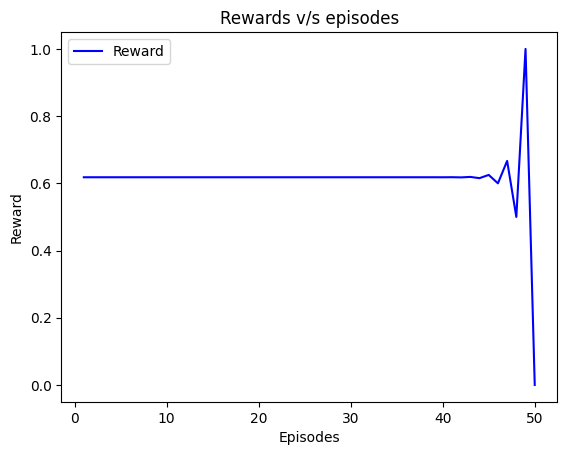

*** Epoch 0 Terminal Cases ***
*** Total 0 Terminal Cases ***
284 -> 4:44 (75g Carbs)
1402 -> 23:22 (43g Carbs)

Episode: 51 | Score (H<): 40,175,603,777.934326 | Max Time: 1441 | Max Glucose Level: 298.007 | Avg Insulin Given: 0.0 | Carb / Insulin: 10117.0


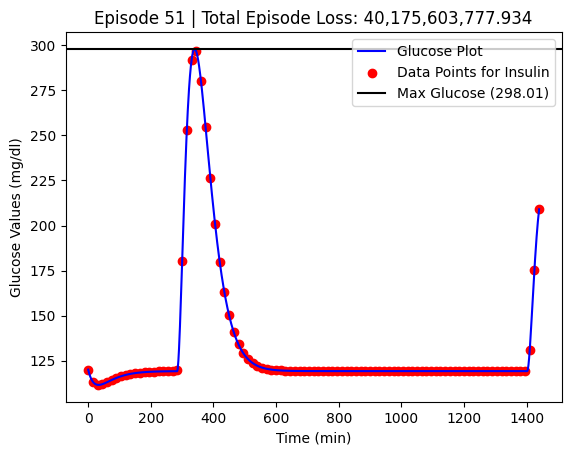

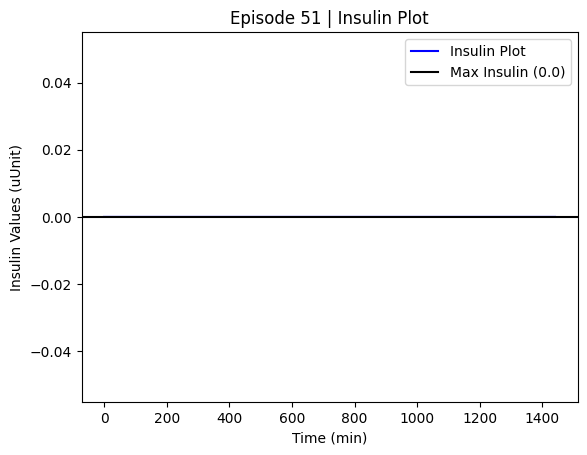

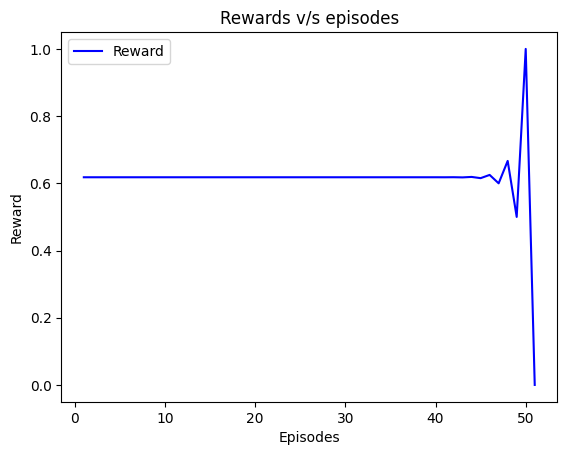

588 -> 9:48 (114g Carbs)
759 -> 12:39 (16g Carbs)
1144 -> 19:04 (47g Carbs)

Episode: 52 | Score (H<): 739,790,931,191.5206 | Max Time: 1441 | Max Glucose Level: 467.934 | Avg Insulin Given: 0.0 | Carb / Insulin: 10176.0


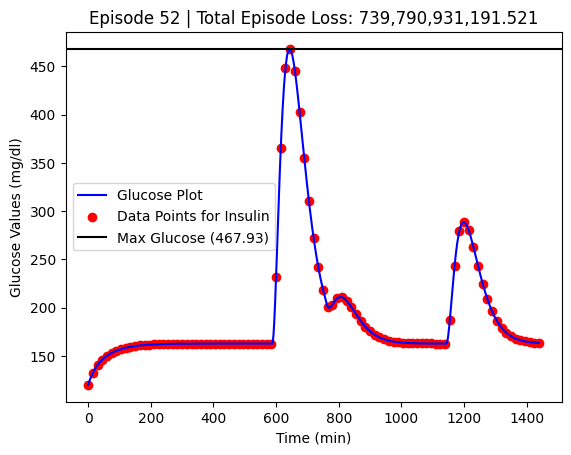

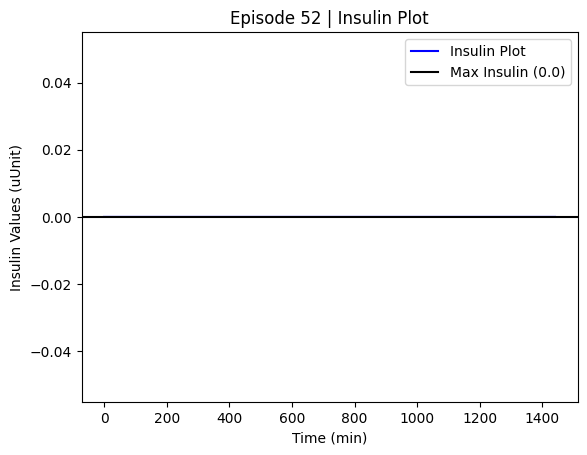

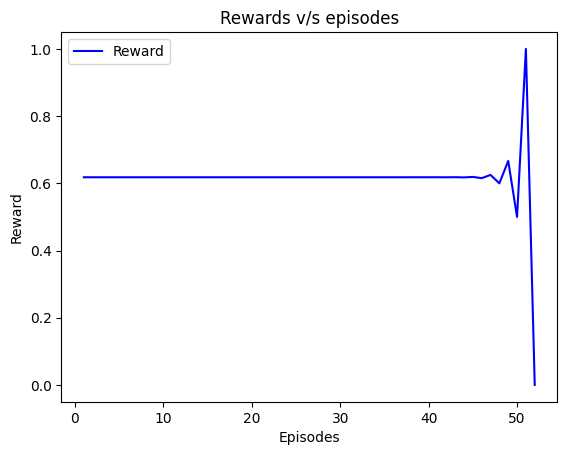

226 -> 3:46 (119g Carbs)
629 -> 10:29 (98g Carbs)
993 -> 16:33 (110g Carbs)
1283 -> 21:23 (80g Carbs)

Episode: 53 | Score (H<): 1,816,640,746,628.4343 | Max Time: 1441 | Max Glucose Level: 462.53 | Avg Insulin Given: 0.0 | Carb / Insulin: 10406.0


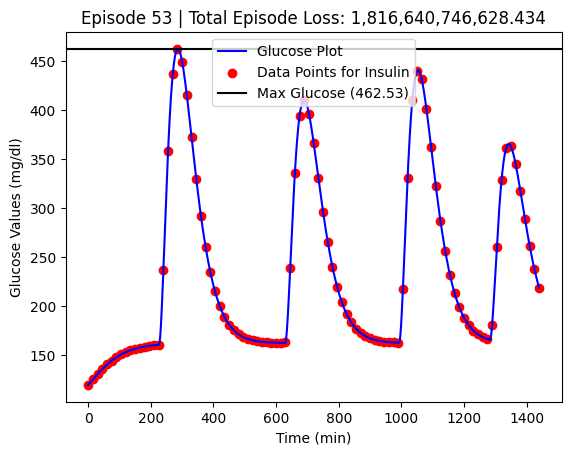

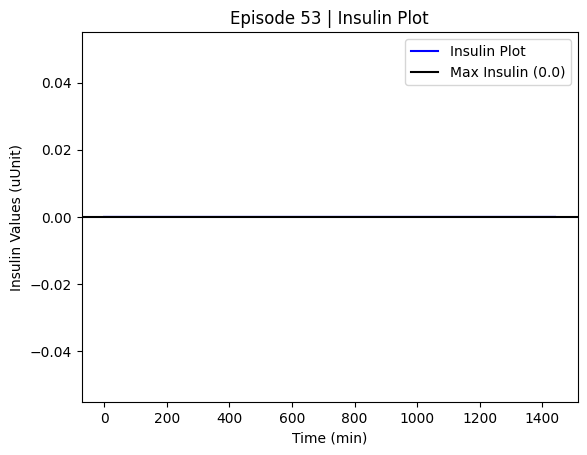

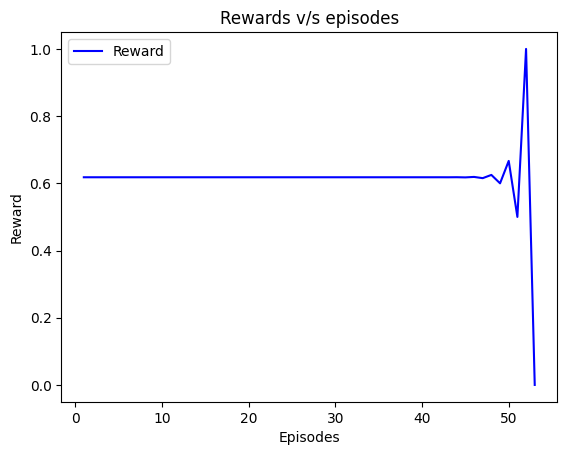

1066 -> 17:46 (100g Carbs)
1301 -> 21:41 (58g Carbs)

Episode: 54 | Score (H<): 227,351,735,263.3947 | Max Time: 1441 | Max Glucose Level: 364.844 | Avg Insulin Given: 0.0 | Carb / Insulin: 10157.0


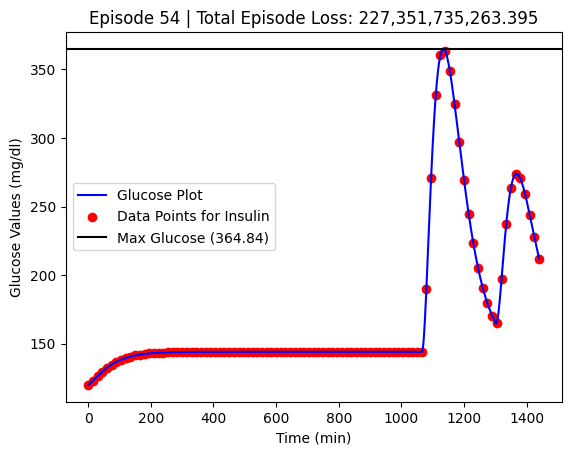

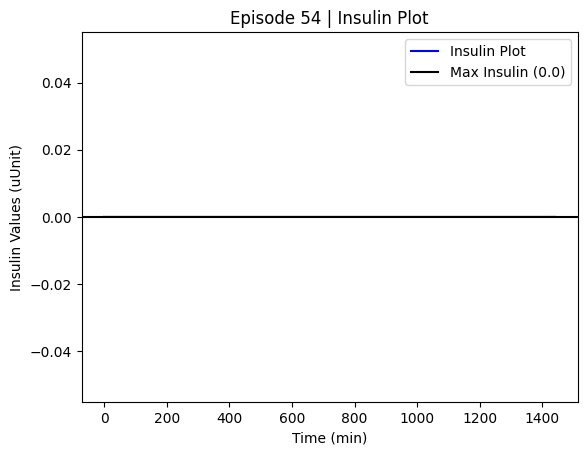

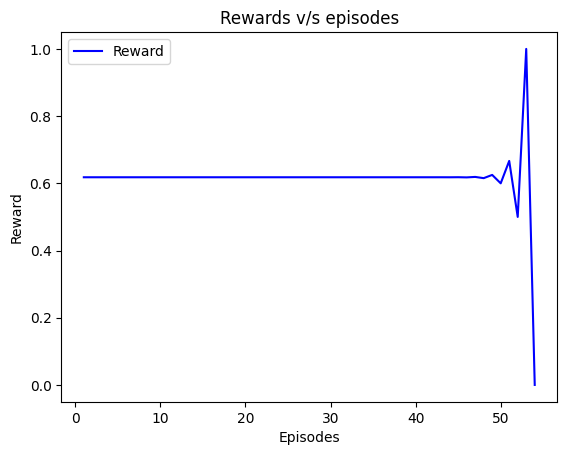

98 -> 1:38 (93g Carbs)
875 -> 14:35 (117g Carbs)
947 -> 15:47 (24g Carbs)
1225 -> 20:25 (41g Carbs)

Episode: 55 | Score (H<): 669,426,558,560.0708 | Max Time: 1441 | Max Glucose Level: 448.613 | Avg Insulin Given: 0.0 | Carb / Insulin: 10274.0


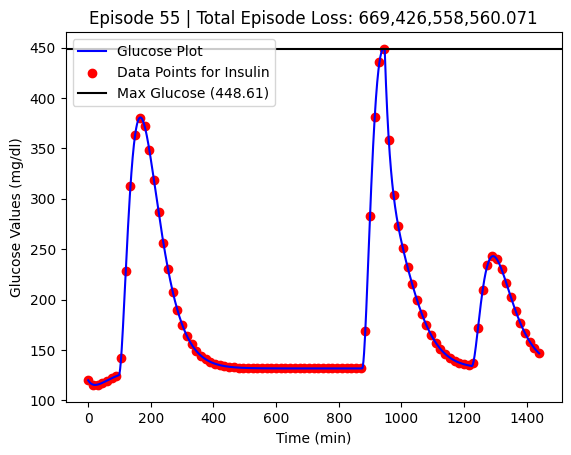

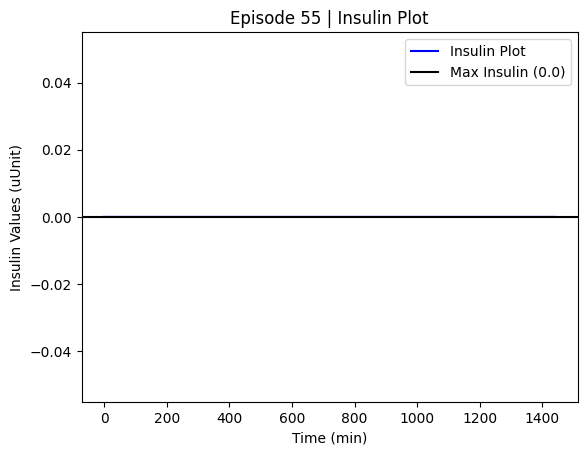

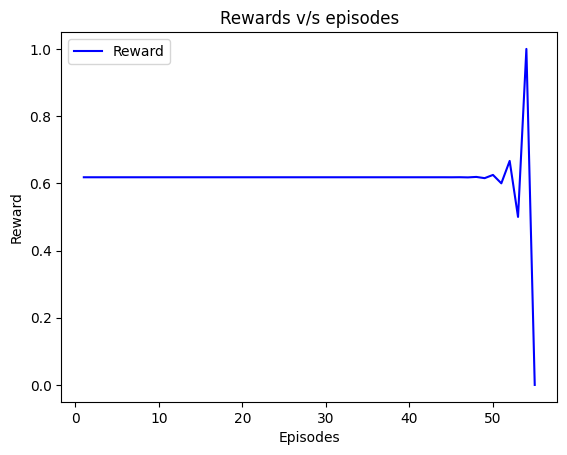

545 -> 9:05 (56g Carbs)
899 -> 14:59 (10g Carbs)
1043 -> 17:23 (70g Carbs)

Episode: 56 | Score (H<): 521,362,913,390.9746 | Max Time: 1441 | Max Glucose Level: 409.423 | Avg Insulin Given: 0.0 | Carb / Insulin: 10135.0


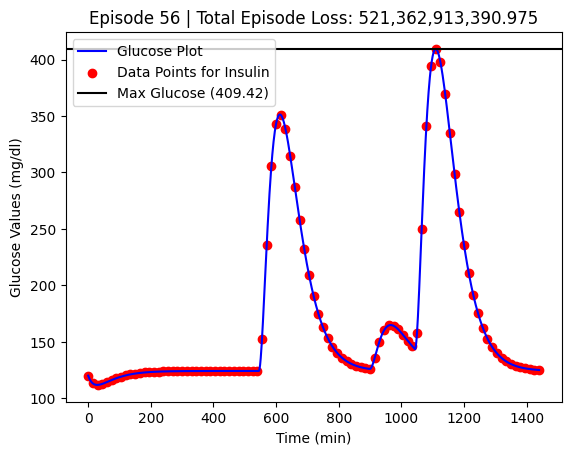

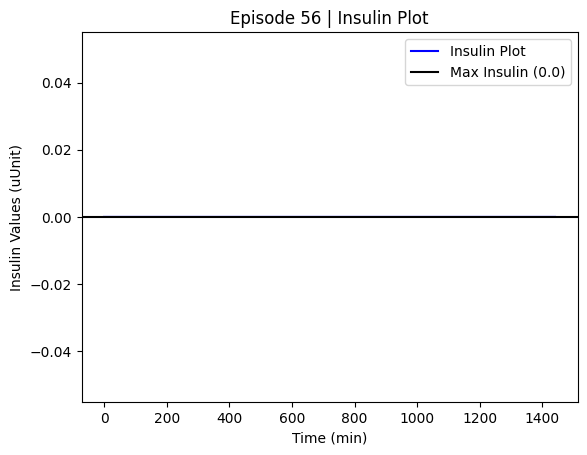

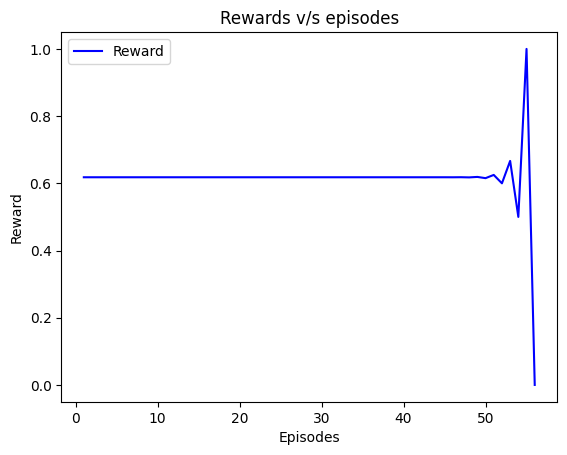

818 -> 13:38 (104g Carbs)
1437 -> 23:57 (82g Carbs)

Episode: 57 | Score (H<): 1,396,500,493,144.016 | Max Time: 1441 | Max Glucose Level: 527.37 | Avg Insulin Given: 0.0 | Carb / Insulin: 10185.0


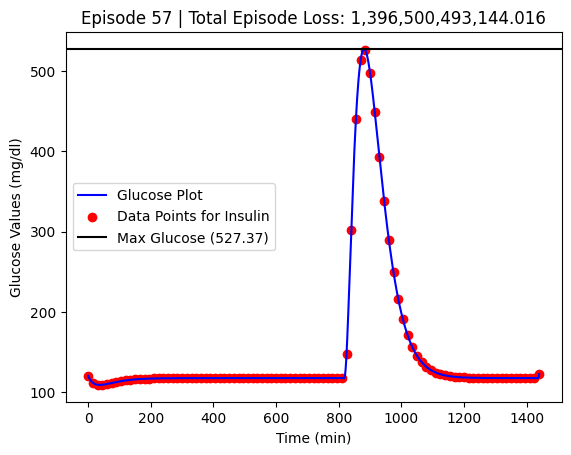

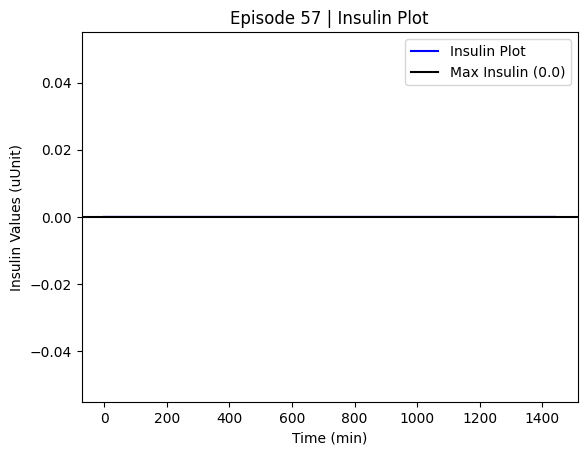

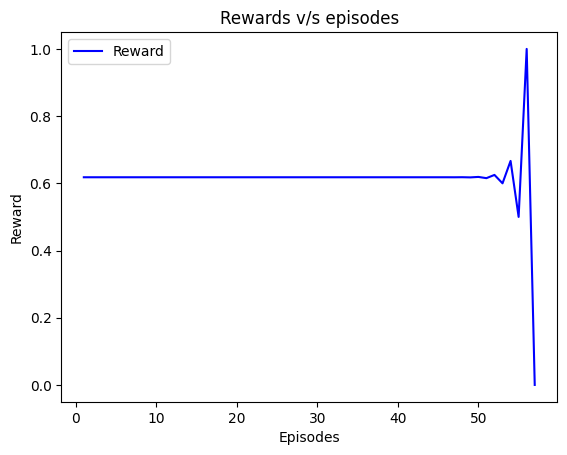

193 -> 3:13 (83g Carbs)
292 -> 4:52 (26g Carbs)
743 -> 12:23 (27g Carbs)
879 -> 14:39 (44g Carbs)

Episode: 58 | Score (H<): 241,717,588,989.63126 | Max Time: 1441 | Max Glucose Level: 382.411 | Avg Insulin Given: 0.0 | Carb / Insulin: 10179.0


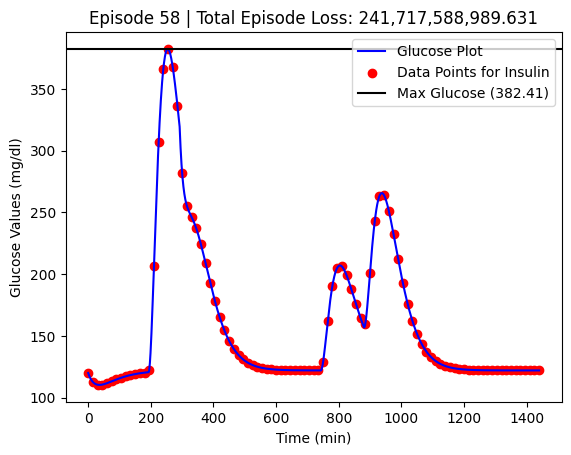

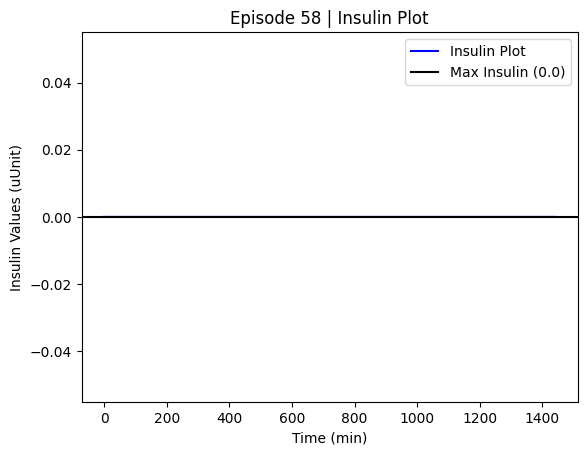

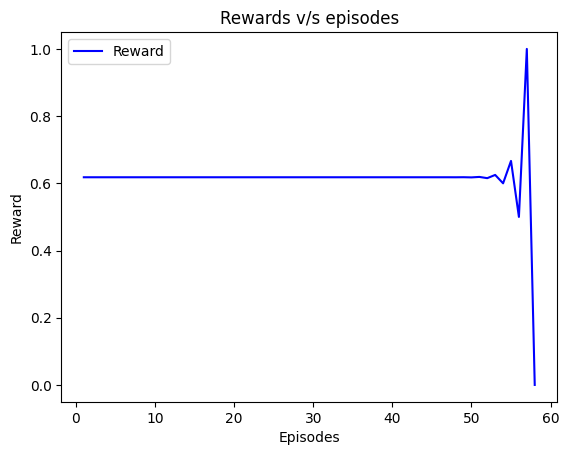

238 -> 3:58 (10g Carbs)
510 -> 8:30 (81g Carbs)
943 -> 15:43 (109g Carbs)
1022 -> 17:02 (81g Carbs)

Episode: 59 | Score (H<): 559,198,213,802.3284 | Max Time: 1441 | Max Glucose Level: 401.291 | Avg Insulin Given: 0.0 | Carb / Insulin: 10280.0


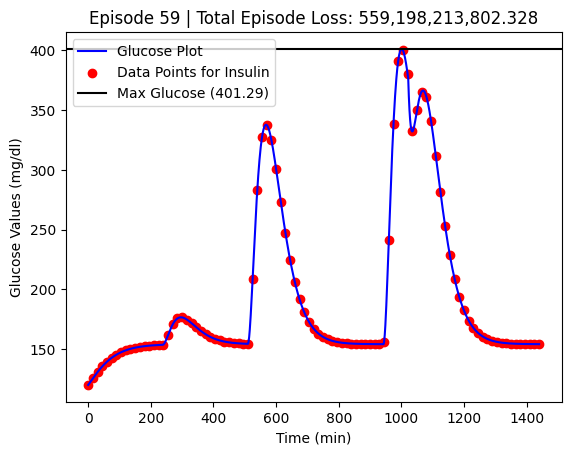

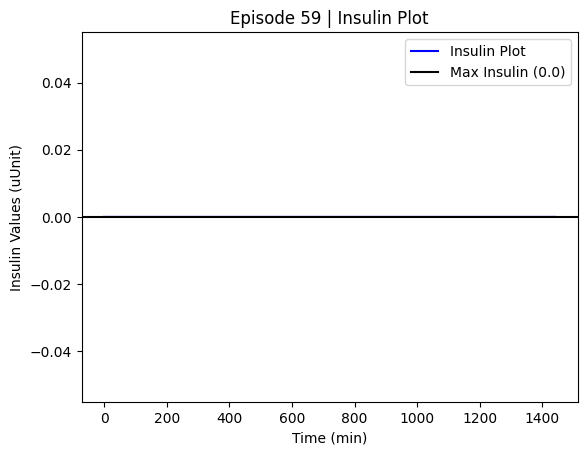

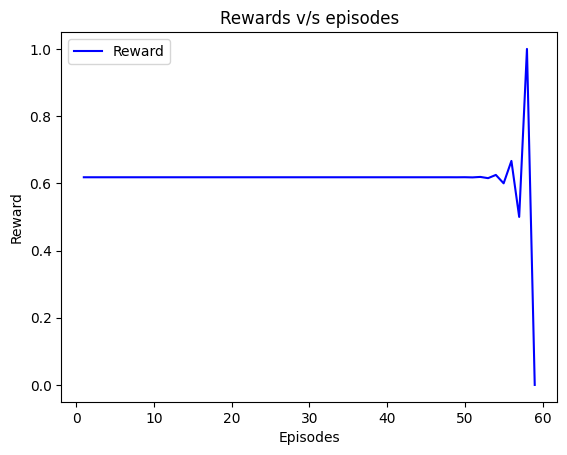

233 -> 3:53 (32g Carbs)
336 -> 5:36 (64g Carbs)
413 -> 6:53 (60g Carbs)
440 -> 7:20 (113g Carbs)
534 -> 8:54 (24g Carbs)

Episode: 60 | Score (H<): 1,699,025,050,850.9365 | Max Time: 1441 | Max Glucose Level: 531.512 | Avg Insulin Given: 0.0 | Carb / Insulin: 10292.0


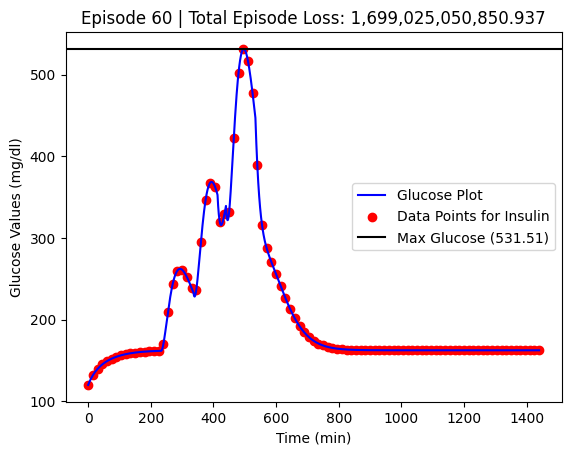

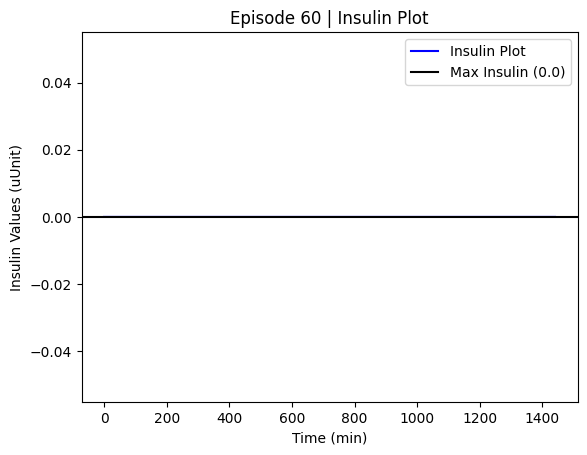

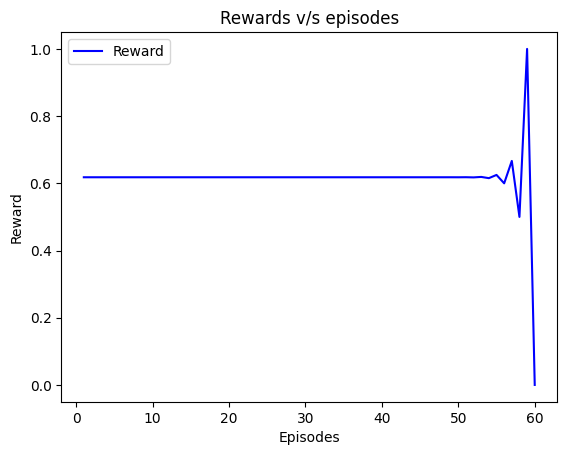

886 -> 14:46 (89g Carbs)
1015 -> 16:55 (49g Carbs)
1122 -> 18:42 (70g Carbs)

Episode: 61 | Score (H<): 2,155,132,364,477.3914 | Max Time: 1441 | Max Glucose Level: 505.096 | Avg Insulin Given: 0.0 | Carb / Insulin: 10207.0


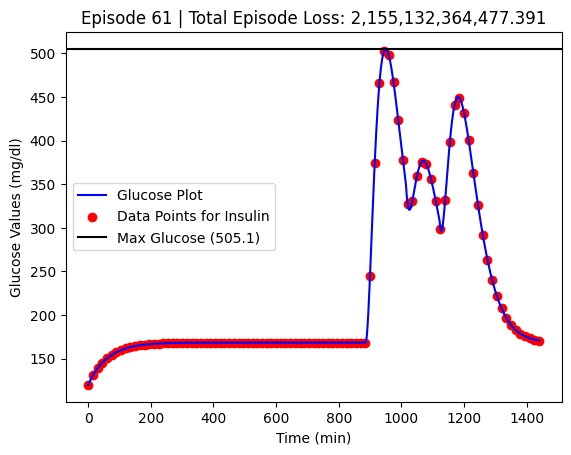

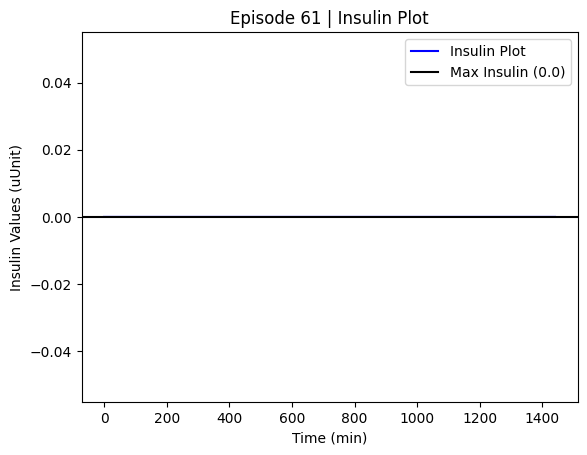

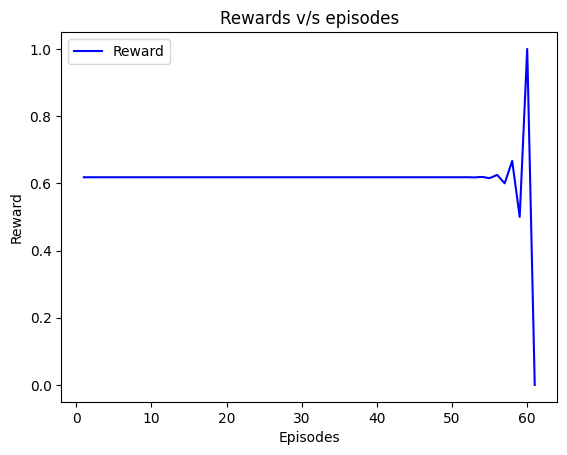

335 -> 5:35 (20g Carbs)
873 -> 14:33 (65g Carbs)
1084 -> 18:04 (58g Carbs)

Episode: 62 | Score (H<): 306,176,592,496.80115 | Max Time: 1441 | Max Glucose Level: 364.352 | Avg Insulin Given: 0.0 | Carb / Insulin: 10142.0


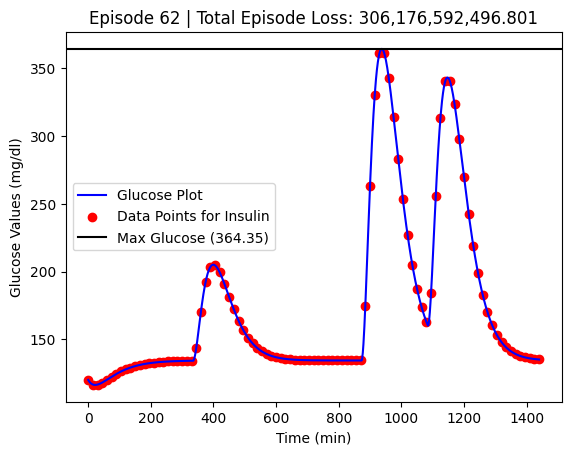

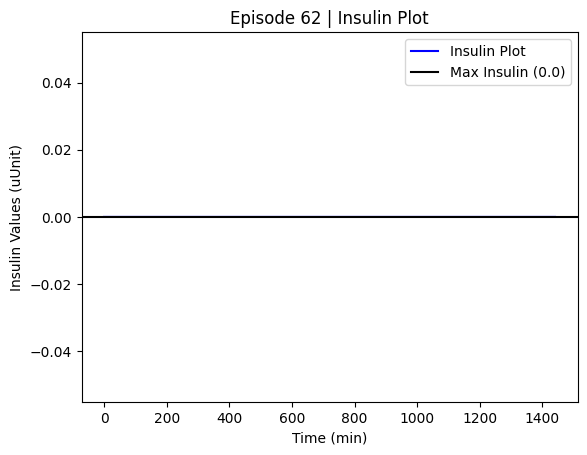

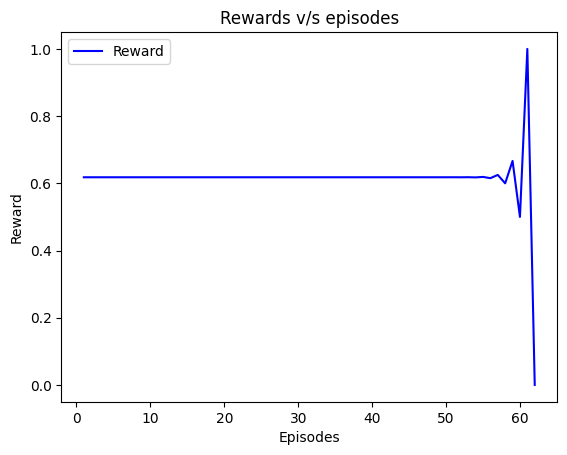

258 -> 4:18 (73g Carbs)
478 -> 7:58 (60g Carbs)
662 -> 11:02 (92g Carbs)

Episode: 63 | Score (H<): 3,145,044,018,730.1465 | Max Time: 1441 | Max Glucose Level: 555.351 | Avg Insulin Given: 0.0 | Carb / Insulin: 10224.0


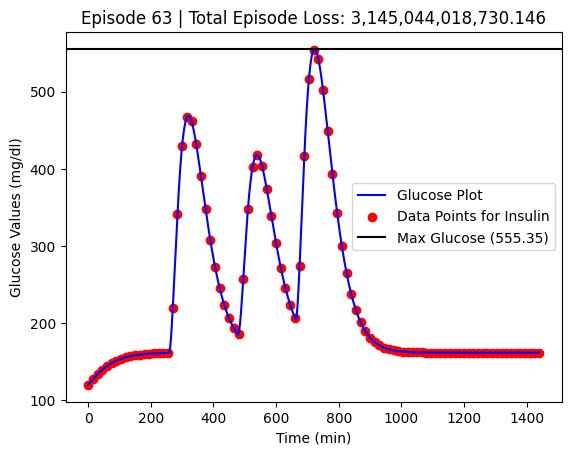

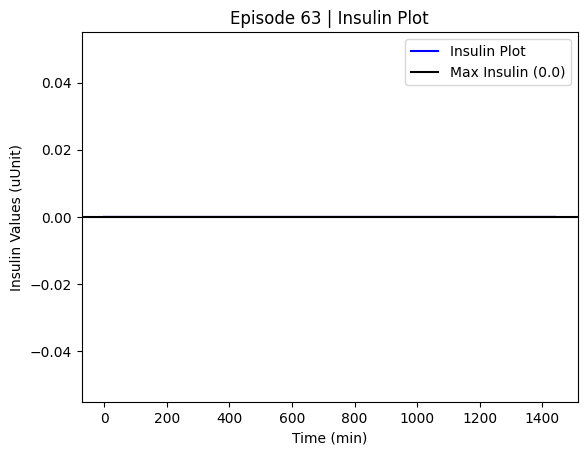

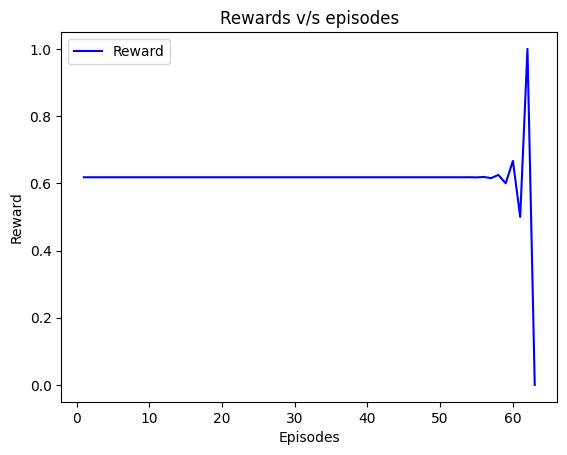

189 -> 3:09 (45g Carbs)
281 -> 4:41 (15g Carbs)
568 -> 9:28 (97g Carbs)
744 -> 12:24 (26g Carbs)
805 -> 13:25 (97g Carbs)

Episode: 64 | Score (H<): 808,232,123,325.4268 | Max Time: 1441 | Max Glucose Level: 424.648 | Avg Insulin Given: 0.0 | Carb / Insulin: 10279.0


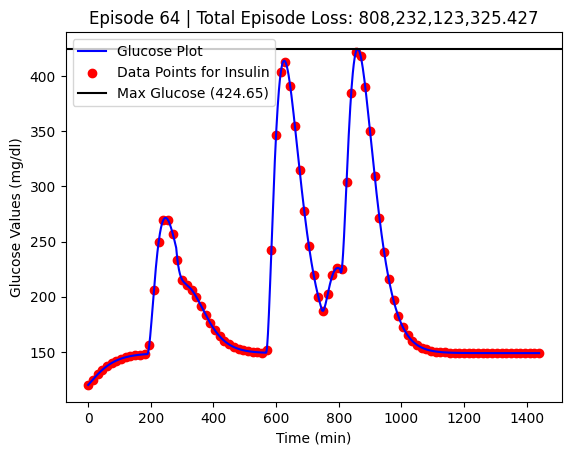

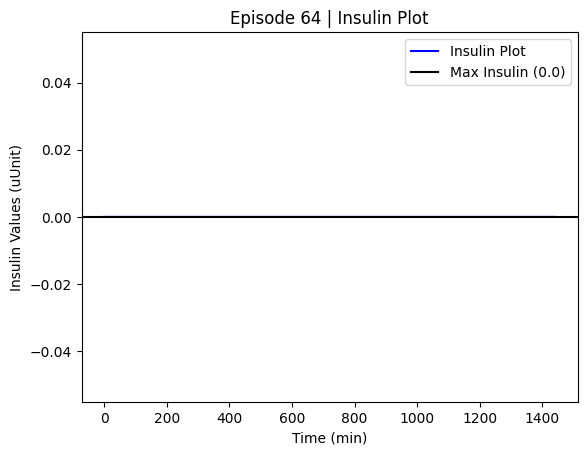

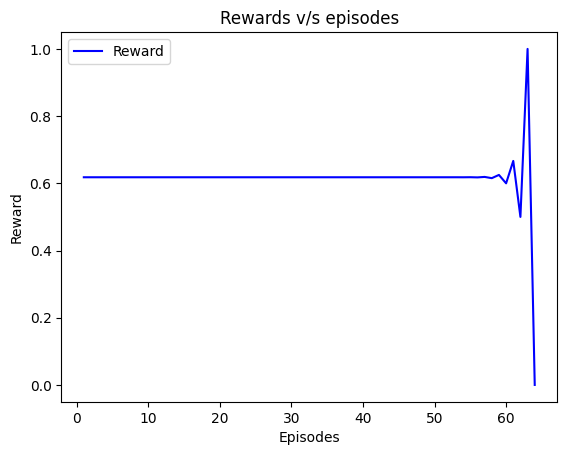

102 -> 1:42 (18g Carbs)
546 -> 9:06 (32g Carbs)
1286 -> 21:26 (33g Carbs)

Episode: 65 | Score (H<): 160,006,873,708.34494 | Max Time: 1441 | Max Glucose Level: 315.699 | Avg Insulin Given: 0.0 | Carb / Insulin: 10082.0


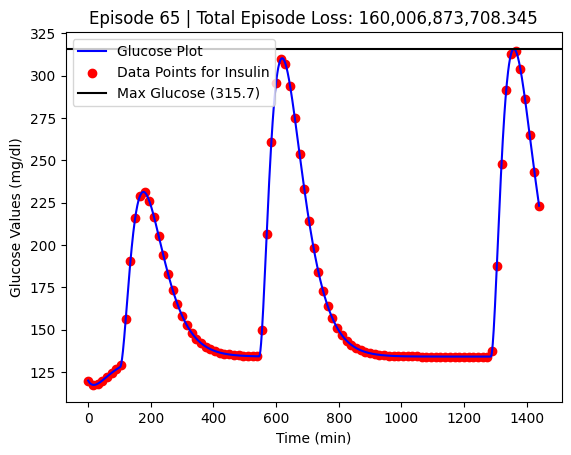

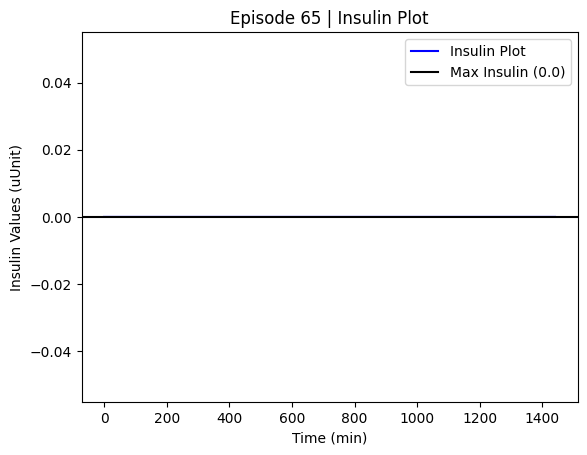

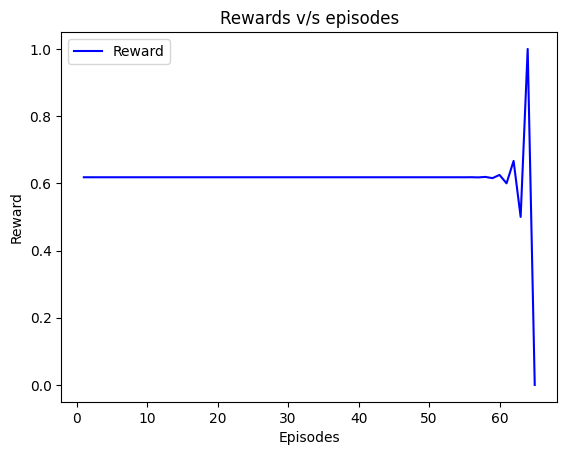

493 -> 8:13 (59g Carbs)
1132 -> 18:52 (102g Carbs)
1159 -> 19:19 (108g Carbs)
1377 -> 22:57 (60g Carbs)

Episode: 66 | Score (H<): 325,235,849,344.4344 | Max Time: 1441 | Max Glucose Level: 387.437 | Avg Insulin Given: 0.0 | Carb / Insulin: 10328.0


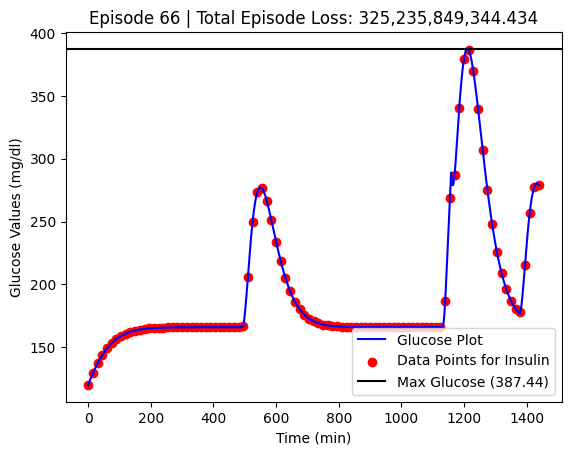

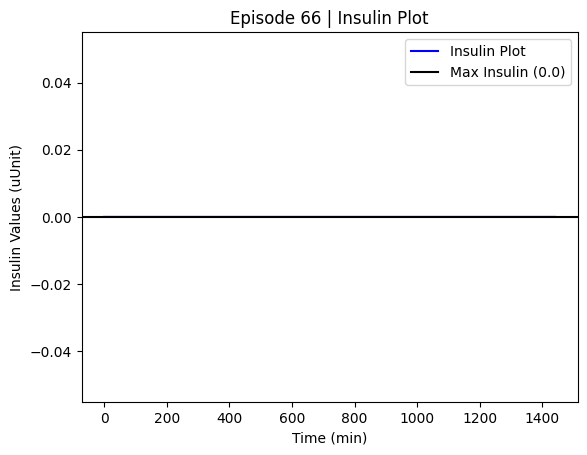

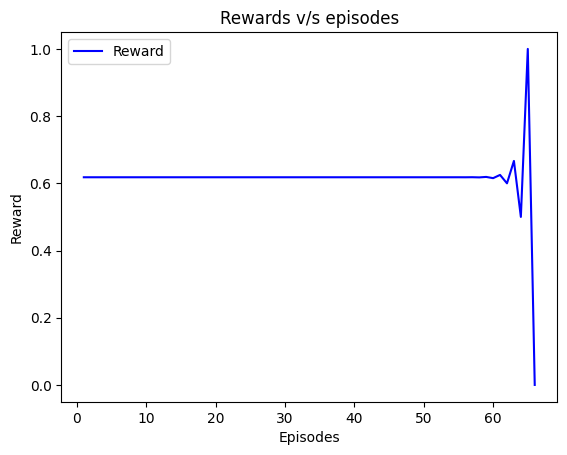

86 -> 1:26 (55g Carbs)
245 -> 4:05 (77g Carbs)
277 -> 4:37 (61g Carbs)
282 -> 4:42 (51g Carbs)
990 -> 16:30 (99g Carbs)

Episode: 67 | Score (H<): 2.000000012024073e+23 | Max Time: 1053 | Max Glucose Level: 688.162 | Avg Insulin Given: 0.0 | Carb / Insulin: 10342.0


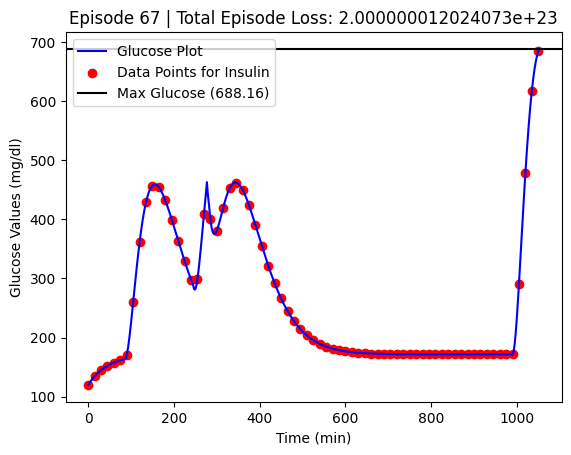

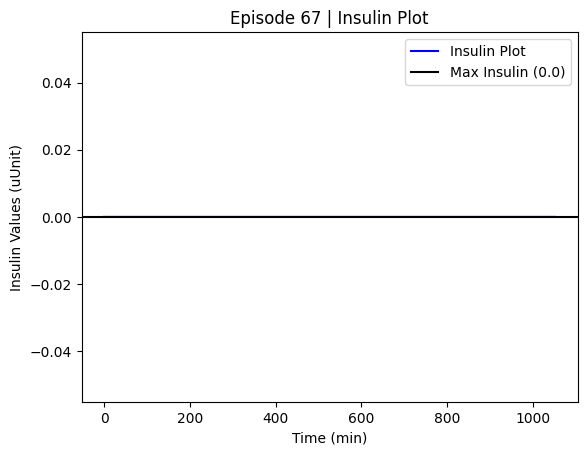

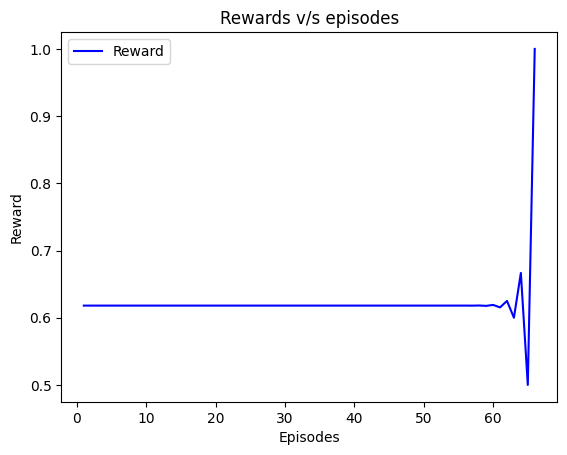

207 -> 3:27 (33g Carbs)
748 -> 12:28 (107g Carbs)
940 -> 15:40 (82g Carbs)
1141 -> 19:01 (34g Carbs)
1348 -> 22:28 (30g Carbs)

Episode: 68 | Score (H<): 282,005,256,462.76025 | Max Time: 1441 | Max Glucose Level: 358.223 | Avg Insulin Given: 0.0 | Carb / Insulin: 10285.0


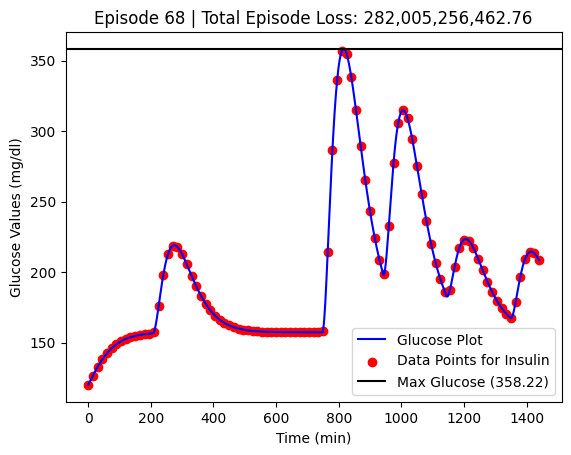

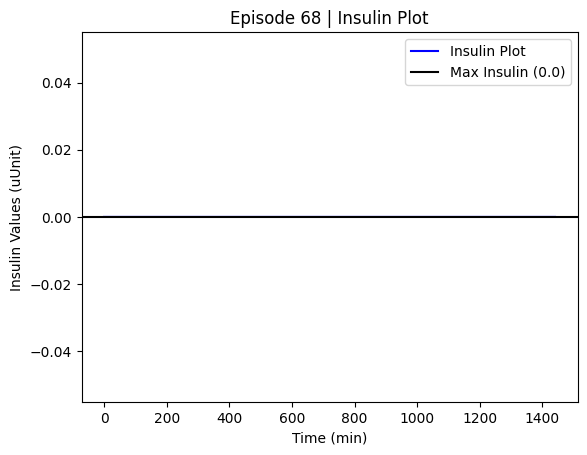

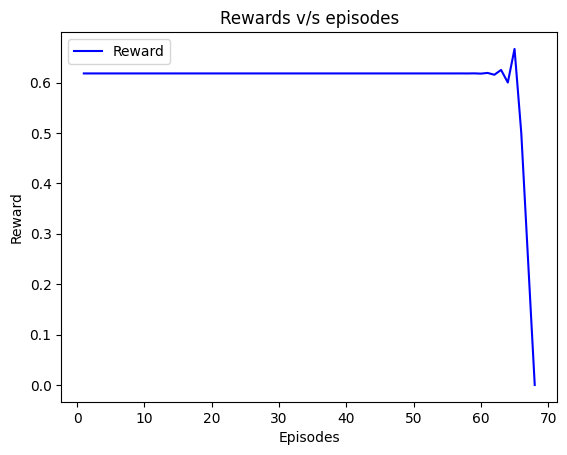

30 -> 0:30 (109g Carbs)
721 -> 12:01 (15g Carbs)
776 -> 12:56 (53g Carbs)
835 -> 13:55 (33g Carbs)
913 -> 15:13 (47g Carbs)

Episode: 69 | Score (H<): 401,037,952,990.5537 | Max Time: 1441 | Max Glucose Level: 409.694 | Avg Insulin Given: 0.0 | Carb / Insulin: 10256.0


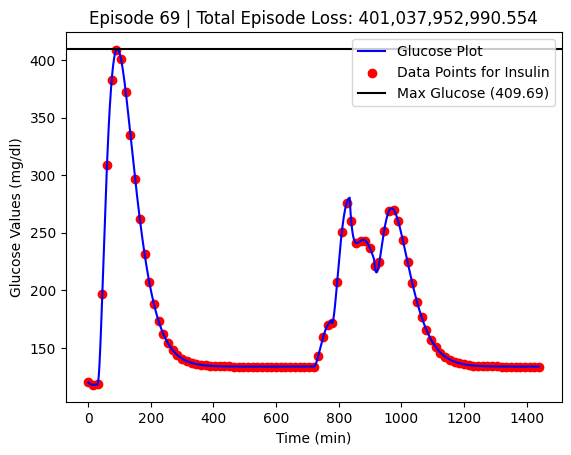

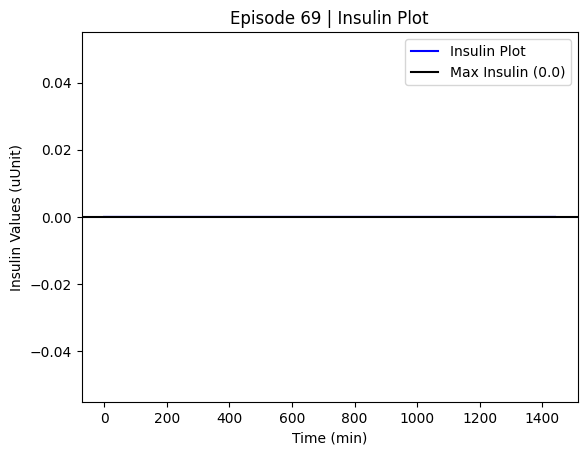

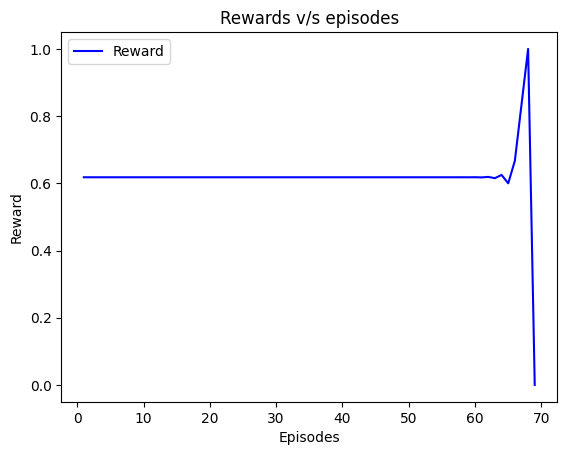

466 -> 7:46 (71g Carbs)
478 -> 7:58 (34g Carbs)
629 -> 10:29 (21g Carbs)

Episode: 70 | Score (H<): 7,760,354,306.140156 | Max Time: 1441 | Max Glucose Level: 228.469 | Avg Insulin Given: 0.0 | Carb / Insulin: 10125.0


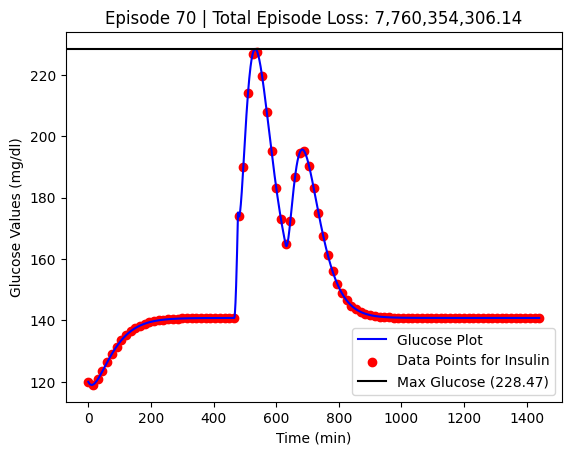

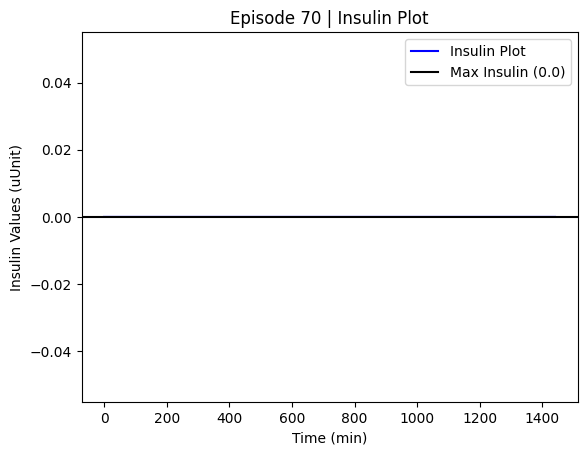

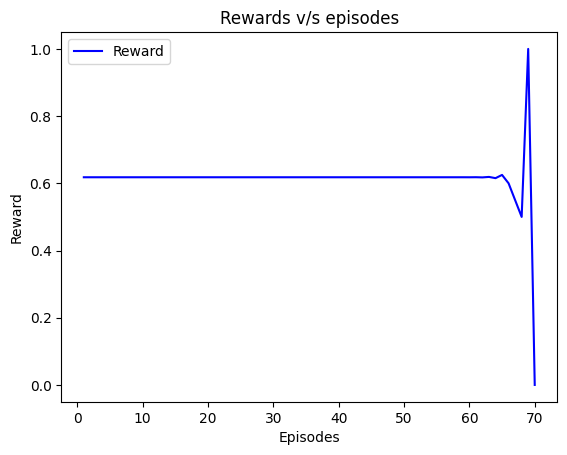

228 -> 3:48 (56g Carbs)
269 -> 4:29 (62g Carbs)
302 -> 5:02 (29g Carbs)
336 -> 5:36 (66g Carbs)
922 -> 15:22 (65g Carbs)

Episode: 71 | Score (H<): 201,917,601,186.80164 | Max Time: 1441 | Max Glucose Level: 323.234 | Avg Insulin Given: 0.0 | Carb / Insulin: 10277.0


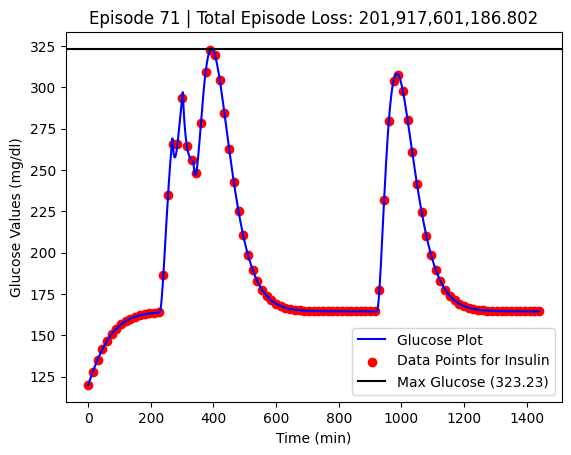

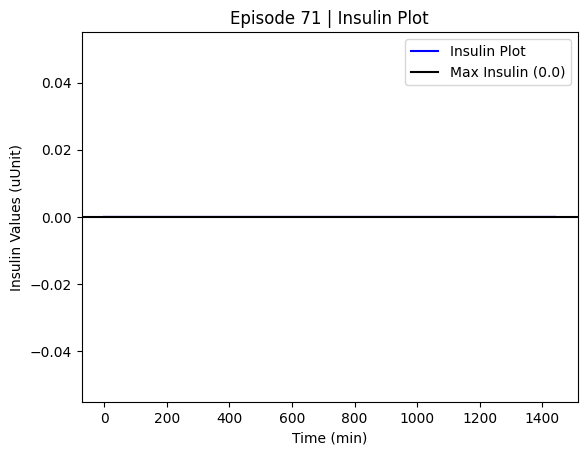

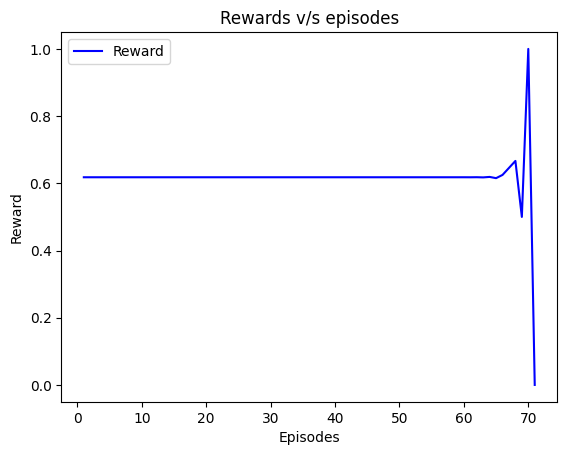

29 -> 0:29 (66g Carbs)
1158 -> 19:18 (108g Carbs)
1332 -> 22:12 (14g Carbs)
1336 -> 22:16 (47g Carbs)
1355 -> 22:35 (111g Carbs)

Episode: 72 | Score (H<): 1,360,005,848,863.7107 | Max Time: 1441 | Max Glucose Level: 481.188 | Avg Insulin Given: 0.0 | Carb / Insulin: 10345.0


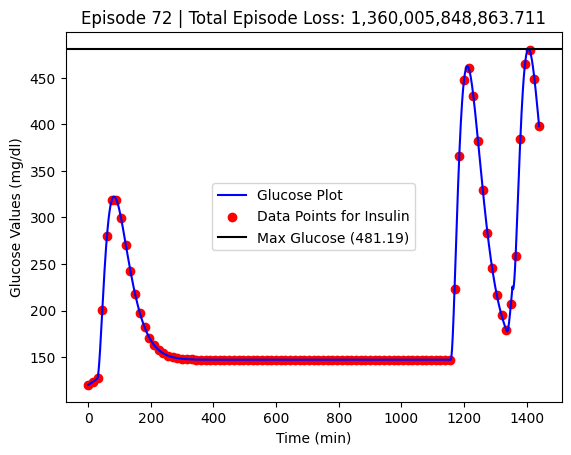

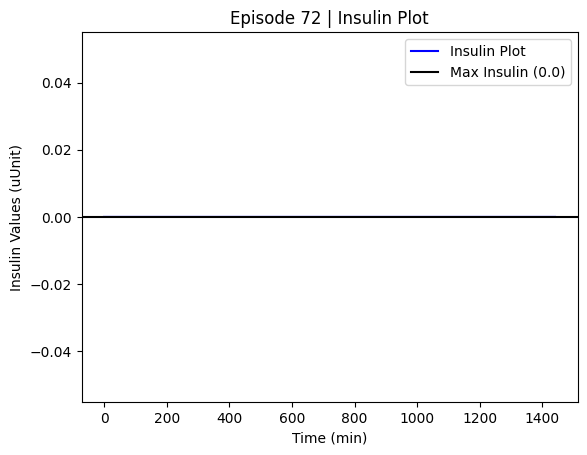

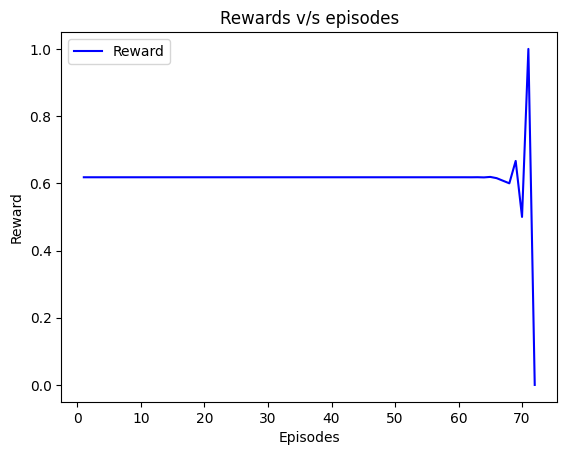

191 -> 3:11 (59g Carbs)
943 -> 15:43 (79g Carbs)
1157 -> 19:17 (113g Carbs)

Episode: 73 | Score (H<): 1,451,637,166,901.7634 | Max Time: 1441 | Max Glucose Level: 500.632 | Avg Insulin Given: 0.0 | Carb / Insulin: 10250.0


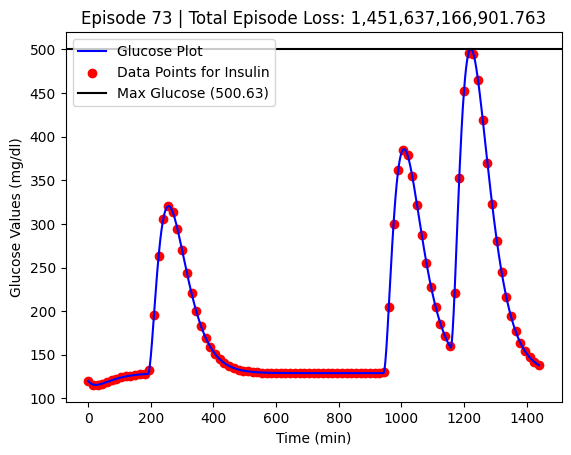

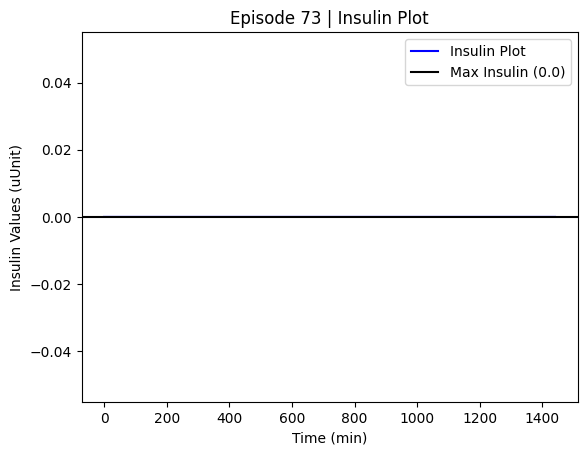

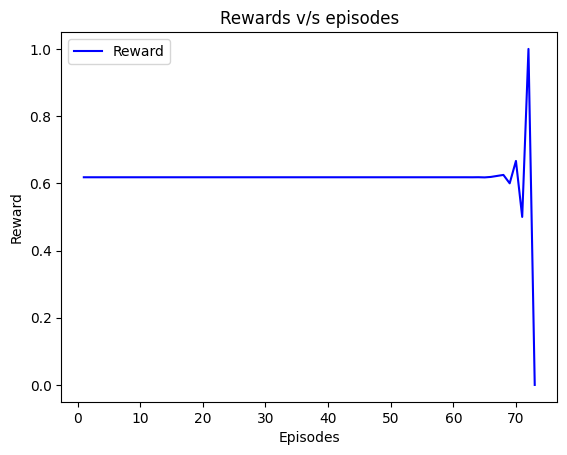

752 -> 12:32 (12g Carbs)
795 -> 13:15 (55g Carbs)
899 -> 14:59 (27g Carbs)
1042 -> 17:22 (115g Carbs)

Episode: 74 | Score (H<): 136,053,540,402.86803 | Max Time: 1441 | Max Glucose Level: 346.715 | Avg Insulin Given: 0.0 | Carb / Insulin: 10208.0


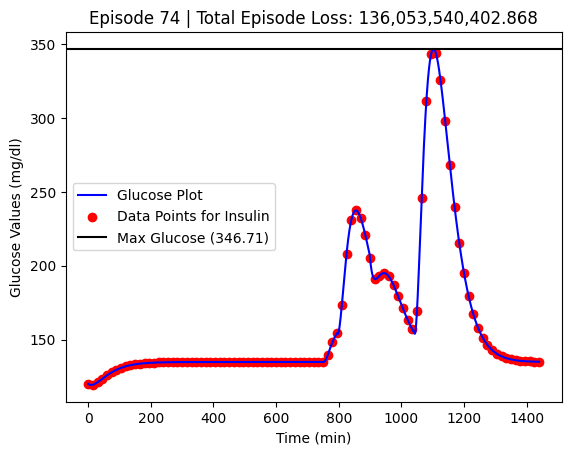

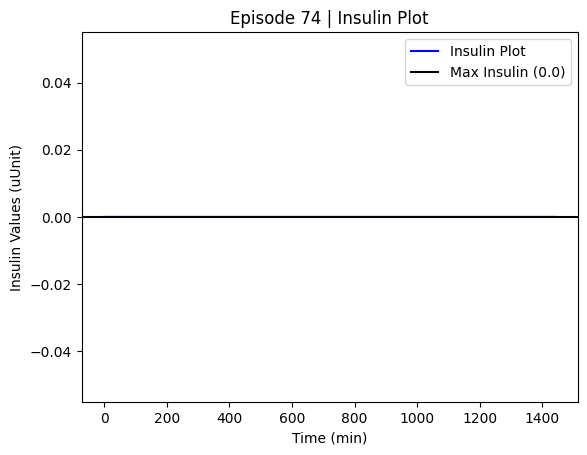

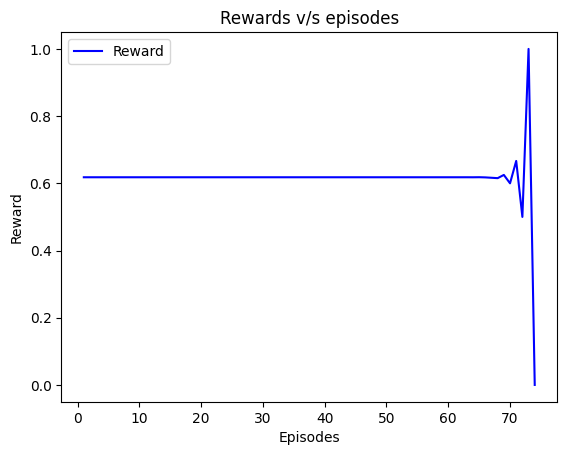

649 -> 10:49 (27g Carbs)
998 -> 16:38 (57g Carbs)
1015 -> 16:55 (26g Carbs)
1029 -> 17:09 (60g Carbs)

Episode: 75 | Score (H<): 67,682,768,494.21435 | Max Time: 1441 | Max Glucose Level: 300.403 | Avg Insulin Given: 0.0 | Carb / Insulin: 10169.0


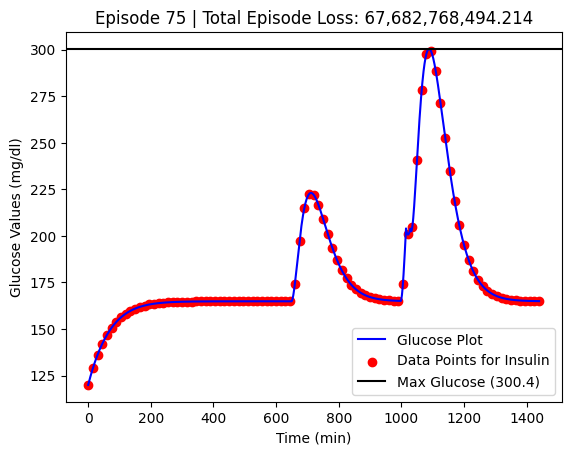

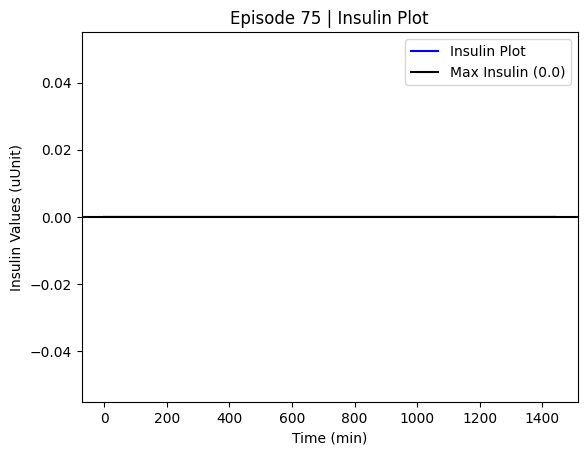

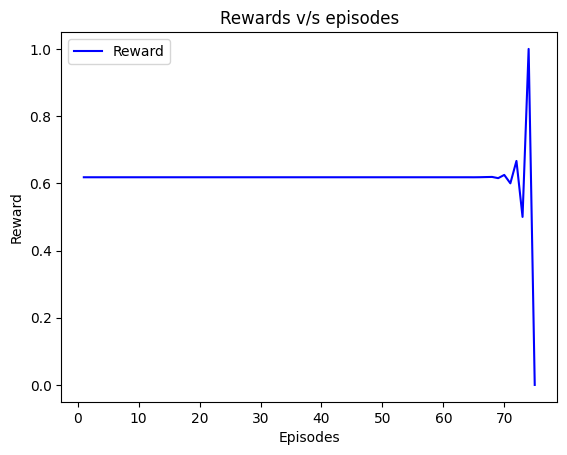

143 -> 2:23 (82g Carbs)
573 -> 9:33 (77g Carbs)
727 -> 12:07 (25g Carbs)

Episode: 76 | Score (H<): 126,448,026,890.97783 | Max Time: 1441 | Max Glucose Level: 317.134 | Avg Insulin Given: 0.0 | Carb / Insulin: 10183.0


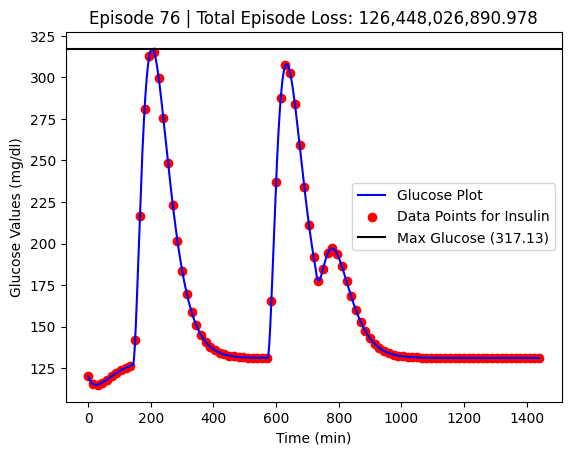

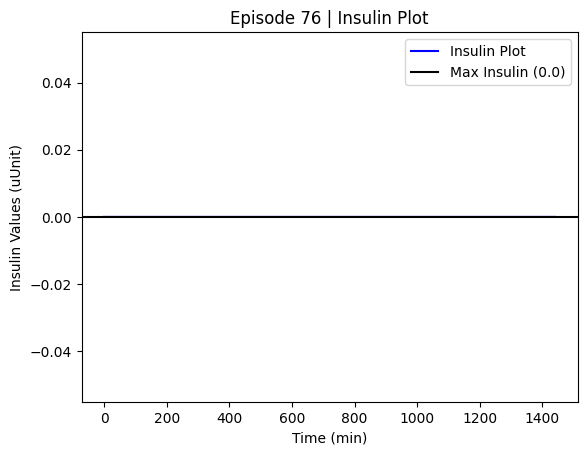

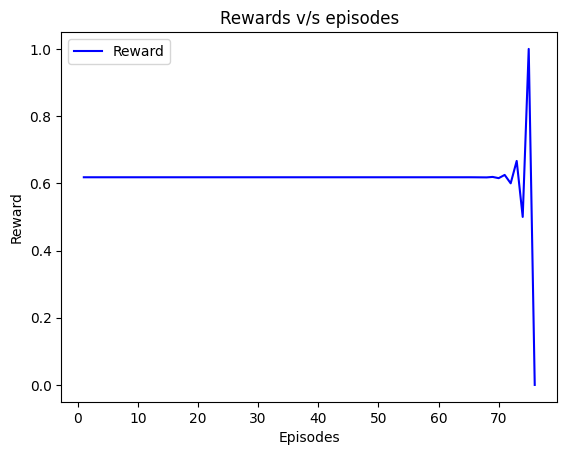

611 -> 10:11 (14g Carbs)
711 -> 11:51 (63g Carbs)
731 -> 12:11 (29g Carbs)

Episode: 77 | Score (H<): 15,951,244,378.513397 | Max Time: 1441 | Max Glucose Level: 248.673 | Avg Insulin Given: 0.0 | Carb / Insulin: 10105.0


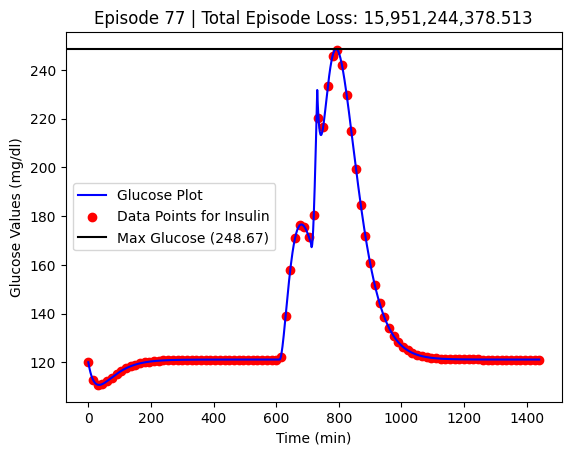

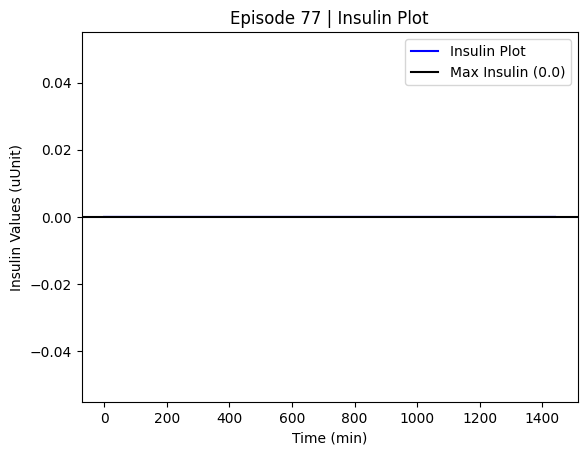

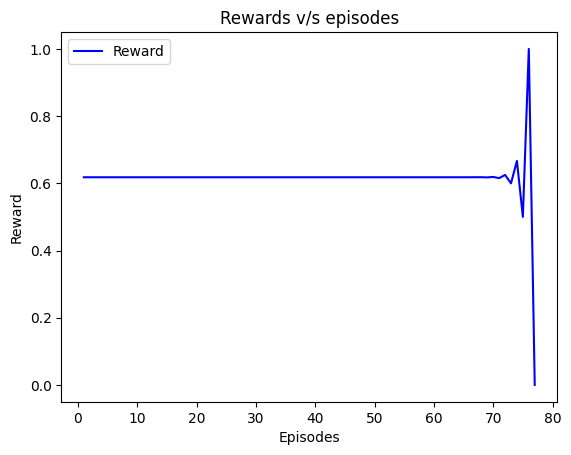

96 -> 1:36 (64g Carbs)
426 -> 7:06 (50g Carbs)
1223 -> 20:23 (84g Carbs)
1381 -> 23:01 (38g Carbs)

Episode: 78 | Score (H<): 1,677,806,394,470.225 | Max Time: 1441 | Max Glucose Level: 483.757 | Avg Insulin Given: 0.0 | Carb / Insulin: 10235.0


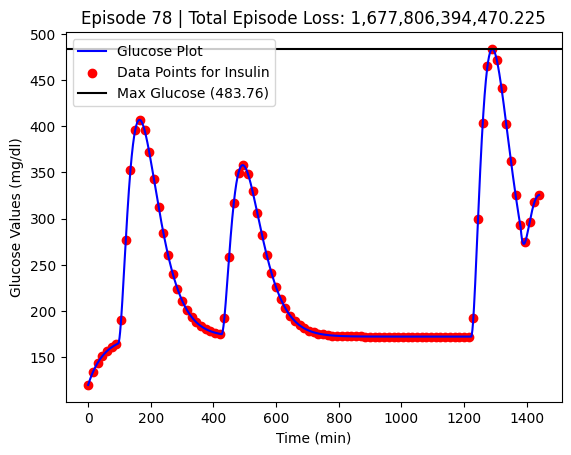

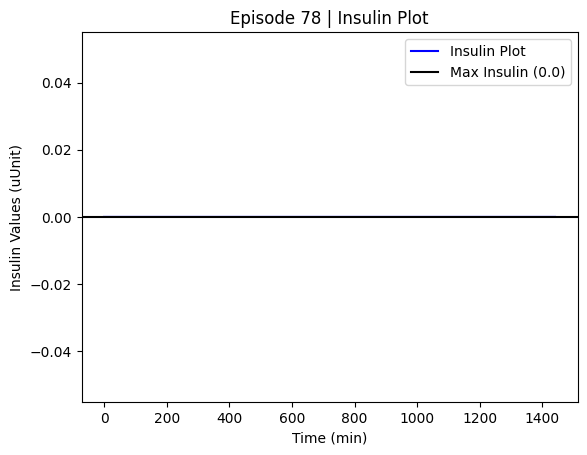

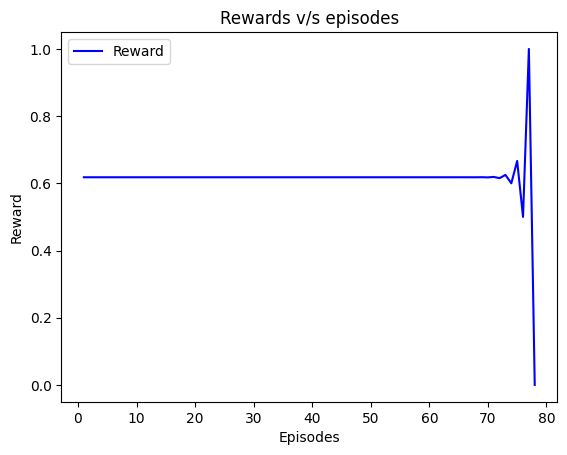

1190 -> 19:50 (93g Carbs)
1238 -> 20:38 (11g Carbs)
1273 -> 21:13 (16g Carbs)
1325 -> 22:05 (67g Carbs)

Episode: 79 | Score (H<): 341,403,072,299.1167 | Max Time: 1441 | Max Glucose Level: 425.429 | Avg Insulin Given: 0.0 | Carb / Insulin: 10186.0


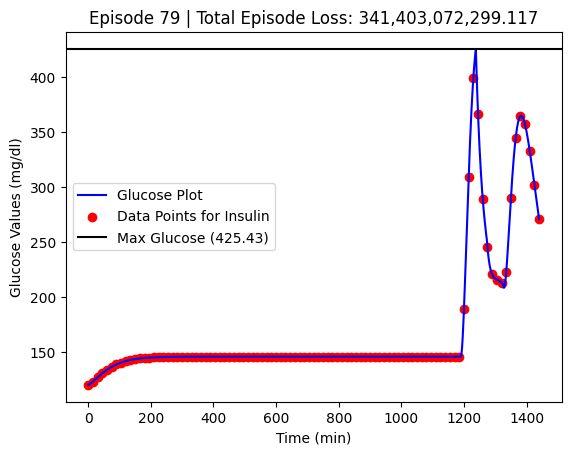

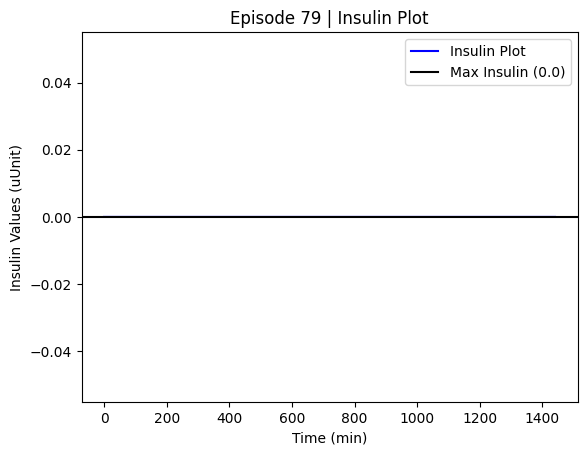

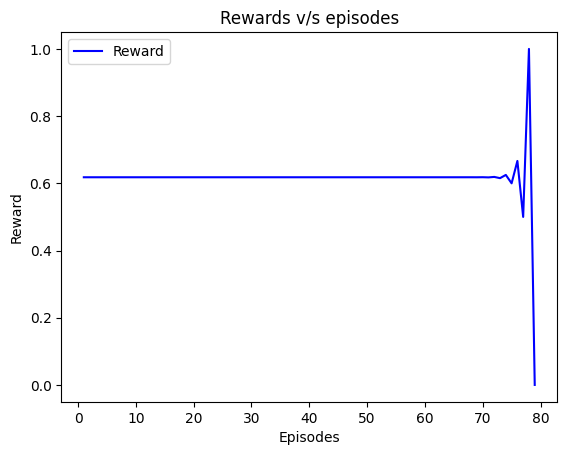

1117 -> 18:37 (71g Carbs)
1198 -> 19:58 (61g Carbs)
1201 -> 20:01 (108g Carbs)
1229 -> 20:29 (71g Carbs)
1391 -> 23:11 (87g Carbs)

Episode: 80 | Score (H<): 3,130,585,270,154.1265 | Max Time: 1441 | Max Glucose Level: 518.702 | Avg Insulin Given: 0.0 | Carb / Insulin: 10397.0


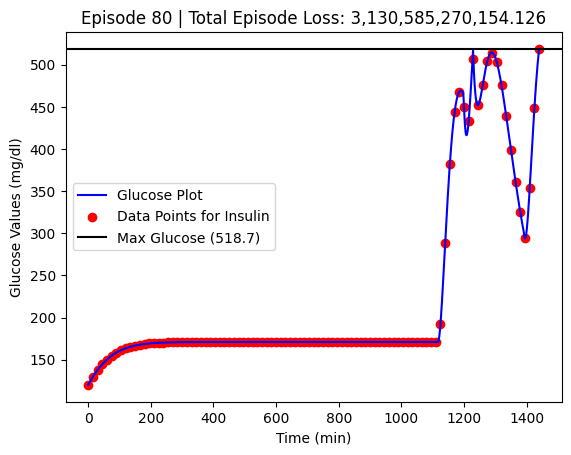

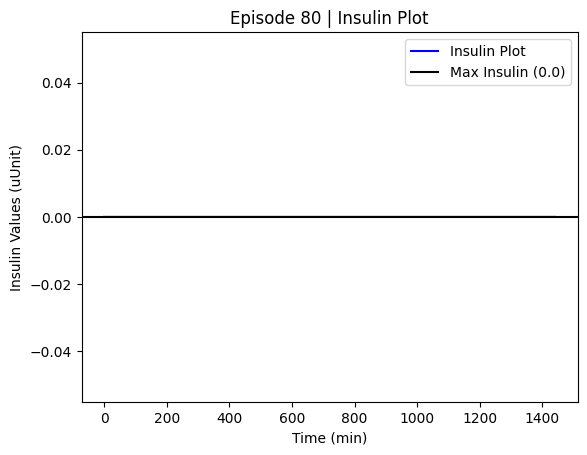

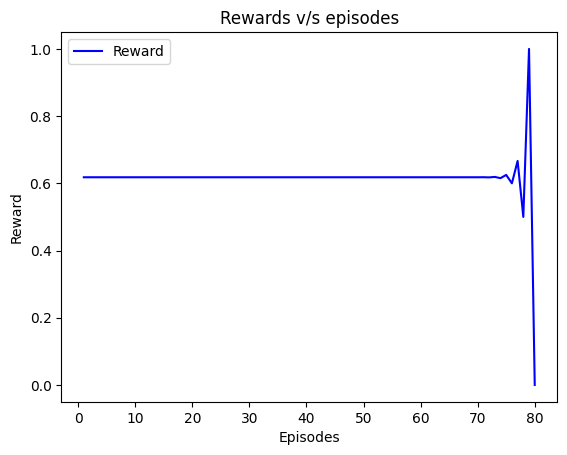

249 -> 4:09 (84g Carbs)
375 -> 6:15 (102g Carbs)
661 -> 11:01 (63g Carbs)
699 -> 11:39 (74g Carbs)
785 -> 13:05 (104g Carbs)

Episode: 81 | Score (H<): 2,121,802,708,834.814 | Max Time: 1441 | Max Glucose Level: 481.606 | Avg Insulin Given: 0.0 | Carb / Insulin: 10426.0


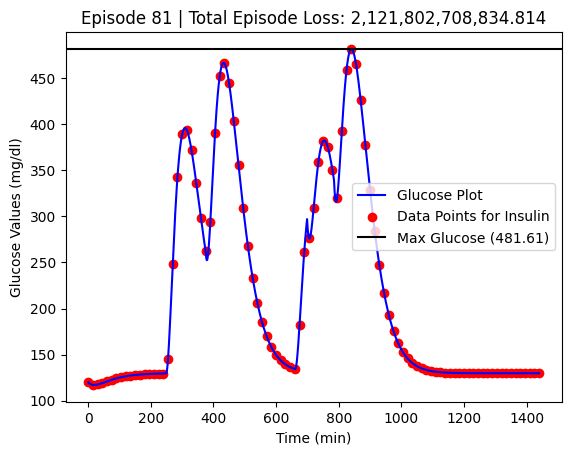

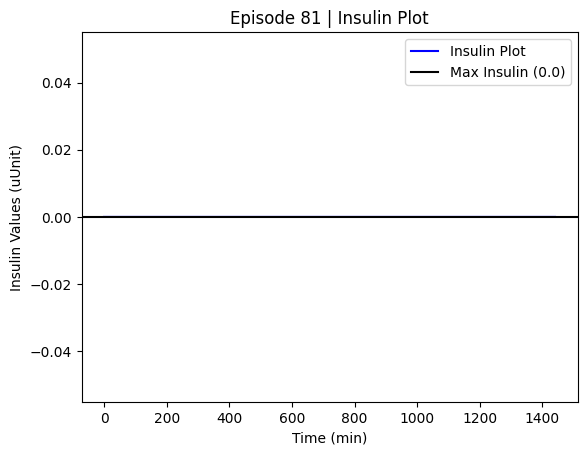

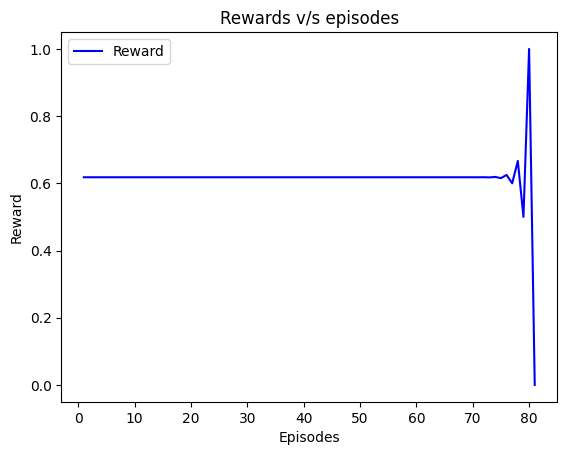

205 -> 3:25 (81g Carbs)
287 -> 4:47 (89g Carbs)
1062 -> 17:42 (38g Carbs)

Episode: 82 | Score (H<): 477,124,697,177.579 | Max Time: 1441 | Max Glucose Level: 403.688 | Avg Insulin Given: 0.0 | Carb / Insulin: 10207.0


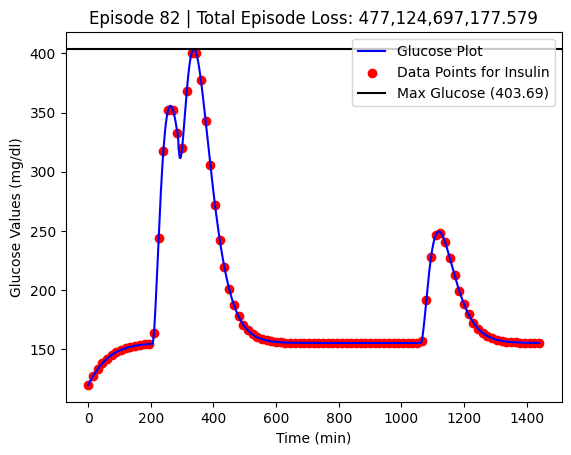

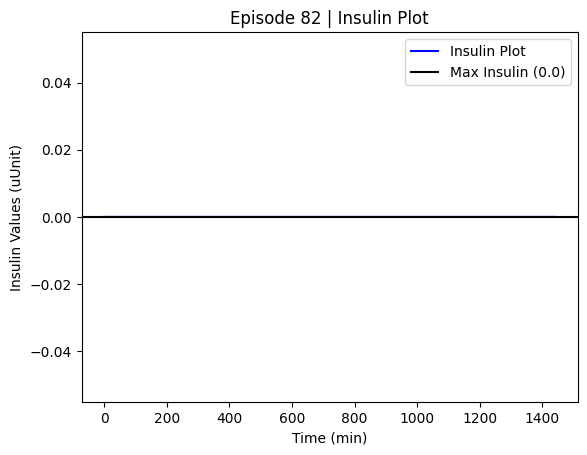

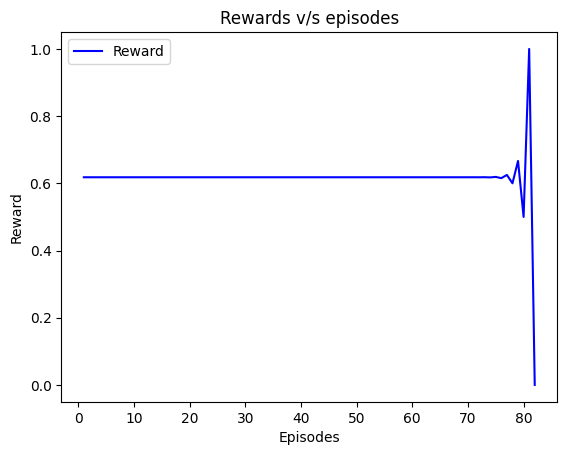

397 -> 6:37 (29g Carbs)
581 -> 9:41 (32g Carbs)
652 -> 10:52 (79g Carbs)
870 -> 14:30 (30g Carbs)
998 -> 16:38 (116g Carbs)

Episode: 83 | Score (H<): 792,860,645,281.6764 | Max Time: 1441 | Max Glucose Level: 442.881 | Avg Insulin Given: 0.0 | Carb / Insulin: 10285.0


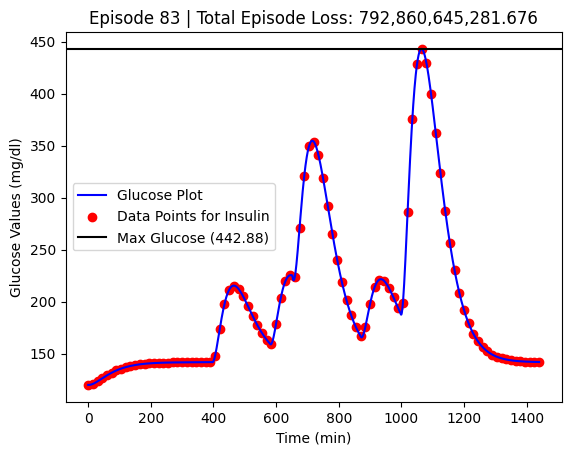

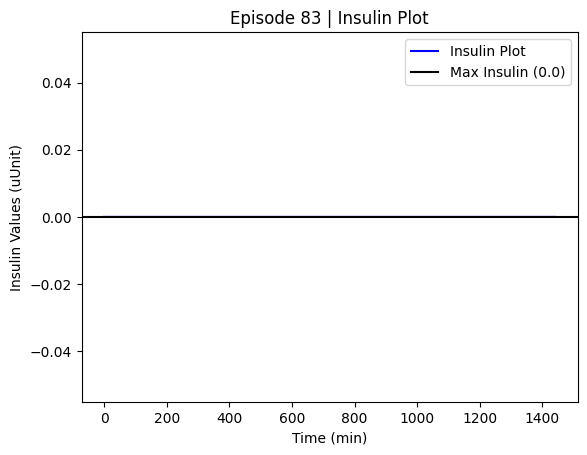

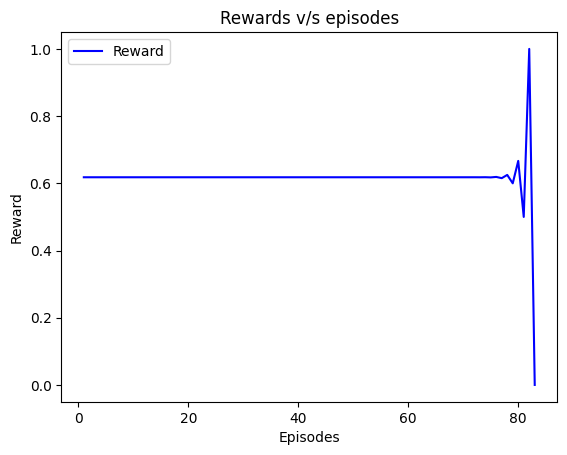

242 -> 4:02 (100g Carbs)
611 -> 10:11 (18g Carbs)

Episode: 84 | Score (H<): 378,025,117,008.56494 | Max Time: 1441 | Max Glucose Level: 403.138 | Avg Insulin Given: 0.0 | Carb / Insulin: 10117.0


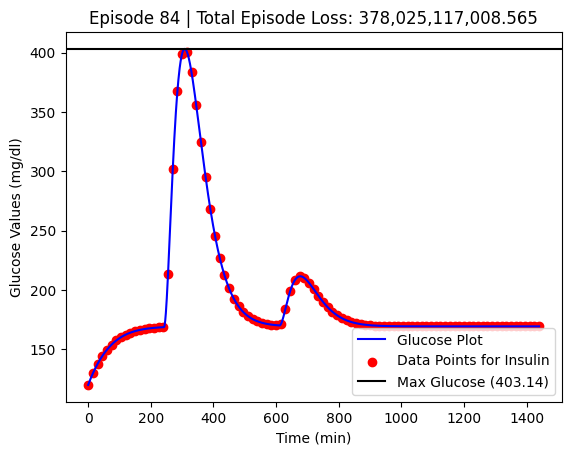

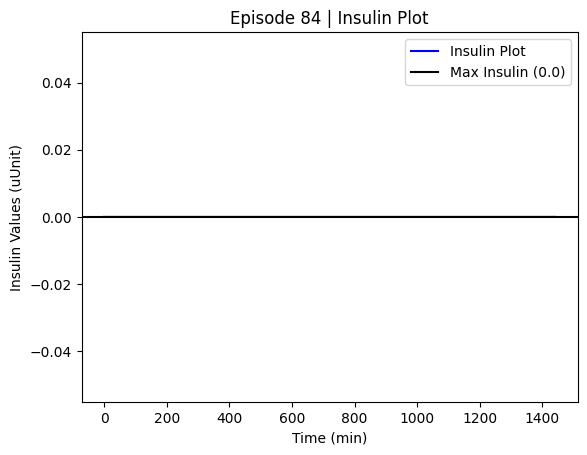

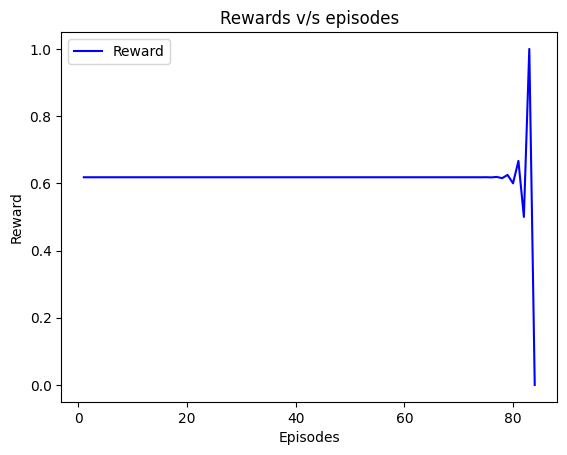

600 -> 10:00 (83g Carbs)
769 -> 12:49 (10g Carbs)



KeyboardInterrupt: 

In [ ]:
train_env(model, episodes = 100, show_work = 1, artif_epoch = 50)